## Before We Start

As described in the dissertation, each iteration is unique, and due to the inherent randomness of the model, the **results will vary**. However, the type of analysis and underlying logic remain valid, even if the exact results differ from those shown here.


In [16]:
#import warnings
import numpy as np
import pandas as pd
import sklearn.preprocessing as preprocessing

import torch
import torch.nn as nn 
import torch.optim as optim
import torch.nn.functional as F

import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import classification_report
from typing import List


## Data Processing

This function handles the full data pipeline: loading, cleaning, merging, ratio construction, imputation, encoding, and discretization.

We call `giga_func_2(t1, t2, t3, drop_cols=[])`, where:
- `t1`, `t2`, and `t3` define the train, validation, and test year thresholds.
- `drop_cols` allows columns to be removed, useful for ablation studies.

Internally, it:
- Merges monthly security data with annual fundamental data.
- Constructs financial ratios and past/future return variables.
- Applies industry/country-level imputation (fit on train only).
- Label-encodes categorical variables.
- Discretizes all ratio features into 10 bins and the target into 3.
- Returns clean, integer-encoded datasets ready for modeling.

Only columns ending in `_buckets` and the label (`return_12m_forward_label`) are used as Transformer inputs.


In [17]:
def giga_func_2(t1, t2, t3, drop_cols=[]):
    #Load data
    funds = pd.read_csv("./compustat/funds.csv", index_col=0)
    secs = pd.read_csv("./compustat/securities.csv", index_col=0, low_memory=False)
    print(funds.shape)
    print(secs.shape)
    
    # Initial cleanup, drop things are not need
    funds.drop(columns=["datafmt", "indfmt", "consol", "xrd"], inplace=True)
    secs.drop(columns=["isalrt"], inplace=True)
    
    # Check for missing data
    for i in range(18):
        print(f"Rows with threshold = {i} : {(funds.isna().sum(axis=1) <= i).sum()}")

    ################################################################################
    # Apply threshold based row filtering (before imputation) and drop rows with missing required columns.
    print(len(funds.columns))
    n_impute_rows = 12
    n_required_cols = len(funds.columns) - n_impute_rows
    funds.dropna(thresh=n_required_cols, inplace=True)
    
    required_cols = ["fic", "costat", "gvkey", "datadate", "gsector", "sedol"]
    funds.dropna(subset=required_cols, inplace=True)
    ################################################################################
    # Convert dates and create time features both secs.csv and funds.csv
    funds["datadate"] = pd.to_datetime(funds["datadate"])
    funds["year"] = funds["datadate"].dt.year
    funds["month"] = funds["datadate"].dt.month
    
    secs["datadate"] = pd.to_datetime(secs["datadate"])
    secs["year"] = secs["datadate"].dt.year
    secs["month"] = secs["datadate"].dt.month
    
    # Filter securities to only those in funds
    secs_keep = secs[secs.sedol.isin(funds.sedol.unique())]
    unique_sedols = funds["sedol"].unique()
    
    # Create full date range and reindex
    full_dates = pd.date_range(
        start=funds["datadate"].min(),
        end=funds["datadate"].max(),
        freq="ME"
    )
    
    multi_index = pd.MultiIndex.from_product(
        [unique_sedols, full_dates],
        names=["sedol", "datadate"]
    )
    
    secs_keep = secs_keep.set_index(["sedol", "datadate"]).reindex(multi_index)
    secs_keep = secs_keep.reset_index()
    secs_keep["year"] = secs_keep["datadate"].dt.year
    secs_keep["month"] = secs_keep["datadate"].dt.month
    ################################################################################
    # Forward/backward fill some securities columns
    secs_keep[["fic", "gvkey", "tpci"]] = secs_keep.groupby("sedol")[["fic", "gvkey", "tpci"]].ffill().bfill()
    
    # Create Effective Date Variable
    earnings_offset_months = 3
    funds["effective_date"] = funds["datadate"] + pd.DateOffset(months=earnings_offset_months)

    # Create return features (Special)
    secs_keep["return_12m_forward"] = (secs_keep.groupby("sedol").prccm.shift(-12) - secs_keep.prccm) / secs_keep.prccm
    secs_keep["past_12m_return"] = (secs_keep.prccm - secs_keep.groupby("sedol").prccm.shift(12)) / secs_keep.groupby("sedol").prccm.shift(12)
    secs_keep["momentum"] = (secs_keep.groupby("sedol").prccm.shift(1) - secs_keep.groupby("sedol").prccm.shift(12)) / secs_keep.groupby("sedol").prccm.shift(12)
    ################################################################################
    # Merge datasets
    merged_df = pd.merge(funds,
                         secs_keep[["sedol", "datadate", "prccm", "dvpsxm", "cshtrm", "return_12m_forward", "past_12m_return", "momentum"]],
                         left_on=["sedol", "effective_date"],
                         right_on=["sedol", "datadate"],
                         how="left")
    merged_df.dropna(inplace=True)
    merged_df.rename(columns={"datadate_x": "fundamental_date",
                              "datadate_y": "security_date"}, inplace=True)
    ################################################################################
    # Calculate market cap and create ratios
    merged_df["market_cap"] = merged_df["prccm"] * merged_df["cshoi"]
    ratios_df = pd.DataFrame({
        # Fundamental Information
        "country_code": merged_df["fic"],
        "industry": merged_df["gsector"],
        "year": merged_df["year"],
        'global_company_key': merged_df["gvkey"],
        
        # Valuation Ratios
        "book_to_market": merged_df["ceq"] / merged_df["market_cap"],
        "earnings_to_price": merged_df["nicon"] / merged_df["market_cap"],
        "sales_to_price": merged_df["revt"] / merged_df["market_cap"],
    
        # Profitability Ratios
        "return_on_assets": merged_df["nicon"] / merged_df["at"],
        "return_on_equity": merged_df["nicon"] / merged_df["ceq"],
        "gross_margin": (merged_df["revt"] - merged_df["cogs"]) / merged_df["revt"],
        "operating_margin": merged_df["oiadp"] / merged_df["revt"],
        "ebitda_margin": merged_df["ebitda"] / merged_df["revt"],
        "net_profit_margin": merged_df["nicon"] / merged_df["revt"],
        "roce": merged_df["ebit"] / (merged_df["at"] - merged_df["lct"]),
    
        # Liquidity Ratios
        "current_ratio": merged_df["act"] / merged_df["lct"],
        "quick_ratio": (merged_df["act"] - merged_df["invt"]) / merged_df["lct"],
        "cash_ratio": merged_df["che"] / merged_df["lct"],
    
        # Efficiency and Activity Ratios
        "asset_turnover": merged_df["revt"] / merged_df["at"],
        "inventory_turnover": merged_df["cogs"] / merged_df["invt"],
        "receivables_turnover": merged_df["revt"] / merged_df["rect"],
        "sg&a_to_sales": merged_df["xsga"] / merged_df["revt"],
        "capex_to_sales": merged_df["capx"] / merged_df["revt"],
        "capex_to_assets": merged_df["capx"] / merged_df["at"],
    
        # Per Share Metrics
        "revenue_per_share": merged_df["revt"] / merged_df["cshoi"],
        "net_income_per_share": merged_df["nicon"] / merged_df["cshoi"],
        "cash_flow_per_share": merged_df["oancf"] / merged_df["cshoi"],
        "capex_per_share": merged_df["capx"] / merged_df["cshoi"],
    
        # Other Metrics
        "free_cash_flow_yield": (merged_df["oancf"] - merged_df["capx"]) / merged_df["market_cap"],
        "noa_ratio": (merged_df["at"] - merged_df["che"] - (merged_df["at"] - merged_df["ceq"])) / merged_df["at"],
        "accruals_ratio": (merged_df["nicon"] - merged_df["oancf"]) / merged_df["at"],
        "sg&a_to_assets": merged_df["xsga"] / merged_df["at"],
        "cash_to_assets": merged_df["che"] / merged_df["at"],
        "inventory_to_assets": merged_df["invt"] / merged_df["at"],
        "cashflow_return_on_assets": merged_df["oancf"] / merged_df["at"],
        "capex_to_cashflow": merged_df["capx"] / merged_df["oancf"],
    
        # Past Returns and Momentum
        "past_12m_return": merged_df["past_12m_return"],
        "momentum": merged_df["momentum"],
    
        # Target Variable
        "return_12m_forward": merged_df["return_12m_forward"]
    })
    
    print(f"Initial ratios_df shape: {ratios_df.shape}")
    
    # Clean infinite values
    ratios_df = ratios_df.replace([np.inf, -np.inf], np.nan)
    ratios_df.industry = ratios_df.industry.astype(int)
    ################################################################################
    # Define feature categories
    required_features = ["country_code", "industry", "year", "global_company_key"]
    label_feature = ["return_12m_forward"]
    ratio_features = [col for col in ratios_df.columns if col not in required_features and col not in label_feature]
    non_required_cols = [col for col in ratio_features]  
    ################################################################################
    # Split the data BEFORE any imputation to avoid Data Leakage
    train_ratios = ratios_df[ratios_df.year < t1].copy()
    val_ratios = ratios_df[ratios_df.year.between(t1, t2)].copy() 
    if t3 > 2024:
        test_ratios = pd.DataFrame()
    else:
        test_ratios = ratios_df[(ratios_df.year > t2) & (ratios_df.year <= t3)].copy()
    ################################################################################
    print(f"Before imputation - Train: {train_ratios.shape}, Val: {val_ratios.shape}, Test: {test_ratios.shape}")
    # Calculate imputation values only from training data
    imputation_values = {}
    for col in non_required_cols:
        imputation_values[col] = train_ratios.groupby(["industry", "country_code"])[col].median()
    
    # Apply imputation to each split separately using training derived values
    def apply_imputation(df, imputation_values, non_required_cols):
        df_imputed = df.copy()
        for col in non_required_cols:
            # Create a temporary series with the mapped values
            mapped_values = df_imputed.set_index(["industry", "country_code"]).index.map(imputation_values[col])
            mapped_series = pd.Series(mapped_values, index=df_imputed.index)
            
            # Fill NaN values using the mapped series
            df_imputed[col] = df_imputed[col].fillna(mapped_series)
            
            # For any remaining NaNs (new industry/country combinations), use overall training median
            if df_imputed[col].isna().any():
                overall_median = imputation_values[col].median()
                df_imputed[col] = df_imputed[col].fillna(overall_median)
        return df_imputed
    
    # Apply imputation
    train_ratios = apply_imputation(train_ratios, imputation_values, non_required_cols)
    val_ratios = apply_imputation(val_ratios, imputation_values, non_required_cols)
    if not test_ratios.empty:
        test_ratios = apply_imputation(test_ratios, imputation_values, non_required_cols)
    ################################################################################
    # Drop any remaining rows with NaN values
    train_ratios.dropna(inplace=True)
    val_ratios.dropna(inplace=True)
    if not test_ratios.empty:
        test_ratios.dropna(inplace=True)
    
    print(f"After imputation - Train: {train_ratios.shape}, Val: {val_ratios.shape}, Test: {test_ratios.shape}")
    print(f"Training Dataset: {(train_ratios.shape[0] / ratios_df.shape[0]*100):.2f}%")
    print(f"Validation Dataset: {(val_ratios.shape[0] / ratios_df.shape[0]*100):.2f}%") 
    print(f"Test Dataset: {(test_ratios.shape[0] / ratios_df.shape[0]*100):.2f}%")
    
    # Encode categorical variables (fit on train, transform on all)
    country_encoder = preprocessing.LabelEncoder()
    industry_encoder = preprocessing.LabelEncoder()
    
    # Fit encoders on training data only
    train_ratios.country_code = country_encoder.fit_transform(train_ratios.country_code)
    val_ratios.country_code = country_encoder.transform(val_ratios.country_code)
    if not test_ratios.empty:
        test_ratios.country_code = country_encoder.transform(test_ratios.country_code)
    
    train_ratios.industry = industry_encoder.fit_transform(train_ratios.industry)
    val_ratios.industry = industry_encoder.transform(val_ratios.industry)
    if not test_ratios.empty:
        test_ratios.industry = industry_encoder.transform(test_ratios.industry)
    ################################################################################
    # Discretization (fit on train, transform on all)
    bucket_transformer = preprocessing.KBinsDiscretizer(n_bins=10, encode="ordinal", strategy="quantile")
    label_transformer = preprocessing.KBinsDiscretizer(n_bins=3, encode="ordinal", strategy="quantile")
    
    # Bucket features
    bucket_cols = [f"{c}_buckets" for c in ratio_features]
    train_ratios[bucket_cols] = bucket_transformer.fit_transform(train_ratios[ratio_features])
    val_ratios[bucket_cols] = bucket_transformer.transform(val_ratios[ratio_features])
    if not test_ratios.empty:
        test_ratios[bucket_cols] = bucket_transformer.transform(test_ratios[ratio_features])
    
    # Bucket labels
    bucket_label = [f"{c}_label" for c in label_feature]
    train_ratios[bucket_label] = label_transformer.fit_transform(train_ratios[label_feature])
    for feature_name, edges in zip(label_feature, label_transformer.bin_edges_):
        print(f"{feature_name} bin ranges:")
        for i in range(len(edges) - 1):
            print(f"  Bin {i}: {edges[i]:.4f} to {edges[i+1]:.4f}")
        print()
    
    val_ratios[bucket_label] = label_transformer.transform(val_ratios[label_feature])
    if not test_ratios.empty:
        test_ratios[bucket_label] = label_transformer.transform(test_ratios[label_feature])
    ################################################################################
    # Convert to int
    train_ratios = train_ratios.astype("int")
    val_ratios = val_ratios.astype("int") 
    if not test_ratios.empty:
        test_ratios = test_ratios.astype("int")
    
    # Rename year column
    train_ratios.rename(columns={'year': 'year_'}, inplace=True)
    val_ratios.rename(columns={'year': 'year_'}, inplace=True)
    if not test_ratios.empty:
        test_ratios.rename(columns={'year': 'year_'}, inplace=True)
    
    # Drop specified columns
    if drop_cols != []:
        print("HERRRRRRRRRRRRRRRRRRRRRRRRRRRRRRRREREERE")
        print(f'Before dropping any columns we have:  {len(train_ratios.columns)}')
        train_ratios.drop(columns=[col for col in drop_cols if col in train_ratios.columns], inplace=True)
        val_ratios.drop(columns=[col for col in drop_cols if col in val_ratios.columns], inplace=True)
        if not test_ratios.empty:
            test_ratios.drop(columns=[col for col in drop_cols if col in test_ratios.columns], inplace=True)
        print(f'After dropping columns we have:  {len(train_ratios.columns)}')
    # Display results
    display(train_ratios.head(5))
    display(val_ratios.head(5))
    if not test_ratios.empty:
        display(test_ratios.head(5))
    ################################################################################
    # Final prints 
    print(f"Final shapes - Train: {train_ratios.shape}, Val: {val_ratios.shape}, Test: {test_ratios.shape}")
    print(f"Training years: {sorted(train_ratios['year_'].unique().tolist())}")
    print(f"Validation years: {sorted(val_ratios['year_'].unique().tolist())}")
    if not test_ratios.empty:
        print(f"Test years: {sorted(test_ratios['year_'].unique().tolist())}")

    print("Class distribution in Train set:")
    print(train_ratios['return_12m_forward_label'].value_counts().sort_index())
    
    print("\nClass distribution in Validation set:")
    print(val_ratios['return_12m_forward_label'].value_counts().sort_index())
    
    if not test_ratios.empty:
        print("\nClass distribution in Test set:")
        print(test_ratios['return_12m_forward_label'].value_counts().sort_index())
    
    return train_ratios, val_ratios, test_ratios

In [18]:
train,val,test = giga_func_2(2020,2021,2024)

(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
After imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
Training Dataset: 70.32%
Validation Dataset: 14.11%
Test Dataset: 15.57%
return_12m_forward bin ranges:
  Bin 0: -0.9992 to -0.1921
  Bin 1: -0.1921 to 0.1374
  Bin 2: 0.1374 to

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,7,1,0,1,1,7,5,9,9,1
25,14,1,2021,1855,1,0,0,0,0,0,...,8,3,0,1,2,7,3,6,6,0
50,14,1,2020,2162,5,0,1,0,0,0,...,8,7,3,2,2,3,3,9,9,2
51,14,1,2021,2162,2,0,1,0,0,0,...,8,7,6,5,2,8,2,9,9,0
152,12,2,2020,7041,0,0,0,0,0,0,...,7,1,7,6,7,7,2,9,9,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,8,2,0,1,1,7,4,1,1,1
27,14,1,2023,1855,3,0,1,0,0,0,...,9,3,0,1,1,5,6,4,3,2
52,14,1,2022,2162,4,0,2,0,0,0,...,8,7,6,7,2,8,2,2,2,1
53,14,1,2023,2162,5,0,1,0,0,0,...,8,6,5,7,2,4,3,4,4,1
154,12,2,2022,7041,0,0,2,0,0,0,...,2,9,6,3,4,0,1,4,4,1


Final shapes - Train: (113262, 72), Val: (22730, 72), Test: (25080, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020, 2021]
Test years: [2022, 2023, 2024]
Class distribution in Train set:
return_12m_forward_label
0    37754
1    37754
2    37754
Name: count, dtype: int64

Class distribution in Validation set:
return_12m_forward_label
0    5264
1    8874
2    8592
Name: count, dtype: int64

Class distribution in Test set:
return_12m_forward_label
0    6794
1    9680
2    8606
Name: count, dtype: int64


In [19]:
# train.to_csv('train_data_andreas.csv', index=False)
# val.to_csv('val_data_andreas.csv', index=False)
# #test_df = pd.DataFrame()
# test.to_csv('test_data_andreas.csv', index=False)

In [20]:
display(train.head())
print(train['year_'].unique())
print(val['year_'].unique())
print(test['year_'].unique())

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,2


[2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019]
[2020 2021]
[2022 2023 2024]


# XGBoost Model

This cell fits an XGBoost classifier using the discretized ratio features (`*_buckets`) to predict the 12-month forward return label (`return_12m_forward_label`).

- We concatenate the training and validation sets to form a cross validation set.
- Class imbalance is addressed using `class_weight="balanced"` to compute sample weights based on the training set. This ensures fair treatment of each class during training. 
- A grid search is performed over `learning_rate`, `n_estimators`, and `max_depth`.
- The best model is then evaluated on the test set, with detailed accuracy, precision, and recall reported.
- A confusion matrix is printed to show full prediction breakdown.


In [6]:
import numpy as np
import pandas as pd
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from xgboost import XGBClassifier



# Store the ratio cols and the target cols seperetly
bucket_cols = [c for c in train.columns if c.endswith('_buckets')]
target_col  = "return_12m_forward_label"

# Split to train val and test
X_train, y_train = train[bucket_cols], train[target_col]
X_val,   y_val   = val  [bucket_cols], val  [target_col]
X_test,  y_test  = test [bucket_cols], test [target_col]

X_cv = pd.concat([X_train, X_val])
y_cv = pd.concat([y_train,  y_val])

# Assume balance class weigths 
classes     = np.array([0, 1, 2])
cls_weights = compute_class_weight(class_weight="balanced",
                                   classes=classes,
                                   y=y_train)
w_map = dict(zip(classes, cls_weights))
sample_w_cv = y_cv.map(w_map)

# Set up XGboost
xgb_base = XGBClassifier(
    objective   = "multi:softprob",
    eval_metric = "mlogloss",
    num_class   = 3,
    tree_method = "hist",
    enable_categorical=True,
    random_state= 42
)
# Define Param Grid 
param_grid = {
    "learning_rate":   [0.05, 0.1],
    "n_estimators":    [300, 500],
    "max_depth":       [3, 5]
}

# Define GridSearch
gs = GridSearchCV(
    estimator = xgb_base,
    param_grid= param_grid,
    scoring   = "accuracy",
    cv        = 3,
    n_jobs    = -1,
    verbose   = 1
)

gs.fit(X_cv, y_cv, sample_weight=sample_w_cv)

print("Best params :", gs.best_params_)
print(f"CV accuracy : {gs.best_score_:.4f}")

# Fit on train and Val
best = gs.best_estimator_
best.fit(X_cv, y_cv, sample_weight=sample_w_cv)

# Define Prediction 
y_pred = best.predict(X_test)
print(f"\nRandom baseline: {1/3:.1%}")
print(f"Test accuracy  : {accuracy_score(y_test, y_pred):.1%}\n")
print(classification_report(y_test, y_pred, digits=3))

from sklearn.metrics import precision_score, recall_score, confusion_matrix

# Focus on bucket 2 Performance 
high_bucket = 2

y_test_high = (y_test == high_bucket)        
y_pred_high = (y_pred == high_bucket)

# overall accuracy just for the high‑bucket flag
accuracy_high = (y_test_high == y_pred_high).mean()

# sklearn binary precision / recall (pos_label=True == 1)
precision_high = precision_score(y_test_high, y_pred_high, zero_division=0)
recall_high    = recall_score   (y_test_high, y_pred_high, zero_division=0)

print(f"\nHigh‑Return Bucket ({high_bucket}) performance")
print(f"Accuracy : {accuracy_high:.2%}")
print(f"Precision: {precision_high:.2%}")
print(f"Recall   : {recall_high:.2%}")

# Print Confusion matrix 
cm = confusion_matrix(y_test, y_pred, labels=[0,1,2])
print("\nConfusion matrix (rows = true, cols = pred):")
print(cm)
print(f"\nActual high returns predicted correctly: {cm[2,2]} / {cm[2,:].sum()}")


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best params : {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 500}
CV accuracy : 0.4234

Random baseline: 33.3%
Test accuracy  : 42.1%

              precision    recall  f1-score   support

           0      0.371     0.420     0.394      6794
           1      0.459     0.564     0.506      9680
           2      0.406     0.259     0.317      8606

    accuracy                          0.421     25080
   macro avg      0.412     0.415     0.406     25080
weighted avg      0.417     0.421     0.411     25080


High‑Return Bucket (2) performance
Accuracy : 61.59%
Precision: 40.65%
Recall   : 25.94%

Confusion matrix (rows = true, cols = pred):
[[2855 2575 1364]
 [2323 5462 1895]
 [2518 3856 2232]]

Actual high returns predicted correctly: 2232 / 8606


## SHAP Scores for XGBoost 

(25080, 33, 3)


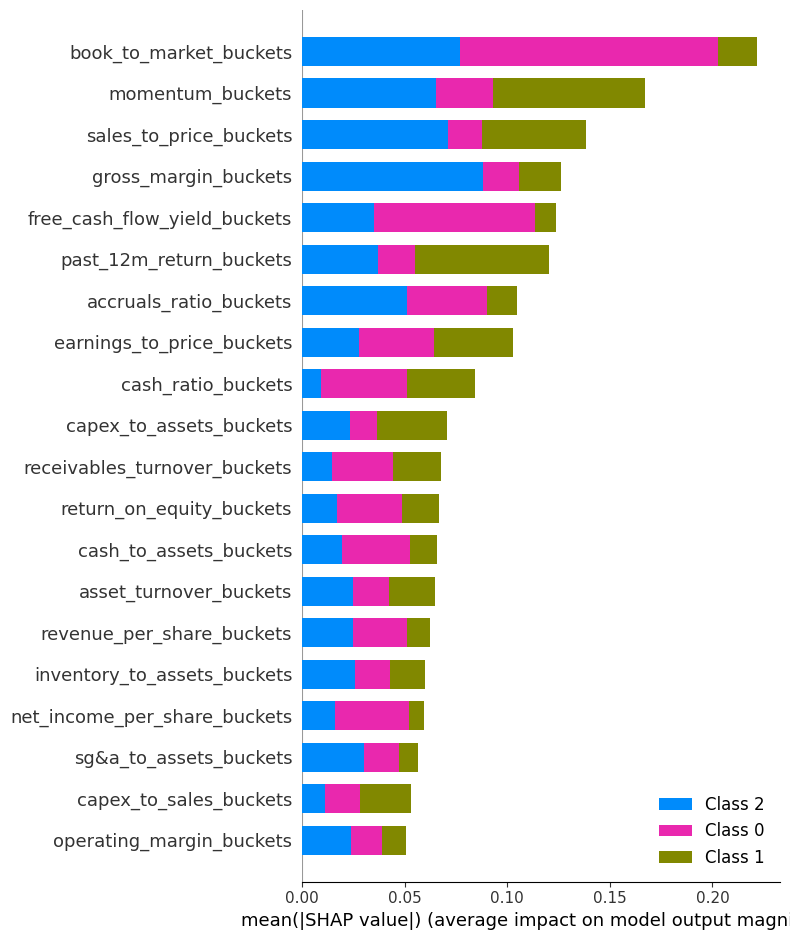

In [7]:
import shap
# Initilise SHAP
shap.initjs()
#y_pred = XGB_grid_search.predict(X_test)
best_xgb = gs.best_estimator_  

# Input the XGBoost Prediction and Evaluate the SHAP scores
explainer = shap.Explainer(best_xgb)
shap_val = explainer(X_test)
print(np.shape(shap_val))
shap.summary_plot(shap_val, bucket_cols, plot_type="bar")

In [8]:
import numpy as np
import pandas as pd
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

# Store the ratio cols and the target cols separately
bucket_cols = [c for c in train.columns if c.endswith('_buckets')]
target_col  = "return_12m_forward_label"

# Split to train val and test
X_train, y_train = train[bucket_cols], train[target_col]
X_val,   y_val   = val  [bucket_cols], val  [target_col]
X_test,  y_test  = test [bucket_cols], test [target_col]

X_cv = pd.concat([X_train, X_val])
y_cv = pd.concat([y_train,  y_val])

# Compute class weights
classes     = np.array([0, 1, 2])
cls_weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
w_map = dict(zip(classes, cls_weights))
sample_w_cv = y_cv.map(w_map)

# Set up Random Forest
rf_base = RandomForestClassifier(
    class_weight="balanced",
    random_state=42
)

# Define Param Grid 
param_grid = {
    "n_estimators": [100, 300],
    "max_depth":    [None, 10, 20],
    "min_samples_split": [2, 5]
}

# Define GridSearch
gs = GridSearchCV(
    estimator = rf_base,
    param_grid= param_grid,
    scoring   = "accuracy",
    cv        = 3,
    n_jobs    = -1,
    verbose   = 1
)

gs.fit(X_cv, y_cv, sample_weight=sample_w_cv)

print("Best params :", gs.best_params_)
print(f"CV accuracy : {gs.best_score_:.4f}")

# Fit on train and val
best = gs.best_estimator_
best.fit(X_cv, y_cv, sample_weight=sample_w_cv)

# Define Prediction 
y_pred = best.predict(X_test)
print(f"\nRandom baseline: {1/3:.1%}")
print(f"Test accuracy  : {accuracy_score(y_test, y_pred):.1%}\n")
print(classification_report(y_test, y_pred, digits=3))

# Focus on bucket 2 Performance 
high_bucket = 2

y_test_high = (y_test == high_bucket)        
y_pred_high = (y_pred == high_bucket)

accuracy_high = (y_test_high == y_pred_high).mean()
precision_high = precision_score(y_test_high, y_pred_high, zero_division=0)
recall_high    = recall_score(y_test_high, y_pred_high, zero_division=0)

print(f"\nHigh‑Return Bucket ({high_bucket}) performance")
print(f"Accuracy : {accuracy_high:.2%}")
print(f"Precision: {precision_high:.2%}")
print(f"Recall   : {recall_high:.2%}")

# Confusion matrix 
cm = confusion_matrix(y_test, y_pred, labels=[0,1,2])
print("\nConfusion matrix (rows = true, cols = pred):")
print(cm)
print(f"\nActual high returns predicted correctly: {cm[2,2]} / {cm[2,:].sum()}")


Fitting 3 folds for each of 12 candidates, totalling 36 fits


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best params : {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 300}
CV accuracy : 0.4161

Random baseline: 33.3%
Test accuracy  : 41.2%

              precision    recall  f1-score   support

           0      0.363     0.491     0.417      6794
           1      0.457     0.529     0.490      9680
           2      0.399     0.217     0.281      8606

    accuracy                          0.412     25080
   macro avg      0.406     0.412     0.396     25080
weighted avg      0.412     0.412     0.399     25080


High‑Return Bucket (2) performance
Accuracy : 61.94%
Precision: 39.94%
Recall   : 21.69%

Confusion matrix (rows = true, cols = pred):
[[3338 2314 1142]
 [2895 5120 1665]
 [2970 3769 1867]]

Actual high returns predicted correctly: 1867 / 8606


In [9]:
# import shap
# # Initilise SHAP
# shap.initjs()
# best_xgb = gs.best_estimator_  

# # Input the Random forest Prediction and Evaluate the SHAP scores
# explainer = shap.Explainer(best_xgb)
# shap_val = explainer(X_test)
# print(np.shape(shap_val))
# shap.summary_plot(shap_val, bucket_cols, plot_type="bar")

# Transformer Model

In [21]:
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
import optuna
import copy
from torch.utils.data import Dataset, DataLoader
#from tqdm.notebook import tqdm
import sklearn
from tqdm import tqdm
import random
from torch.optim.lr_scheduler import StepLR
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix, classification_report
#from torchmetrics.classification import FocalLoss

In [22]:
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

## FinacialDataset
The `FinancialDataset` class prepares the input data for the Transformer model. It extracts all features ending in `_buckets` (excluding the label) and `_was_imputed`, combining them into the model input. The target is `return_12m_forward_label`.

In addition to features and targets, it also stores metadata used for embedding layers, including:
- `year_`
- `fake_stock_id_meta`
- `industry_id_meta`
- `industry_format_id_meta`
- `country_id_meta`

This setup ensures each sample returns all necessary inputs for the model, supporting both learning from ratios and capturing entity-level and temporal context.
**Note:** The metadata variables (e.g., `industry_id_meta`, `country_id_meta`) were ultimately excluded from the final Transformer model. Although they occasionally improved performance during training, they often distracted the model from learning meaningful patterns in the ratio features. As a result, the model's interpretability and focus on financial signals were reduced.

In [23]:
class FinancialDataset(Dataset):
    def __init__(self,data):
        bucket_cols = []
        impute_cols = []
        for col in data.columns:
            if col.endswith('_buckets') and col != 'return_12m_forward_label':
                bucket_cols.append(col)
        for col in data.columns:
            if col.endswith('_was_imputed') and col != 'return_12m_forward_label':
                impute_cols.append(col)

        all_features = bucket_cols + impute_cols
        
        # Define Features
        self.features = torch.LongTensor(data[all_features].values)
        # Define targets 
        self.target = torch.LongTensor(data['return_12m_forward_label'].values)
        #print()

        # All current Embeddings
        self.years = torch.LongTensor(data['year_'].values)
        self.fake_stock_id = torch.LongTensor(data['fake_stock_id_meta'].values)
        self.industry = torch.LongTensor(data['industry_id_meta'].values)
        self.industry_format = torch.LongTensor(data['industry_format_id_meta'].values)
        self.country = torch.LongTensor(data['country_id_meta'].values)

        self.feature_names = all_features
        self.ratio_names = bucket_cols
        self.impute_names = impute_cols
        self.n_features = len(all_features)
        self.n_ratios = len(bucket_cols)
        self.n_imputes = len(impute_cols)
    
    def __len__(self):
        return len(self.features)

    def __getitem__(self,i):
        return {
            'features' : self.features[i],
            'target' : self.target[i],
            'year': self.years[i],
            'fake_stock_id': self.fake_stock_id[i],
            'industry':self.industry[i],
            'industry_format':self.industry_format[i],
            'country': self.country[i]
        }

### BucketTransformer Model

This class implements a flexible Transformer-based architecture for tabular financial data. It takes as input bucketized ratio features and optionally includes several types of metadata embeddings (e.g., time, stock ID, industry, etc.).

**Key components:**
- **Ratio embeddings**: Each bucketized financial ratio is embedded using its own embedding layer.
- **Optional embeddings**: Time, stock ID, industry, industry format, and country embeddings can be toggled via flags. These are set to `False` by default, as they did not improve performance in our testing. However, they are left in for experimentation.
- **Imputation indicator embeddings**: Optionally embed whether a feature was imputed (also disabled by default).
- **Transformer encoder**: Uses `nn.TransformerEncoder` to process the stacked embeddings.
- **Pooling**: A learned softmax-weighted average across the embedding sequence is used to aggregate the representation.
- **Classifier**: A simple feedforward neural network maps the pooled vector to class logits. Multiple classifier variants are included (commented out) for experimentation.


In [24]:
class BucketTransformer_mine(nn.Module):
    def __init__(self,
                 bucket_sizes, 
                 embedding_dim, 
                 n_heads,
                 n_layers,
                 dropout_transformer,
                 number_of_classes, 
                 dropout_classifier, 
                 num_years,
                 num_of_stock, 
                 num_of_industry, 
                 num_of_industry_format,
                 num_of_country,
                 ratio_cols, 
                 impute_cols,
                 start_year, 
                 end_year,
                 activation,
                 use_impute_embeddings = False,
                 use_time_embeddings= False,
                 use_stock_embeddings= False,
                 use_industry_embeddings= False,
                 use_industry_format_embeddings= False,
                 use_country_embeddings= False
                ):
        super(BucketTransformer_mine, self).__init__()
        # Save which embeddings to use
        self.use_impute_embeddings = use_impute_embeddings
        self.use_time_embeddings = use_time_embeddings
        self.use_stock_embeddings = use_stock_embeddings
        self.use_industry_embeddings = use_industry_embeddings
        self.use_industry_format_embeddings = use_industry_format_embeddings
        self.use_country_embeddings = use_country_embeddings

         # Initialize pooling weights for weighted aggregation
        self.bucket_size = bucket_sizes
        self.pooling_weights = nn.Parameter(torch.ones(len(bucket_sizes) + (use_impute_embeddings + 
                                                                            use_time_embeddings + 
                                                                            use_stock_embeddings + 
                                                                            use_industry_embeddings + 
                                                                            use_industry_format_embeddings +
                                                                            use_country_embeddings)))  
        self.pooling_weights = nn.Parameter(torch.ones(len(bucket_sizes))) 

        # Ratio bucket embeddings (12 to allow for special tokens)
        self.ratio_embeddings = nn.ModuleList([
            nn.Embedding(12, embedding_dim) for _ in ratio_cols # 12 instead of 11 for masking purposes later
        ])
        # All optional embeddings
        if use_impute_embeddings:
            self.impute_embeddings = nn.ModuleList([
                nn.Embedding(3, embedding_dim) for _ in impute_cols
            ])
        else:
            self.impute_embeddings = None
        if use_time_embeddings:
            self.num_years = end_year - start_year + 1
            self.start_year = start_year
            self.time_embedding = nn.Embedding(self.num_years, embedding_dim)
        else:
            self.time_embedding = None       
        if use_stock_embeddings:
            print('USING stock embedding')
            self.stock_embedding = nn.Embedding(num_of_stock, embedding_dim)
        else:
            print('not using :( stock embedding')
            self.stock_embedding = None
        if use_industry_embeddings:
            self.industry_embedding = nn.Embedding(num_of_industry, embedding_dim)
        else:
            self.industry_embedding = None
        if use_industry_format_embeddings:
            self.industry_format_embedding = nn.Embedding(num_of_industry_format, embedding_dim)
        else:
            self.industry_format_embedding = None
        if use_country_embeddings:
            self.country_embedding = nn.Embedding(num_of_country, embedding_dim)
        else:
            self.country_embedding = None

        
        # Defines the transformer Encoder Layer 
        encoder_layer = nn.TransformerEncoderLayer(
            d_model = embedding_dim,
            nhead = n_heads,
            dropout = dropout_transformer,
            batch_first = True,
            activation= activation,
            bias = True # auto true just for readbaility
        )

        # Sets up the transformer 
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers = n_layers)


        # Defines the different classifiers 
        
        # self.classifier = nn.Sequential(
        #     nn.Linear(embedding_dim, embedding_dim//2),
        #     nn.Dropout(dropout_classifier),
        #     nn.Linear(embedding_dim//2, number_of_classes)
        # )

        self.classifier = nn.Sequential(
            nn.LayerNorm(embedding_dim),
            nn.Linear(embedding_dim, embedding_dim //2),
            nn.ReLU(),
            nn.Dropout(dropout_classifier),
            nn.Linear(embedding_dim//2 , number_of_classes)
        )
        
        # self.classifier = nn.Sequential(
        #     nn.LayerNorm(embedding_dim),
        #     nn.Linear(embedding_dim, embedding_dim),
        #     nn.ReLU(), nn.Dropout(dropout_classifier),
        #     nn.Linear(embedding_dim, embedding_dim//2),
        #     nn.ReLU(), nn.Dropout(dropout_classifier),
        #     nn.Linear(embedding_dim//2, embedding_dim)
        # )

    # Puts everything togehter in order
    def forward(self,x,years, stock_ids, industry, industry_format, 
                    country):
      
            embeddings = []

            num_ratio_cols = len(self.ratio_embeddings)
            for i in range(num_ratio_cols):
                col = x[:, i].long()  # Get ratio column i
                emb = self.ratio_embeddings[i](col)
                embeddings.append(emb)

            if self.use_impute_embeddings and self.impute_embeddings is not None:
                num_impute_cols = len(self.impute_embeddings)
                if num_impute_cols > 0: 
                    for i in range(num_impute_cols):  
                        col = x[:, num_ratio_cols + i].long()  
                        emb = self.impute_embeddings[i](col)  
                        embeddings.append(emb)

            if self.use_time_embeddings and self.time_embedding is not None:
                year_indices = years - self.start_year
                year_emb = self.time_embedding(year_indices)
                embeddings.append(year_emb)
            
            if self.use_stock_embeddings and self.stock_embedding is not None:
                stock_emb = self.stock_embedding(stock_ids)
                embeddings.append(stock_emb)
            
            if self.use_industry_embeddings and self.industry_embedding is not None:
                industry_emb = self.industry_embedding(industry)
                embeddings.append(industry_emb)
            
            if self.use_industry_format_embeddings and self.industry_format_embedding is not None:
                industry_format_emb = self.industry_format_embedding(industry_format)
                embeddings.append(industry_format_emb)
            
            if self.use_country_embeddings and self.country_embedding is not None:
                country_emb = self.country_embedding(country)
                embeddings.append(country_emb)

            # Stack embeddings into (batch, seq_len, dim)
            embeddings = torch.stack(embeddings, dim =1)

            x = self.transformer(embeddings)
            weights = self.pooling_weights.softmax(dim=0)  
        
            # Weighted average pooling over sequence
            weights = weights.unsqueeze(0).unsqueeze(-1)  
            pooled = (x * weights).sum(dim=1)  
        
            # Final prediction
            logits = self.classifier(pooled)

            return logits 

## Training Function for Transformer Model

This function trains a Transformer-based classification model with various options for loss weighting, learning rate scheduling, and model evaluation. It includes support for early stopping, Optuna pruning, and saving the best model.

---

### Key Features:
- **Supports multiple schedulers:** Cosine annealing, ReduceLROnPlateau, and StepLR.
- **Supports label smoothing and class weighting** in loss function.
- **F1 optimization for Class 2**, tracked separately.
- **Optuna integration** for pruning underperforming trials.
- **Model checkpointing** for best class 2 F1 performance.
- **Detailed validation and test reporting**, including classification reports and confusion matrices.

---

### Key Inputs:
- `model`: Transformer model to train
- `train_data`, `val_data`, `test_data`: Preprocessed DataFrames
- `weights_for_criterion`: Class weight vector (length must match `num_of_classes`)
- `scheduler_name`: One of `cosine`, `plateau`, or `step`
- `optimizer_name`: One of `Adam`, `AdamW`, or `SGD`
- `trial`: Optional Optuna trial object (for pruning)

---

### Output:
Returns a dictionary with:
- Training/validation losses
- Validation accuracies
- Class 2 F1 scores and precision
- Best model weights
- Model trained on best Class 2 F1
- Final test predictions for both base and best class-2-focused models

---

### Notes:
- If `model_save=True`, the model is saved to `final_epoch_transformer.pt`.
- The best model is selected based on **Class 2 F1 score > 0.3**.
- The blank bucket indices (e.g. `MASK_IDX_RATIO = 11`) are hardcoded for masking embeddings, but are currently disabled in this function.
- Multiple scheduler and optimizer types are supported for flexibility.

---

This function is designed to be used for stock return classification tasks where maximizing precision and recall on high-return classes (i.e. class 2) is prioritized.


In [25]:
def train_model_mine(
                     model, 
                    train_data,
                    val_data,
                    test_data,
                     epochs, 
                     batch_size,
                     learning_rate, 
                     weight_decay, 
                     weights_for_criterion, 
                     num_of_classes,
                     patience, 
                     T_0,
                     T_mult, 
                     optimizer_name,
                     scheduler_name, 
                     plateau_patience,
                     plateau_factor, 
                     step_size,
                     gamma,
                     trial,
                    label_smoothing= 0.1,
                    enable_print = True,
                    model_save = True):

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print(f"Using device: {device}")
    model = model.to(device)
    
    # MASK_IDX_RATIO  = 11   # new “blank” bucket in every ratio embedding
    # MASK_IDX_IMPUTE = 2    # new “blank” bucket in every impute embedding
    
    # @torch.no_grad()
    # def zero_mask_rows(m):
    #     # unwrap if it’s a DataParallel
    #     real = m.module if isinstance(m, torch.nn.DataParallel) else m
    #     for emb in real.ratio_embeddings:
    #         emb.weight[MASK_IDX_RATIO].zero_()
    #     if real.impute_embeddings is not None:
    #         for emb in real.impute_embeddings:
    #             emb.weight[MASK_IDX_IMPUTE].zero_()
    
    # zero_mask_rows(model)
    



    print(f"{'='*60}")
    print(f"Training on years: {sorted(train_data['year_'].unique().tolist())}")
    print(f"Validating on year: {sorted(val_data['year_'].unique().tolist())}")
    if not test_data.empty:
        print(f"Testing on year: {sorted(test_data['year_'].unique().tolist())}")
    
    print(f"Training samples: {len(train_data):,}")
    print(f"Validation samples: {len(val_data):,}")
    if not test_data.empty:
        print(f"Testing samples: {len(test_data):,}")
    print(f"{'='*60}\n")

    # Wrap datasets and prepare loaders
    train_dataset = FinancialDataset(train_data)
    val_dataset = FinancialDataset(val_data)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Optimizer selection
    if optimizer_name == 'Adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    elif optimizer_name == 'AdamW':
        optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    elif optimizer_name == 'SGD':
        optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay, momentum=0.9)
    else:
        raise ValueError(f"Unsupported optimizer: {optimizer_name}")

    # Criterion with label smoothing and class weighting
    if len(weights_for_criterion) != num_of_classes:
        print(f"OH no the weighted vector is not the same: {weights_for_criterion}")
    else:
        print(f'Weightted vector is valid: {weights_for_criterion}')
    
    weights = torch.tensor(weights_for_criterion).to(device) # the len of weights_for_criterion should be the same as len of num of buckets
    criterion = nn.CrossEntropyLoss(
        label_smoothing=label_smoothing,
        weight=weights
    )



    # Scheduler selection
    if scheduler_name == 'cosine':
        scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=T_0, T_mult=T_mult)
    elif scheduler_name == 'plateau':
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=plateau_patience, factor=plateau_factor)
    elif scheduler_name == 'step':
            scheduler = StepLR(
                optimizer,
                step_size=step_size, 
                gamma=gamma            
            )
    else:
        raise ValueError(f"Unsupported scheduler: {scheduler_name}")
    


    # Init tracking
    train_losses = []
    val_losses = []
    val_accuracies = []

    best_class_2_f1 = 0
    best_class_2_precision = 0
    best_model_state = None
    best_epoch  = -1
    class_2_f1_scores = []
    epochs_without_improvement = 0
    lambda_attn = 1e-3

################################################ TRAINING ################################################################################################
    for epoch in tqdm(range(epochs),desc="Epochs"):
        model.train() 
        train_loss = 0.0
        for batch in (train_loader):
            # Move data to device
            features = batch['features'].to(device) 
            targets = batch['target'].to(device)
            years = batch['year'].to(device)  
            stock_ids = batch['fake_stock_id'].to(device) 
            industry = batch['industry'].to(device)
            industry_format = batch['industry_format'].to(device)
            country = batch['country'].to(device)

            # Forward pass
            optimizer.zero_grad()
            output = model.forward(features,
                                   years,
                                   stock_ids,
                                   industry,
                                   industry_format,
                                   country) # Easier to read
            
            loss = criterion(output, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            #zero_mask_rows(model)
            if scheduler_name =='cosine':
                scheduler.step() 

            train_loss += loss.item() * features.size(0)  
        final_train_loss = train_loss / len(train_loader.dataset)
        train_losses.append(final_train_loss)
################################################ EVALUATION ################################################################################################
        model.eval() 
        val_loss = 0.0
        correct = 0    
        total = 0      
        all_preds = []
        all_targets = []
        confidences = []
        with torch.no_grad():
            for batch in val_loader:
                features = batch['features'].to(device)
                targets = batch['target'].to(device)
                years = batch['year'].to(device)  ### TIME ENCODER STUFF
                stock_ids = batch['fake_stock_id'].to(device) 
                industry = batch['industry'].to(device)
                industry_format = batch['industry_format'].to(device)
                country = batch['country'].to(device)
                
                output = model.forward(features,
                                       years,
                                       stock_ids,
                                       industry,
                                       industry_format,
                                       country)

                batch_confidence = torch.softmax(output, dim=1).max(1).values
                confidences.extend(batch_confidence.cpu().numpy())                                 
                loss = criterion(output, targets)
                val_loss += loss.item() * features.size(0)

                # Calculate accuracy
                _, predicted = torch.max(output.data, 1)
                total += targets.size(0)
                correct += (predicted == targets).sum().item()
    
                preds = torch.argmax(output, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(targets.cpu().numpy())

            final_val_loss = val_loss / len(val_loader.dataset)
            val_losses.append(final_val_loss)

            val_accuracy = correct / total
            val_accuracies.append(val_accuracy)
            avg_conf = np.mean(confidences)
            if enable_print:
                print(f"Epoch {epoch} Avg Confidence: {avg_conf:.4f}")
################################################################################################################################################
        
        # Learning rate scheduling
        if scheduler_name == 'plateau':
            scheduler.step(final_val_loss)
        if scheduler_name == 'step':
            scheduler.step()
            
        # F1 monitoring for class 2
        from sklearn.metrics import f1_score
        preds_np = np.array(all_preds)
        targets_np = np.array(all_targets)
        
        class_2_f1 = f1_score(targets_np == 2, preds_np == 2, average='binary',zero_division = 0)
        class_2_precision = precision_score(targets_np == 2, preds_np == 2, average = 'binary',zero_division = 0)
        class_2_f1_scores.append(class_2_f1)
        
        if class_2_f1 > best_class_2_f1 and class_2_precision > 0.3:
            epochs_without_improvement = 0
            best_class_2_f1 = class_2_f1
            best_class_2_precision = class_2_precision 
            best_epoch = epoch
            best_model_state = copy.deepcopy(model.state_dict())
            if enable_print:
                print(f'Best Model now for class 2 f1 score: {best_class_2_f1} and Precision = {best_class_2_precision}')
        elif len(val_accuracies) > 1 and val_accuracies[-1]> val_accuracies[-2]:
            pass
        else:
            epochs_without_improvement +=1
            if epochs_without_improvement > patience:
                print(f"NO improvement {epoch} with F1 score: {class_2_f1:.4f} and accuuracy: {val_accuracies[-1]}")
                break
        
        # Optuna Trial Termination
        if trial is not None: 
            if trial.should_prune():
                if enable_print:
                    print(f"Trial pruned at epoch {epoch} with F1 score: {class_2_f1:.4f}")
                raise optuna.TrialPruned()

        if enable_print:
            print(f"Epoch {epoch:3d}: Train Loss {final_train_loss:.4f}, Val Loss {final_val_loss:.4f}, Val Acc {val_accuracy:.4f}")
            if epoch % 10 == 0 or epoch == epochs - 1:
                print(f"Epoch {epoch:3d}: Train Loss {final_train_loss:.4f}, Val Loss {final_val_loss:.4f}, Val Acc {val_accuracy:.4f}")

    # Final evaluation on validation
    print("\n" + "="*50)
    print("FINAL RESULTS")
    print("="*50)
    print(f"Best validation accuracy: {max(val_accuracies):.4f}")
    print(f"Final validation accuracy: {val_accuracies[-1]:.4f}")   
    from sklearn.metrics import confusion_matrix, classification_report
    print("\nValidation Confusion Matrix:")
    cm = confusion_matrix(all_targets, all_preds)
    print(cm)
    print("\n=== PER-CLASS ACCURACY BREAKDOWN ===")
    for i in range(num_of_classes):
        correct = cm[i, i]
        total_actual = cm[i].sum()
        accuracy = correct / total_actual
        print(f"Class {i}: {accuracy:.1%} accuracy ({correct}/{total_actual} correct)")
    if num_of_classes == 3:
        print("\nClassification Report (Validation!!):")
        print(classification_report(all_targets, all_preds, 
                                  target_names=['Class 0', 'Class 1', 'Class 2']))


    macro_f1    = f1_score(targets_np, preds_np, average='macro',    zero_division=0)
    weighted_f1 = f1_score(targets_np, preds_np, average='weighted', zero_division=0)
    class_names = ['Class 0', 'Class 1', 'Class 2']
    report_dict = classification_report(
        targets_np,
        preds_np,
        target_names=class_names,
        output_dict=True,           
        zero_division=0
    )
    #################################### Saves the model for Later testing ##################################################################################
    if model_save:
        best_overall_transformer_path = "final_epoch_transformer.pt"# ingore class inbalancing
        torch.save(
            {
                "state_dict": model.state_dict(),   
                "epoch":       epoch,               
                "val_acc":     val_accuracy,        
                "macro_f1":    macro_f1,
                "weighted_f1": weighted_f1,
                "report":      report_dict,         
                "conf_mat":    cm,
                'val_loader': val_loader,
                'test_data': test_data
            },
            best_overall_transformer_path
        )
    ############################################## Testing ###################################################################################
    if not test_data.empty:
        test_dataset = FinancialDataset(test_data)
        test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)  
        model.eval()
        all_test_preds   = []
        all_test_targets = []
        with torch.no_grad():
            for batch in test_loader:
                x      = batch['features'].to(device)
                years  = batch['year'].to(device)
                sids   = batch['fake_stock_id'].to(device)
                ind    = batch['industry'].to(device)
                ind_fmt= batch['industry_format'].to(device)
                country= batch['country'].to(device)
                y_true = batch['target'].to(device)
        
                logits = model(x, years, sids, ind, ind_fmt, country)
                preds  = torch.argmax(logits, dim=1)
        
                all_test_preds.extend(preds.cpu().numpy())
                all_test_targets.extend(y_true.cpu().numpy())
        
        # 3. Compute metrics
        from sklearn.metrics import classification_report, confusion_matrix
        print("Confusion Matrix (TESTING ):")
        print(confusion_matrix(all_test_targets, all_test_preds))
        
        print("\nClassification Report (TESTING):")
        print(classification_report(all_test_targets, all_test_preds,
                                    target_names=[f"Class {i}" for i in range(num_of_classes)]))
        
        #test_accuracy = accuracy_score(all_test_targets, all_test_preds)
        #test_f1 = f1_score(all_test_targets, all_test_preds, average="macro")  # or "weighted"
        ########################################## Class 2 Heavy Model ############################################################################
    if best_model_state != None:
        print("\n" + "="*50)
        print(f"BEST MODEL EVALUATION (from epoch {best_epoch})")
        print("="*50)
        # Load in best model state
        model.load_state_dict(best_model_state)
        # Validate it
        model.eval()
        best_preds = []
        best_targets = []
        with torch.no_grad():
            for batch in val_loader:
                features = batch['features'].to(device)
                targets = batch['target'].to(device)
                years = batch['year'].to(device)  ### TIME ENCODER STUFF
                stock_ids = batch['fake_stock_id'].to(device) 
                industry = batch['industry'].to(device)
                industry_format = batch['industry_format'].to(device)
                country = batch['country'].to(device)

                output = model.forward(features,
                                       years,
                                       stock_ids,
                                       industry,
                                       industry_format,
                                        country)
                # No need for loss calcualtions dont need them
                preds = torch.argmax(output, dim =1)
                best_preds.extend(preds.cpu().numpy()) # appends to best_preds and put it in the cpu and makes it into a numpy array for easy use
                best_targets.extend(targets.cpu().numpy())
        # Print CM
        if num_of_classes == 3:
            print("\nClassification Report for THE CLASS 2 F1 HEAVY MODEL:")
            print(classification_report(best_targets, best_preds, 
                                      target_names=['Class 0', 'Class 1', 'Class 2']))

            best_cm = confusion_matrix(best_targets, best_preds)
            print("\nBest Model Confusion Matrix:")
            print(best_cm)
    
    ###################################### Testing Class 2 Heavy ############################################################################
    if not test_data.empty:
        test_dataset = FinancialDataset(test_data)
        test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)  
        model.eval()
        all_test_preds_class2_heavy   = []
        all_test_targets_class2_heavy = []
        with torch.no_grad():
            for batch in test_loader:
                x      = batch['features'].to(device)
                years  = batch['year'].to(device)
                sids   = batch['fake_stock_id'].to(device)
                ind    = batch['industry'].to(device)
                ind_fmt= batch['industry_format'].to(device)
                country= batch['country'].to(device)
                y_true = batch['target'].to(device)
        
                logits = model(x, years, sids, ind, ind_fmt, country)
                preds  = torch.argmax(logits, dim=1)
        
                all_test_preds_class2_heavy.extend(preds.cpu().numpy())
                all_test_targets_class2_heavy.extend(y_true.cpu().numpy())
        
        # 3. Compute metrics
        from sklearn.metrics import classification_report, confusion_matrix
        print("Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):")
        print(confusion_matrix(all_test_targets_class2_heavy, all_test_preds_class2_heavy))
        
        print("\nClassification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):")
        print(classification_report(all_test_targets_class2_heavy, all_test_preds_class2_heavy,
                                    target_names=[f"Class {i}" for i in range(num_of_classes)]))    

    return {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'val_accuracies': val_accuracies,
        'model': model, #  This model is for the class 2 best f1  
        'best_class_2_f1': best_class_2_f1,
        'class_2_f1_scores':class_2_f1_scores,
        'best_epoch':best_epoch,
        'best_class_2_precision':best_class_2_precision,
        'val_loader': val_loader,
        'best_model_state' :best_model_state,
        'test_data': test_data
    }

### Model Setup and Training Configuration

This section prepares the data, sets up the model, and runs training.  
It also includes commented out alternative configurations and hyperparameter trials.

- `bucket_cols` and `impute_cols` are identified from the training data.
- Meta features (e.g., industry, stock, country) are manually set to zero in this run, and their unique counts are set to 0 to disable corresponding embeddings.
- Two Optuna hyperparameter trials are shown as reference; the current run uses one of the best-performing configurations.
- The transformer model is defined with the selected configuration and trained using `train_model_mine`.

Note: You can uncomment the DataParallel and `.to(device)` lines to enable multi-GPU support if needed.


In [26]:
train_data = train
val_data = val
test_data = test
all_data = pd.concat([train_data, val_data, test_data], ignore_index=True)

In [27]:
bucket_cols = [col for col in train_data.columns if col.endswith('_buckets') and col != 'return_12m_forward_label']
impute_cols = [col for col in train_data.columns if col.endswith('_was_imputed') and col != 'return_12m_forward_label']
impute_cols = []
bucket_sizes = [11] * len(bucket_cols) + [2] * len(impute_cols)

# num_of_stock = all_data['fake_stock_id_meta'].nunique() +1
# num_of_years = all_data['year_'].nunique() +1
# num_of_month =  all_data['month_meta'].nunique() +1
# num_of_industry = all_data['industry_id_meta'].nunique() +1
# num_of_industry_format = all_data['industry_format_id_meta'].nunique() +1
# num_of_country = all_data['country_id_meta'].nunique() +1

num_of_stock = 0
num_of_years = 0
num_of_industry = 0
num_of_industry_format = 0
num_of_country = 0 

meta_cols = [
    'fake_stock_id_meta',
    'month_meta',
    'industry_id_meta',
    'industry_format_id_meta',
    'country_id_meta'
]

for col in meta_cols:
    train_data[col] = 0
    val_data[col] = 0
    test_data[col] = 0



In [31]:
model = BucketTransformer_mine(
                               bucket_sizes=bucket_sizes, 
                               embedding_dim=32, #32 #16
                               n_heads=2,# 2 1
                               n_layers=4,# 21
                               dropout_transformer=0.23525280263751489, 
                               number_of_classes = 3, 
                               dropout_classifier = 0.17796988235965303,
                               start_year = 2006,
                               end_year = 2025,
                               activation = 'relu',
                               num_years=num_of_years,
                               num_of_stock = num_of_stock,
                               num_of_industry = num_of_industry,
                               num_of_industry_format = num_of_industry_format,
                               num_of_country = num_of_country,
                               ratio_cols = bucket_cols,
                               impute_cols = impute_cols) 

not using :( stock embedding


In [22]:
# Best trial:
#   value:  -0.5282
#          embedding_dim: 32
#               n_layers: 2
#                n_heads: 4
#    dropout_transformer: 0.23525280263751489
#     dropout_classifier: 0.17796988235965303
#          learning_rate: 0.00017126110830893184
#           weight_decay: 3.900297055579936e-06
#                  w_pos: 1.2121965144904125
#              optimizer: Adam
#              scheduler: plateau
#       plateau_patience: 2
#         plateau_factor: 0.7944832528930469
#             batch_size: 32
#               patience: 5
#                     ls: 0.003541588306763793

# Best trial:
#   value:  -0.5222
#          embedding_dim: 64
#               n_layers: 2
#                n_heads: 4
#    dropout_transformer: 0.3331440761260762
#     dropout_classifier: 0.20710523677002352
#          learning_rate: 2.0677528729860708e-05
#           weight_decay: 3.769094648849762e-06
#                  w_pos: 1.2850418367141243
#              optimizer: Adam
#              scheduler: step
#              step_size: 5
#             batch_size: 32
#               patience: 15
#                     ls: 0.13585734379159922




model = BucketTransformer_mine(
                               bucket_sizes=bucket_sizes, 
                               embedding_dim=32, #32 #16
                               n_heads=2,# 2 1
                               n_layers=4,# 21
                               dropout_transformer=0.23525280263751489, 
                               number_of_classes = 3, 
                               dropout_classifier = 0.17796988235965303,
                               start_year = 2006,
                               end_year = 2025,
                               activation = 'relu',
                               num_years=num_of_years,
                               num_of_stock = num_of_stock,
                               num_of_industry = num_of_industry,
                               num_of_industry_format = num_of_industry_format,
                               num_of_country = num_of_country,
                               ratio_cols = bucket_cols,
                               impute_cols = impute_cols) 


# model = nn.DataParallel(model)
# model = model.to(device)

results = train_model_mine(
                        model, 
                        train_data,
                        val_data,
                        test_data,
                        epochs=15, #10 
                        batch_size=32, #16
                        learning_rate= 0.00017126110830893184, #  0.0001
                        weight_decay = 3.900297055579936e-06, 
                        weights_for_criterion = [1.0, 1.2121965144904125, 1.2 * 1.2121965144904125],
                        num_of_classes =3,
                        patience = 10, # Depends on epochs
                        T_0=3, # For cosine
                        T_mult=2, # For cosine
                        optimizer_name='Adam',
                        scheduler_name='plateau', 
                        plateau_patience=5,
                        plateau_factor=0.7944832528930469, 
                        step_size = 5,
                        gamma = 0.1,
                        label_smoothing = 0.003541588306763793,
                        trial=None,
                        model_save = True) 


not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:06, 26.21s/it]

Epoch 0 Avg Confidence: 0.3937
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0889, Val Loss 1.0657, Val Acc 0.3780
Epoch   0: Train Loss 1.0889, Val Loss 1.0657, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:52<05:40, 26.21s/it]

Epoch 1 Avg Confidence: 0.3958
Epoch   1: Train Loss 1.0878, Val Loss 1.0639, Val Acc 0.3780


Epochs:  20%|███████████████▏                                                            | 3/15 [01:18<05:14, 26.22s/it]

Epoch 2 Avg Confidence: 0.3958
Epoch   2: Train Loss 1.0878, Val Loss 1.0637, Val Acc 0.3780


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:44<04:48, 26.22s/it]

Epoch 3 Avg Confidence: 0.3934
Epoch   3: Train Loss 1.0878, Val Loss 1.0647, Val Acc 0.3780


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:11<04:22, 26.25s/it]

Epoch 4 Avg Confidence: 0.3940
Epoch   4: Train Loss 1.0878, Val Loss 1.0639, Val Acc 0.3780


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:37<03:56, 26.31s/it]

Epoch 5 Avg Confidence: 0.3857
Epoch   5: Train Loss 1.0877, Val Loss 1.0700, Val Acc 0.3780


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:03<03:30, 26.33s/it]

Epoch 6 Avg Confidence: 0.3936
Epoch   6: Train Loss 1.0764, Val Loss 1.0540, Val Acc 0.3859


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:30<03:04, 26.34s/it]

Epoch 7 Avg Confidence: 0.4022
Epoch   7: Train Loss 1.0707, Val Loss 1.0483, Val Acc 0.3964


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:56<02:38, 26.33s/it]

Epoch 8 Avg Confidence: 0.3960
Epoch   8: Train Loss 1.0657, Val Loss 1.0472, Val Acc 0.4382


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:22<02:11, 26.32s/it]

Epoch 9 Avg Confidence: 0.4192
Epoch   9: Train Loss 1.0624, Val Loss 1.0430, Val Acc 0.4326


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:49<01:45, 26.32s/it]

Epoch 10 Avg Confidence: 0.4229
Epoch  10: Train Loss 1.0605, Val Loss 1.0471, Val Acc 0.4307
Epoch  10: Train Loss 1.0605, Val Loss 1.0471, Val Acc 0.4307


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:15<01:18, 26.30s/it]

Epoch 11 Avg Confidence: 0.4177
Epoch  11: Train Loss 1.0592, Val Loss 1.0381, Val Acc 0.4432


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:41<00:52, 26.29s/it]

Epoch 12 Avg Confidence: 0.4128
Epoch  12: Train Loss 1.0588, Val Loss 1.0503, Val Acc 0.4363


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:08<00:26, 26.28s/it]

Epoch 13 Avg Confidence: 0.4139
Epoch  13: Train Loss 1.0579, Val Loss 1.0466, Val Acc 0.4300


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:34<00:00, 26.29s/it]

Epoch 14 Avg Confidence: 0.4112
Epoch  14: Train Loss 1.0574, Val Loss 1.0467, Val Acc 0.4325
Epoch  14: Train Loss 1.0574, Val Loss 1.0467, Val Acc 0.4325

FINAL RESULTS
Best validation accuracy: 0.4432
Final validation accuracy: 0.4325

Validation Confusion Matrix:
[[1754 1162 2348]
 [1976 3507 3391]
 [1684 2339 4569]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 33.3% accuracy (1754/5264 correct)
Class 1: 39.5% accuracy (3507/8874 correct)
Class 2: 53.2% accuracy (4569/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.32      0.33      0.33      5264
     Class 1       0.50      0.40      0.44      8874
     Class 2       0.44      0.53      0.48      8592

    accuracy                           0.43     22730
   macro avg       0.42      0.42      0.42     22730
weighted avg       0.44      0.43      0.43     22730



Confusion Matrix (TESTING ):
[[2183 1830 2781]
 [1949 3922 3809]
 [1952 2717 3937]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.36      0.32      0.34      6794
     Class 1       0.46      0.41      0.43      9680
     Class 2       0.37      0.46      0.41      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.39      0.39     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080



/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

## Plots the results 

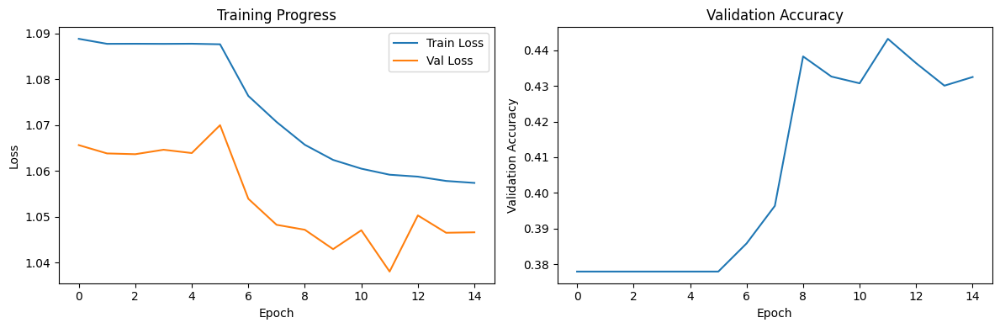

<Figure size 640x480 with 0 Axes>

In [24]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(results['train_losses'], label='Train Loss')  # Note: 'train_losses' not 'train_loss'
plt.plot(results['val_losses'], label='Val Loss')      # Note: 'val_losses' not 'val_loss'
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training Progress')

plt.subplot(1, 2, 2)
plt.plot(results['val_accuracies'])  # Note: 'val_accuracies' not 'val_acc'
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy')

plt.tight_layout()
plt.show()
plt.tight_layout()
plt.show()

In [ ]:

for i in range(5):
    model = BucketTransformer_mine(
                                   bucket_sizes=bucket_sizes, 
                                   embedding_dim=32, #32 #16
                                   n_heads=2,# 2 1
                                   n_layers=4,# 21
                                   dropout_transformer=0.23525280263751489, 
                                   number_of_classes = 3, 
                                   dropout_classifier = 0.17796988235965303,
                                   start_year = 2006,
                                   end_year = 2025,
                                   activation = 'relu',
                                   num_years=num_of_years,
                                   num_of_stock = num_of_stock,
                                   num_of_industry = num_of_industry,
                                   num_of_industry_format = num_of_industry_format,
                                   num_of_country = num_of_country,
                                   ratio_cols = bucket_cols,
                                   impute_cols = impute_cols) 
    
    
    # model = nn.DataParallel(model)
    # model = model.to(device)
    
    results = train_model_mine(
                            model, 
                            train_data,
                            val_data,
                            test_data,
                            epochs=15, #10 
                            batch_size=32, #16
                            learning_rate= 0.00017126110830893184, #  0.0001
                            weight_decay = 3.900297055579936e-06, 
                            weights_for_criterion = [1.0, 1.2121965144904125, 1.2 * 1.2121965144904125],
                            num_of_classes =3,
                            patience = 10, # Depends on epochs
                            T_0=3, # For cosine
                            T_mult=2, # For cosine
                            optimizer_name='Adam',
                            scheduler_name='plateau', 
                            plateau_patience=5,
                            plateau_factor=0.7944832528930469, 
                            step_size = 5,
                            gamma = 0.1,
                            label_smoothing = 0.003541588306763793,
                            trial=None,
                            model_save = True) 

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080



/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/networkx/utils/backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))


Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:28<06:40, 28.63s/it]

Epoch 0 Avg Confidence: 0.3958
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0876, Val Loss 1.0608, Val Acc 0.3780
Epoch   0: Train Loss 1.0876, Val Loss 1.0608, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:55<05:55, 27.36s/it]

Epoch 1 Avg Confidence: 0.4140
Epoch   1: Train Loss 1.0811, Val Loss 1.0529, Val Acc 0.3800


Epochs:  20%|███████████████▏                                                            | 3/15 [01:21<05:23, 26.94s/it]

Epoch 2 Avg Confidence: 0.3977
Epoch   2: Train Loss 1.0792, Val Loss 1.0553, Val Acc 0.3778


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:48<04:54, 26.77s/it]

Epoch 3 Avg Confidence: 0.3795
Epoch   3: Train Loss 1.0785, Val Loss 1.0601, Val Acc 0.3850


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:14<04:26, 26.68s/it]

Epoch 4 Avg Confidence: 0.3759
Epoch   4: Train Loss 1.0775, Val Loss 1.0647, Val Acc 0.3821


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:41<03:59, 26.62s/it]

Epoch 5 Avg Confidence: 0.3847
Epoch   5: Train Loss 1.0772, Val Loss 1.0593, Val Acc 0.3728


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:07<03:32, 26.58s/it]

Epoch 6 Avg Confidence: 0.3837
Epoch   6: Train Loss 1.0765, Val Loss 1.0615, Val Acc 0.3850


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:34<03:05, 26.56s/it]

Epoch 7 Avg Confidence: 0.3826
Epoch   7: Train Loss 1.0754, Val Loss 1.0599, Val Acc 0.4039


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:00<02:39, 26.54s/it]

Epoch 8 Avg Confidence: 0.3809
Epoch   8: Train Loss 1.0753, Val Loss 1.0655, Val Acc 0.3744


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:27<02:12, 26.52s/it]

Epoch 9 Avg Confidence: 0.3982
Epoch   9: Train Loss 1.0746, Val Loss 1.0547, Val Acc 0.3860


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:53<01:46, 26.53s/it]

Epoch 10 Avg Confidence: 0.3921
Epoch  10: Train Loss 1.0735, Val Loss 1.0591, Val Acc 0.3999
Epoch  10: Train Loss 1.0735, Val Loss 1.0591, Val Acc 0.3999


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:20<01:19, 26.56s/it]

Epoch 11 Avg Confidence: 0.3965
Epoch  11: Train Loss 1.0731, Val Loss 1.0550, Val Acc 0.4007


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:46<00:53, 26.55s/it]

Epoch 12 Avg Confidence: 0.3836
Epoch  12: Train Loss 1.0727, Val Loss 1.0585, Val Acc 0.4040


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:13<00:26, 26.54s/it]

Epoch 13 Avg Confidence: 0.3971
Epoch  13: Train Loss 1.0717, Val Loss 1.0554, Val Acc 0.3989


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:39<00:00, 26.65s/it]

Epoch 14 Avg Confidence: 0.3882
Epoch  14: Train Loss 1.0708, Val Loss 1.0584, Val Acc 0.4023
Epoch  14: Train Loss 1.0708, Val Loss 1.0584, Val Acc 0.4023

FINAL RESULTS
Best validation accuracy: 0.4040
Final validation accuracy: 0.4023

Validation Confusion Matrix:
[[1105 2008 2151]
 [1440 3275 4159]
 [1111 2717 4764]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 21.0% accuracy (1105/5264 correct)
Class 1: 36.9% accuracy (3275/8874 correct)
Class 2: 55.4% accuracy (4764/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.21      0.25      5264
     Class 1       0.41      0.37      0.39      8874
     Class 2       0.43      0.55      0.48      8592

    accuracy                           0.40     22730
   macro avg       0.38      0.38      0.37     22730
weighted avg       0.39      0.40      0.39     22730



Confusion Matrix (TESTING ):
[[1391 2521 2882]
 [1335 3395 4950]
 [1193 2962 4451]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.35      0.20      0.26      6794
     Class 1       0.38      0.35      0.37      9680
     Class 2       0.36      0.52      0.43      8606

    accuracy                           0.37     25080
   macro avg       0.37      0.36      0.35     25080
weighted avg       0.37      0.37      0.36     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:11, 26.55s/it]

Epoch 0 Avg Confidence: 0.3874
Best Model now for class 2 f1 score: 0.5105793142810551 and Precision = 0.39292213089038086
Epoch   0: Train Loss 1.0865, Val Loss 1.0479, Val Acc 0.4115
Epoch   0: Train Loss 1.0865, Val Loss 1.0479, Val Acc 0.4115


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:45, 26.55s/it]

Epoch 1 Avg Confidence: 0.4036
Best Model now for class 2 f1 score: 0.51493399339934 and Precision = 0.3988369120654397
Epoch   1: Train Loss 1.0761, Val Loss 1.0420, Val Acc 0.4234


Epochs:  20%|███████████████▏                                                            | 3/15 [01:19<05:18, 26.55s/it]

Epoch 2 Avg Confidence: 0.3882
Epoch   2: Train Loss 1.0724, Val Loss 1.0435, Val Acc 0.4403


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:46<04:52, 26.57s/it]

Epoch 3 Avg Confidence: 0.3980
Epoch   3: Train Loss 1.0695, Val Loss 1.0510, Val Acc 0.4161


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:12<04:25, 26.58s/it]

Epoch 4 Avg Confidence: 0.3981
Epoch   4: Train Loss 1.0677, Val Loss 1.0475, Val Acc 0.4271


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:39<03:59, 26.58s/it]

Epoch 5 Avg Confidence: 0.4171
Epoch   5: Train Loss 1.0659, Val Loss 1.0417, Val Acc 0.4312


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:05<03:32, 26.57s/it]

Epoch 6 Avg Confidence: 0.4256
Epoch   6: Train Loss 1.0646, Val Loss 1.0304, Val Acc 0.4410


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:32<03:06, 26.57s/it]

Epoch 7 Avg Confidence: 0.4044
Epoch   7: Train Loss 1.0638, Val Loss 1.0463, Val Acc 0.4293


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:59<02:39, 26.57s/it]

Epoch 8 Avg Confidence: 0.4125
Epoch   8: Train Loss 1.0628, Val Loss 1.0432, Val Acc 0.4245


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:25<02:12, 26.57s/it]

Epoch 9 Avg Confidence: 0.4109
Epoch   9: Train Loss 1.0624, Val Loss 1.0433, Val Acc 0.4296


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:52<01:46, 26.57s/it]

Epoch 10 Avg Confidence: 0.4097
Epoch  10: Train Loss 1.0611, Val Loss 1.0450, Val Acc 0.4360
Epoch  10: Train Loss 1.0611, Val Loss 1.0450, Val Acc 0.4360


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:18<01:19, 26.58s/it]

Epoch 11 Avg Confidence: 0.4165
Epoch  11: Train Loss 1.0608, Val Loss 1.0535, Val Acc 0.4162


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:45<00:53, 26.59s/it]

Epoch 12 Avg Confidence: 0.4256
Epoch  12: Train Loss 1.0605, Val Loss 1.0441, Val Acc 0.4191


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:12<00:26, 26.58s/it]

Epoch 13 Avg Confidence: 0.4235
Epoch  13: Train Loss 1.0593, Val Loss 1.0483, Val Acc 0.4231


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:38<00:00, 26.58s/it]

Epoch 14 Avg Confidence: 0.4050
Epoch  14: Train Loss 1.0586, Val Loss 1.0461, Val Acc 0.4348
Epoch  14: Train Loss 1.0586, Val Loss 1.0461, Val Acc 0.4348

FINAL RESULTS
Best validation accuracy: 0.4410
Final validation accuracy: 0.4348

Validation Confusion Matrix:
[[2045 1879 1340]
 [2080 4793 2001]
 [2098 3449 3045]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 38.8% accuracy (2045/5264 correct)
Class 1: 54.0% accuracy (4793/8874 correct)
Class 2: 35.4% accuracy (3045/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.33      0.39      0.36      5264
     Class 1       0.47      0.54      0.50      8874
     Class 2       0.48      0.35      0.41      8592

    accuracy                           0.43     22730
   macro avg       0.43      0.43      0.42     22730
weighted avg       0.44      0.43      0.43     22730



Confusion Matrix (TESTING ):
[[2362 2821 1611]
 [2013 5416 2251]
 [2238 4077 2291]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.36      0.35      0.35      6794
     Class 1       0.44      0.56      0.49      9680
     Class 2       0.37      0.27      0.31      8606

    accuracy                           0.40     25080
   macro avg       0.39      0.39      0.39     25080
weighted avg       0.39      0.40      0.39     25080


BEST MODEL EVALUATION (from epoch 1)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.48      0.38      0.42      8874
     Class 2       0.40      0.73      0.51      8592

    accuracy                           0.42     22730
   macro avg       0.29      0.37      0.31     22730
weighted avg       0.34      0.42      0.36     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0 2063 4731]
 [   0 4002 5678]
 [   0 2905 5701]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.45      0.41      0.43      9680
     Class 2       0.35      0.66      0.46      8606

    accuracy                           0.39     25080
   macro avg       0.27      0.36      0.30     25080
weighted avg       0.29      0.39      0.32     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:11, 26.53s/it]

Epoch 0 Avg Confidence: 0.3951
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0888, Val Loss 1.0619, Val Acc 0.3780
Epoch   0: Train Loss 1.0888, Val Loss 1.0619, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:45, 26.59s/it]

Epoch 1 Avg Confidence: 0.3838
Epoch   1: Train Loss 1.0826, Val Loss 1.0597, Val Acc 0.3778


Epochs:  20%|███████████████▏                                                            | 3/15 [01:19<05:19, 26.63s/it]

Epoch 2 Avg Confidence: 0.3994
Epoch   2: Train Loss 1.0781, Val Loss 1.0541, Val Acc 0.3886


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:46<04:53, 26.64s/it]

Epoch 3 Avg Confidence: 0.3868
Epoch   3: Train Loss 1.0757, Val Loss 1.0551, Val Acc 0.3979


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:13<04:26, 26.65s/it]

Epoch 4 Avg Confidence: 0.3912
Epoch   4: Train Loss 1.0742, Val Loss 1.0638, Val Acc 0.3679


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:39<03:59, 26.64s/it]

Epoch 5 Avg Confidence: 0.3915
Epoch   5: Train Loss 1.0738, Val Loss 1.0561, Val Acc 0.3903


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:06<03:33, 26.64s/it]

Epoch 6 Avg Confidence: 0.4131
Epoch   6: Train Loss 1.0727, Val Loss 1.0491, Val Acc 0.3889


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:33<03:06, 26.64s/it]

Epoch 7 Avg Confidence: 0.3986
Epoch   7: Train Loss 1.0721, Val Loss 1.0547, Val Acc 0.3865


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:59<02:39, 26.64s/it]

Epoch 8 Avg Confidence: 0.4060
Epoch   8: Train Loss 1.0714, Val Loss 1.0467, Val Acc 0.3962


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:26<02:13, 26.65s/it]

Epoch 9 Avg Confidence: 0.3891
Epoch   9: Train Loss 1.0711, Val Loss 1.0567, Val Acc 0.3902


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:52<01:46, 26.64s/it]

Epoch 10 Avg Confidence: 0.3924
Epoch  10: Train Loss 1.0707, Val Loss 1.0583, Val Acc 0.3858
Epoch  10: Train Loss 1.0707, Val Loss 1.0583, Val Acc 0.3858


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:19<01:19, 26.64s/it]

Epoch 11 Avg Confidence: 0.4083
Epoch  11: Train Loss 1.0704, Val Loss 1.0509, Val Acc 0.3873


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:46<00:53, 26.65s/it]

Epoch 12 Avg Confidence: 0.4008
Epoch  12: Train Loss 1.0693, Val Loss 1.0525, Val Acc 0.3978


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:12<00:26, 26.64s/it]

Epoch 13 Avg Confidence: 0.3992
Epoch  13: Train Loss 1.0695, Val Loss 1.0555, Val Acc 0.3914


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:39<00:00, 26.64s/it]

Epoch 14 Avg Confidence: 0.4050
Epoch  14: Train Loss 1.0692, Val Loss 1.0576, Val Acc 0.3938
Epoch  14: Train Loss 1.0692, Val Loss 1.0576, Val Acc 0.3938

FINAL RESULTS
Best validation accuracy: 0.3979
Final validation accuracy: 0.3938

Validation Confusion Matrix:
[[1825 1179 2260]
 [2277 2143 4454]
 [1851 1758 4983]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 34.7% accuracy (1825/5264 correct)
Class 1: 24.1% accuracy (2143/8874 correct)
Class 2: 58.0% accuracy (4983/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.31      0.35      0.33      5264
     Class 1       0.42      0.24      0.31      8874
     Class 2       0.43      0.58      0.49      8592

    accuracy                           0.39     22730
   macro avg       0.38      0.39      0.37     22730
weighted avg       0.40      0.39      0.38     22730



Confusion Matrix (TESTING ):
[[2360 1390 3044]
 [2166 2138 5376]
 [2030 1893 4683]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.36      0.35      0.35      6794
     Class 1       0.39      0.22      0.28      9680
     Class 2       0.36      0.54      0.43      8606

    accuracy                           0.37     25080
   macro avg       0.37      0.37      0.36     25080
weighted avg       0.37      0.37      0.35     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:11, 26.55s/it]

Epoch 0 Avg Confidence: 0.3942
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0872, Val Loss 1.0586, Val Acc 0.3780
Epoch   0: Train Loss 1.0872, Val Loss 1.0586, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:45, 26.55s/it]

Epoch 1 Avg Confidence: 0.3848
Epoch   1: Train Loss 1.0800, Val Loss 1.0638, Val Acc 0.3780


Epochs:  20%|███████████████▏                                                            | 3/15 [01:19<05:18, 26.58s/it]

Epoch 2 Avg Confidence: 0.3924
Epoch   2: Train Loss 1.0783, Val Loss 1.0571, Val Acc 0.3780


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:46<04:52, 26.59s/it]

Epoch 3 Avg Confidence: 0.3860
Epoch   3: Train Loss 1.0764, Val Loss 1.0584, Val Acc 0.3780


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:12<04:25, 26.59s/it]

Epoch 4 Avg Confidence: 0.4204
Epoch   4: Train Loss 1.0744, Val Loss 1.0564, Val Acc 0.3780


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:39<03:59, 26.60s/it]

Epoch 5 Avg Confidence: 0.4119
Epoch   5: Train Loss 1.0723, Val Loss 1.0579, Val Acc 0.3791


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:06<03:32, 26.59s/it]

Epoch 6 Avg Confidence: 0.4109
Epoch   6: Train Loss 1.0695, Val Loss 1.0482, Val Acc 0.4092


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:32<03:06, 26.60s/it]

Epoch 7 Avg Confidence: 0.4170
Epoch   7: Train Loss 1.0678, Val Loss 1.0437, Val Acc 0.4155


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:59<02:39, 26.60s/it]

Epoch 8 Avg Confidence: 0.4035
Epoch   8: Train Loss 1.0664, Val Loss 1.0488, Val Acc 0.4081


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:25<02:12, 26.59s/it]

Epoch 9 Avg Confidence: 0.4097
Epoch   9: Train Loss 1.0651, Val Loss 1.0523, Val Acc 0.4082


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:52<01:46, 26.59s/it]

Epoch 10 Avg Confidence: 0.4020
Epoch  10: Train Loss 1.0637, Val Loss 1.0460, Val Acc 0.4231
Epoch  10: Train Loss 1.0637, Val Loss 1.0460, Val Acc 0.4231


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:19<01:19, 26.59s/it]

Epoch 11 Avg Confidence: 0.4142
Epoch  11: Train Loss 1.0627, Val Loss 1.0525, Val Acc 0.4156


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:45<00:53, 26.60s/it]

Epoch 12 Avg Confidence: 0.4134
Epoch  12: Train Loss 1.0627, Val Loss 1.0502, Val Acc 0.4150


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:12<00:26, 26.60s/it]

Epoch 13 Avg Confidence: 0.4192
Epoch  13: Train Loss 1.0615, Val Loss 1.0459, Val Acc 0.4205


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:38<00:00, 26.59s/it]

Epoch 14 Avg Confidence: 0.4191
Epoch  14: Train Loss 1.0609, Val Loss 1.0482, Val Acc 0.4218
Epoch  14: Train Loss 1.0609, Val Loss 1.0482, Val Acc 0.4218

FINAL RESULTS
Best validation accuracy: 0.4231
Final validation accuracy: 0.4218

Validation Confusion Matrix:
[[2000  953 2311]
 [2349 2989 3536]
 [2039 1955 4598]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 38.0% accuracy (2000/5264 correct)
Class 1: 33.7% accuracy (2989/8874 correct)
Class 2: 53.5% accuracy (4598/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.31      0.38      0.34      5264
     Class 1       0.51      0.34      0.40      8874
     Class 2       0.44      0.54      0.48      8592

    accuracy                           0.42     22730
   macro avg       0.42      0.42      0.41     22730
weighted avg       0.44      0.42      0.42     22730



Confusion Matrix (TESTING ):
[[2435 1547 2812]
 [2178 3454 4048]
 [2220 2342 4044]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.36      0.36      0.36      6794
     Class 1       0.47      0.36      0.41      9680
     Class 2       0.37      0.47      0.41      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.40      0.39     25080
weighted avg       0.41      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:13, 26.65s/it]

Epoch 0 Avg Confidence: 0.3770
Best Model now for class 2 f1 score: 0.47874526771227693 and Precision = 0.4471610426348757
Epoch   0: Train Loss 1.0861, Val Loss 1.0565, Val Acc 0.4392
Epoch   0: Train Loss 1.0861, Val Loss 1.0565, Val Acc 0.4392


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:46, 26.63s/it]

Epoch 1 Avg Confidence: 0.4018
Epoch   1: Train Loss 1.0750, Val Loss 1.0458, Val Acc 0.4472


Epochs:  20%|███████████████▏                                                            | 3/15 [01:19<05:19, 26.62s/it]

Epoch 2 Avg Confidence: 0.4044
Epoch   2: Train Loss 1.0703, Val Loss 1.0373, Val Acc 0.4386


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:46<04:52, 26.61s/it]

Epoch 3 Avg Confidence: 0.4098
Epoch   3: Train Loss 1.0676, Val Loss 1.0657, Val Acc 0.3749


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:13<04:26, 26.61s/it]

Epoch 4 Avg Confidence: 0.4118
Best Model now for class 2 f1 score: 0.48762565698831456 and Precision = 0.434166288050886
Epoch   4: Train Loss 1.0656, Val Loss 1.0558, Val Acc 0.3996


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:39<03:59, 26.64s/it]

Epoch 5 Avg Confidence: 0.4180
Epoch   5: Train Loss 1.0648, Val Loss 1.0431, Val Acc 0.4266


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:06<03:33, 26.65s/it]

Epoch 6 Avg Confidence: 0.4084
Epoch   6: Train Loss 1.0640, Val Loss 1.0461, Val Acc 0.4252


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:33<03:06, 26.66s/it]

Epoch 7 Avg Confidence: 0.4121
Epoch   7: Train Loss 1.0633, Val Loss 1.0486, Val Acc 0.4130


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:59<02:39, 26.66s/it]

Epoch 8 Avg Confidence: 0.4106
Epoch   8: Train Loss 1.0621, Val Loss 1.0434, Val Acc 0.4316


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:26<02:13, 26.67s/it]

Epoch 9 Avg Confidence: 0.4066
Epoch   9: Train Loss 1.0611, Val Loss 1.0440, Val Acc 0.4350


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:53<01:46, 26.67s/it]

Epoch 10 Avg Confidence: 0.4093
Best Model now for class 2 f1 score: 0.4923475746547684 and Precision = 0.43062701665649256
Epoch  10: Train Loss 1.0608, Val Loss 1.0470, Val Acc 0.4202
Epoch  10: Train Loss 1.0608, Val Loss 1.0470, Val Acc 0.4202


### Hyperparameter Tuning with Optuna

This section uses Optuna to search for the best hyperparameters for the `BucketTransformer_mine` model. 

- A custom scoring function (`custom_score`) is defined to reward both high final validation accuracy and convergence stability (loss reduction).
- The search space includes:
  - Transformer architecture: `embedding_dim`, `n_layers`, `n_heads`
  - Regularization: `dropout_transformer`, `dropout_classifier`, `weight_decay`
  - Optimizer: choice among `Adam`, `AdamW`, and `SGD`
  - Scheduler: `cosine`, `plateau`, or `step` with their respective parameters
  - Training: `batch_size`, `label_smoothing`, `patience`

Key notes:
- Incompatible transformer setups (e.g. heads not dividing embedding dimension) are pruned early.
- Meta embeddings are turned off by setting the respective input cardinalities to zero.
- All model training is done via `train_model_mine`, and the final score is passed back to Optuna for comparison.
- After optimization, the best configuration is printed.

This approach balances exploration (via TPE sampling) with early stopping (via median pruning) to efficiently search the space within a time constraint.


In [16]:
import optuna
from optuna.trial import TrialState
from sklearn.exceptions import UndefinedMetricWarning
optuna.samplers.TPESampler(warn_independent_sampling=False)

# Custom Socring Function
def custom_score(results):
    val_accs = results["val_accuracies"]
    val_losses = results['val_losses']
    improvements = [val_accs[i+1] - val_accs[i] for i in range(len(val_accs)-1)]
    improvements2 = [val_losses[i] - val_losses[i+1] for i in range(len(val_losses)-1)]
    smooth_gain = sum(improvements)
    smooth_gains2 = sum(improvements2)
    final_score = val_accs[-1] + smooth_gain + 1.3*smooth_gains2  - val_losses[-1] # encourages both accuracy and convergence
    return final_score


trial_results = []   
def objective(trial):
    # ── search space ────────────────────────────────────────────────────
    embedding_dim = trial.suggest_categorical("embedding_dim", [16, 32, 64])
    n_layers      = trial.suggest_categorical("n_layers", [1,2, 4, 6])
    
    # single, study-wide superset
    n_heads       = trial.suggest_categorical(
        "n_heads",
        [1,2, 4, 6]       # add 32 if you want
    )
    
    # ----- hard constraints --------------------------------------------
    if (n_heads % n_layers != 0) or (embedding_dim % n_heads != 0):
        raise optuna.TrialPruned()

    dropout_tf   = trial.suggest_float("dropout_transformer", 0.2, 0.5)
    dropout_cls  = trial.suggest_float("dropout_classifier", 0.1, 0.4)
    lr           = trial.suggest_float("learning_rate", 2e-5, 3e-4, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-4, log=True)

    w_pos        = trial.suggest_float("w_pos", 0.8, 1.3)
    weights_for_criterion = [1.0, w_pos, 1.2 * w_pos]

    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "AdamW", 'SGD'])
    scheduler_name = trial.suggest_categorical("scheduler", ["cosine", "plateau", "step"])
    sched_kw = dict(T_0=1, T_mult=1,
                plateau_patience=2, plateau_factor=0.5,   # ← defaults
                step_size=1, gamma=1.0)
    if scheduler_name == "cosine":
        sched_kw["T_0"]   = trial.suggest_int("T_0", 1, 5)
        sched_kw["T_mult"] = 2
    elif scheduler_name == "step":
        sched_kw["step_size"]   = trial.suggest_int("step_size", 1, 5)
        sched_kw["gamma"] = 0.1
    else:
        sched_kw["plateau_patience"] = trial.suggest_int("plateau_patience", 2, 4)
        sched_kw["plateau_factor"]   = trial.suggest_float("plateau_factor", 0.4, 0.8)

    batch_size = trial.suggest_categorical("batch_size", [16,32,64])
    patience = trial.suggest_int("patience", 5, 15) 
    label_smoothing = trial.suggest_float("ls", 0.0, 0.2)



    model = BucketTransformer_mine(
        bucket_sizes=bucket_sizes,
        embedding_dim=embedding_dim,
        n_heads=n_heads,
        n_layers=n_layers,
        dropout_transformer=dropout_tf,  
        number_of_classes=3,
        dropout_classifier=dropout_cls,
        start_year=2006,
        end_year=2025,
        activation="relu",
    
        # optional 
        num_years=num_of_years,
        num_of_stock=num_of_stock,
        num_of_industry=num_of_industry,
        num_of_industry_format=num_of_industry_format,
        num_of_country=num_of_country,
        ratio_cols=bucket_cols,
        impute_cols=impute_cols,
    )


    results = train_model_mine(
        model,
        train_data,
        val_data,
        test_data,
        epochs          = 10,
        batch_size      = batch_size, # 16 before
        learning_rate   = lr,
        weight_decay    = weight_decay,
        weights_for_criterion = weights_for_criterion,
        num_of_classes  = 3,
        patience        = patience, # 10
        optimizer_name  = optimizer_name,
        scheduler_name  = scheduler_name,
        T_0             = sched_kw["T_0"],
        T_mult          = sched_kw["T_mult"],
        plateau_patience= sched_kw["plateau_patience"],
        plateau_factor  = sched_kw["plateau_factor"],
        # optional for step scheduler
        step_size       = sched_kw.get("step_size", 1),
        gamma           = sched_kw.get("gamma", 1.0),
        trial           = trial,
        label_smoothing = label_smoothing,
        model_save = False
    )

    score = custom_score(results)
    results['score'] = score
    results['trial_param'] = trial.params
    trial_results.append(results)
    return score



study = optuna.create_study(
    direction="maximize",
    sampler=optuna.samplers.TPESampler(multivariate=True),
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=4),
)

study.optimize(objective, n_trials=50, timeout=3600)


print(f"Finished: {len(study.trials)} trials "
      f"({len([t for t in study.trials if t.state==TrialState.PRUNED])} pruned)")
if study.best_trial:
    bt = study.best_trial
    print("\nBest trial:")
    print(f"  value:  {bt.value:.4f}")
    for k, v in bt.params.items():
        print(f"  {k:>20}: {v}")


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/optuna/_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-07-25 13:12:26,442] A new study created in memory with name: no-name-b0a77fb9-5d2a-463d-a035-174641717a16
[I 2025-07-25 13:12:26,443] Trial 0 pruned. 
[I 2025-07-25 13:12:26,444] Trial 1 pruned. 
[I 2025-07-25 13:12:26,444] Trial 2 pruned. 
[I 2025-07-25 13:12:26,444] Trial 3 pruned. 
[I 2025-07-25 13:12:26,445] Trial 4 pruned. 
[I 2025-07-25 13:12:26,445] Trial 5 pruned. 
[I 2025-07-25 13:12:26,446] Trial 6 pruned. 
[I 2025-07-25 13:12:26,446] Trial 7 pruned. 
[I 2025-07-25 13:12:26,447] Trial 8 pruned. 
[I 2025-07-25 13:12:26,447] Trial 9 pruned. 


not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.9630679133387793, 1.1556814960065351]


Epochs:  10%|███████▌                                                                    | 1/10 [00:16<02:28, 16.51s/it]

Epoch 0 Avg Confidence: 0.3773
Best Model now for class 2 f1 score: 0.5076774589804335 and Precision = 0.4074074074074074
Epoch   0: Train Loss 1.0960, Val Loss 1.0858, Val Acc 0.3591
Epoch   0: Train Loss 1.0960, Val Loss 1.0858, Val Acc 0.3591


Epochs:  20%|███████████████▏                                                            | 2/10 [00:32<02:11, 16.40s/it]

Epoch 1 Avg Confidence: 0.3880
Epoch   1: Train Loss 1.0883, Val Loss 1.0864, Val Acc 0.3388


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:49<01:54, 16.36s/it]

Epoch 2 Avg Confidence: 0.3889
Epoch   2: Train Loss 1.0848, Val Loss 1.0761, Val Acc 0.3583


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:05<01:38, 16.36s/it]

Epoch 3 Avg Confidence: 0.3981
Epoch   3: Train Loss 1.0802, Val Loss 1.0755, Val Acc 0.3596


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:21<01:21, 16.34s/it]

Epoch 4 Avg Confidence: 0.3978
Epoch   4: Train Loss 1.0778, Val Loss 1.0877, Val Acc 0.3425


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [01:38<01:05, 16.34s/it]

Epoch 5 Avg Confidence: 0.4002
Epoch   5: Train Loss 1.0759, Val Loss 1.0782, Val Acc 0.3791


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [01:54<00:49, 16.34s/it]

Epoch 6 Avg Confidence: 0.4040
Epoch   6: Train Loss 1.0735, Val Loss 1.0697, Val Acc 0.4010


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:10<00:32, 16.33s/it]

Epoch 7 Avg Confidence: 0.4079
Epoch   7: Train Loss 1.0717, Val Loss 1.0744, Val Acc 0.3936


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [02:27<00:16, 16.32s/it]

Epoch 8 Avg Confidence: 0.4109
Epoch   8: Train Loss 1.0702, Val Loss 1.0727, Val Acc 0.3978


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [02:43<00:00, 16.34s/it]

Epoch 9 Avg Confidence: 0.4133
Epoch   9: Train Loss 1.0713, Val Loss 1.0582, Val Acc 0.4216
Epoch   9: Train Loss 1.0713, Val Loss 1.0582, Val Acc 0.4216

FINAL RESULTS
Best validation accuracy: 0.4216
Final validation accuracy: 0.4216

Validation Confusion Matrix:
[[2088 1471 1705]
 [2383 3708 2783]
 [2230 2575 3787]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 39.7% accuracy (2088/5264 correct)
Class 1: 41.8% accuracy (3708/8874 correct)
Class 2: 44.1% accuracy (3787/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.31      0.40      0.35      5264
     Class 1       0.48      0.42      0.45      8874
     Class 2       0.46      0.44      0.45      8592

    accuracy                           0.42     22730
   macro avg       0.42      0.42      0.41     22730
weighted avg       0.43      0.42      0.42     22730



Confusion Matrix (TESTING ):
[[2529 2103 2162]
 [2256 4103 3321]
 [2390 2989 3227]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.35      0.37      0.36      6794
     Class 1       0.45      0.42      0.43      9680
     Class 2       0.37      0.37      0.37      8606

    accuracy                           0.39     25080
   macro avg       0.39      0.39      0.39     25080
weighted avg       0.39      0.39      0.39     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.28      0.45      0.34      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.41      0.67      0.51      8592

    accuracy                           0.36     22730
   macro avg       0.23      0.37      0.28     22730
weighted avg       0.22      0.36      0.27     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[3075    0 3719]
 [3453    0 6227]
 [2888    0 5718]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.33      0.45      0.38      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.37      0.66      0.47      8606

    accuracy                           0.35     25080
   macro avg       0.23      0.37      0.28     25080
weighted avg       0.21      0.35      0.26     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.9540566160916771, 1.1448679393100125]


Epochs:  10%|███████▌                                                                    | 1/10 [00:16<02:27, 16.44s/it]

Epoch 0 Avg Confidence: 0.3717
Best Model now for class 2 f1 score: 0.5112029584511638 and Precision = 0.40818453414854444
Epoch   0: Train Loss 1.0944, Val Loss 1.0816, Val Acc 0.4111
Epoch   0: Train Loss 1.0944, Val Loss 1.0816, Val Acc 0.4111


Epochs:  20%|███████████████▏                                                            | 2/10 [00:32<02:11, 16.43s/it]

Epoch 1 Avg Confidence: 0.3877
Epoch   1: Train Loss 1.0853, Val Loss 1.0740, Val Acc 0.3991


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:49<01:55, 16.43s/it]

Epoch 2 Avg Confidence: 0.3879
Epoch   2: Train Loss 1.0810, Val Loss 1.0689, Val Acc 0.4252


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:05<01:38, 16.42s/it]

Epoch 3 Avg Confidence: 0.4034
Epoch   3: Train Loss 1.0773, Val Loss 1.0714, Val Acc 0.4042


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:22<01:22, 16.42s/it]

Epoch 4 Avg Confidence: 0.3977
Epoch   4: Train Loss 1.0761, Val Loss 1.0594, Val Acc 0.4317


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [01:38<01:05, 16.42s/it]

Epoch 5 Avg Confidence: 0.4081
Epoch   5: Train Loss 1.0754, Val Loss 1.0623, Val Acc 0.4150


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [01:54<00:49, 16.42s/it]

Epoch 6 Avg Confidence: 0.4011
Epoch   6: Train Loss 1.0732, Val Loss 1.0742, Val Acc 0.4042


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:11<00:32, 16.43s/it]

Epoch 7 Avg Confidence: 0.4150
Epoch   7: Train Loss 1.0713, Val Loss 1.0738, Val Acc 0.3943


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [02:27<00:16, 16.43s/it]

Epoch 8 Avg Confidence: 0.4114
Epoch   8: Train Loss 1.0700, Val Loss 1.0709, Val Acc 0.4049


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [02:44<00:00, 16.43s/it]

Epoch 9 Avg Confidence: 0.4143
Epoch   9: Train Loss 1.0717, Val Loss 1.0744, Val Acc 0.3973
Epoch   9: Train Loss 1.0717, Val Loss 1.0744, Val Acc 0.3973

FINAL RESULTS
Best validation accuracy: 0.4317
Final validation accuracy: 0.3973

Validation Confusion Matrix:
[[2925  967 1372]
 [3584 2871 2419]
 [3402 1955 3235]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 55.6% accuracy (2925/5264 correct)
Class 1: 32.4% accuracy (2871/8874 correct)
Class 2: 37.7% accuracy (3235/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.56      0.39      5264
     Class 1       0.50      0.32      0.39      8874
     Class 2       0.46      0.38      0.41      8592

    accuracy                           0.40     22730
   macro avg       0.42      0.42      0.40     22730
weighted avg       0.44      0.40      0.40     22730



Confusion Matrix (TESTING ):
[[3561 1394 1839]
 [3476 3280 2924]
 [3557 2331 2718]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.34      0.52      0.41      6794
     Class 1       0.47      0.34      0.39      9680
     Class 2       0.36      0.32      0.34      8606

    accuracy                           0.38     25080
   macro avg       0.39      0.39      0.38     25080
weighted avg       0.40      0.38      0.38     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.30      0.17      0.22      5264
     Class 1       0.48      0.29      0.36      8874
     Class 2       0.41      0.68      0.51      8592

    accuracy                           0.41     22730
   macro avg       0.40      0.38      0.36     22730
weighted avg       0.41      0.41      0.38     22730


Best Model Confusion Matri

[I 2025-07-25 13:18:00,156] Trial 11 finished with value: -0.6814781197964541 and parameters: {'embedding_dim': 32, 'n_layers': 1, 'n_heads': 4, 'dropout_transformer': 0.3182379591393332, 'dropout_classifier': 0.12615276590545396, 'learning_rate': 0.0002032220788721901, 'weight_decay': 9.598575136919173e-06, 'w_pos': 0.9540566160916771, 'optimizer': 'Adam', 'scheduler': 'cosine', 'T_0': 1, 'batch_size': 32, 'patience': 7, 'ls': 0.031207185671742035}. Best is trial 10 with value: -0.5381624768213505.
[W 2025-07-25 13:18:00,158] The parameter 'dropout_transformer' in trial#12 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-07-25 13:18:00,160] The parameter 'dropout_classifier' in trial#12 is sampled independently instead of being sampled by m

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[1130 1415 4249]
 [1041 2726 5913]
 [1013 1892 5701]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.35      0.17      0.23      6794
     Class 1       0.45      0.28      0.35      9680
     Class 2       0.36      0.66      0.47      8606

    accuracy                           0.38     25080
   macro avg       0.39      0.37      0.35     25080
weighted avg       0.39      0.38      0.36     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.9539002172849365, 1.1446802607419237]


Epochs:  10%|███████▌                                                                    | 1/10 [00:16<02:27, 16.40s/it]

Epoch 0 Avg Confidence: 0.3820
Best Model now for class 2 f1 score: 0.4716346899725914 and Precision = 0.4243834341554211
Epoch   0: Train Loss 1.0930, Val Loss 1.0873, Val Acc 0.3507
Epoch   0: Train Loss 1.0930, Val Loss 1.0873, Val Acc 0.3507


Epochs:  20%|███████████████▏                                                            | 2/10 [00:32<02:11, 16.39s/it]

Epoch 1 Avg Confidence: 0.3931
Best Model now for class 2 f1 score: 0.47568561691999783 and Precision = 0.4443658413340071
Epoch   1: Train Loss 1.0843, Val Loss 1.0715, Val Acc 0.3978


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:49<01:54, 16.39s/it]

Epoch 2 Avg Confidence: 0.3906
Epoch   2: Train Loss 1.0802, Val Loss 1.0743, Val Acc 0.3917


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:05<01:38, 16.39s/it]

Epoch 3 Avg Confidence: 0.3995
Epoch   3: Train Loss 1.0766, Val Loss 1.0734, Val Acc 0.4040


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:21<01:21, 16.39s/it]

Epoch 4 Avg Confidence: 0.4031
Epoch   4: Train Loss 1.0744, Val Loss 1.0860, Val Acc 0.3845


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [01:38<01:05, 16.40s/it]

Epoch 5 Avg Confidence: 0.4147
Epoch   5: Train Loss 1.0740, Val Loss 1.0736, Val Acc 0.4073


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [01:54<00:49, 16.40s/it]

Epoch 6 Avg Confidence: 0.4206
Epoch   6: Train Loss 1.0716, Val Loss 1.0801, Val Acc 0.3861


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:11<00:32, 16.41s/it]

Epoch 7 Avg Confidence: 0.4088
Epoch   7: Train Loss 1.0700, Val Loss 1.0674, Val Acc 0.4022


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [02:27<00:16, 16.41s/it]

Epoch 8 Avg Confidence: 0.4158
Epoch   8: Train Loss 1.0686, Val Loss 1.0711, Val Acc 0.4001


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [02:44<00:00, 16.40s/it]

Epoch 9 Avg Confidence: 0.4088
Epoch   9: Train Loss 1.0698, Val Loss 1.0657, Val Acc 0.4043
Epoch   9: Train Loss 1.0698, Val Loss 1.0657, Val Acc 0.4043

FINAL RESULTS
Best validation accuracy: 0.4073
Final validation accuracy: 0.4043

Validation Confusion Matrix:
[[2467  748 2049]
 [2994 2482 3398]
 [2765 1586 4241]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 46.9% accuracy (2467/5264 correct)
Class 1: 28.0% accuracy (2482/8874 correct)
Class 2: 49.4% accuracy (4241/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.47      0.37      5264
     Class 1       0.52      0.28      0.36      8874
     Class 2       0.44      0.49      0.46      8592

    accuracy                           0.40     22730
   macro avg       0.42      0.41      0.40     22730
weighted avg       0.44      0.40      0.40     22730



Confusion Matrix (TESTING ):
[[3079 1207 2508]
 [2995 2878 3807]
 [2968 1917 3721]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.34      0.45      0.39      6794
     Class 1       0.48      0.30      0.37      9680
     Class 2       0.37      0.43      0.40      8606

    accuracy                           0.39     25080
   macro avg       0.40      0.39      0.39     25080
weighted avg       0.40      0.39      0.38     25080


BEST MODEL EVALUATION (from epoch 1)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.29      0.48      0.36      5264
     Class 1       0.50      0.24      0.32      8874
     Class 2       0.44      0.51      0.48      8592

    accuracy                           0.40     22730
   macro avg       0.41      0.41      0.39     22730
weighted avg       0.43      0.40      0.39     22730


Best Model Confusion Matri

[I 2025-07-25 13:20:47,193] Trial 12 finished with value: -0.5797558298060614 and parameters: {'embedding_dim': 32, 'n_layers': 1, 'n_heads': 4, 'dropout_transformer': 0.32288971067946054, 'dropout_classifier': 0.11544571759130212, 'learning_rate': 0.00020680661662256635, 'weight_decay': 9.692401977449385e-06, 'w_pos': 0.9539002172849365, 'optimizer': 'Adam', 'scheduler': 'cosine', 'T_0': 1, 'batch_size': 32, 'patience': 7, 'ls': 0.030060612430449978}. Best is trial 10 with value: -0.5381624768213505.
[W 2025-07-25 13:20:47,195] The parameter 'dropout_transformer' in trial#13 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-07-25 13:20:47,197] The parameter 'dropout_classifier' in trial#13 is sampled independently instead of being sampled by

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[3065 1172 2557]
 [3204 2233 4243]
 [3044 1567 3995]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.33      0.45      0.38      6794
     Class 1       0.45      0.23      0.30      9680
     Class 2       0.37      0.46      0.41      8606

    accuracy                           0.37     25080
   macro avg       0.38      0.38      0.37     25080
weighted avg       0.39      0.37      0.36     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.9619439429598775, 1.154332731551853]


Epochs:  10%|███████▌                                                                    | 1/10 [00:19<02:59, 19.96s/it]

Epoch 0 Avg Confidence: 0.3911
Best Model now for class 2 f1 score: 0.49558704260292924 and Precision = 0.41992076966610076
Epoch   0: Train Loss 1.0926, Val Loss 1.0797, Val Acc 0.3540
Epoch   0: Train Loss 1.0926, Val Loss 1.0797, Val Acc 0.3540


Epochs:  20%|███████████████▏                                                            | 2/10 [00:39<02:39, 19.96s/it]

Epoch 1 Avg Confidence: 0.4031
Epoch   1: Train Loss 1.0839, Val Loss 1.0791, Val Acc 0.3626


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:59<02:19, 19.96s/it]

Epoch 2 Avg Confidence: 0.3993
Epoch   2: Train Loss 1.0796, Val Loss 1.0753, Val Acc 0.4018


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:19<01:59, 19.97s/it]

Epoch 3 Avg Confidence: 0.4162
Epoch   3: Train Loss 1.0761, Val Loss 1.0762, Val Acc 0.3869


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:39<01:39, 19.97s/it]

Epoch 4 Avg Confidence: 0.4117
Epoch   4: Train Loss 1.0748, Val Loss 1.0779, Val Acc 0.3778


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [01:59<01:19, 19.97s/it]

Epoch 5 Avg Confidence: 0.4077
Epoch   5: Train Loss 1.0745, Val Loss 1.0674, Val Acc 0.4074


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [02:19<00:59, 19.97s/it]

Epoch 6 Avg Confidence: 0.4147
Epoch   6: Train Loss 1.0730, Val Loss 1.0724, Val Acc 0.3924


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:39<00:39, 19.97s/it]

Epoch 7 Avg Confidence: 0.4200
Epoch   7: Train Loss 1.0706, Val Loss 1.0740, Val Acc 0.3954


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [02:59<00:19, 19.97s/it]

Epoch 8 Avg Confidence: 0.4234
Epoch   8: Train Loss 1.0692, Val Loss 1.0747, Val Acc 0.3978


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [03:19<00:00, 19.97s/it]

Epoch 9 Avg Confidence: 0.4123
Epoch   9: Train Loss 1.0713, Val Loss 1.0640, Val Acc 0.4017
Epoch   9: Train Loss 1.0713, Val Loss 1.0640, Val Acc 0.4017

FINAL RESULTS
Best validation accuracy: 0.4074
Final validation accuracy: 0.4017

Validation Confusion Matrix:
[[2347  530 2387]
 [2930 1858 4086]
 [2519 1147 4926]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 44.6% accuracy (2347/5264 correct)
Class 1: 20.9% accuracy (1858/8874 correct)
Class 2: 57.3% accuracy (4926/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.45      0.36      5264
     Class 1       0.53      0.21      0.30      8874
     Class 2       0.43      0.57      0.49      8592

    accuracy                           0.40     22730
   macro avg       0.42      0.41      0.38     22730
weighted avg       0.44      0.40      0.39     22730



Confusion Matrix (TESTING ):
[[2957  868 2969]
 [2835 2239 4606]
 [2791 1437 4378]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.34      0.44      0.38      6794
     Class 1       0.49      0.23      0.31      9680
     Class 2       0.37      0.51      0.43      8606

    accuracy                           0.38     25080
   macro avg       0.40      0.39      0.38     25080
weighted avg       0.41      0.38      0.37     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.28      0.54      0.37      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.42      0.60      0.50      8592

    accuracy                           0.35     22730
   macro avg       0.23      0.38      0.29     22730
weighted avg       0.22      0.35      0.27     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[3491    0 3303]
 [3956    0 5724]
 [3661    0 4945]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.31      0.51      0.39      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.35      0.57      0.44      8606

    accuracy                           0.34     25080
   macro avg       0.22      0.36      0.28     25080
weighted avg       0.21      0.34      0.26     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.157048627632885, 1.388458353159462]


Epochs:  10%|███████▌                                                                    | 1/10 [00:15<02:19, 15.44s/it]

Epoch 0 Avg Confidence: 0.3829
Best Model now for class 2 f1 score: 0.5383080201603355 and Precision = 0.37942873491965096
Epoch   0: Train Loss 1.0989, Val Loss 1.0722, Val Acc 0.3793
Epoch   0: Train Loss 1.0989, Val Loss 1.0722, Val Acc 0.3793


Epochs:  20%|███████████████▏                                                            | 2/10 [00:30<02:03, 15.45s/it]

Epoch 1 Avg Confidence: 0.3831
Best Model now for class 2 f1 score: 0.5429315402617093 and Precision = 0.37871890375684003
Epoch   1: Train Loss 1.0933, Val Loss 1.0694, Val Acc 0.3794


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:46<01:48, 15.46s/it]

Epoch 2 Avg Confidence: 0.3880
Best Model now for class 2 f1 score: 0.5475194646419149 and Precision = 0.3783459315251223
Epoch   2: Train Loss 1.0920, Val Loss 1.0690, Val Acc 0.3786


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:01<01:32, 15.46s/it]

Epoch 3 Avg Confidence: 0.3849
Epoch   3: Train Loss 1.0913, Val Loss 1.0688, Val Acc 0.3786


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:17<01:17, 15.47s/it]

Epoch 4 Avg Confidence: 0.3834
Epoch   4: Train Loss 1.0912, Val Loss 1.0685, Val Acc 0.3790


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [01:32<01:01, 15.47s/it]

Epoch 5 Avg Confidence: 0.3854
Best Model now for class 2 f1 score: 0.5478193846746741 and Precision = 0.37829326709837663
Epoch   5: Train Loss 1.0908, Val Loss 1.0675, Val Acc 0.3783


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [01:48<00:46, 15.47s/it]

Epoch 6 Avg Confidence: 0.3854
Epoch   6: Train Loss 1.0900, Val Loss 1.0682, Val Acc 0.3778


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:03<00:30, 15.48s/it]

Epoch 7 Avg Confidence: 0.3850
Epoch   7: Train Loss 1.0900, Val Loss 1.0682, Val Acc 0.3776


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [02:19<00:15, 15.47s/it]

Epoch 8 Avg Confidence: 0.3849
Epoch   8: Train Loss 1.0900, Val Loss 1.0681, Val Acc 0.3777


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [02:34<00:00, 15.47s/it]

Epoch 9 Avg Confidence: 0.3837
Epoch   9: Train Loss 1.0898, Val Loss 1.0671, Val Acc 0.3778
Epoch   9: Train Loss 1.0898, Val Loss 1.0671, Val Acc 0.3778

FINAL RESULTS
Best validation accuracy: 0.3794
Final validation accuracy: 0.3778

Validation Confusion Matrix:
[[   0   33 5231]
 [   0   42 8832]
 [   1   45 8546]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 0.0% accuracy (0/5264 correct)
Class 1: 0.5% accuracy (42/8874 correct)
Class 2: 99.5% accuracy (8546/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.35      0.00      0.01      8874
     Class 2       0.38      0.99      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.24      0.33      0.19     22730
weighted avg       0.28      0.38      0.21     22730



Confusion Matrix (TESTING ):
[[   0   43 6751]
 [   1   39 9640]
 [   1   40 8565]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.32      0.00      0.01      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.22      0.33      0.17     25080
weighted avg       0.24      0.34      0.18     25080


BEST MODEL EVALUATION (from epoch 5)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.38      0.01      0.02      8874
     Class 2       0.38      0.99      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.25      0.33      0.19     22730
weighted avg       0.29      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0   53 6741]
 [   2   65 9613]
 [   1   66 8539]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.35      0.01      0.01      9680
     Class 2       0.34      0.99      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.23      0.33      0.17     25080
weighted avg       0.25      0.34      0.18     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.8028334326560216, 0.9634001191872259]


Epochs:  10%|███████▌                                                                    | 1/10 [00:08<01:18,  8.72s/it]

Epoch 0 Avg Confidence: 0.3606
Epoch   0: Train Loss 1.0946, Val Loss 1.1080, Val Acc 0.2316
Epoch   0: Train Loss 1.0946, Val Loss 1.1080, Val Acc 0.2316


Epochs:  20%|███████████████▏                                                            | 2/10 [00:17<01:09,  8.72s/it]

Epoch 1 Avg Confidence: 0.3616
Epoch   1: Train Loss 1.0944, Val Loss 1.1085, Val Acc 0.2316


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:26<01:01,  8.72s/it]

Epoch 2 Avg Confidence: 0.3612
Epoch   2: Train Loss 1.0944, Val Loss 1.1082, Val Acc 0.2316


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [00:34<00:52,  8.73s/it]

Epoch 3 Avg Confidence: 0.3617
Epoch   3: Train Loss 1.0944, Val Loss 1.1085, Val Acc 0.2316


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [00:43<00:43,  8.73s/it]

Epoch 4 Avg Confidence: 0.3601
Epoch   4: Train Loss 1.0944, Val Loss 1.1078, Val Acc 0.2316


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [00:52<00:52, 10.47s/it]

Epoch 5 Avg Confidence: 0.3602
NO improvement 5 with F1 score: 0.0000 and accuuracy: 0.2315882094148702

FINAL RESULTS
Best validation accuracy: 0.2316
Final validation accuracy: 0.2316

Validation Confusion Matrix:
[[5264    0    0]
 [8874    0    0]
 [8592    0    0]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 100.0% accuracy (5264/5264 correct)
Class 1: 0.0% accuracy (0/8874 correct)
Class 2: 0.0% accuracy (0/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.23      1.00      0.38      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.00      0.00      0.00      8592

    accuracy                           0.23     22730
   macro avg       0.08      0.33      0.13     22730
weighted avg       0.05      0.23      0.09     22730




/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this be

Confusion Matrix (TESTING ):
[[6794    0    0]
 [9680    0    0]
 [8606    0    0]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.27      1.00      0.43      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.00      0.00      0.00      8606

    accuracy                           0.27     25080
   macro avg       0.09      0.33      0.14     25080
weighted avg       0.07      0.27      0.12     25080



/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[6794    0    0]
 [9680    0    0]
 [8606    0    0]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.27      1.00      0.43      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.00      0.00      0.00      8606

    accuracy                           0.27     25080
   macro avg       0.09      0.33      0.14     25080
weighted avg       0.07      0.27      0.12     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.0491726648812074, 1.2590071978574489]


Epochs:  10%|███████▌                                                                    | 1/10 [00:31<04:44, 31.63s/it]

Epoch 0 Avg Confidence: 0.3770
Best Model now for class 2 f1 score: 0.5164683782091422 and Precision = 0.40265573130248
Epoch   0: Train Loss 1.0928, Val Loss 1.0765, Val Acc 0.3666
Epoch   0: Train Loss 1.0928, Val Loss 1.0765, Val Acc 0.3666


Epochs:  20%|███████████████▏                                                            | 2/10 [01:03<04:12, 31.58s/it]

Epoch 1 Avg Confidence: 0.3926
Epoch   1: Train Loss 1.0842, Val Loss 1.0829, Val Acc 0.3857


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:34<03:40, 31.56s/it]

Epoch 2 Avg Confidence: 0.3826
Epoch   2: Train Loss 1.0792, Val Loss 1.0671, Val Acc 0.4098


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [02:06<03:09, 31.55s/it]

Epoch 3 Avg Confidence: 0.3853
Epoch   3: Train Loss 1.0770, Val Loss 1.0648, Val Acc 0.4057


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [02:37<02:37, 31.54s/it]

Epoch 4 Avg Confidence: 0.3968
Epoch   4: Train Loss 1.0748, Val Loss 1.0566, Val Acc 0.4165


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [03:09<02:06, 31.52s/it]

Epoch 5 Avg Confidence: 0.4039
Epoch   5: Train Loss 1.0723, Val Loss 1.0646, Val Acc 0.4104


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [03:40<01:34, 31.51s/it]

Epoch 6 Avg Confidence: 0.4032
Epoch   6: Train Loss 1.0718, Val Loss 1.0633, Val Acc 0.4076


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [04:12<01:03, 31.51s/it]

Epoch 7 Avg Confidence: 0.3990
Epoch   7: Train Loss 1.0716, Val Loss 1.0638, Val Acc 0.4078


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [04:43<00:31, 31.51s/it]

Epoch 8 Avg Confidence: 0.4040
Epoch   8: Train Loss 1.0716, Val Loss 1.0667, Val Acc 0.4028


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [05:15<00:00, 31.53s/it]

Epoch 9 Avg Confidence: 0.4015
Epoch   9: Train Loss 1.0713, Val Loss 1.0653, Val Acc 0.4050
Epoch   9: Train Loss 1.0713, Val Loss 1.0653, Val Acc 0.4050

FINAL RESULTS
Best validation accuracy: 0.4165
Final validation accuracy: 0.4050

Validation Confusion Matrix:
[[2715  905 1644]
 [3338 2878 2658]
 [3094 1885 3613]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 51.6% accuracy (2715/5264 correct)
Class 1: 32.4% accuracy (2878/8874 correct)
Class 2: 42.1% accuracy (3613/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.52      0.38      5264
     Class 1       0.51      0.32      0.40      8874
     Class 2       0.46      0.42      0.44      8592

    accuracy                           0.41     22730
   macro avg       0.42      0.42      0.40     22730
weighted avg       0.44      0.41      0.41     22730



Confusion Matrix (TESTING ):
[[3291 1413 2090]
 [3215 3342 3123]
 [3307 2274 3025]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.34      0.48      0.40      6794
     Class 1       0.48      0.35      0.40      9680
     Class 2       0.37      0.35      0.36      8606

    accuracy                           0.39     25080
   macro avg       0.39      0.39      0.39     25080
weighted avg       0.40      0.39      0.39     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.29      0.41      0.34      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.40      0.72      0.52      8592

    accuracy                           0.37     22730
   macro avg       0.23      0.38      0.29     22730
weighted avg       0.22      0.37      0.27     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[2743    0 4051]
 [2767    0 6913]
 [2532    0 6074]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.34      0.40      0.37      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.36      0.71      0.47      8606

    accuracy                           0.35     25080
   macro avg       0.23      0.37      0.28     25080
weighted avg       0.21      0.35      0.26     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.91726975852379, 1.1007237102285479]


Epochs:  10%|███████▌                                                                    | 1/10 [00:27<04:04, 27.20s/it]

Epoch 0 Avg Confidence: 0.3689
Best Model now for class 2 f1 score: 0.5484244372990353 and Precision = 0.37888750666429716
Epoch   0: Train Loss 1.0960, Val Loss 1.0925, Val Acc 0.3785
Epoch   0: Train Loss 1.0960, Val Loss 1.0925, Val Acc 0.3785


Epochs:  20%|███████████████▏                                                            | 2/10 [00:54<03:37, 27.18s/it]

Epoch 1 Avg Confidence: 0.3723
Epoch   1: Train Loss 1.0939, Val Loss 1.0953, Val Acc 0.3629


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:21<03:10, 27.19s/it]

Epoch 2 Avg Confidence: 0.3883
Epoch   2: Train Loss 1.0916, Val Loss 1.0958, Val Acc 0.3666


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:48<02:43, 27.18s/it]

Epoch 3 Avg Confidence: 0.3748
Epoch   3: Train Loss 1.0889, Val Loss 1.0857, Val Acc 0.4075


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [02:15<02:15, 27.17s/it]

Epoch 4 Avg Confidence: 0.3786
Epoch   4: Train Loss 1.0883, Val Loss 1.0815, Val Acc 0.4034


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [02:43<01:48, 27.18s/it]

Epoch 5 Avg Confidence: 0.3859
Epoch   5: Train Loss 1.0870, Val Loss 1.0788, Val Acc 0.4041


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [03:10<01:21, 27.17s/it]

Epoch 6 Avg Confidence: 0.4003
Epoch   6: Train Loss 1.0853, Val Loss 1.0913, Val Acc 0.3672


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [03:37<00:54, 27.17s/it]

Epoch 7 Avg Confidence: 0.4020
Epoch   7: Train Loss 1.0841, Val Loss 1.0881, Val Acc 0.3785


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [04:04<00:27, 27.17s/it]

Epoch 8 Avg Confidence: 0.3956
Epoch   8: Train Loss 1.0834, Val Loss 1.0816, Val Acc 0.3942


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [04:31<00:00, 27.17s/it]

Epoch 9 Avg Confidence: 0.3824
Epoch   9: Train Loss 1.0841, Val Loss 1.0842, Val Acc 0.3903
Epoch   9: Train Loss 1.0841, Val Loss 1.0842, Val Acc 0.3903

FINAL RESULTS
Best validation accuracy: 0.4075
Final validation accuracy: 0.3903

Validation Confusion Matrix:
[[3425  661 1178]
 [4402 2218 2254]
 [3895 1468 3229]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 65.1% accuracy (3425/5264 correct)
Class 1: 25.0% accuracy (2218/8874 correct)
Class 2: 37.6% accuracy (3229/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.29      0.65      0.40      5264
     Class 1       0.51      0.25      0.34      8874
     Class 2       0.48      0.38      0.42      8592

    accuracy                           0.39     22730
   macro avg       0.43      0.43      0.39     22730
weighted avg       0.45      0.39      0.38     22730



Confusion Matrix (TESTING ):
[[4053  950 1791]
 [4217 2556 2907]
 [4002 1725 2879]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.33      0.60      0.43      6794
     Class 1       0.49      0.26      0.34      9680
     Class 2       0.38      0.33      0.36      8606

    accuracy                           0.38     25080
   macro avg       0.40      0.40      0.37     25080
weighted avg       0.41      0.38      0.37     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.34      0.01      0.03      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      0.99      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.24      0.34      0.19     22730
weighted avg       0.22      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[  93    0 6701]
 [  80    0 9600]
 [  96    0 8510]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.35      0.01      0.03      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      0.99      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.23      0.33      0.18     25080
weighted avg       0.21      0.34      0.18     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.9843130132570708, 1.181175615908485]


Epochs:  10%|███████▌                                                                    | 1/10 [00:20<03:01, 20.11s/it]

Epoch 0 Avg Confidence: 0.3668
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0933, Val Loss 1.0846, Val Acc 0.3780
Epoch   0: Train Loss 1.0933, Val Loss 1.0846, Val Acc 0.3780


Epochs:  20%|███████████████▏                                                            | 2/10 [00:40<02:40, 20.10s/it]

Epoch 1 Avg Confidence: 0.3780
Epoch   1: Train Loss 1.0888, Val Loss 1.0750, Val Acc 0.3780


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:00<02:20, 20.10s/it]

Epoch 2 Avg Confidence: 0.3801
Epoch   2: Train Loss 1.0860, Val Loss 1.0734, Val Acc 0.4041


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:20<02:00, 20.09s/it]

Epoch 3 Avg Confidence: 0.4058
Epoch   3: Train Loss 1.0805, Val Loss 1.0710, Val Acc 0.3964


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:40<01:40, 20.08s/it]

Epoch 4 Avg Confidence: 0.4194
Epoch   4: Train Loss 1.0784, Val Loss 1.0737, Val Acc 0.3925


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [02:00<01:20, 20.08s/it]

Epoch 5 Avg Confidence: 0.4043
Epoch   5: Train Loss 1.0769, Val Loss 1.0710, Val Acc 0.3926


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [02:20<01:00, 20.08s/it]

Epoch 6 Avg Confidence: 0.4266
Epoch   6: Train Loss 1.0748, Val Loss 1.0825, Val Acc 0.3773


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:40<00:40, 20.07s/it]

Epoch 7 Avg Confidence: 0.4205
Epoch   7: Train Loss 1.0732, Val Loss 1.0776, Val Acc 0.3870


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [03:00<00:20, 20.07s/it]

Epoch 8 Avg Confidence: 0.4229
Epoch   8: Train Loss 1.0719, Val Loss 1.0777, Val Acc 0.3906


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [03:20<00:00, 20.08s/it]

Epoch 9 Avg Confidence: 0.4254
Epoch   9: Train Loss 1.0731, Val Loss 1.0673, Val Acc 0.4005
Epoch   9: Train Loss 1.0731, Val Loss 1.0673, Val Acc 0.4005

FINAL RESULTS
Best validation accuracy: 0.4041
Final validation accuracy: 0.4005

Validation Confusion Matrix:
[[2864  876 1524]
 [3723 2725 2426]
 [3185 1892 3515]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 54.4% accuracy (2864/5264 correct)
Class 1: 30.7% accuracy (2725/8874 correct)
Class 2: 40.9% accuracy (3515/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.29      0.54      0.38      5264
     Class 1       0.50      0.31      0.38      8874
     Class 2       0.47      0.41      0.44      8592

    accuracy                           0.40     22730
   macro avg       0.42      0.42      0.40     22730
weighted avg       0.44      0.40      0.40     22730



Confusion Matrix (TESTING ):
[[3510 1408 1876]
 [3555 3261 2864]
 [3355 2377 2874]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.34      0.52      0.41      6794
     Class 1       0.46      0.34      0.39      9680
     Class 2       0.38      0.33      0.35      8606

    accuracy                           0.38     25080
   macro avg       0.39      0.40      0.38     25080
weighted avg       0.40      0.38      0.38     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 0.9645944013956335, 1.1575132816747602]


Epochs:  10%|███████▌                                                                    | 1/10 [00:16<02:26, 16.32s/it]

Epoch 0 Avg Confidence: 0.3626
Best Model now for class 2 f1 score: 0.49071149916403495 and Precision = 0.4082689335394127
Epoch   0: Train Loss 1.0942, Val Loss 1.0860, Val Acc 0.3992
Epoch   0: Train Loss 1.0942, Val Loss 1.0860, Val Acc 0.3992


Epochs:  20%|███████████████▏                                                            | 2/10 [00:32<02:10, 16.29s/it]

Epoch 1 Avg Confidence: 0.3873
Epoch   1: Train Loss 1.0876, Val Loss 1.0784, Val Acc 0.3878


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:48<01:54, 16.30s/it]

Epoch 2 Avg Confidence: 0.4093
Best Model now for class 2 f1 score: 0.5206959102902374 and Precision = 0.4031537282941777
Epoch   2: Train Loss 1.0836, Val Loss 1.0730, Val Acc 0.3831


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:05<01:37, 16.30s/it]

Epoch 3 Avg Confidence: 0.3900
Epoch   3: Train Loss 1.0798, Val Loss 1.0729, Val Acc 0.4020


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:21<01:21, 16.30s/it]

Epoch 4 Avg Confidence: 0.3872
Epoch   4: Train Loss 1.0776, Val Loss 1.0826, Val Acc 0.3742


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [01:37<01:05, 16.31s/it]

Epoch 5 Avg Confidence: 0.4015
Epoch   5: Train Loss 1.0776, Val Loss 1.0660, Val Acc 0.4077


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [01:54<00:48, 16.31s/it]

Epoch 6 Avg Confidence: 0.4022
Epoch   6: Train Loss 1.0745, Val Loss 1.0635, Val Acc 0.4178


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:10<00:32, 16.31s/it]

Epoch 7 Avg Confidence: 0.4049
Epoch   7: Train Loss 1.0730, Val Loss 1.0716, Val Acc 0.4039


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [02:26<00:16, 16.32s/it]

Epoch 8 Avg Confidence: 0.4056
Epoch   8: Train Loss 1.0717, Val Loss 1.0686, Val Acc 0.4074


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [02:43<00:00, 16.31s/it]

Epoch 9 Avg Confidence: 0.4101
Epoch   9: Train Loss 1.0733, Val Loss 1.0788, Val Acc 0.3955
Epoch   9: Train Loss 1.0733, Val Loss 1.0788, Val Acc 0.3955

FINAL RESULTS
Best validation accuracy: 0.4178
Final validation accuracy: 0.3955

Validation Confusion Matrix:
[[3416  982  866]
 [4264 3118 1492]
 [4016 2120 2456]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 64.9% accuracy (3416/5264 correct)
Class 1: 35.1% accuracy (3118/8874 correct)
Class 2: 28.6% accuracy (2456/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.29      0.65      0.40      5264
     Class 1       0.50      0.35      0.41      8874
     Class 2       0.51      0.29      0.37      8592

    accuracy                           0.40     22730
   macro avg       0.43      0.43      0.39     22730
weighted avg       0.46      0.40      0.39     22730



Confusion Matrix (TESTING ):
[[3976 1565 1253]
 [4136 3691 1853]
 [4193 2588 1825]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.32      0.59      0.42      6794
     Class 1       0.47      0.38      0.42      9680
     Class 2       0.37      0.21      0.27      8606

    accuracy                           0.38     25080
   macro avg       0.39      0.39      0.37     25080
weighted avg       0.40      0.38      0.37     25080


BEST MODEL EVALUATION (from epoch 2)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.30      0.32      0.31      5264
     Class 1       0.50      0.08      0.14      8874
     Class 2       0.40      0.73      0.52      8592

    accuracy                           0.38     22730
   macro avg       0.40      0.38      0.32     22730
weighted avg       0.42      0.38      0.32     22730


Best Model Confusion Matri

[I 2025-07-25 13:43:48,383] Trial 22 finished with value: -0.677563573234783 and parameters: {'embedding_dim': 32, 'n_layers': 1, 'n_heads': 1, 'dropout_transformer': 0.3320000398355219, 'dropout_classifier': 0.16832667626612036, 'learning_rate': 0.0001554446047805025, 'weight_decay': 7.105183150006533e-06, 'w_pos': 0.9645944013956335, 'optimizer': 'Adam', 'scheduler': 'cosine', 'T_0': 2, 'batch_size': 32, 'patience': 8, 'ls': 0.041261641647427835}. Best is trial 10 with value: -0.5381624768213505.
[W 2025-07-25 13:43:48,384] The parameter 'dropout_transformer' in trial#23 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-07-25 13:43:48,387] The parameter 'dropout_classifier' in trial#23 is sampled independently instead of being sampled by mu

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[2020  426 4348]
 [1968  876 6836]
 [1964  536 6106]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.34      0.30      0.32      6794
     Class 1       0.48      0.09      0.15      9680
     Class 2       0.35      0.71      0.47      8606

    accuracy                           0.36     25080
   macro avg       0.39      0.37      0.31     25080
weighted avg       0.40      0.36      0.31     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.0411501840054227, 1.2493802208065072]


Epochs:  10%|███████▌                                                                    | 1/10 [00:20<03:01, 20.18s/it]

Epoch 0 Avg Confidence: 0.4033
Best Model now for class 2 f1 score: 0.47050589882023597 and Precision = 0.41237294076410796
Epoch   0: Train Loss 1.0886, Val Loss 1.0893, Val Acc 0.3484
Epoch   0: Train Loss 1.0886, Val Loss 1.0893, Val Acc 0.3484


Epochs:  20%|███████████████▏                                                            | 2/10 [00:40<02:41, 20.18s/it]

Epoch 1 Avg Confidence: 0.4044
Epoch   1: Train Loss 1.0780, Val Loss 1.0785, Val Acc 0.3899


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:00<02:21, 20.17s/it]

Epoch 2 Avg Confidence: 0.4077
Best Model now for class 2 f1 score: 0.4869720581666584 and Precision = 0.4245046292290387
Epoch   2: Train Loss 1.0723, Val Loss 1.0598, Val Acc 0.4111


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:20<02:01, 20.19s/it]

Epoch 3 Avg Confidence: 0.4067
Epoch   3: Train Loss 1.0695, Val Loss 1.0628, Val Acc 0.4150


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:40<01:41, 20.20s/it]

Epoch 4 Avg Confidence: 0.4284
Epoch   4: Train Loss 1.0669, Val Loss 1.0775, Val Acc 0.4063


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [02:01<01:20, 20.21s/it]

Epoch 5 Avg Confidence: 0.4154
Epoch   5: Train Loss 1.0678, Val Loss 1.0675, Val Acc 0.4032


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [02:21<01:00, 20.22s/it]

Epoch 6 Avg Confidence: 0.4274
Epoch   6: Train Loss 1.0657, Val Loss 1.0678, Val Acc 0.4088


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:41<00:40, 20.23s/it]

Epoch 7 Avg Confidence: 0.4148
Epoch   7: Train Loss 1.0627, Val Loss 1.0661, Val Acc 0.4138


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [03:01<00:20, 20.23s/it]

Epoch 8 Avg Confidence: 0.4206
Epoch   8: Train Loss 1.0611, Val Loss 1.0639, Val Acc 0.4183


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [03:22<00:00, 20.22s/it]

Epoch 9 Avg Confidence: 0.4155
Epoch   9: Train Loss 1.0641, Val Loss 1.0590, Val Acc 0.4270
Epoch   9: Train Loss 1.0641, Val Loss 1.0590, Val Acc 0.4270

FINAL RESULTS
Best validation accuracy: 0.4270
Final validation accuracy: 0.4270

Validation Confusion Matrix:
[[2273 1275 1716]
 [2569 3842 2463]
 [2370 2632 3590]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 43.2% accuracy (2273/5264 correct)
Class 1: 43.3% accuracy (3842/8874 correct)
Class 2: 41.8% accuracy (3590/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.32      0.43      0.36      5264
     Class 1       0.50      0.43      0.46      8874
     Class 2       0.46      0.42      0.44      8592

    accuracy                           0.43     22730
   macro avg       0.42      0.43      0.42     22730
weighted avg       0.44      0.43      0.43     22730



Confusion Matrix (TESTING ):
[[2742 2038 2014]
 [2432 4513 2735]
 [2571 3169 2866]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.35      0.40      0.38      6794
     Class 1       0.46      0.47      0.47      9680
     Class 2       0.38      0.33      0.35      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.40      0.40     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 2)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.31      0.37      0.34      5264
     Class 1       0.50      0.28      0.36      8874
     Class 2       0.42      0.57      0.49      8592

    accuracy                           0.41     22730
   macro avg       0.41      0.41      0.40     22730
weighted avg       0.43      0.41      0.40     22730


Best Model Confusion Matri

[I 2025-07-25 13:47:14,012] Trial 23 finished with value: -0.5140566147186655 and parameters: {'embedding_dim': 64, 'n_layers': 2, 'n_heads': 2, 'dropout_transformer': 0.2908512257712832, 'dropout_classifier': 0.10287094223646556, 'learning_rate': 0.0002928960040868876, 'weight_decay': 2.1677165144810756e-05, 'w_pos': 1.0411501840054227, 'optimizer': 'Adam', 'scheduler': 'cosine', 'T_0': 2, 'batch_size': 32, 'patience': 5, 'ls': 0.026634436223991004}. Best is trial 23 with value: -0.5140566147186655.
[W 2025-07-25 13:47:14,013] The parameter 'dropout_transformer' in trial#24 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-07-25 13:47:14,016] The parameter 'dropout_classifier' in trial#24 is sampled independently instead of being sampled by 

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[2412 1266 3116]
 [2169 2815 4696]
 [2224 1895 4487]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.35      0.36      0.35      6794
     Class 1       0.47      0.29      0.36      9680
     Class 2       0.36      0.52      0.43      8606

    accuracy                           0.39     25080
   macro avg       0.40      0.39      0.38     25080
weighted avg       0.40      0.39      0.38     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.103343563155959, 1.3240122757871506]


Epochs:  10%|███████▌                                                                    | 1/10 [00:20<03:01, 20.20s/it]

Epoch 0 Avg Confidence: 0.3940
Best Model now for class 2 f1 score: 0.5181492842535788 and Precision = 0.4086693548387097
Epoch   0: Train Loss 1.0885, Val Loss 1.0689, Val Acc 0.3751
Epoch   0: Train Loss 1.0885, Val Loss 1.0689, Val Acc 0.3751


Epochs:  20%|███████████████▏                                                            | 2/10 [00:40<02:41, 20.18s/it]

Epoch 1 Avg Confidence: 0.4061
Epoch   1: Train Loss 1.0767, Val Loss 1.0640, Val Acc 0.4049


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:00<02:21, 20.18s/it]

Epoch 2 Avg Confidence: 0.4102
Epoch   2: Train Loss 1.0711, Val Loss 1.0707, Val Acc 0.4015


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [01:20<02:01, 20.18s/it]

Epoch 3 Avg Confidence: 0.3963
Epoch   3: Train Loss 1.0679, Val Loss 1.0645, Val Acc 0.4201


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [01:40<01:40, 20.18s/it]

Epoch 4 Avg Confidence: 0.4043
Epoch   4: Train Loss 1.0671, Val Loss 1.0666, Val Acc 0.4003


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [02:01<01:20, 20.19s/it]

Epoch 5 Avg Confidence: 0.4154
Epoch   5: Train Loss 1.0635, Val Loss 1.0522, Val Acc 0.4230


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [02:21<01:00, 20.18s/it]

Epoch 6 Avg Confidence: 0.4013
Epoch   6: Train Loss 1.0614, Val Loss 1.0581, Val Acc 0.4086


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [02:41<00:40, 20.18s/it]

Epoch 7 Avg Confidence: 0.4279
Epoch   7: Train Loss 1.0648, Val Loss 1.0563, Val Acc 0.4107


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [03:01<00:20, 20.19s/it]

Epoch 8 Avg Confidence: 0.4168
Epoch   8: Train Loss 1.0636, Val Loss 1.0464, Val Acc 0.4358


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [03:21<00:00, 20.18s/it]

Epoch 9 Avg Confidence: 0.4191
Epoch   9: Train Loss 1.0623, Val Loss 1.0503, Val Acc 0.4189
Epoch   9: Train Loss 1.0623, Val Loss 1.0503, Val Acc 0.4189

FINAL RESULTS
Best validation accuracy: 0.4358
Final validation accuracy: 0.4189

Validation Confusion Matrix:
[[1895  710 2659]
 [2099 2522 4253]
 [1934 1553 5105]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 36.0% accuracy (1895/5264 correct)
Class 1: 28.4% accuracy (2522/8874 correct)
Class 2: 59.4% accuracy (5105/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.32      0.36      0.34      5264
     Class 1       0.53      0.28      0.37      8874
     Class 2       0.42      0.59      0.50      8592

    accuracy                           0.42     22730
   macro avg       0.42      0.41      0.40     22730
weighted avg       0.44      0.42      0.41     22730



Confusion Matrix (TESTING ):
[[2334 1279 3181]
 [2038 2952 4690]
 [2139 1908 4559]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.36      0.34      0.35      6794
     Class 1       0.48      0.30      0.37      9680
     Class 2       0.37      0.53      0.43      8606

    accuracy                           0.39     25080
   macro avg       0.40      0.39      0.39     25080
weighted avg       0.41      0.39      0.39     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.31      0.46      0.37      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.41      0.71      0.52      8592

    accuracy                           0.38     22730
   macro avg       0.24      0.39      0.30     22730
weighted avg       0.23      0.38      0.28     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[2947    0 3847]
 [2891    0 6789]
 [2853    0 5753]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.34      0.43      0.38      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.35      0.67      0.46      8606

    accuracy                           0.35     25080
   macro avg       0.23      0.37      0.28     25080
weighted avg       0.21      0.35      0.26     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.24393289387142, 1.492719472645704]


Epochs:  10%|███████▌                                                                    | 1/10 [00:38<05:43, 38.13s/it]

Epoch 0 Avg Confidence: 0.3873
Best Model now for class 2 f1 score: 0.4671973648092232 and Precision = 0.44216980151719837
Epoch   0: Train Loss 1.0804, Val Loss 1.0613, Val Acc 0.3919
Epoch   0: Train Loss 1.0804, Val Loss 1.0613, Val Acc 0.3919


Epochs:  20%|███████████████▏                                                            | 2/10 [01:16<05:04, 38.11s/it]

Epoch 1 Avg Confidence: 0.4070
Epoch   1: Train Loss 1.0703, Val Loss 1.0530, Val Acc 0.4179


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:54<04:26, 38.10s/it]

Epoch 2 Avg Confidence: 0.4263
Best Model now for class 2 f1 score: 0.497209738752531 and Precision = 0.4318435274942095
Epoch   2: Train Loss 1.0654, Val Loss 1.0366, Val Acc 0.4351


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [02:32<03:48, 38.10s/it]

Epoch 3 Avg Confidence: 0.4108
Epoch   3: Train Loss 1.0627, Val Loss 1.0557, Val Acc 0.4186


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [03:10<03:10, 38.08s/it]

Epoch 4 Avg Confidence: 0.4236
Epoch   4: Train Loss 1.0613, Val Loss 1.0325, Val Acc 0.4453


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [03:48<02:32, 38.09s/it]

Epoch 5 Avg Confidence: 0.4272
Epoch   5: Train Loss 1.0603, Val Loss 1.0404, Val Acc 0.4344


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [04:26<01:54, 38.09s/it]

Epoch 6 Avg Confidence: 0.4321
Epoch   6: Train Loss 1.0586, Val Loss 1.0326, Val Acc 0.4401


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [05:04<01:16, 38.10s/it]

Epoch 7 Avg Confidence: 0.4227
Epoch   7: Train Loss 1.0572, Val Loss 1.0489, Val Acc 0.4298


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [05:42<00:38, 38.09s/it]

Epoch 8 Avg Confidence: 0.4288
Epoch   8: Train Loss 1.0559, Val Loss 1.0414, Val Acc 0.4270


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [06:20<00:00, 38.09s/it]

Epoch 9 Avg Confidence: 0.4365
Epoch   9: Train Loss 1.0547, Val Loss 1.0423, Val Acc 0.4290
Epoch   9: Train Loss 1.0547, Val Loss 1.0423, Val Acc 0.4290

FINAL RESULTS
Best validation accuracy: 0.4453
Final validation accuracy: 0.4290

Validation Confusion Matrix:
[[1955 1132 2177]
 [2200 3474 3200]
 [1907 2362 4323]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 37.1% accuracy (1955/5264 correct)
Class 1: 39.1% accuracy (3474/8874 correct)
Class 2: 50.3% accuracy (4323/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.32      0.37      0.35      5264
     Class 1       0.50      0.39      0.44      8874
     Class 2       0.45      0.50      0.47      8592

    accuracy                           0.43     22730
   macro avg       0.42      0.42      0.42     22730
weighted avg       0.44      0.43      0.43     22730



Confusion Matrix (TESTING ):
[[2354 1845 2595]
 [2070 4025 3585]
 [2183 2801 3622]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.36      0.35      0.35      6794
     Class 1       0.46      0.42      0.44      9680
     Class 2       0.37      0.42      0.39      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.39      0.39     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 2)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.34      0.22      0.27      5264
     Class 1       0.48      0.41      0.45      8874
     Class 2       0.43      0.59      0.50      8592

    accuracy                           0.44     22730
   macro avg       0.42      0.41      0.40     22730
weighted avg       0.43      0.44      0.42     22730


Best Model Confusion Matri

[I 2025-07-25 13:57:06,101] Trial 25 finished with value: -0.5514824650353707 and parameters: {'embedding_dim': 64, 'n_layers': 2, 'n_heads': 2, 'dropout_transformer': 0.24733412780085356, 'dropout_classifier': 0.18306305986396754, 'learning_rate': 0.0002630729105115717, 'weight_decay': 4.733048011947159e-05, 'w_pos': 1.24393289387142, 'optimizer': 'AdamW', 'scheduler': 'plateau', 'plateau_patience': 2, 'plateau_factor': 0.7898700370653959, 'batch_size': 16, 'patience': 5, 'ls': 0.0001713156548398681}. Best is trial 23 with value: -0.5140566147186655.
[W 2025-07-25 13:57:06,102] The parameter 'dropout_transformer' in trial#26 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-07-25 13:57:06,105] The parameter 'dropout_classifier' in trial#26 i

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[1430 2291 3073]
 [1092 4153 4435]
 [1152 3018 4436]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.39      0.21      0.27      6794
     Class 1       0.44      0.43      0.43      9680
     Class 2       0.37      0.52      0.43      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.38      0.38     25080
weighted avg       0.40      0.40      0.39     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2991516895274737, 1.5589820274329684]


Epochs:  10%|███████▌                                                                    | 1/10 [00:37<05:40, 37.89s/it]

Epoch 0 Avg Confidence: 0.3967
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0893, Val Loss 1.0585, Val Acc 0.3780
Epoch   0: Train Loss 1.0893, Val Loss 1.0585, Val Acc 0.3780


Epochs:  20%|███████████████▏                                                            | 2/10 [01:15<05:03, 37.90s/it]

Epoch 1 Avg Confidence: 0.3971
Epoch   1: Train Loss 1.0846, Val Loss 1.0573, Val Acc 0.3780


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:53<04:25, 37.89s/it]

Epoch 2 Avg Confidence: 0.4000
Epoch   2: Train Loss 1.0845, Val Loss 1.0569, Val Acc 0.3780


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [02:31<03:47, 37.88s/it]

Epoch 3 Avg Confidence: 0.4003
Epoch   3: Train Loss 1.0845, Val Loss 1.0564, Val Acc 0.3780


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [03:09<03:09, 37.87s/it]

Epoch 4 Avg Confidence: 0.3997
Epoch   4: Train Loss 1.0845, Val Loss 1.0576, Val Acc 0.3780


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [03:47<02:31, 37.86s/it]

Epoch 5 Avg Confidence: 0.3991
Epoch   5: Train Loss 1.0845, Val Loss 1.0571, Val Acc 0.3780


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [04:25<02:56, 44.18s/it]

Epoch 6 Avg Confidence: 0.3969
NO improvement 6 with F1 score: 0.5486 and accuuracy: 0.378002639683238

FINAL RESULTS
Best validation accuracy: 0.3780
Final validation accuracy: 0.3780

Validation Confusion Matrix:
[[   0    0 5264]
 [   0    0 8874]
 [   0    0 8592]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 0.0% accuracy (0/5264 correct)
Class 1: 0.0% accuracy (0/8874 correct)
Class 2: 100.0% accuracy (8592/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730




/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this be

Confusion Matrix (TESTING ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080


BEST MODEL EVALUATION (from epoch 0)


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh


Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matrix:
[[   0    0 5264]
 [   0    0 8874]
 [   0    0 8592]]


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2213612084404146, 1.4656334501284976]


Epochs:  10%|███████▌                                                                    | 1/10 [00:31<04:39, 31.03s/it]

Epoch 0 Avg Confidence: 0.3946
Best Model now for class 2 f1 score: 0.5074828705373242 and Precision = 0.4141406709829311
Epoch   0: Train Loss 1.0842, Val Loss 1.0425, Val Acc 0.4267
Epoch   0: Train Loss 1.0842, Val Loss 1.0425, Val Acc 0.4267


Epochs:  20%|███████████████▏                                                            | 2/10 [01:02<04:08, 31.00s/it]

Epoch 1 Avg Confidence: 0.3856
Epoch   1: Train Loss 1.0730, Val Loss 1.0588, Val Acc 0.4186


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:32<03:36, 30.97s/it]

Epoch 2 Avg Confidence: 0.3972
Epoch   2: Train Loss 1.0699, Val Loss 1.0487, Val Acc 0.4305


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [02:03<03:05, 30.98s/it]

Epoch 3 Avg Confidence: 0.4048
Epoch   3: Train Loss 1.0683, Val Loss 1.0488, Val Acc 0.4259


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [02:34<02:34, 30.99s/it]

Epoch 4 Avg Confidence: 0.4062
Epoch   4: Train Loss 1.0664, Val Loss 1.0449, Val Acc 0.4257


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [03:05<02:03, 30.98s/it]

Epoch 5 Avg Confidence: 0.4049
Epoch   5: Train Loss 1.0654, Val Loss 1.0516, Val Acc 0.4174


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [03:36<01:32, 30.98s/it]

Epoch 6 Avg Confidence: 0.4121
Epoch   6: Train Loss 1.0642, Val Loss 1.0517, Val Acc 0.4243


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [04:07<01:01, 30.98s/it]

Epoch 7 Avg Confidence: 0.4058
Epoch   7: Train Loss 1.0631, Val Loss 1.0501, Val Acc 0.4238


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [04:38<00:30, 31.00s/it]

Epoch 8 Avg Confidence: 0.4079
Epoch   8: Train Loss 1.0625, Val Loss 1.0507, Val Acc 0.4265


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [05:09<00:34, 34.44s/it]

Epoch 9 Avg Confidence: 0.4100
NO improvement 9 with F1 score: 0.4820 and accuuracy: 0.42485701715794105

FINAL RESULTS
Best validation accuracy: 0.4305
Final validation accuracy: 0.4249

Validation Confusion Matrix:
[[1855 1068 2341]
 [2080 3184 3610]
 [1852 2122 4618]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 35.2% accuracy (1855/5264 correct)
Class 1: 35.9% accuracy (3184/8874 correct)
Class 2: 53.7% accuracy (4618/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.32      0.35      0.34      5264
     Class 1       0.50      0.36      0.42      8874
     Class 2       0.44      0.54      0.48      8592

    accuracy                           0.42     22730
   macro avg       0.42      0.42      0.41     22730
weighted avg       0.43      0.42      0.42     22730



Confusion Matrix (TESTING ):
[[2294 1648 2852]
 [2010 3696 3974]
 [2031 2572 4003]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.36      0.34      0.35      6794
     Class 1       0.47      0.38      0.42      9680
     Class 2       0.37      0.47      0.41      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.39      0.39     25080
weighted avg       0.41      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.36      0.12      0.18      5264
     Class 1       0.46      0.39      0.42      8874
     Class 2       0.41      0.66      0.51      8592

    accuracy                           0.43     22730
   macro avg       0.41      0.39      0.37     22730
weighted avg       0.42      0.43      0.40     22730


Best Model Confusion Matri

[I 2025-07-25 14:06:52,071] Trial 28 finished with value: -0.6394215731142484 and parameters: {'embedding_dim': 64, 'n_layers': 1, 'n_heads': 2, 'dropout_transformer': 0.25783548089407515, 'dropout_classifier': 0.30722819030974235, 'learning_rate': 0.0001077396871651542, 'weight_decay': 5.02931108002253e-05, 'w_pos': 1.2213612084404146, 'optimizer': 'AdamW', 'scheduler': 'plateau', 'plateau_patience': 2, 'plateau_factor': 0.6238405154307339, 'batch_size': 16, 'patience': 5, 'ls': 0.08976178777502926}. Best is trial 23 with value: -0.5140566147186655.
[I 2025-07-25 14:06:52,073] Trial 29 pruned. 
[W 2025-07-25 14:06:52,074] The parameter 'dropout_transformer' in trial#30 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-07-25 14:06:52,076] The

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[ 650 2078 4066]
 [ 516 3648 5516]
 [ 500 2835 5271]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.39      0.10      0.15      6794
     Class 1       0.43      0.38      0.40      9680
     Class 2       0.35      0.61      0.45      8606

    accuracy                           0.38     25080
   macro avg       0.39      0.36      0.33     25080
weighted avg       0.39      0.38      0.35     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.171862207898616, 1.4062346494783393]


Epochs:  10%|███████▌                                                                    | 1/10 [00:10<01:33, 10.36s/it]

Epoch 0 Avg Confidence: 0.3907
Best Model now for class 2 f1 score: 0.5443134145938625 and Precision = 0.3800101471334348
Epoch   0: Train Loss 1.0910, Val Loss 1.0654, Val Acc 0.3810
Epoch   0: Train Loss 1.0910, Val Loss 1.0654, Val Acc 0.3810


Epochs:  20%|███████████████▏                                                            | 2/10 [00:20<01:22, 10.36s/it]

Epoch 1 Avg Confidence: 0.3904
Best Model now for class 2 f1 score: 0.5450499817342499 and Precision = 0.3813374227426925
Epoch   1: Train Loss 1.0876, Val Loss 1.0672, Val Acc 0.3834


Epochs:  30%|██████████████████████▊                                                     | 3/10 [00:31<01:12, 10.36s/it]

Epoch 2 Avg Confidence: 0.3901
Epoch   2: Train Loss 1.0875, Val Loss 1.0670, Val Acc 0.3835


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [00:41<01:02, 10.36s/it]

Epoch 3 Avg Confidence: 0.3900
Epoch   3: Train Loss 1.0875, Val Loss 1.0670, Val Acc 0.3835


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [00:51<00:51, 10.36s/it]

Epoch 4 Avg Confidence: 0.3900
Epoch   4: Train Loss 1.0873, Val Loss 1.0670, Val Acc 0.3835


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [01:02<00:41, 10.36s/it]

Epoch 5 Avg Confidence: 0.3900
Epoch   5: Train Loss 1.0874, Val Loss 1.0670, Val Acc 0.3835


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [01:12<00:31, 10.36s/it]

Epoch 6 Avg Confidence: 0.3900
Epoch   6: Train Loss 1.0871, Val Loss 1.0670, Val Acc 0.3835


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [01:22<00:20, 10.36s/it]

Epoch 7 Avg Confidence: 0.3900
Epoch   7: Train Loss 1.0874, Val Loss 1.0670, Val Acc 0.3835


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [01:33<00:23, 11.66s/it]

Epoch 8 Avg Confidence: 0.3900
NO improvement 8 with F1 score: 0.5444 and accuuracy: 0.38354597448306205

FINAL RESULTS
Best validation accuracy: 0.3835
Final validation accuracy: 0.3835

Validation Confusion Matrix:
[[  58  298 4908]
 [  50  496 8328]
 [  46  382 8164]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 1.1% accuracy (58/5264 correct)
Class 1: 5.6% accuracy (496/8874 correct)
Class 2: 95.0% accuracy (8164/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.38      0.01      0.02      5264
     Class 1       0.42      0.06      0.10      8874
     Class 2       0.38      0.95      0.54      8592

    accuracy                           0.38     22730
   macro avg       0.39      0.34      0.22     22730
weighted avg       0.40      0.38      0.25     22730



Confusion Matrix (TESTING ):
[[  36  368 6390]
 [  43  523 9114]
 [  44  387 8175]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.29      0.01      0.01      6794
     Class 1       0.41      0.05      0.10      9680
     Class 2       0.35      0.95      0.51      8606

    accuracy                           0.35     25080
   macro avg       0.35      0.34      0.20     25080
weighted avg       0.36      0.35      0.21     25080


BEST MODEL EVALUATION (from epoch 1)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.37      0.01      0.02      5264
     Class 1       0.43      0.05      0.09      8874
     Class 2       0.38      0.96      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.39      0.34      0.22     22730
weighted avg       0.40      0.38      0.25     22730


Best Model Confusion Matri

[I 2025-07-25 14:08:27,797] Trial 30 finished with value: -0.6830224262425095 and parameters: {'embedding_dim': 64, 'n_layers': 2, 'n_heads': 4, 'dropout_transformer': 0.22039428041573014, 'dropout_classifier': 0.18410044434680256, 'learning_rate': 0.00029612142718780726, 'weight_decay': 2.314313424639152e-05, 'w_pos': 1.171862207898616, 'optimizer': 'SGD', 'scheduler': 'step', 'step_size': 1, 'batch_size': 64, 'patience': 5, 'ls': 0.002933946471602485}. Best is trial 23 with value: -0.5140566147186655.
[W 2025-07-25 14:08:27,799] The parameter 'dropout_transformer' in trial#31 is sampled independently instead of being sampled by multivariate TPE sampler. (optimization performance may be degraded). You can suppress this warning by setting `warn_independent_sampling` to `False` in the constructor of `TPESampler`, if this independent sampling is intended behavior.
[W 2025-07-25 14:08:27,802] The parameter 'dropout_classifier' in trial#31 is sampled independently instead of being sampled 

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[  34  334 6426]
 [  41  479 9160]
 [  43  367 8196]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.29      0.01      0.01      6794
     Class 1       0.41      0.05      0.09      9680
     Class 2       0.34      0.95      0.51      8606

    accuracy                           0.35     25080
   macro avg       0.35      0.34      0.20     25080
weighted avg       0.35      0.35      0.21     25080

not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.0951079716809808, 1.314129566017177]


Epochs:  10%|███████▌                                                                    | 1/10 [00:38<05:43, 38.17s/it]

Epoch 0 Avg Confidence: 0.3824
Best Model now for class 2 f1 score: 0.4387786447133993 and Precision = 0.46467143786597265
Epoch   0: Train Loss 1.0864, Val Loss 1.0556, Val Acc 0.4150
Epoch   0: Train Loss 1.0864, Val Loss 1.0556, Val Acc 0.4150


Epochs:  20%|███████████████▏                                                            | 2/10 [01:16<05:05, 38.13s/it]

Epoch 1 Avg Confidence: 0.3984
Best Model now for class 2 f1 score: 0.45239678413830625 and Precision = 0.4706326248270658
Epoch   1: Train Loss 1.0734, Val Loss 1.0514, Val Acc 0.4307


Epochs:  30%|██████████████████████▊                                                     | 3/10 [01:54<04:26, 38.10s/it]

Epoch 2 Avg Confidence: 0.4131
Best Model now for class 2 f1 score: 0.49339250984890043 and Precision = 0.43163772794695054
Epoch   2: Train Loss 1.0694, Val Loss 1.0571, Val Acc 0.4204


Epochs:  40%|██████████████████████████████▍                                             | 4/10 [02:32<03:48, 38.10s/it]

Epoch 3 Avg Confidence: 0.4040
Epoch   3: Train Loss 1.0676, Val Loss 1.0545, Val Acc 0.4386


Epochs:  50%|██████████████████████████████████████                                      | 5/10 [03:10<03:10, 38.11s/it]

Epoch 4 Avg Confidence: 0.4177
Epoch   4: Train Loss 1.0656, Val Loss 1.0592, Val Acc 0.4101


Epochs:  60%|█████████████████████████████████████████████▌                              | 6/10 [03:48<02:32, 38.10s/it]

Epoch 5 Avg Confidence: 0.4267
Epoch   5: Train Loss 1.0639, Val Loss 1.0530, Val Acc 0.4290


Epochs:  70%|█████████████████████████████████████████████████████▏                      | 7/10 [04:26<01:54, 38.10s/it]

Epoch 6 Avg Confidence: 0.4281
Epoch   6: Train Loss 1.0620, Val Loss 1.0551, Val Acc 0.4235


Epochs:  80%|████████████████████████████████████████████████████████████▊               | 8/10 [05:04<01:16, 38.11s/it]

Epoch 7 Avg Confidence: 0.4303
Epoch   7: Train Loss 1.0607, Val Loss 1.0700, Val Acc 0.4101


Epochs:  90%|████████████████████████████████████████████████████████████████████▍       | 9/10 [05:43<00:38, 38.11s/it]

Epoch 8 Avg Confidence: 0.4204
Best Model now for class 2 f1 score: 0.5126192323490484 and Precision = 0.42165327727306856
Epoch   8: Train Loss 1.0604, Val Loss 1.0459, Val Acc 0.4202


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 10/10 [06:21<00:00, 38.11s/it]

Epoch 9 Avg Confidence: 0.4324
Epoch   9: Train Loss 1.0593, Val Loss 1.0415, Val Acc 0.4375
Epoch   9: Train Loss 1.0593, Val Loss 1.0415, Val Acc 0.4375

FINAL RESULTS
Best validation accuracy: 0.4386
Final validation accuracy: 0.4375

Validation Confusion Matrix:
[[1620 1560 2084]
 [1683 4246 2945]
 [1529 2984 4079]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 30.8% accuracy (1620/5264 correct)
Class 1: 47.8% accuracy (4246/8874 correct)
Class 2: 47.5% accuracy (4079/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.34      0.31      0.32      5264
     Class 1       0.48      0.48      0.48      8874
     Class 2       0.45      0.47      0.46      8592

    accuracy                           0.44     22730
   macro avg       0.42      0.42      0.42     22730
weighted avg       0.44      0.44      0.44     22730



Confusion Matrix (TESTING ):
[[1892 2502 2400]
 [1522 4938 3220]
 [1690 3653 3263]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.37      0.28      0.32      6794
     Class 1       0.45      0.51      0.48      9680
     Class 2       0.37      0.38      0.37      8606

    accuracy                           0.40     25080
   macro avg       0.39      0.39      0.39     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 8)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.34      0.32      0.33      5264
     Class 1       0.51      0.25      0.34      8874
     Class 2       0.42      0.65      0.51      8592

    accuracy                           0.42     22730
   macro avg       0.42      0.41      0.39     22730
weighted avg       0.44      0.42      0.40     22730


Best Model Confusion Matri

[I 2025-07-25 14:14:54,788] Trial 31 finished with value: -0.5631816225989612 and parameters: {'embedding_dim': 64, 'n_layers': 2, 'n_heads': 2, 'dropout_transformer': 0.27546637673075863, 'dropout_classifier': 0.17369772146399573, 'learning_rate': 0.0002876155438512406, 'weight_decay': 3.7040606921548355e-05, 'w_pos': 1.0951079716809808, 'optimizer': 'AdamW', 'scheduler': 'plateau', 'plateau_patience': 3, 'plateau_factor': 0.7831873641556928, 'batch_size': 16, 'patience': 5, 'ls': 0.005290682825573231}. Best is trial 23 with value: -0.5140566147186655.


Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[1976 1228 3590]
 [1612 2597 5471]
 [1781 1784 5041]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.37      0.29      0.32      6794
     Class 1       0.46      0.27      0.34      9680
     Class 2       0.36      0.59      0.44      8606

    accuracy                           0.38     25080
   macro avg       0.40      0.38      0.37     25080
weighted avg       0.40      0.38      0.37     25080

Finished: 32 trials (15 pruned)

Best trial:
  value:  -0.5141
         embedding_dim: 64
              n_layers: 2
               n_heads: 2
   dropout_transformer: 0.2908512257712832
    dropout_classifier: 0.10287094223646556
         learning_rate: 0.0002928960040868876
          weight_decay: 2.1677165144810756e-05
                 w_pos: 1.0411501840054227
             optimizer: Adam
             scheduler: cosine
                   T_0

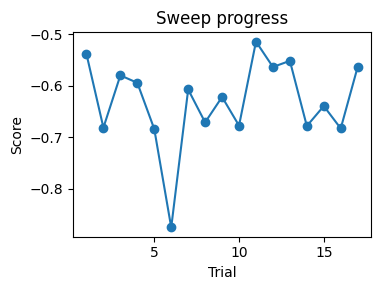

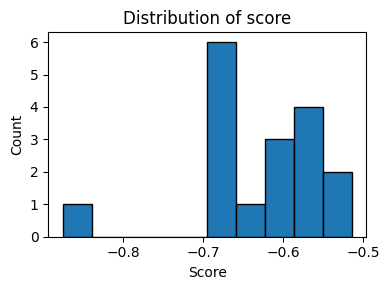

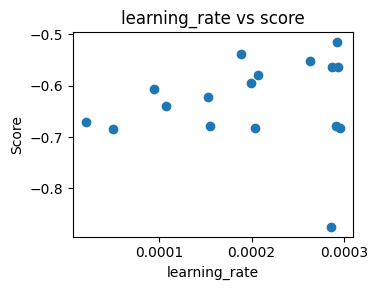

<Figure size 400x300 with 0 Axes>

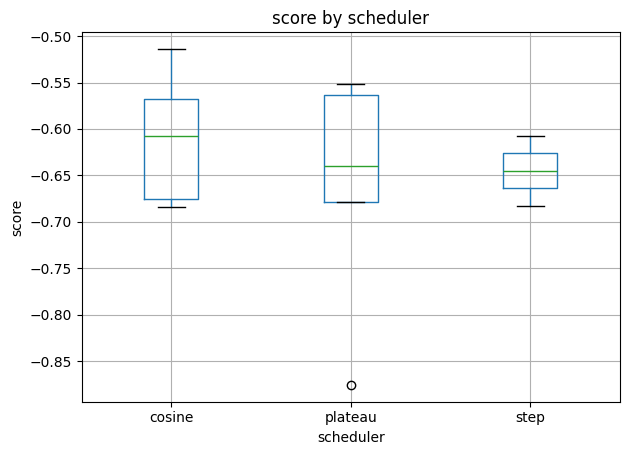

<Figure size 400x300 with 0 Axes>

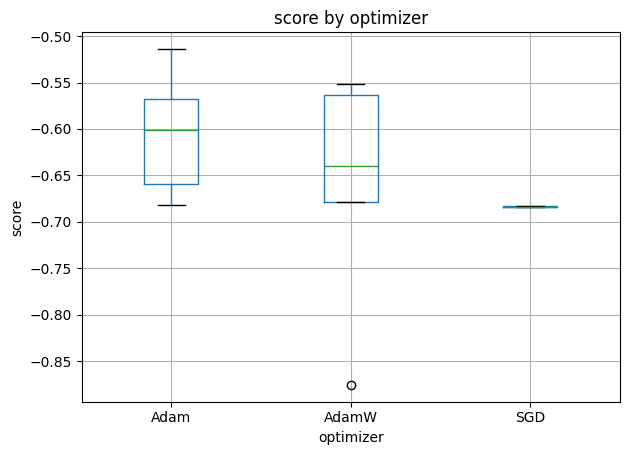

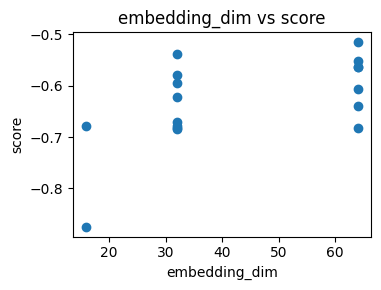

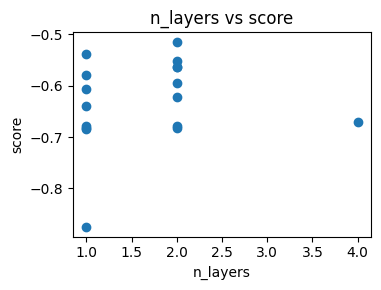

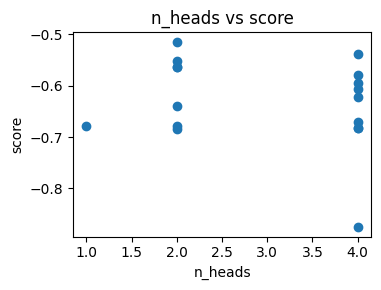

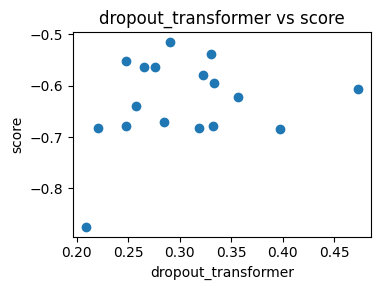

...

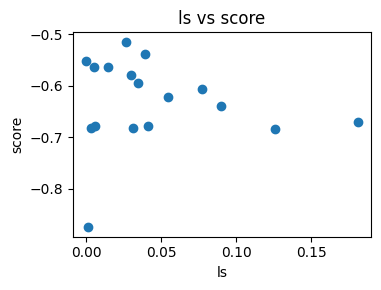

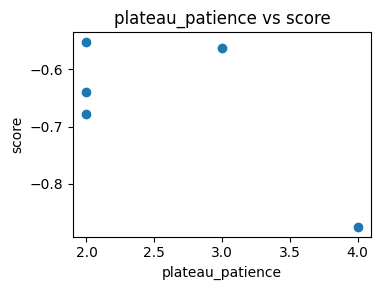

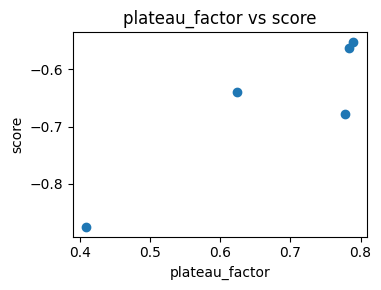

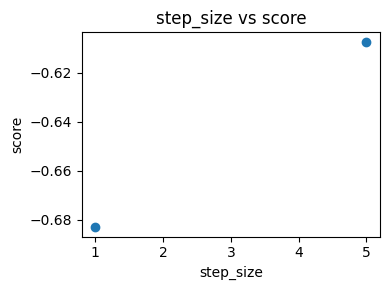

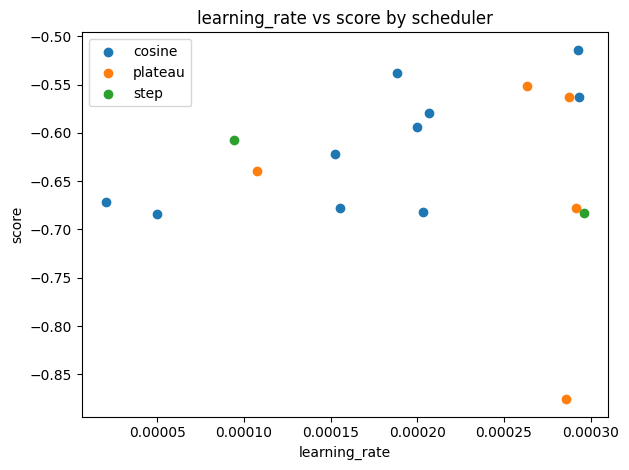

score                  1.000000
step_size              1.000000
plateau_factor         0.896627
embedding_dim          0.555984
w_pos                  0.294345
dropout_transformer    0.252077
n_layers               0.145445
learning_rate          0.095704
patience              -0.030673
T_0                   -0.072329
ls                    -0.085350
n_heads               -0.198776
dropout_classifier    -0.299300
weight_decay          -0.371521
batch_size            -0.577240
plateau_patience      -0.704647
Name: score, dtype: float64


In [17]:
import matplotlib.pyplot as plt
from itertools import cycle  
# ────────────────────────────────────────────────────────────
#  Core helpers – work purely on `trial_results`
# ────────────────────────────────────────────────────────────
def plot_trial_scores(trial_results, metric_key="score"):
    """Line chart: trial index → chosen metric (default = 'score')."""
    trials  = range(1, len(trial_results) + 1)
    scores  = [tr[metric_key] for tr in trial_results]

    plt.figure(figsize=(4, 3))
    plt.plot(trials, scores, marker="o")
    plt.xlabel("Trial")
    plt.ylabel(metric_key.capitalize())
    plt.title("Sweep progress")
    plt.tight_layout()
    plt.show()


def plot_param_vs_score(trial_results, param_name, metric_key="score"):
    """Scatter: a single hyper‑parameter value vs. metric."""
    xs, ys = [], []
    for tr in trial_results:
        # param may be missing in some trials → skip
        if param_name in tr["trial_param"]:
            xs.append(tr["trial_param"][param_name])
            ys.append(tr[metric_key])

    plt.figure(figsize=(4, 3))
    plt.scatter(xs, ys)
    plt.xlabel(param_name)
    plt.ylabel(metric_key.capitalize())
    plt.title(f"{param_name} vs {metric_key}")
    plt.tight_layout()
    plt.show()


def plot_score_hist(trial_results, metric_key="score", bins=10):
    """Histogram of the metric across all trials."""
    scores = [tr[metric_key] for tr in trial_results]

    plt.figure(figsize=(4, 3))
    plt.hist(scores, bins=bins, edgecolor="black")
    plt.xlabel(metric_key.capitalize())
    plt.ylabel("Count")
    plt.title(f"Distribution of {metric_key}")
    plt.tight_layout()
    plt.show()

plot_trial_scores(trial_results)                           # progress over trials
plot_score_hist(trial_results)                             # spread of scores
plot_param_vs_score(trial_results, "learning_rate") 

# ── convert list‑of‑dicts → DataFrame (easiest to slice/filter) ───────────
df = pd.DataFrame(
    [{**tr["trial_param"], "score": tr["score"]} for tr in trial_results]
)

# 1️⃣  Score distribution by *scheduler* (& optimiser) ‑‑ boxplots
def box_by_category(df, cat_col, metric="score"):
    plt.figure(figsize=(4, 3))
    df.boxplot(column=metric, by=cat_col)
    plt.suptitle(""); plt.title(f"{metric} by {cat_col}")
    plt.xlabel(cat_col); plt.ylabel(metric); plt.tight_layout(); plt.show()

box_by_category(df, "scheduler")
box_by_category(df, "optimizer")

# 2️⃣  Scatter of NUMERIC hyper‑params vs. score
numeric_cols = df.select_dtypes(include=[np.number]).columns.drop("score")

for col in numeric_cols:
    plt.figure(figsize=(4, 3))
    plt.scatter(df[col], df["score"])
    plt.xlabel(col); plt.ylabel("score")
    plt.title(f"{col} vs score"); plt.tight_layout(); plt.show()

# 3️⃣  Coloured scatter: learning rate vs. score, coloured by scheduler
def scatter_with_hue(df, x, y, hue):
    colors = cycle(plt.rcParams["axes.prop_cycle"].by_key()["color"])
    for h, c in zip(sorted(df[hue].unique()), colors):
        sub = df[df[hue] == h]
        plt.scatter(sub[x], sub[y], label=h, color=c)
    plt.xlabel(x); plt.ylabel(y); plt.title(f"{x} vs {y} by {hue}")
    plt.legend(); plt.tight_layout(); plt.show()

scatter_with_hue(df, "learning_rate", "score", "scheduler")

# (Optional) quick Pearson correlations of all numeric params with score
print(
    df[numeric_cols.tolist() + ["score"]].corr(numeric_only=True)["score"]
          .sort_values(ascending=False)
)

### Loads the best Model

In [33]:
ckpt = torch.load("final_epoch_transformer.pt", map_location="cpu", weights_only = False)
model.load_state_dict(ckpt["state_dict"])
model.to(device)
print("Checkpoint val-acc was", ckpt["val_acc"])
baseline_macro_f1 = ckpt["macro_f1"]
baseline_weights_f1 = ckpt["weighted_f1"]
baseline_val_acc = ckpt["val_acc"]
baseline_rep = ckpt["report"]
val_loader = ckpt['val_loader']
test_data = ckpt['test_data']

Checkpoint val-acc was 0.4355917289925209


### Visualising Attention Maps with Hooks

This section captures and visualises the attention weights from a transformer model using forward hooks.

**Workflow Overview:**

1. **Patch Self-Attention Layers:**
   - The `force_attn_weights()` function ensures all `MultiheadAttention` modules return full (non-averaged) attention weights.
   - Applied to every transformer layer in the model.

2. **Register Hooks to Save Outputs:**
   - `SaveOutput` class captures the `(B, H, N, N)` attention weight tensors during a forward pass.
   - Hooks are registered for each self-attention module.

3. **Run One Forward Pass:**
   - A single validation batch is passed through the model.
   - This triggers the hooks and populates the attention weights for later use.

4. **Visualisation Functions:**
   - `plot_attention()`: Plots a single attention map for a given layer, head, and sample index.
   - `plot_all_layers()`: Loops over all layers and plots attention maps (either averaged over heads or for head 0).
   - Attention maps show how much each input token attends to others, with axes labeled by feature names.

**Token Labels Used:**
- All `bucket_cols` and `impute_cols` (i.e., ratio and imputation indicators).
- Meta fields like `year`, `stock`, `industry`, etc., are included in labels but are masked/unused in some setups.

This is useful for interpreting which features the model pays attention to during inference.


Layer 0: torch.Size([32, 2, 33, 33])
Layer 1: torch.Size([32, 2, 33, 33])
Layer 2: torch.Size([32, 2, 33, 33])
Layer 3: torch.Size([32, 2, 33, 33])


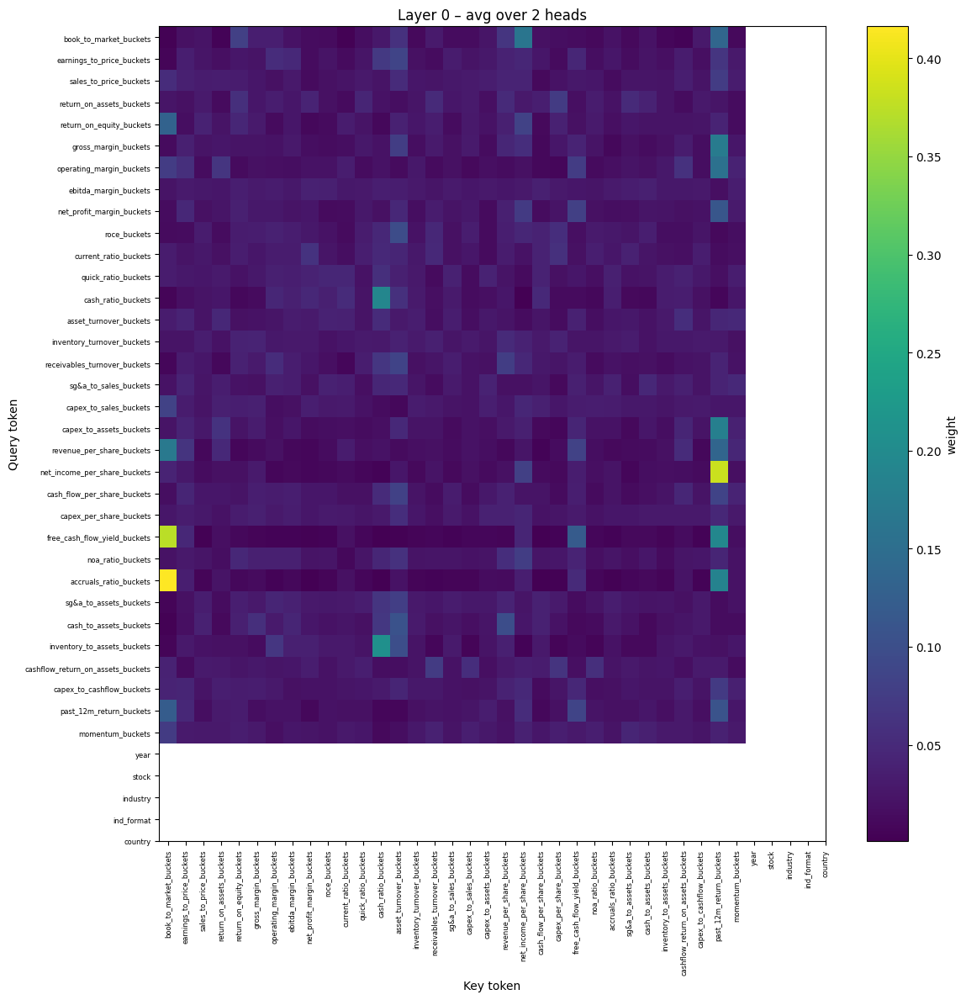

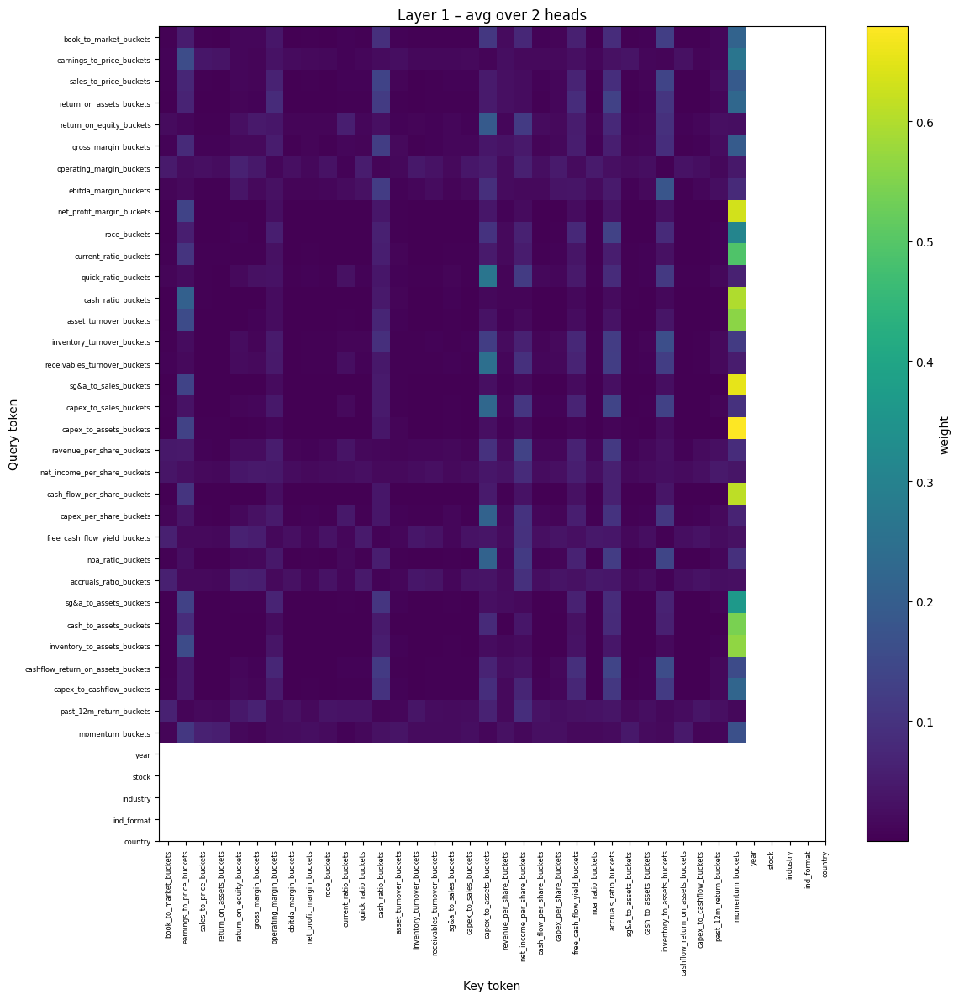

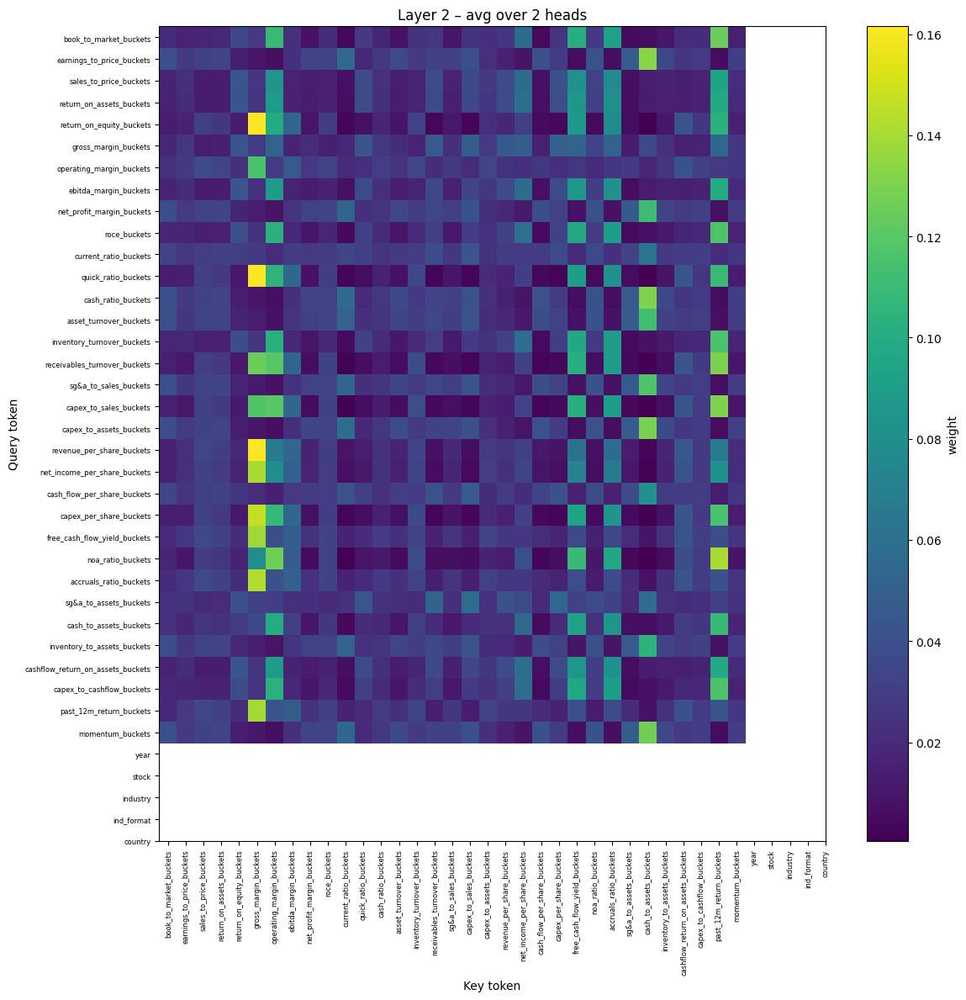

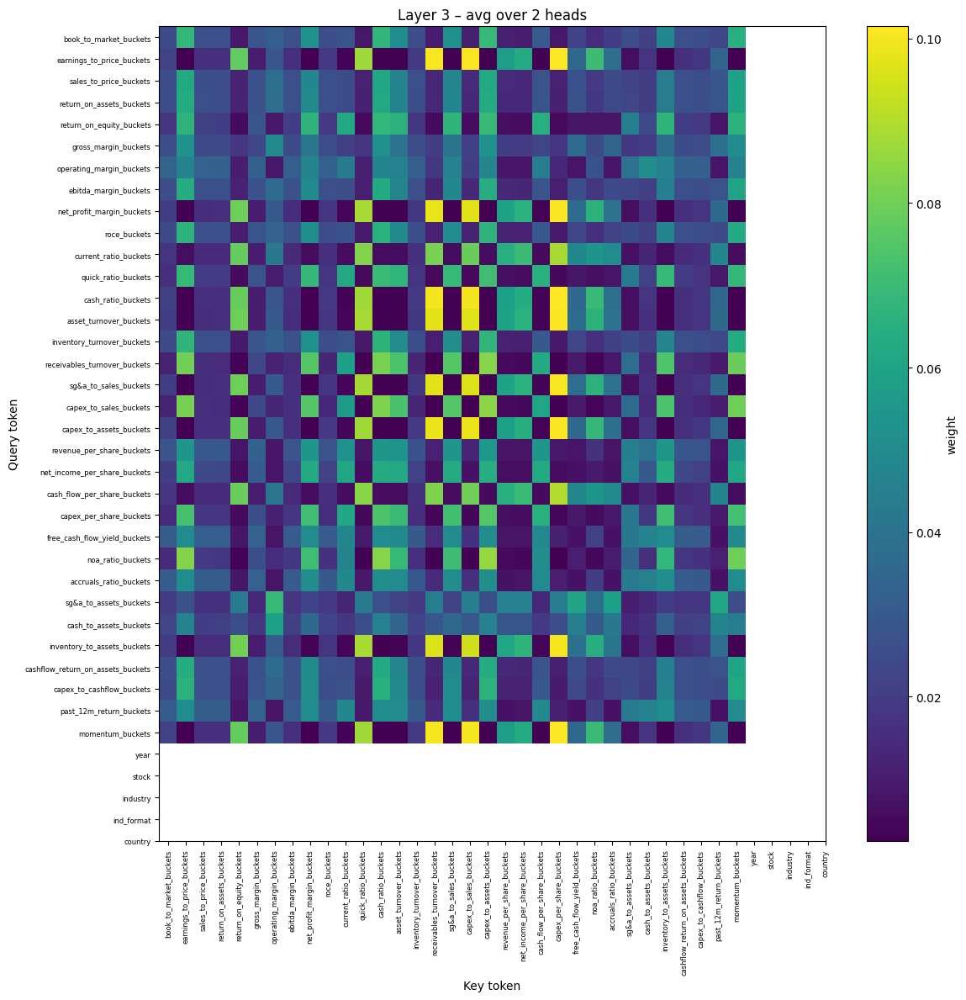

In [34]:
# ───────────────────────────────────────────────────────────────
# 0. Imports and fresh helpers
# ───────────────────────────────────────────────────────────────
import gc, types, torch, matplotlib.pyplot as plt
from torch.nn import MultiheadAttention
from functools import wraps

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ───────────────────────────────────────────────────────────────
# 1.  Hard-reset every self-attn → original implementation
#     then patch ONCE to return weights
# ───────────────────────────────────────────────────────────────
## Alwyas make sure that it outputs attention weights 
def force_attn_weights(mha: MultiheadAttention):
    """
    (a) restore mha.forward to torch's original,
    (b) wrap it so need_weights=True, but avoid duplicate *self / kwargs.
    """
    # (a) original class method bound to this instance
    mha.forward = types.MethodType(MultiheadAttention.forward, mha)

    # (b) add wrapper exactly once
    orig_forward = mha.forward
    @wraps(orig_forward)
    def wrapper(*args, **kw):
        kw["need_weights"] = True
        kw["average_attn_weights"] = False
        # args[0] is still `mha`; we drop it to avoid double-self
        return orig_forward(*args[1:], **kw)

    mha.forward = types.MethodType(wrapper, mha)

for lyr in model.transformer.layers:
    force_attn_weights(lyr.self_attn)

# ───────────────────────────────────────────────────────────────
# 2. Hook class to capture (B, H, N, N) tensors
# ───────────────────────────────────────────────────────────────
class SaveOutput:
    def __init__(self): self.outputs = []
    def __call__(self, _mod, _inp, out):
        attn_w = out[1] if isinstance(out, tuple) else None
        if attn_w is not None:
            self.outputs.append(attn_w.cpu())   # keep on CPU
    def clear(self): self.outputs.clear()

save_outputs, handles = [], []
for i, lyr in enumerate(model.transformer.layers):
    s = SaveOutput()
    save_outputs.append(s)
    handles.append(lyr.self_attn.register_forward_hook(s))

# ───────────────────────────────────────────────────────────────
# 3. Run ONE validation batch
# ───────────────────────────────────────────────────────────────
batch = next(iter(val_loader))
model.eval()
with torch.no_grad():
    _ = model(
        batch["features"].to(device),
        batch["year"].to(device),
        batch["fake_stock_id"].to(device),
        batch["industry"].to(device),
        batch["industry_format"].to(device),
        batch["country"].to(device)
    )

# sanity shapes
for i, s in enumerate(save_outputs):
    print(f"Layer {i}: {s.outputs[0].shape if s.outputs else None}")
# should print something like  torch.Size([B, heads, N, N])

# ───────────────────────────────────────────────────────────────
# 4. Plot helper
# ───────────────────────────────────────────────────────────────
token_labels = (
    bucket_cols + impute_cols +
    ["year", "stock", "industry", "ind_format", "country"]
)

def plot_attention(layer=0, head=0, sample=0):
    mat = save_outputs[layer].outputs[0][sample, head]   # (N,N)
    plt.figure(figsize=(24,24))
    plt.imshow(mat, aspect='auto')
    plt.title(f"Layer {layer} – Head {head}")
    plt.xticks(range(len(token_labels)), token_labels,
               rotation=90, fontsize=6)
    plt.yticks(range(len(token_labels)), token_labels,
               fontsize=6)
    
    plt.xlabel("Key token"); plt.ylabel("Query token")
    plt.colorbar(label="weight"); plt.tight_layout(); plt.show()

# example:
#plot_attention(0, 0) (layer, head)
#plot_attention(1,1)

def plot_all_layers(save_outputs, token_labels, sample_idx=0, avg_heads=True):
    """
    Plot a heat-map for every Transformer layer.

    Args
    ----
    save_outputs : list[SaveOutput]
        The hook objects populated during the forward pass.
    token_labels : list[str]
        Labels for the sequence positions (x/y axis).
    sample_idx : int
        Which item in the batch to visualise.
    avg_heads : bool
        True  → average over heads.
        False → plot head 0 of each layer.
    """
    n_layers = len(save_outputs)
    seq_len  = len(token_labels)

    for layer_idx, s in enumerate(save_outputs):
        if not s.outputs:
            print(f"Layer {layer_idx}: no attention captured")
            continue

        attn = s.outputs[0]                      # shape (B, H, N, N)
        if avg_heads:
            mat = attn[sample_idx].mean(0)       # (N, N)
            title = f"Layer {layer_idx} – avg over {attn.shape[1]} heads"
        else:
            mat = attn[sample_idx, 0]            # head 0
            title = f"Layer {layer_idx} – head 0"

        plt.figure(figsize=(12, 12))
        plt.imshow(mat, aspect='auto')
        plt.title(title)
        plt.xticks(range(seq_len), token_labels, rotation=90, fontsize=6)
        plt.yticks(range(seq_len), token_labels, fontsize=6)
        plt.xlabel("Key token")
        plt.ylabel("Query token")
        plt.colorbar(label="weight")
        plt.tight_layout()
        plt.show()

# ---- call it ---------------------------------------------------------------
token_labels = (
    bucket_cols + impute_cols +
    ["year", "stock", "industry", "ind_format", "country"] # But i dont use these anymore 
)

plot_all_layers(save_outputs, token_labels, sample_idx=0, avg_heads=True)

### Same as before but now in function form so that it can be called again

Layer 0: torch.Size([32, 2, 33, 33])
Layer 1: torch.Size([32, 2, 33, 33])
Layer 2: torch.Size([32, 2, 33, 33])
Layer 3: torch.Size([32, 2, 33, 33])


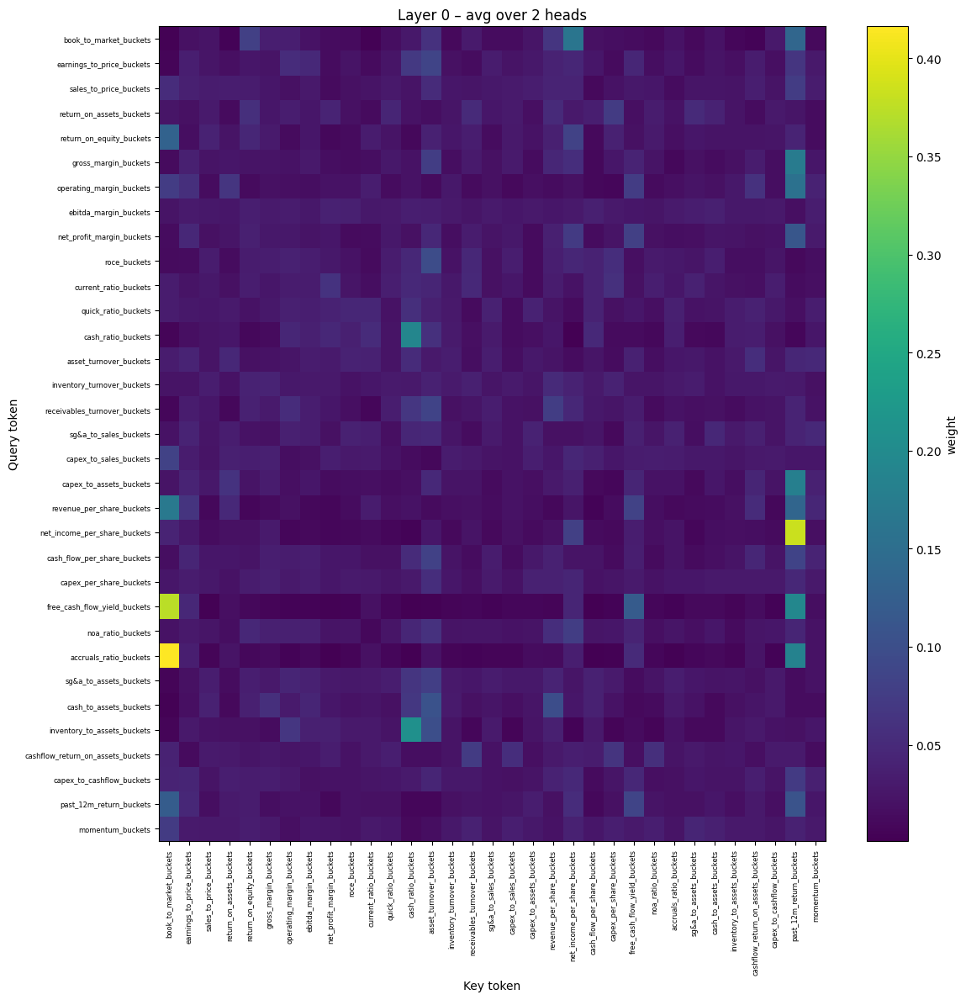

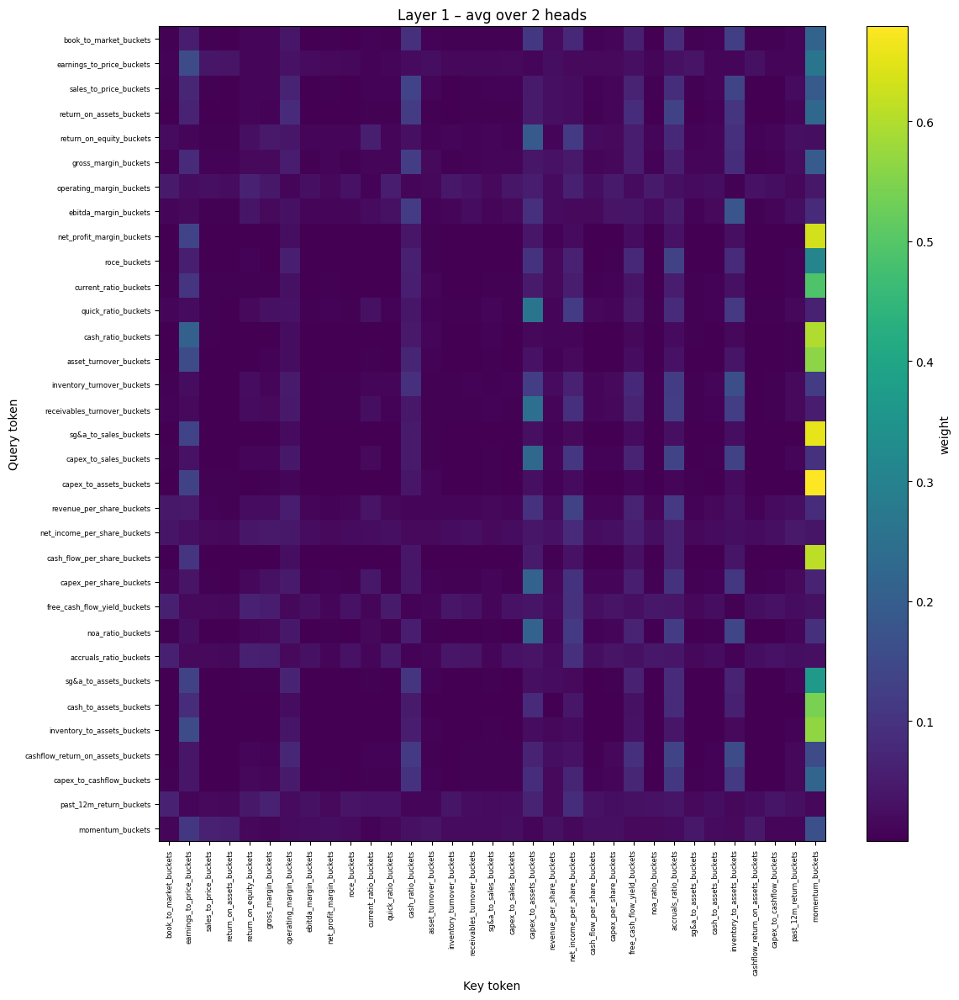

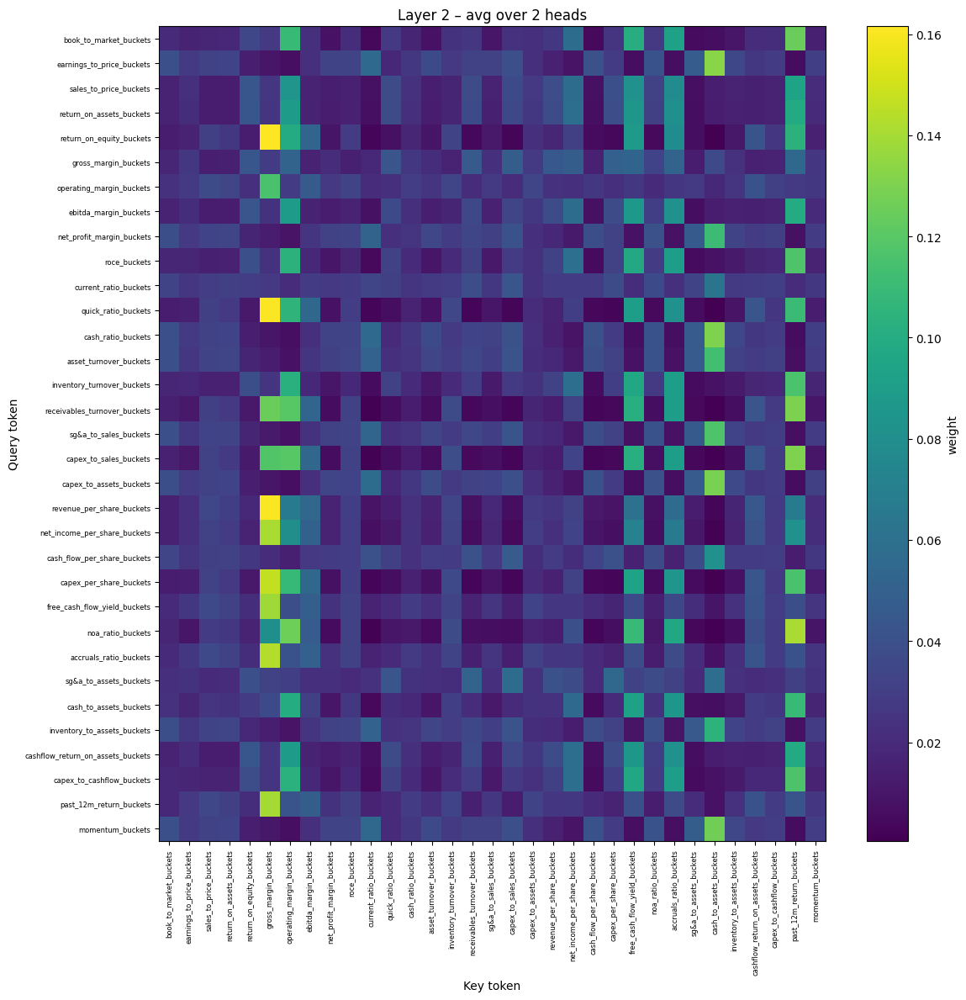

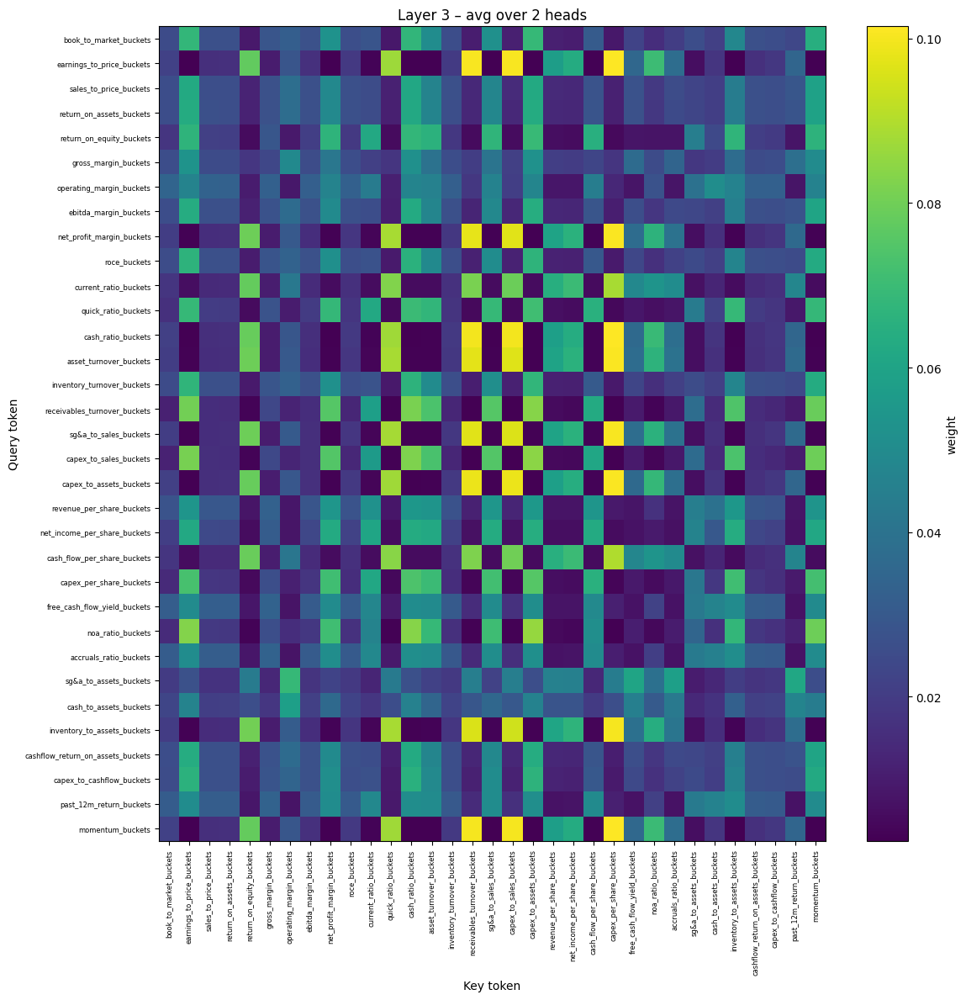

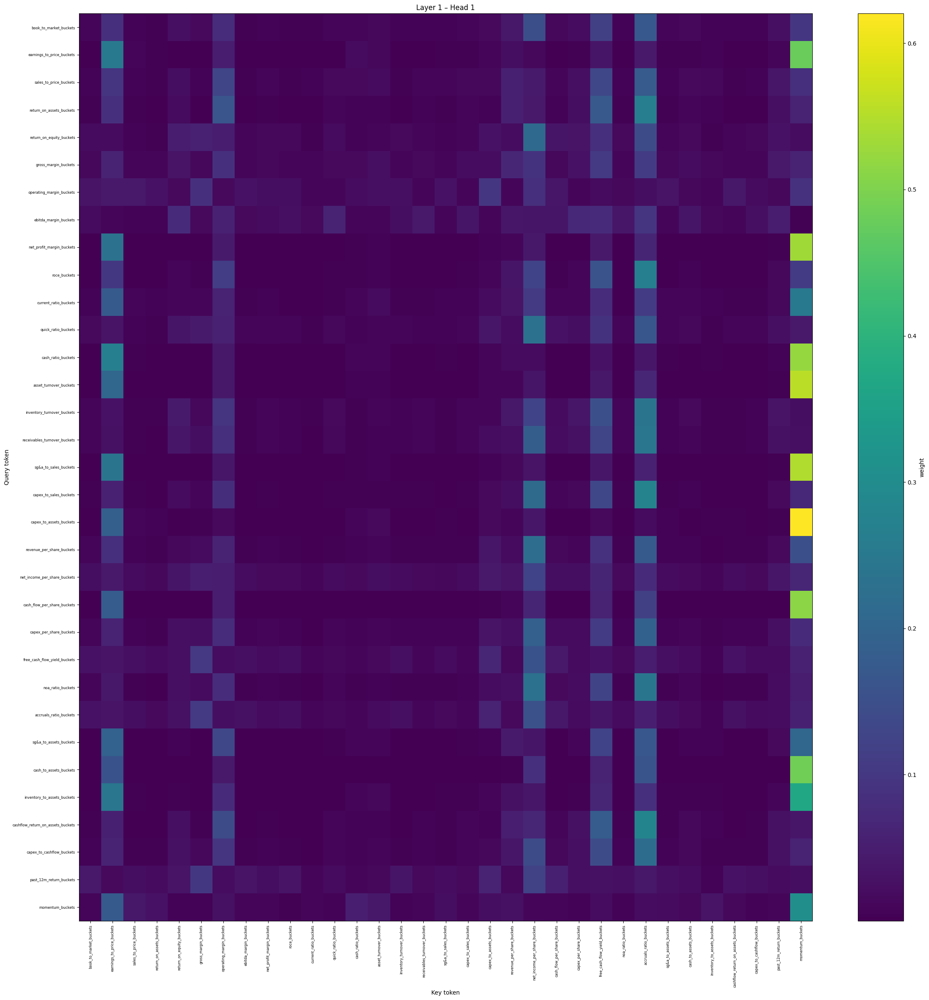

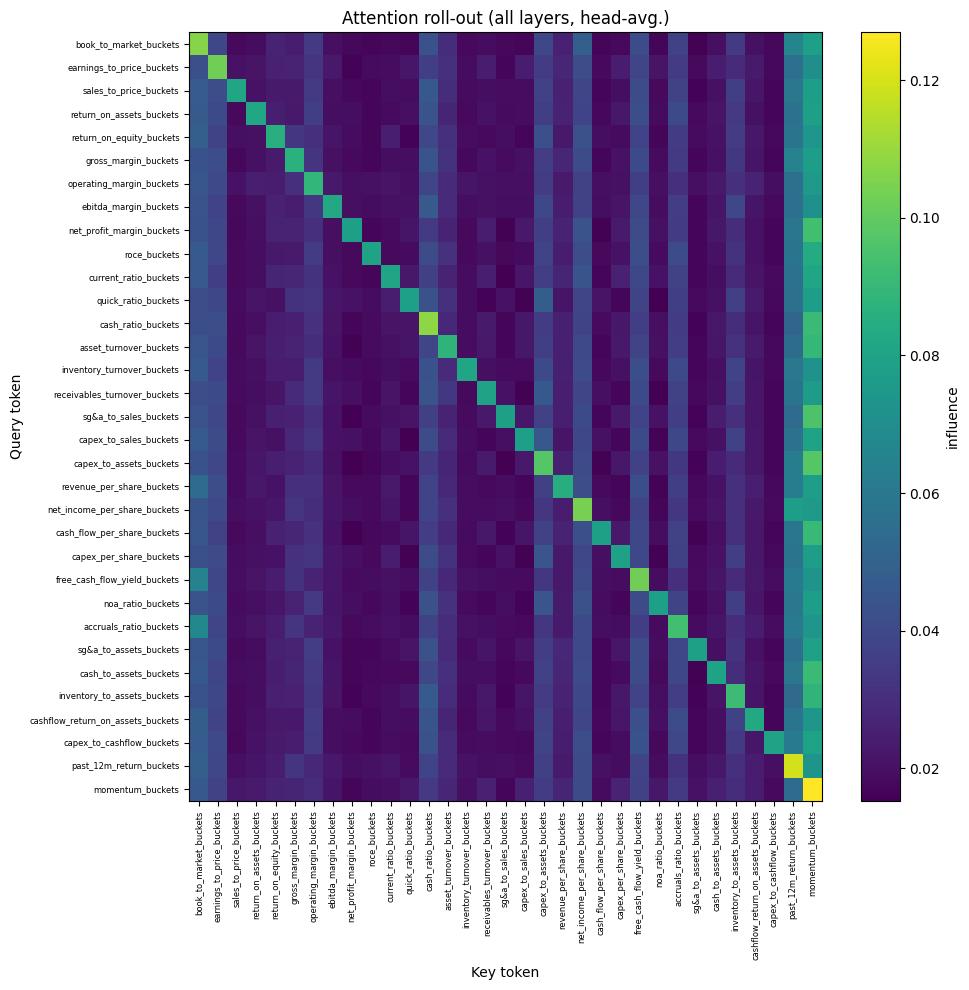

In [35]:
# ---- attention_utils.py (paste in one cell) -------------------
import types, torch, matplotlib.pyplot as plt
from functools import wraps
from torch.nn import MultiheadAttention

def force_attn_weights(mha: MultiheadAttention):
    mha.forward = types.MethodType(MultiheadAttention.forward, mha)
    orig = mha.forward
    @wraps(orig)
    def wrapper(*args, **kw):
        kw["need_weights"] = True
        kw["average_attn_weights"] = False
        return orig(*args[1:], **kw)
    mha.forward = types.MethodType(wrapper, mha)

class SaveOutput:
    def __init__(self): self.outputs = []
    def __call__(self, _m, _i, out):
        attn = out[1] if isinstance(out, tuple) else None
        if attn is not None: self.outputs.append(attn.detach().cpu())
    def clear(self): self.outputs.clear()

def attach_attention_capture(model):
    save_outputs, handles = [], []
    for lyr in model.transformer.layers:
        force_attn_weights(lyr.self_attn)
        s = SaveOutput()
        save_outputs.append(s)
        handles.append(lyr.self_attn.register_forward_hook(s))
    return save_outputs, handles

def remove_attention_capture(handles):
    for h in handles: h.remove()

@torch.inference_mode()
def run_one_validation_batch(model, loader, device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    batch = next(iter(loader))
    _ = model(
        batch["features"].to(device),
        batch["year"].to(device),
        batch["fake_stock_id"].to(device),
        batch["industry"].to(device),
        batch["industry_format"].to(device),
        batch["country"].to(device),
    )
    return batch

def print_attn_shapes(save_outputs):
    for i, s in enumerate(save_outputs):
        shape = s.outputs[0].shape if s.outputs else None
        print(f"Layer {i}: {shape}")  # expect (B, H, N, N)

def plot_attention_main(save_outputs, token_labels, layer=0, head=0, sample=0, figsize=(24,24)):
    mat = save_outputs[layer].outputs[0][sample, head]
    plt.figure(figsize=figsize); plt.imshow(mat, aspect="auto")
    plt.title(f"Layer {layer} – Head {head}")
    plt.xticks(range(len(token_labels)), token_labels, rotation=90, fontsize=6)
    plt.yticks(range(len(token_labels)), token_labels, fontsize=6)
    plt.xlabel("Key token"); plt.ylabel("Query token")
    plt.colorbar(label="weight"); plt.tight_layout(); plt.show()

def plot_all_layers(save_outputs, token_labels, sample_idx=0, avg_heads=True, figsize=(12,12)):
    for layer_idx, s in enumerate(save_outputs):
        if not s.outputs:
            print(f"Layer {layer_idx}: no attention captured"); continue
        A = s.outputs[0]  # (B,H,N,N)
        mat = A[sample_idx].mean(0) if avg_heads else A[sample_idx,0]
        title = (f"Layer {layer_idx} – avg over {A.shape[1]} heads"
                 if avg_heads else f"Layer {layer_idx} – head 0")
        plt.figure(figsize=figsize); plt.imshow(mat, aspect="auto"); plt.title(title)
        plt.xticks(range(len(token_labels)), token_labels, rotation=90, fontsize=6)
        plt.yticks(range(len(token_labels)), token_labels, fontsize=6)
        plt.xlabel("Key token"); plt.ylabel("Query token")
        plt.colorbar(label="weight"); plt.tight_layout(); plt.show()

def attention_rollout(save_outputs, sample_idx=0):
    first = next(s for s in save_outputs if s.outputs)
    N = first.outputs[0].shape[-1]
    R = torch.eye(N)
    for s in save_outputs:
        if not s.outputs: continue
        A = s.outputs[0][sample_idx].mean(0)      # (N,N)
        A = A + torch.eye(N)
        A = A / A.sum(-1, keepdim=True)           # row-normalize
        R = A @ R
    return R

def plot_attention_rollout(save_outputs, token_labels, sample_idx=0, figsize=(10,10)):
    R = attention_rollout(save_outputs, sample_idx)
    N = R.shape[0]
    if len(token_labels) < N:
        token_labels = token_labels + [f"<unk_{i}>" for i in range(len(token_labels), N)]
    elif len(token_labels) > N:
        token_labels = token_labels[:N]
    plt.figure(figsize=figsize); plt.imshow(R, aspect="auto")
    plt.xticks(range(N), token_labels, rotation=90, fontsize=6)
    plt.yticks(range(N), token_labels, fontsize=6)
    plt.title("Attention roll‑out (all layers, head‑avg.)")
    plt.xlabel("Key token"); plt.ylabel("Query token")
    plt.colorbar(label="influence"); plt.tight_layout(); plt.show()


save_outputs, handles = attach_attention_capture(model)
_ = run_one_validation_batch(model, val_loader)

# 2) Sanity check
print_attn_shapes(save_outputs)  # expect (B, H, N, N) per layer

# 3) Plots
token_labels = bucket_cols + impute_cols  # (you masked metadata if there is any)
plot_all_layers(save_outputs, token_labels, sample_idx=0, avg_heads=True)
plot_attention_main(save_outputs, token_labels, layer=1, head=1, sample=0)
plot_attention_rollout(save_outputs, token_labels, sample_idx=0)

# 4) When done
remove_attention_capture(handles)

### Expanding Window Evaluation

This section implements an expanding window backtesting procedure using the `expanding_window()` function.

**Purpose:**  
To evaluate the model's performance over time in a realistic forecasting setup by gradually increasing the training window.

**Logic:**
- For each year `i` from `start_year` to 2022:
  - Train on data from 2006 to `i-1`
  - Validate on year `i`
  - Test on year `i+1`
- The function `giga_func_2(train_end, val_year, test_year)` is used to generate the datasets.
- Meta variables are turned off (set to 0), and only ratio bucket features are used.
- A `BucketTransformer_mine` model is initialized with fixed hyperparameters.
- The model is trained using the `train_model_mine` function with consistent configuration across iterations.
- Evaluation metrics and model results (e.g. best epoch, F1 scores, losses) are stored for each iteration in `expanding_window_res`.

This structure enables longitudinal evaluation and robustness testing across temporal splits.


In [16]:
# Expanding Window
expanding_window_res = []
def expanding_window(start_year):
    for i in range(start_year,2023):
        # Sets train from start_year to i-1, then val is i and testing is i+1
        train, val, test = giga_func_2(i, i, i+1)
        
        # Similar to what we did before
        train_data = train
        val_data = val
        test_data = test
        bucket_cols = [col for col in train_data.columns if col.endswith('_buckets') and col != 'return_12m_forward_label']
        impute_cols = [col for col in train_data.columns if col.endswith('_was_imputed') and col != 'return_12m_forward_label']
        impute_cols = []
        bucket_sizes = [11] * len(bucket_cols) + [2] * len(impute_cols)
        num_of_stock = 0
        num_of_years = 0
        num_of_industry = 0
        num_of_industry_format = 0
        num_of_country = 0 
        
        meta_cols = [
            'fake_stock_id_meta',
            'month_meta',
            'industry_id_meta',
            'industry_format_id_meta',
            'country_id_meta'
        ]
        
        for col in meta_cols:
            train_data[col] = 0
            val_data[col] = 0
            test_data[col] = 0
    
        model = BucketTransformer_mine(
                                       bucket_sizes=bucket_sizes, 
                                       embedding_dim=32, #32 #16
                                       n_heads=2,# 2 1
                                       n_layers=4,# 21
                                       dropout_transformer=0.23525280263751489, 
                                       number_of_classes = 3, 
                                       dropout_classifier = 0.17796988235965303,
                                       start_year = 2006,
                                       end_year = 2025,
                                       activation = 'relu',
                                       num_years=num_of_years,
                                       num_of_stock = num_of_stock,
                                       num_of_industry = num_of_industry,
                                       num_of_industry_format = num_of_industry_format,
                                       num_of_country = num_of_country,
                                       ratio_cols = bucket_cols,
                                       impute_cols = impute_cols) 
        
        
        results = train_model_mine(
                                model, 
                                train_data,
                                val_data,
                                test_data,
                                epochs=15, #10 
                                batch_size=32, #16
                                learning_rate= 0.00017126110830893184, #  0.0001
                                weight_decay = 3.900297055579936e-06, 
                                weights_for_criterion = [1.0, 1.2121965144904125, 1.2 * 1.2121965144904125],
                                num_of_classes =3,
                                patience = 10, # Depends on epochs
                                T_0=3, # For cosine
                                T_mult=2, # For cosine
                                optimizer_name='Adam',
                                scheduler_name='plateau', 
                                plateau_patience=5,
                                plateau_factor=0.7944832528930469, 
                                step_size = 5,
                                gamma = 0.1,
                                label_smoothing = 0.003541588306763793,
                                trial=None,
                                model_save = False) 
        
        expanding_window_res.append({
            'train_losses': results['train_losses'],
            'val_losses': results['val_losses'],
            'val_accuracies': results['val_accuracies'],
            'class_2_f1_scores': results['class_2_f1_scores'],
            'best_class_2_f1': results['best_class_2_f1'],
            'best_class_2_precision': results['best_class_2_precision'],
            'best_epoch': results['best_epoch'],
            'train_years': list(range(2006, i)),  # assuming training starts from 2006
            'val_year': i,
            'test_year': i + 1
        })

# Define Expanind window starting year
expanding_window(2015)
print(expanding_window_res)
            

(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (63317, 38), Val: (9255, 38), Test: (9535, 38)
After imputation - Train: (63317, 38), Val: (9255, 38), Test: (9535, 38)
Training Dataset: 39.31%
Validation Dataset: 5.75%
Test Dataset: 5.92%


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,3,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,6,2,4,8,7,8,1


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
19,14,1,2015,1855,4,0,1,0,0,0,...,7,5,0,1,2,2,9,0,0,2
147,12,2,2015,7041,1,0,3,0,0,0,...,8,8,7,3,6,2,8,4,4,1
187,14,8,2015,8544,0,0,0,0,0,0,...,1,1,3,4,1,8,6,2,1,1
300,21,1,2015,17287,0,0,0,0,0,0,...,7,1,0,1,1,8,6,9,9,0
325,21,1,2015,17315,2,0,0,0,0,0,...,9,1,1,3,1,6,5,0,0,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
20,14,1,2016,1855,3,0,0,0,0,0,...,6,6,0,2,1,1,0,6,7,1
46,14,1,2016,2162,5,0,2,0,0,0,...,8,5,5,0,2,1,0,0,0,1
148,12,2,2016,7041,1,0,2,0,0,0,...,8,0,8,6,5,9,2,3,3,1
188,14,8,2016,8544,0,0,0,0,0,0,...,1,2,3,4,1,7,7,3,2,1
301,21,1,2016,17287,0,0,1,0,0,0,...,5,3,0,1,1,8,6,0,0,0


Final shapes - Train: (63317, 72), Val: (9255, 72), Test: (9535, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
Validation years: [2015]
Test years: [2016]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
Validating on year: [2015]
Testing on year: [2016]
Training samples: 63,317
Validation samples: 9,255
Testing samples: 9,535

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:15<03:31, 15.09s/it]

Epoch 0 Avg Confidence: 0.3771
Best Model now for class 2 f1 score: 0.5261565411258858 and Precision = 0.3569962182603998
Epoch   0: Train Loss 1.0929, Val Loss 1.0722, Val Acc 0.3570
Epoch   0: Train Loss 1.0929, Val Loss 1.0722, Val Acc 0.3570


Epochs:  13%|██████████▏                                                                 | 2/15 [00:29<03:14, 14.98s/it]

Epoch 1 Avg Confidence: 0.3955
Epoch   1: Train Loss 1.0827, Val Loss 1.0605, Val Acc 0.3714


Epochs:  20%|███████████████▏                                                            | 3/15 [00:44<02:59, 14.95s/it]

Epoch 2 Avg Confidence: 0.4123
Epoch   2: Train Loss 1.0726, Val Loss 1.0483, Val Acc 0.4198


Epochs:  27%|████████████████████▎                                                       | 4/15 [00:59<02:44, 14.94s/it]

Epoch 3 Avg Confidence: 0.4370
Epoch   3: Train Loss 1.0689, Val Loss 1.0529, Val Acc 0.3836


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [01:14<02:29, 14.92s/it]

Epoch 4 Avg Confidence: 0.4114
Epoch   4: Train Loss 1.0664, Val Loss 1.0596, Val Acc 0.4151


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [01:29<02:14, 14.92s/it]

Epoch 5 Avg Confidence: 0.4216
Epoch   5: Train Loss 1.0645, Val Loss 1.0703, Val Acc 0.3939


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [01:44<01:59, 14.91s/it]

Epoch 6 Avg Confidence: 0.4063
Epoch   6: Train Loss 1.0638, Val Loss 1.0827, Val Acc 0.3641


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [01:59<01:44, 14.91s/it]

Epoch 7 Avg Confidence: 0.4015
Epoch   7: Train Loss 1.0624, Val Loss 1.0671, Val Acc 0.3959


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [02:14<01:29, 14.91s/it]

Epoch 8 Avg Confidence: 0.4352
Epoch   8: Train Loss 1.0616, Val Loss 1.0609, Val Acc 0.4100


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [02:29<01:14, 14.92s/it]

Epoch 9 Avg Confidence: 0.4318
Epoch   9: Train Loss 1.0597, Val Loss 1.0624, Val Acc 0.4078


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [02:44<00:59, 14.91s/it]

Epoch 10 Avg Confidence: 0.4377
Epoch  10: Train Loss 1.0592, Val Loss 1.0595, Val Acc 0.4122
Epoch  10: Train Loss 1.0592, Val Loss 1.0595, Val Acc 0.4122


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [02:59<00:44, 14.90s/it]

Epoch 11 Avg Confidence: 0.4462
Epoch  11: Train Loss 1.0587, Val Loss 1.0497, Val Acc 0.4069


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [03:13<00:29, 14.90s/it]

Epoch 12 Avg Confidence: 0.4411
Epoch  12: Train Loss 1.0578, Val Loss 1.0570, Val Acc 0.4165


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [03:28<00:14, 14.90s/it]

Epoch 13 Avg Confidence: 0.4412
Epoch  13: Train Loss 1.0580, Val Loss 1.0474, Val Acc 0.4236


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [03:43<00:00, 14.92s/it]

Epoch 14 Avg Confidence: 0.4279
Epoch  14: Train Loss 1.0568, Val Loss 1.0568, Val Acc 0.4111
Epoch  14: Train Loss 1.0568, Val Loss 1.0568, Val Acc 0.4111

FINAL RESULTS
Best validation accuracy: 0.4236
Final validation accuracy: 0.4111

Validation Confusion Matrix:
[[ 674  422  754]
 [ 895 1417 1789]
 [ 678  912 1714]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 36.4% accuracy (674/1850 correct)
Class 1: 34.6% accuracy (1417/4101 correct)
Class 2: 51.9% accuracy (1714/3304 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.36      0.33      1850
     Class 1       0.52      0.35      0.41      4101
     Class 2       0.40      0.52      0.45      3304

    accuracy                           0.41      9255
   macro avg       0.41      0.41      0.40      9255
weighted avg       0.43      0.41      0.41      9255



Confusion Matrix (TESTING ):
[[1170 1058  958]
 [ 852 1755  942]
 [ 743 1095  962]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.42      0.37      0.39      3186
     Class 1       0.45      0.49      0.47      3549
     Class 2       0.34      0.34      0.34      2800

    accuracy                           0.41      9535
   macro avg       0.40      0.40      0.40      9535
weighted avg       0.41      0.41      0.41      9535


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      1850
     Class 1       0.00      0.00      0.00      4101
     Class 2       0.36      1.00      0.53      3304

    accuracy                           0.36      9255
   macro avg       0.12      0.33      0.18      9255
weighted avg       0.13      0.36      0.19      9255


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 3186]
 [   0    0 3549]
 [   0    0 2800]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      3186
     Class 1       0.00      0.00      0.00      3549
     Class 2       0.29      1.00      0.45      2800

    accuracy                           0.29      9535
   macro avg       0.10      0.33      0.15      9535
weighted avg       0.09      0.29      0.13      9535

Now voer ehrererer


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (72572, 38), Val: (9535, 38), Test: (9863, 38)
After imputation - Train: (72572, 38), Val: (9535, 38), Test: (9863, 38)
Training Dataset: 45.06%
Validation Dataset: 5.92%
Test Dataset: 6.12%


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,3,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,1


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
20,14,1,2016,1855,3,0,0,0,0,0,...,6,6,0,2,1,1,0,7,7,1
46,14,1,2016,2162,5,0,2,0,0,0,...,8,5,5,0,2,1,0,0,0,1
148,12,2,2016,7041,1,0,2,0,0,0,...,8,0,7,6,5,9,2,4,3,1
188,14,8,2016,8544,0,0,0,0,0,0,...,1,2,3,4,1,7,7,3,2,1
301,21,1,2016,17287,0,0,1,0,0,0,...,5,3,0,1,1,8,6,0,0,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
21,14,1,2017,1855,2,0,0,0,0,0,...,6,3,0,1,2,2,9,3,4,0
47,14,1,2017,2162,6,0,2,0,0,0,...,8,6,4,0,4,2,9,4,5,0
149,12,2,2017,7041,1,0,3,0,0,0,...,7,6,7,6,6,3,2,4,4,2
189,14,8,2017,8544,0,0,0,0,0,0,...,1,1,6,3,1,7,6,4,4,0
302,21,1,2017,17287,0,0,1,0,0,0,...,3,1,0,1,2,4,8,0,0,2


Final shapes - Train: (72572, 72), Val: (9535, 72), Test: (9863, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015]
Validation years: [2016]
Test years: [2017]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015]
Validating on year: [2016]
Testing on year: [2017]
Training samples: 72,572
Validation samples: 9,535
Testing samples: 9,863

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:17<03:58, 17.03s/it]

Epoch 0 Avg Confidence: 0.3789
Epoch   0: Train Loss 1.0898, Val Loss 1.0978, Val Acc 0.2903
Epoch   0: Train Loss 1.0898, Val Loss 1.0978, Val Acc 0.2903


Epochs:  13%|██████████▏                                                                 | 2/15 [00:34<03:41, 17.04s/it]

Epoch 1 Avg Confidence: 0.4072
Best Model now for class 2 f1 score: 0.4377518557794274 and Precision = 0.3098168718102672
Epoch   1: Train Loss 1.0826, Val Loss 1.0957, Val Acc 0.3173


Epochs:  20%|███████████████▏                                                            | 3/15 [00:51<03:24, 17.04s/it]

Epoch 2 Avg Confidence: 0.3753
Epoch   2: Train Loss 1.0769, Val Loss 1.0876, Val Acc 0.3461


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:08<03:07, 17.05s/it]

Epoch 3 Avg Confidence: 0.3930
Epoch   3: Train Loss 1.0742, Val Loss 1.0884, Val Acc 0.3266


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [01:25<02:50, 17.05s/it]

Epoch 4 Avg Confidence: 0.3854
Epoch   4: Train Loss 1.0723, Val Loss 1.0861, Val Acc 0.3393


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [01:42<02:33, 17.05s/it]

Epoch 5 Avg Confidence: 0.3790
Epoch   5: Train Loss 1.0704, Val Loss 1.0839, Val Acc 0.3589


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [01:59<02:16, 17.05s/it]

Epoch 6 Avg Confidence: 0.3796
Epoch   6: Train Loss 1.0689, Val Loss 1.0804, Val Acc 0.4049


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [02:16<01:59, 17.05s/it]

Epoch 7 Avg Confidence: 0.3830
Epoch   7: Train Loss 1.0681, Val Loss 1.0809, Val Acc 0.3607


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [02:33<01:42, 17.05s/it]

Epoch 8 Avg Confidence: 0.3904
Epoch   8: Train Loss 1.0672, Val Loss 1.0824, Val Acc 0.3481


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [02:50<01:25, 17.04s/it]

Epoch 9 Avg Confidence: 0.4205
Best Model now for class 2 f1 score: 0.43889695210449925 and Precision = 0.36681222707423583
Epoch   9: Train Loss 1.0660, Val Loss 1.0896, Val Acc 0.3884


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [03:07<01:08, 17.05s/it]

Epoch 10 Avg Confidence: 0.3980
Epoch  10: Train Loss 1.0649, Val Loss 1.0809, Val Acc 0.4009
Epoch  10: Train Loss 1.0649, Val Loss 1.0809, Val Acc 0.4009


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [03:24<00:51, 17.05s/it]

Epoch 11 Avg Confidence: 0.4020
Epoch  11: Train Loss 1.0641, Val Loss 1.0801, Val Acc 0.4080


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [03:41<00:34, 17.05s/it]

Epoch 12 Avg Confidence: 0.3972
Epoch  12: Train Loss 1.0637, Val Loss 1.0821, Val Acc 0.3963


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [03:58<00:17, 17.04s/it]

Epoch 13 Avg Confidence: 0.3970
Epoch  13: Train Loss 1.0624, Val Loss 1.0821, Val Acc 0.3830


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [04:15<00:00, 17.04s/it]

Epoch 14 Avg Confidence: 0.3988
Epoch  14: Train Loss 1.0622, Val Loss 1.0787, Val Acc 0.4067
Epoch  14: Train Loss 1.0622, Val Loss 1.0787, Val Acc 0.4067

FINAL RESULTS
Best validation accuracy: 0.4080
Final validation accuracy: 0.4067

Validation Confusion Matrix:
[[ 779 1849  728]
 [ 442 2186  783]
 [ 393 1462  913]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 23.2% accuracy (779/3356 correct)
Class 1: 64.1% accuracy (2186/3411 correct)
Class 2: 33.0% accuracy (913/2768 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.48      0.23      0.31      3356
     Class 1       0.40      0.64      0.49      3411
     Class 2       0.38      0.33      0.35      2768

    accuracy                           0.41      9535
   macro avg       0.42      0.40      0.39      9535
weighted avg       0.42      0.41      0.39      9535



Confusion Matrix (TESTING ):
[[ 911 1819 1313]
 [ 573 2380 1240]
 [ 237  836  554]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.53      0.23      0.32      4043
     Class 1       0.47      0.57      0.52      4193
     Class 2       0.18      0.34      0.23      1627

    accuracy                           0.39      9863
   macro avg       0.39      0.38      0.36      9863
weighted avg       0.45      0.39      0.39      9863


BEST MODEL EVALUATION (from epoch 9)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.47      0.21      0.29      3356
     Class 1       0.38      0.44      0.41      3411
     Class 2       0.37      0.55      0.44      2768

    accuracy                           0.39      9535
   macro avg       0.41      0.40      0.38      9535
weighted avg       0.41      0.39      0.37      9535


Best Model Confusion Matri

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,1


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
21,14,1,2017,1855,2,0,0,0,0,0,...,6,3,0,1,2,2,9,3,4,0
47,14,1,2017,2162,6,0,2,0,0,0,...,8,6,4,0,4,2,9,4,5,0
149,12,2,2017,7041,1,0,3,0,0,0,...,7,6,7,6,6,3,2,4,4,2
189,14,8,2017,8544,0,0,0,0,0,0,...,1,1,6,3,1,7,6,4,4,0
302,21,1,2017,17287,0,0,1,0,0,0,...,3,1,0,1,2,4,8,0,0,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
22,14,1,2018,1855,3,0,1,0,0,0,...,5,3,0,2,2,3,8,2,1,0
48,14,1,2018,2162,8,0,2,0,0,0,...,8,5,3,2,1,4,2,2,3,1
150,12,2,2018,7041,0,0,1,0,0,0,...,7,9,7,6,5,1,1,9,9,0
190,14,8,2018,8544,0,0,0,0,0,0,...,1,1,6,5,1,7,7,2,2,1
303,21,1,2018,17287,0,0,1,0,0,0,...,2,0,0,1,3,8,6,7,7,2


Final shapes - Train: (82107, 72), Val: (9863, 72), Test: (10541, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016]
Validation years: [2017]
Test years: [2018]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016]
Validating on year: [2017]
Testing on year: [2018]
Training samples: 82,107
Validation samples: 9,863
Testing samples: 10,541

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:19<04:27, 19.13s/it]

Epoch 0 Avg Confidence: 0.3893
Epoch   0: Train Loss 1.0883, Val Loss 1.1307, Val Acc 0.1690
Epoch   0: Train Loss 1.0883, Val Loss 1.1307, Val Acc 0.1690


Epochs:  13%|██████████▏                                                                 | 2/15 [00:38<04:08, 19.12s/it]

Epoch 1 Avg Confidence: 0.3923
Epoch   1: Train Loss 1.0878, Val Loss 1.1329, Val Acc 0.1690


Epochs:  20%|███████████████▏                                                            | 3/15 [00:57<03:49, 19.11s/it]

Epoch 2 Avg Confidence: 0.3937
Epoch   2: Train Loss 1.0878, Val Loss 1.1341, Val Acc 0.1690


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:16<03:30, 19.12s/it]

Epoch 3 Avg Confidence: 0.3940
Epoch   3: Train Loss 1.0879, Val Loss 1.1343, Val Acc 0.1690


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [01:35<03:11, 19.12s/it]

Epoch 4 Avg Confidence: 0.3949
Epoch   4: Train Loss 1.0877, Val Loss 1.1350, Val Acc 0.1690


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [01:54<02:52, 19.12s/it]

Epoch 5 Avg Confidence: 0.3937
Epoch   5: Train Loss 1.0877, Val Loss 1.1340, Val Acc 0.1690


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [02:13<02:33, 19.13s/it]

Epoch 6 Avg Confidence: 0.3806
Epoch   6: Train Loss 1.0846, Val Loss 1.1209, Val Acc 0.1691


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [02:32<02:13, 19.13s/it]

Epoch 7 Avg Confidence: 0.3970
Epoch   7: Train Loss 1.0699, Val Loss 1.1175, Val Acc 0.3264


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [02:52<01:54, 19.13s/it]

Epoch 8 Avg Confidence: 0.4089
Epoch   8: Train Loss 1.0628, Val Loss 1.1040, Val Acc 0.3839


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [03:11<01:35, 19.14s/it]

Epoch 9 Avg Confidence: 0.4256
Epoch   9: Train Loss 1.0597, Val Loss 1.1248, Val Acc 0.3338


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [03:30<01:16, 19.14s/it]

Epoch 10 Avg Confidence: 0.4049
Epoch  10: Train Loss 1.0574, Val Loss 1.0974, Val Acc 0.3674
Epoch  10: Train Loss 1.0574, Val Loss 1.0974, Val Acc 0.3674


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [03:49<00:57, 19.14s/it]

Epoch 11 Avg Confidence: 0.4095
Epoch  11: Train Loss 1.0556, Val Loss 1.1056, Val Acc 0.3446


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [04:08<00:38, 19.14s/it]

Epoch 12 Avg Confidence: 0.4297
Epoch  12: Train Loss 1.0549, Val Loss 1.1042, Val Acc 0.3748


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [04:27<00:19, 19.13s/it]

Epoch 13 Avg Confidence: 0.4267
Epoch  13: Train Loss 1.0536, Val Loss 1.0947, Val Acc 0.3849


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [04:46<00:00, 19.13s/it]

Epoch 14 Avg Confidence: 0.4223
Epoch  14: Train Loss 1.0526, Val Loss 1.1029, Val Acc 0.3654
Epoch  14: Train Loss 1.0526, Val Loss 1.1029, Val Acc 0.3654

FINAL RESULTS
Best validation accuracy: 0.3849
Final validation accuracy: 0.3654

Validation Confusion Matrix:
[[1365  764 1880]
 [1036 1364 1787]
 [ 393  399  875]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 34.0% accuracy (1365/4009 correct)
Class 1: 32.6% accuracy (1364/4187 correct)
Class 2: 52.5% accuracy (875/1667 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.49      0.34      0.40      4009
     Class 1       0.54      0.33      0.41      4187
     Class 2       0.19      0.52      0.28      1667

    accuracy                           0.37      9863
   macro avg       0.41      0.40      0.36      9863
weighted avg       0.46      0.37      0.38      9863



Confusion Matrix (TESTING ):
[[1638 1477 2839]
 [ 822 1045 1318]
 [ 397  278  727]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.57      0.28      0.37      5954
     Class 1       0.37      0.33      0.35      3185
     Class 2       0.15      0.52      0.23      1402

    accuracy                           0.32     10541
   macro avg       0.37      0.37      0.32     10541
weighted avg       0.46      0.32      0.35     10541

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[1638 1477 2839]
 [ 822 1045 1318]
 [ 397  278  727]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.57      0.28      0.37      5954
     Class 1       0.37      0.33      0.35      3185
     Class 2       0.15      0.52      0.23      1402

    accuracy                           0.32     10541
   macro avg       0.37      0.37      0.32     10541
wei

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
22,14,1,2018,1855,3,0,1,0,0,0,...,5,3,0,2,2,3,8,2,1,0
48,14,1,2018,2162,8,0,2,0,0,0,...,8,5,3,2,1,4,2,2,3,1
150,12,2,2018,7041,0,0,1,0,0,0,...,7,9,7,6,5,1,1,9,9,0
190,14,8,2018,8544,0,0,0,0,0,0,...,1,1,6,5,1,8,7,2,2,1
303,21,1,2018,17287,0,0,1,0,0,0,...,2,0,0,1,3,8,6,7,7,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
23,14,1,2019,1855,5,0,2,0,0,0,...,6,2,1,1,1,5,7,1,2,2
49,14,1,2019,2162,11,0,2,0,0,0,...,8,8,2,0,2,1,1,3,3,2
151,12,2,2019,7041,1,0,2,0,0,0,...,7,5,7,6,7,4,4,1,1,2
191,14,8,2019,8544,0,0,0,0,0,0,...,1,1,5,3,1,8,8,5,3,1
304,21,1,2019,17287,0,0,1,0,0,0,...,2,1,0,3,6,6,7,7,9,2


Final shapes - Train: (91970, 72), Val: (10541, 72), Test: (10751, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017]
Validation years: [2018]
Test years: [2019]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017]
Validating on year: [2018]
Testing on year: [2019]
Training samples: 91,970
Validation samples: 10,541
Testing samples: 10,751

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:21<05:00, 21.48s/it]

Epoch 0 Avg Confidence: 0.3677
Epoch   0: Train Loss 1.0887, Val Loss 1.1374, Val Acc 0.1433
Epoch   0: Train Loss 1.0887, Val Loss 1.1374, Val Acc 0.1433


Epochs:  13%|██████████▏                                                                 | 2/15 [00:42<04:39, 21.47s/it]

Epoch 1 Avg Confidence: 0.3859
Epoch   1: Train Loss 1.0801, Val Loss 1.1582, Val Acc 0.1433


Epochs:  20%|███████████████▏                                                            | 3/15 [01:04<04:17, 21.47s/it]

Epoch 2 Avg Confidence: 0.3809
Epoch   2: Train Loss 1.0758, Val Loss 1.1440, Val Acc 0.2411


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:25<03:56, 21.47s/it]

Epoch 3 Avg Confidence: 0.3986
Epoch   3: Train Loss 1.0717, Val Loss 1.1356, Val Acc 0.3478


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [01:47<03:34, 21.48s/it]

Epoch 4 Avg Confidence: 0.4057
Epoch   4: Train Loss 1.0690, Val Loss 1.1722, Val Acc 0.3135


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:08<03:13, 21.47s/it]

Epoch 5 Avg Confidence: 0.3993
Epoch   5: Train Loss 1.0675, Val Loss 1.1524, Val Acc 0.3139


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [02:30<02:51, 21.46s/it]

Epoch 6 Avg Confidence: 0.3946
Epoch   6: Train Loss 1.0651, Val Loss 1.1336, Val Acc 0.3403


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [02:51<02:30, 21.47s/it]

Epoch 7 Avg Confidence: 0.4155
Epoch   7: Train Loss 1.0638, Val Loss 1.1700, Val Acc 0.3131


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:13<02:08, 21.48s/it]

Epoch 8 Avg Confidence: 0.4231
Epoch   8: Train Loss 1.0622, Val Loss 1.1919, Val Acc 0.2779


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [03:34<01:47, 21.48s/it]

Epoch 9 Avg Confidence: 0.4149
Epoch   9: Train Loss 1.0621, Val Loss 1.1499, Val Acc 0.3142


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [03:56<01:25, 21.47s/it]

Epoch 10 Avg Confidence: 0.4360
Epoch  10: Train Loss 1.0610, Val Loss 1.2046, Val Acc 0.2801
Epoch  10: Train Loss 1.0610, Val Loss 1.2046, Val Acc 0.2801


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [04:17<01:04, 21.47s/it]

Epoch 11 Avg Confidence: 0.4108
Epoch  11: Train Loss 1.0609, Val Loss 1.1660, Val Acc 0.2967


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [04:39<00:42, 21.48s/it]

Epoch 12 Avg Confidence: 0.4284
Epoch  12: Train Loss 1.0596, Val Loss 1.1470, Val Acc 0.3537


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [05:00<00:21, 21.47s/it]

Epoch 13 Avg Confidence: 0.4320
Epoch  13: Train Loss 1.0590, Val Loss 1.1828, Val Acc 0.2918


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [05:22<00:00, 21.47s/it]

Epoch 14 Avg Confidence: 0.4214
Epoch  14: Train Loss 1.0577, Val Loss 1.1715, Val Acc 0.3073
Epoch  14: Train Loss 1.0577, Val Loss 1.1715, Val Acc 0.3073

FINAL RESULTS
Best validation accuracy: 0.3537
Final validation accuracy: 0.3073

Validation Confusion Matrix:
[[1056 2190 2592]
 [ 533 1456 1203]
 [ 307  477  727]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 18.1% accuracy (1056/5838 correct)
Class 1: 45.6% accuracy (1456/3192 correct)
Class 2: 48.1% accuracy (727/1511 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.56      0.18      0.27      5838
     Class 1       0.35      0.46      0.40      3192
     Class 2       0.16      0.48      0.24      1511

    accuracy                           0.31     10541
   macro avg       0.36      0.37      0.30     10541
weighted avg       0.44      0.31      0.31     10541



Confusion Matrix (TESTING ):
[[ 491  589 1276]
 [ 454 1265 1220]
 [ 584 2062 2810]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.32      0.21      0.25      2356
     Class 1       0.32      0.43      0.37      2939
     Class 2       0.53      0.52      0.52      5456

    accuracy                           0.42     10751
   macro avg       0.39      0.38      0.38     10751
weighted avg       0.43      0.42      0.42     10751

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[ 491  589 1276]
 [ 454 1265 1220]
 [ 584 2062 2810]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.32      0.21      0.25      2356
     Class 1       0.32      0.43      0.37      2939
     Class 2       0.53      0.52      0.52      5456

    accuracy                           0.42     10751
   macro avg       0.39      0.38      0.38     10751
wei

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,5,8,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
23,14,1,2019,1855,5,0,2,0,0,0,...,6,2,1,1,1,5,7,1,2,2
49,14,1,2019,2162,11,0,2,0,0,0,...,8,8,2,0,2,1,1,3,4,2
151,12,2,2019,7041,1,0,2,0,0,0,...,7,5,7,6,7,4,4,1,1,2
191,14,8,2019,8544,0,0,0,0,0,0,...,1,1,5,3,1,8,8,5,3,1
304,21,1,2019,17287,0,0,1,0,0,0,...,2,1,0,3,6,6,7,8,9,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,7,1,0,1,1,7,5,9,9,1
50,14,1,2020,2162,5,0,1,0,0,0,...,8,7,3,2,2,3,3,9,9,2
152,12,2,2020,7041,0,0,0,0,0,0,...,7,1,7,6,7,7,2,9,8,0
192,14,8,2020,8544,0,0,0,0,0,0,...,1,1,5,4,1,8,7,6,6,2
305,21,1,2020,17287,0,0,0,0,0,0,...,5,6,0,6,7,9,5,9,9,1


Final shapes - Train: (102511, 72), Val: (10751, 72), Test: (11083, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
Validation years: [2019]
Test years: [2020]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
Validating on year: [2019]
Testing on year: [2020]
Training samples: 102,511
Validation samples: 10,751
Testing samples: 11,083

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:23<05:32, 23.76s/it]

Epoch 0 Avg Confidence: 0.3989
Best Model now for class 2 f1 score: 0.6939990281827016 and Precision = 0.531392428611292
Epoch   0: Train Loss 1.0881, Val Loss 1.0270, Val Acc 0.5314
Epoch   0: Train Loss 1.0881, Val Loss 1.0270, Val Acc 0.5314


Epochs:  13%|██████████▏                                                                 | 2/15 [00:47<05:09, 23.78s/it]

Epoch 1 Avg Confidence: 0.3910
Epoch   1: Train Loss 1.0801, Val Loss 1.0458, Val Acc 0.4522


Epochs:  20%|███████████████▏                                                            | 3/15 [01:11<04:45, 23.79s/it]

Epoch 2 Avg Confidence: 0.4196
Epoch   2: Train Loss 1.0733, Val Loss 1.0173, Val Acc 0.4766


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:35<04:21, 23.80s/it]

Epoch 3 Avg Confidence: 0.4082
Epoch   3: Train Loss 1.0693, Val Loss 1.0413, Val Acc 0.3888


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [01:58<03:57, 23.80s/it]

Epoch 4 Avg Confidence: 0.4299
Epoch   4: Train Loss 1.0677, Val Loss 1.0103, Val Acc 0.4700


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:22<03:34, 23.80s/it]

Epoch 5 Avg Confidence: 0.4133
Epoch   5: Train Loss 1.0663, Val Loss 1.0376, Val Acc 0.3965


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [02:46<03:10, 23.80s/it]

Epoch 6 Avg Confidence: 0.4224
Epoch   6: Train Loss 1.0649, Val Loss 1.0207, Val Acc 0.4511


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:10<02:46, 23.80s/it]

Epoch 7 Avg Confidence: 0.4424
Epoch   7: Train Loss 1.0639, Val Loss 1.0089, Val Acc 0.4508


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:34<02:22, 23.79s/it]

Epoch 8 Avg Confidence: 0.4392
Epoch   8: Train Loss 1.0633, Val Loss 1.0068, Val Acc 0.4667


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [03:57<01:58, 23.79s/it]

Epoch 9 Avg Confidence: 0.4255
Epoch   9: Train Loss 1.0628, Val Loss 1.0060, Val Acc 0.4827


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:21<01:35, 23.79s/it]

Epoch 10 Avg Confidence: 0.4176
Epoch  10: Train Loss 1.0622, Val Loss 1.0390, Val Acc 0.4161
Epoch  10: Train Loss 1.0622, Val Loss 1.0390, Val Acc 0.4161


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [04:45<01:11, 23.79s/it]

Epoch 11 Avg Confidence: 0.4222
Epoch  11: Train Loss 1.0614, Val Loss 1.0293, Val Acc 0.4378


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:09<00:47, 23.80s/it]

Epoch 12 Avg Confidence: 0.4254
Epoch  12: Train Loss 1.0608, Val Loss 1.0220, Val Acc 0.4490


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [05:33<00:23, 23.79s/it]

Epoch 13 Avg Confidence: 0.4230
Epoch  13: Train Loss 1.0602, Val Loss 1.0211, Val Acc 0.4580


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [05:56<00:00, 23.79s/it]

Epoch 14 Avg Confidence: 0.4310
Epoch  14: Train Loss 1.0599, Val Loss 1.0216, Val Acc 0.4407
Epoch  14: Train Loss 1.0599, Val Loss 1.0216, Val Acc 0.4407

FINAL RESULTS
Best validation accuracy: 0.5314
Final validation accuracy: 0.4407

Validation Confusion Matrix:
[[ 512  558 1115]
 [ 500 1174 1179]
 [ 723 1938 3052]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 23.4% accuracy (512/2185 correct)
Class 1: 41.1% accuracy (1174/2853 correct)
Class 2: 53.4% accuracy (3052/5713 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.23      0.26      2185
     Class 1       0.32      0.41      0.36      2853
     Class 2       0.57      0.53      0.55      5713

    accuracy                           0.44     10751
   macro avg       0.40      0.39      0.39     10751
weighted avg       0.45      0.44      0.44     10751



Confusion Matrix (TESTING ):
[[ 753  486  796]
 [ 780 1635 1230]
 [ 881 1671 2851]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.31      0.37      0.34      2035
     Class 1       0.43      0.45      0.44      3645
     Class 2       0.58      0.53      0.55      5403

    accuracy                           0.47     11083
   macro avg       0.44      0.45      0.44     11083
weighted avg       0.48      0.47      0.48     11083


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      2185
     Class 1       0.00      0.00      0.00      2853
     Class 2       0.53      1.00      0.69      5713

    accuracy                           0.53     10751
   macro avg       0.18      0.33      0.23     10751
weighted avg       0.28      0.53      0.37     10751


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 2035]
 [   0    0 3645]
 [   0    0 5403]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      2035
     Class 1       0.00      0.00      0.00      3645
     Class 2       0.49      1.00      0.66      5403

    accuracy                           0.49     11083
   macro avg       0.16      0.33      0.22     11083
weighted avg       0.24      0.49      0.32     11083

Now voer ehrererer


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (11083, 38), Test: (11647, 38)
After imputation - Train: (113262, 38), Val: (11083, 38), Test: (11647, 38)
Training Dataset: 70.32%
Validation Dataset: 6.88%
Test Dataset: 7.23%


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,7,1,0,1,1,7,5,9,9,1
50,14,1,2020,2162,5,0,1,0,0,0,...,8,7,3,2,2,3,3,9,9,2
152,12,2,2020,7041,0,0,0,0,0,0,...,7,1,7,6,7,7,2,9,9,0
192,14,8,2020,8544,0,0,0,0,0,0,...,1,1,5,4,1,8,7,6,6,2
305,21,1,2020,17287,0,0,0,0,0,0,...,5,6,0,6,7,9,5,9,9,1


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
25,14,1,2021,1855,1,0,0,0,0,0,...,8,3,0,1,2,7,3,6,6,0
51,14,1,2021,2162,2,0,1,0,0,0,...,8,7,6,5,2,8,2,9,9,0
153,12,2,2021,7041,0,0,1,0,0,0,...,0,7,6,9,6,2,4,2,2,1
193,14,8,2021,8544,0,0,0,0,0,0,...,1,1,5,2,1,8,8,8,8,0
306,21,1,2021,17287,0,0,1,0,0,0,...,4,1,0,7,6,9,4,4,6,0


Final shapes - Train: (113262, 72), Val: (11083, 72), Test: (11647, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020]
Test years: [2021]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020]
Testing on year: [2021]
Training samples: 113,262
Validation samples: 11,083
Testing samples: 11,647

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:06, 26.18s/it]

Epoch 0 Avg Confidence: 0.3971
Best Model now for class 2 f1 score: 0.6329941412272587 and Precision = 0.46305152034647656
Epoch   0: Train Loss 1.0867, Val Loss 1.0246, Val Acc 0.4631
Epoch   0: Train Loss 1.0867, Val Loss 1.0246, Val Acc 0.4631


Epochs:  13%|██████████▏                                                                 | 2/15 [00:52<05:40, 26.21s/it]

Epoch 1 Avg Confidence: 0.4018
Epoch   1: Train Loss 1.0785, Val Loss 1.0179, Val Acc 0.4767


Epochs:  20%|███████████████▏                                                            | 3/15 [01:18<05:14, 26.21s/it]

Epoch 2 Avg Confidence: 0.4017
Epoch   2: Train Loss 1.0763, Val Loss 1.0202, Val Acc 0.4755


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:44<04:48, 26.22s/it]

Epoch 3 Avg Confidence: 0.4102
Epoch   3: Train Loss 1.0754, Val Loss 1.0188, Val Acc 0.4811


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:11<04:22, 26.23s/it]

Epoch 4 Avg Confidence: 0.3999
Epoch   4: Train Loss 1.0744, Val Loss 1.0330, Val Acc 0.4645


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:37<03:55, 26.22s/it]

Epoch 5 Avg Confidence: 0.4016
Epoch   5: Train Loss 1.0736, Val Loss 1.0233, Val Acc 0.4763


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:03<03:29, 26.22s/it]

Epoch 6 Avg Confidence: 0.4143
Epoch   6: Train Loss 1.0720, Val Loss 1.0091, Val Acc 0.4690


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:29<03:03, 26.22s/it]

Epoch 7 Avg Confidence: 0.4130
Epoch   7: Train Loss 1.0695, Val Loss 1.0065, Val Acc 0.4765


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:56<02:37, 26.23s/it]

Epoch 8 Avg Confidence: 0.3997
Epoch   8: Train Loss 1.0669, Val Loss 1.0309, Val Acc 0.4573


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:22<02:11, 26.23s/it]

Epoch 9 Avg Confidence: 0.4195
Epoch   9: Train Loss 1.0653, Val Loss 1.0051, Val Acc 0.4603


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:48<01:44, 26.23s/it]

Epoch 10 Avg Confidence: 0.4281
Epoch  10: Train Loss 1.0635, Val Loss 1.0094, Val Acc 0.4631
Epoch  10: Train Loss 1.0635, Val Loss 1.0094, Val Acc 0.4631


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:14<01:18, 26.24s/it]

Epoch 11 Avg Confidence: 0.4179
Epoch  11: Train Loss 1.0627, Val Loss 1.0112, Val Acc 0.4672


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:40<00:52, 26.23s/it]

Epoch 12 Avg Confidence: 0.4258
Epoch  12: Train Loss 1.0622, Val Loss 1.0102, Val Acc 0.4584


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:07<00:26, 26.24s/it]

Epoch 13 Avg Confidence: 0.4266
Epoch  13: Train Loss 1.0611, Val Loss 0.9991, Val Acc 0.4780


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:33<00:00, 26.23s/it]

Epoch 14 Avg Confidence: 0.4260
Epoch  14: Train Loss 1.0603, Val Loss 1.0043, Val Acc 0.4670
Epoch  14: Train Loss 1.0603, Val Loss 1.0043, Val Acc 0.4670

FINAL RESULTS
Best validation accuracy: 0.4811
Final validation accuracy: 0.4670

Validation Confusion Matrix:
[[ 656  393 1090]
 [ 800 1255 1757]
 [ 733 1134 3265]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 30.7% accuracy (656/2139 correct)
Class 1: 32.9% accuracy (1255/3812 correct)
Class 2: 63.6% accuracy (3265/5132 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.31      0.30      2139
     Class 1       0.45      0.33      0.38      3812
     Class 2       0.53      0.64      0.58      5132

    accuracy                           0.47     11083
   macro avg       0.43      0.42      0.42     11083
weighted avg       0.46      0.47      0.46     11083



Confusion Matrix (TESTING ):
[[ 935  645 1545]
 [1258 1684 2120]
 [ 813  894 1753]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.31      0.30      0.31      3125
     Class 1       0.52      0.33      0.41      5062
     Class 2       0.32      0.51      0.39      3460

    accuracy                           0.38     11647
   macro avg       0.39      0.38      0.37     11647
weighted avg       0.41      0.38      0.38     11647


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      2139
     Class 1       0.00      0.00      0.00      3812
     Class 2       0.46      1.00      0.63      5132

    accuracy                           0.46     11083
   macro avg       0.15      0.33      0.21     11083
weighted avg       0.21      0.46      0.29     11083


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 3125]
 [   0    0 5062]
 [   0    0 3460]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      3125
     Class 1       0.00      0.00      0.00      5062
     Class 2       0.30      1.00      0.46      3460

    accuracy                           0.30     11647
   macro avg       0.10      0.33      0.15     11647
weighted avg       0.09      0.30      0.14     11647

Now voer ehrererer


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (124345, 38), Val: (11647, 38), Test: (12233, 38)
After imputation - Train: (124345, 38), Val: (11647, 38), Test: (12233, 38)
Training Dataset: 77.20%
Validation Dataset: 7.23%
Test Dataset: 7.59%


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,7,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,1


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
25,14,1,2021,1855,1,0,0,0,0,0,...,8,3,0,1,2,7,3,6,6,0
51,14,1,2021,2162,2,0,1,0,0,0,...,8,7,6,5,2,8,2,9,9,0
153,12,2,2021,7041,0,0,1,0,0,0,...,0,7,6,9,6,2,5,2,2,1
193,14,8,2021,8544,0,0,0,0,0,0,...,1,1,5,2,1,8,8,8,8,0
306,21,1,2021,17287,0,0,1,0,0,0,...,4,1,0,7,6,9,4,4,6,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,8,2,0,1,1,7,4,1,1,1
52,14,1,2022,2162,4,0,2,0,0,0,...,8,7,6,7,2,8,2,2,2,1
154,12,2,2022,7041,0,0,2,0,0,0,...,2,9,6,3,4,0,1,4,4,1
194,14,8,2022,8544,0,0,0,0,0,0,...,1,1,5,2,1,7,8,2,2,1
307,21,1,2022,17287,0,0,1,0,0,0,...,5,4,0,6,6,8,6,1,1,0


Final shapes - Train: (124345, 72), Val: (11647, 72), Test: (12233, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
Validation years: [2021]
Test years: [2022]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
Validating on year: [2021]
Testing on year: [2022]
Training samples: 124,345
Validation samples: 11,647
Testing samples: 12,233

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:28<06:42, 28.72s/it]

Epoch 0 Avg Confidence: 0.4101
Epoch   0: Train Loss 1.0842, Val Loss 1.0951, Val Acc 0.3551
Epoch   0: Train Loss 1.0842, Val Loss 1.0951, Val Acc 0.3551


Epochs:  13%|██████████▏                                                                 | 2/15 [00:57<06:13, 28.75s/it]

Epoch 1 Avg Confidence: 0.3968
Best Model now for class 2 f1 score: 0.38214620431115276 and Precision = 0.31173547400611623
Epoch   1: Train Loss 1.0775, Val Loss 1.0879, Val Acc 0.3944


Epochs:  20%|███████████████▏                                                            | 3/15 [01:26<05:45, 28.75s/it]

Epoch 2 Avg Confidence: 0.3933
Epoch   2: Train Loss 1.0758, Val Loss 1.0846, Val Acc 0.4040


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:55<05:16, 28.76s/it]

Epoch 3 Avg Confidence: 0.3951
Epoch   3: Train Loss 1.0733, Val Loss 1.0833, Val Acc 0.3882


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:23<04:47, 28.75s/it]

Epoch 4 Avg Confidence: 0.3836
Epoch   4: Train Loss 1.0696, Val Loss 1.0805, Val Acc 0.3951


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:52<04:18, 28.76s/it]

Epoch 5 Avg Confidence: 0.4004
Epoch   5: Train Loss 1.0667, Val Loss 1.0746, Val Acc 0.4071


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:21<03:50, 28.77s/it]

Epoch 6 Avg Confidence: 0.3903
Epoch   6: Train Loss 1.0650, Val Loss 1.0835, Val Acc 0.3881


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:50<03:21, 28.77s/it]

Epoch 7 Avg Confidence: 0.4059
Epoch   7: Train Loss 1.0636, Val Loss 1.0750, Val Acc 0.4115


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:18<02:52, 28.79s/it]

Epoch 8 Avg Confidence: 0.4209
Epoch   8: Train Loss 1.0624, Val Loss 1.0934, Val Acc 0.3861


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:47<02:23, 28.79s/it]

Epoch 9 Avg Confidence: 0.4086
Epoch   9: Train Loss 1.0608, Val Loss 1.0834, Val Acc 0.4015


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [05:16<01:55, 28.79s/it]

Epoch 10 Avg Confidence: 0.4222
Epoch  10: Train Loss 1.0595, Val Loss 1.0789, Val Acc 0.3999
Epoch  10: Train Loss 1.0595, Val Loss 1.0789, Val Acc 0.3999


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:45<01:26, 28.79s/it]

Epoch 11 Avg Confidence: 0.4079
Epoch  11: Train Loss 1.0595, Val Loss 1.0699, Val Acc 0.4180


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [06:14<00:57, 28.78s/it]

Epoch 12 Avg Confidence: 0.4171
Epoch  12: Train Loss 1.0587, Val Loss 1.0677, Val Acc 0.4205


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:42<00:28, 28.78s/it]

Epoch 13 Avg Confidence: 0.4152
Epoch  13: Train Loss 1.0578, Val Loss 1.0710, Val Acc 0.4086


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [07:11<00:00, 28.77s/it]

Epoch 14 Avg Confidence: 0.4303
Best Model now for class 2 f1 score: 0.3867130512849287 and Precision = 0.3072944533618691
Epoch  14: Train Loss 1.0577, Val Loss 1.0862, Val Acc 0.3797
Epoch  14: Train Loss 1.0577, Val Loss 1.0862, Val Acc 0.3797

FINAL RESULTS
Best validation accuracy: 0.4205
Final validation accuracy: 0.3797

Validation Confusion Matrix:
[[ 979  624 1696]
 [1136 1720 2188]
 [ 757  824 1723]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 29.7% accuracy (979/3299 correct)
Class 1: 34.1% accuracy (1720/5044 correct)
Class 2: 52.1% accuracy (1723/3304 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.34      0.30      0.32      3299
     Class 1       0.54      0.34      0.42      5044
     Class 2       0.31      0.52      0.39      3304

    accuracy                           0.38     11647
   macro avg       0.40      0.39      0.37     11647
weighted avg       0.42      0.38      0.38     1164

Confusion Matrix (TESTING ):
[[1454  872 1692]
 [ 880 1509 2159]
 [ 641  919 2107]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.49      0.36      0.42      4018
     Class 1       0.46      0.33      0.38      4548
     Class 2       0.35      0.57      0.44      3667

    accuracy                           0.41     12233
   macro avg       0.43      0.42      0.41     12233
weighted avg       0.44      0.41      0.41     12233


BEST MODEL EVALUATION (from epoch 14)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.34      0.30      0.32      3299
     Class 1       0.54      0.34      0.42      5044
     Class 2       0.31      0.52      0.39      3304

    accuracy                           0.38     11647
   macro avg       0.40      0.39      0.37     11647
weighted avg       0.42      0.38      0.38     11647


Best Model Confusion Matr

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,2,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,3,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,3,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,9,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,8,2,0,1,1,7,4,1,1,1
52,14,1,2022,2162,4,0,2,0,0,0,...,8,7,6,7,2,8,2,2,2,1
154,12,2,2022,7041,0,0,2,0,0,0,...,2,9,6,3,4,0,1,4,4,1
194,14,8,2022,8544,0,0,0,0,0,0,...,1,1,5,2,1,7,8,2,2,1
307,21,1,2022,17287,0,0,1,0,0,0,...,5,4,0,6,6,8,6,1,1,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
27,14,1,2023,1855,3,0,1,0,0,0,...,9,3,0,1,1,5,7,4,3,2
53,14,1,2023,2162,5,0,1,0,0,0,...,8,6,5,7,2,4,3,3,4,1
155,12,2,2023,7041,0,0,3,0,0,0,...,2,9,5,2,4,0,1,5,5,1
195,14,8,2023,8544,0,0,0,0,0,0,...,1,1,5,1,1,8,7,4,4,1
308,21,1,2023,17287,0,0,1,0,0,0,...,1,0,0,6,7,6,8,1,0,1


Final shapes - Train: (135992, 72), Val: (12233, 72), Test: (12827, 72)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
Validation years: [2022]
Test years: [2023]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
Validating on year: [2022]
Testing on year: [2023]
Training samples: 135,992
Validation samples: 12,233
Testing samples: 12,827

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:31<07:19, 31.42s/it]

Epoch 0 Avg Confidence: 0.3969
Best Model now for class 2 f1 score: 0.4701004330599834 and Precision = 0.3574330951380132
Epoch   0: Train Loss 1.0838, Val Loss 1.0843, Val Acc 0.3680
Epoch   0: Train Loss 1.0838, Val Loss 1.0843, Val Acc 0.3680


Epochs:  13%|██████████▏                                                                 | 2/15 [01:02<06:48, 31.43s/it]

Epoch 1 Avg Confidence: 0.3916
Epoch   1: Train Loss 1.0783, Val Loss 1.0866, Val Acc 0.3742


Epochs:  20%|███████████████▏                                                            | 3/15 [01:34<06:16, 31.40s/it]

Epoch 2 Avg Confidence: 0.3994
Epoch   2: Train Loss 1.0759, Val Loss 1.0869, Val Acc 0.3692


Epochs:  27%|████████████████████▎                                                       | 4/15 [02:05<05:45, 31.41s/it]

Epoch 3 Avg Confidence: 0.3915
Epoch   3: Train Loss 1.0749, Val Loss 1.0855, Val Acc 0.3718


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:37<05:14, 31.41s/it]

Epoch 4 Avg Confidence: 0.4079
Epoch   4: Train Loss 1.0737, Val Loss 1.0876, Val Acc 0.3734


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [03:08<04:42, 31.41s/it]

Epoch 5 Avg Confidence: 0.3973
Epoch   5: Train Loss 1.0731, Val Loss 1.0860, Val Acc 0.3742


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:39<04:11, 31.43s/it]

Epoch 6 Avg Confidence: 0.3866
Epoch   6: Train Loss 1.0723, Val Loss 1.0821, Val Acc 0.3734


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [04:11<03:40, 31.43s/it]

Epoch 7 Avg Confidence: 0.3845
Epoch   7: Train Loss 1.0702, Val Loss 1.0782, Val Acc 0.3961


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:42<03:08, 31.43s/it]

Epoch 8 Avg Confidence: 0.3878
Epoch   8: Train Loss 1.0664, Val Loss 1.0783, Val Acc 0.4197


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [05:14<02:37, 31.43s/it]

Epoch 9 Avg Confidence: 0.4012
Epoch   9: Train Loss 1.0634, Val Loss 1.0740, Val Acc 0.4190


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [05:45<02:05, 31.43s/it]

Epoch 10 Avg Confidence: 0.4052
Epoch  10: Train Loss 1.0626, Val Loss 1.0713, Val Acc 0.4086
Epoch  10: Train Loss 1.0626, Val Loss 1.0713, Val Acc 0.4086


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [06:17<01:34, 31.45s/it]

Epoch 11 Avg Confidence: 0.4085
Epoch  11: Train Loss 1.0615, Val Loss 1.0674, Val Acc 0.4086


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [06:48<01:02, 31.45s/it]

Epoch 12 Avg Confidence: 0.4116
Epoch  12: Train Loss 1.0604, Val Loss 1.0692, Val Acc 0.4140


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [07:20<00:31, 31.45s/it]

Epoch 13 Avg Confidence: 0.4076
Epoch  13: Train Loss 1.0598, Val Loss 1.0696, Val Acc 0.4227


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [07:51<00:00, 31.43s/it]

Epoch 14 Avg Confidence: 0.4211
Epoch  14: Train Loss 1.0592, Val Loss 1.0647, Val Acc 0.4187
Epoch  14: Train Loss 1.0592, Val Loss 1.0647, Val Acc 0.4187

FINAL RESULTS
Best validation accuracy: 0.4227
Final validation accuracy: 0.4187

Validation Confusion Matrix:
[[1247 1496 1334]
 [ 656 2151 1633]
 [ 587 1405 1724]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 30.6% accuracy (1247/4077 correct)
Class 1: 48.4% accuracy (2151/4440 correct)
Class 2: 46.4% accuracy (1724/3716 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.50      0.31      0.38      4077
     Class 1       0.43      0.48      0.45      4440
     Class 2       0.37      0.46      0.41      3716

    accuracy                           0.42     12233
   macro avg       0.43      0.42      0.41     12233
weighted avg       0.43      0.42      0.42     12233



Confusion Matrix (TESTING ):
[[ 714 1024 1400]
 [ 795 2456 1746]
 [ 817 1910 1965]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.31      0.23      0.26      3138
     Class 1       0.46      0.49      0.47      4997
     Class 2       0.38      0.42      0.40      4692

    accuracy                           0.40     12827
   macro avg       0.38      0.38      0.38     12827
weighted avg       0.39      0.40      0.39     12827


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      4077
     Class 1       0.38      0.44      0.41      4440
     Class 2       0.36      0.69      0.47      3716

    accuracy                           0.37     12233
   macro avg       0.25      0.38      0.29     12233
weighted avg       0.25      0.37      0.29     12233


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0 1096 2042]
 [   0 2070 2927]
 [   0 1641 3051]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      3138
     Class 1       0.43      0.41      0.42      4997
     Class 2       0.38      0.65      0.48      4692

    accuracy                           0.40     12827
   macro avg       0.27      0.35      0.30     12827
weighted avg       0.31      0.40      0.34     12827

Now voer ehrererer
[{'train_losses': [1.0928768307478465, 1.082680004922582, 1.0726112010969728, 1.0689107270126088, 1.0664014042366108, 1.0645426105469777, 1.0637696889345363, 1.0623950440499144, 1.0615888968445917, 1.0597403761670932, 1.0591603810222718, 1.0587372308672307, 1.0578245408540614, 1.058009354707512, 1.0568197001632114], 'val_losses': [1.0722172432883503, 1.0605227608155199, 1.0483381386385422, 1.0528983611792633, 1.0596089912903

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

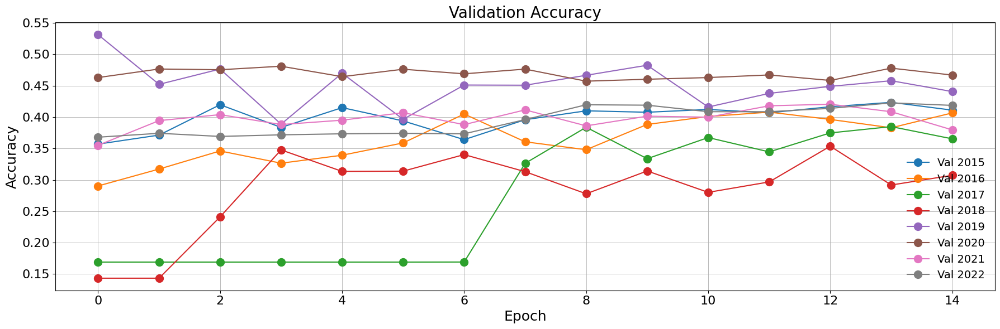

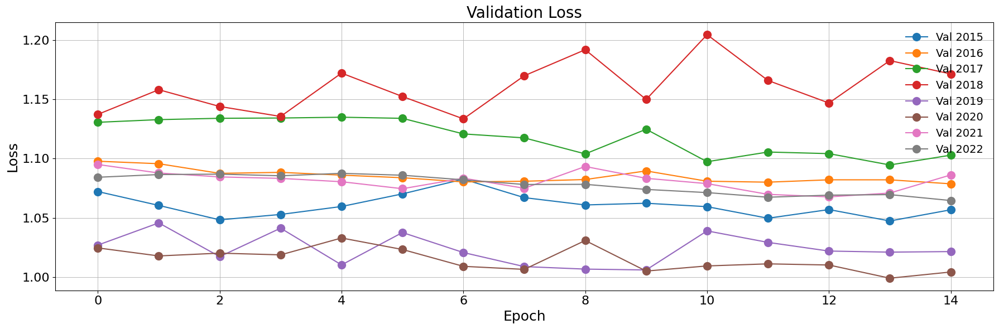

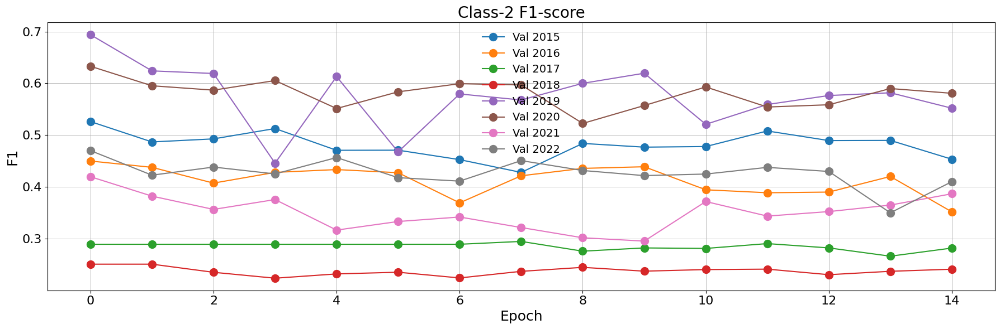

In [23]:
import matplotlib.pyplot as plt

colors = plt.cm.tab10.colors

# Plot 1: Validation Accuracy
plt.figure(figsize=(18, 6))
for idx, r in enumerate(expanding_window_res):
    lbl = f"Val {r['val_year']}"
    epochs = range(len(r["val_accuracies"]))
    plt.plot(epochs, r["val_accuracies"], marker="o", markersize=10,
             color=colors[idx], label=lbl)
plt.title("Validation Accuracy", fontsize=20)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Accuracy", fontsize=18)
plt.grid(True, linewidth=0.6)
plt.legend(fontsize=14, frameon=False)
plt.tick_params(labelsize=16)
plt.tight_layout()
plt.show()

# Plot 2: Validation Loss
plt.figure(figsize=(18, 6))
for idx, r in enumerate(expanding_window_res):
    lbl = f"Val {r['val_year']}"
    epochs = range(len(r["val_losses"]))
    plt.plot(epochs, r["val_losses"], marker="o", markersize=10,
             color=colors[idx], label=lbl)
plt.title("Validation Loss", fontsize=20)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Loss", fontsize=18)
plt.grid(True, linewidth=0.6)
plt.legend(fontsize=14, frameon=False)
plt.tick_params(labelsize=16)
plt.tight_layout()
plt.show()

# Plot 3: Class-2 F1 Score
plt.figure(figsize=(18, 6))
for idx, r in enumerate(expanding_window_res):
    lbl = f"Val {r['val_year']}"
    epochs = range(len(r["class_2_f1_scores"]))
    plt.plot(epochs, r["class_2_f1_scores"], marker="o", markersize=10,
             color=colors[idx], label=lbl)
plt.title("Class-2 F1-score", fontsize=20)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("F1", fontsize=18)
plt.grid(True, linewidth=0.6)
plt.legend(fontsize=14, frameon=False)
plt.tick_params(labelsize=16)
plt.tight_layout()
plt.show()



### Ablation Study with Attention Analysis

This section performs a **feature ablation study** to evaluate the importance of selected financial ratios. The process involves retraining the model without certain features and analyzing both predictive performance and attention behaviors.

**Purpose:**  
To determine how much specific input features contribute to model accuracy and how attention patterns adapt when these features are removed.

**Procedure:**
- The `apply_ablation(drop_cols)` function:
  - Uses `giga_func_2` to load data from 2020–2021 (train/val) and 2024 (test), dropping selected columns.
  - Disables all meta-variable embeddings by setting them to zero.
  - Initializes a `BucketTransformer_mine` model with consistent hyperparameters.
  - Trains the model using `train_model_mine`.
  - Captures attention weights using `attach_attention_capture` and visualizes them with `plot_all_layers` and `plot_attention_main`.
  - Plots training/validation loss and accuracy for each run.

**Features Dropped in Each Experiment:**
1. `momentum_buckets`
2. `earnings_to_price_buckets`
3. `free_cash_flow_yield_buckets`
4. `past_12m_return_buckets`
5. `book_to_market_buckets`
6. All of the above combined

Each run is prefixed with a print statement indicating which feature is being dropped, followed by the `apply_ablation()` call. This setup enables structured experimentation and insight into both feature importance and the model's internal reasoning (via attention).

The plots generated show:
- Training dynamics (loss and accuracy over epochs)
- Attention distribution across input tokens, which helps interpret how the model reallocates focus when key features are removed.


Dropping: ['momentum_buckets']
(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
After imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
Training Dataset: 70.32%
Validation Dataset: 14.11%
Test Dataset: 15.57%
HERRRRRRRRRRRRRRRRRRRRRRRRRRRRRRRREREERE
Before dropping any columns we h

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,free_cash_flow_yield_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,1,0,9,0,3,1,0,0,9,0
11,14,1,2007,1855,0,0,0,0,0,0,...,1,0,6,6,9,1,2,9,2,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,0,8,2,3,2,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,0,1,4,1,2,0,0,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,2,0,2,3,5,2,4,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,free_cash_flow_yield_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,8,7,1,0,1,1,7,5,9,1
25,14,1,2021,1855,1,0,0,0,0,0,...,9,8,3,0,1,2,7,3,6,0
50,14,1,2020,2162,5,0,1,0,0,0,...,9,8,7,3,2,2,3,3,9,2
51,14,1,2021,2162,2,0,1,0,0,0,...,9,8,7,6,5,2,8,2,9,0
152,12,2,2020,7041,0,0,0,0,0,0,...,7,7,1,7,6,7,7,2,9,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,free_cash_flow_yield_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,9,8,2,0,1,1,7,4,1,1
27,14,1,2023,1855,3,0,1,0,0,0,...,8,9,3,0,1,1,5,6,4,2
52,14,1,2022,2162,4,0,2,0,0,0,...,9,8,7,6,7,2,8,2,2,1
53,14,1,2023,2162,5,0,1,0,0,0,...,9,8,6,5,7,2,4,3,4,1
154,12,2,2022,7041,0,0,2,0,0,0,...,0,2,9,6,3,4,0,1,4,1


Final shapes - Train: (113262, 71), Val: (22730, 71), Test: (25080, 71)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020, 2021]
Test years: [2022, 2023, 2024]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:17, 27.00s/it]

Epoch 0 Avg Confidence: 0.3670
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0868, Val Loss 1.0715, Val Acc 0.3780
Epoch   0: Train Loss 1.0868, Val Loss 1.0715, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:50, 26.99s/it]

Epoch 1 Avg Confidence: 0.3790
Epoch   1: Train Loss 1.0792, Val Loss 1.0616, Val Acc 0.3780


Epochs:  20%|███████████████▏                                                            | 3/15 [01:21<05:24, 27.01s/it]

Epoch 2 Avg Confidence: 0.3925
Epoch   2: Train Loss 1.0760, Val Loss 1.0508, Val Acc 0.3780


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:48<04:57, 27.00s/it]

Epoch 3 Avg Confidence: 0.3867
Epoch   3: Train Loss 1.0740, Val Loss 1.0579, Val Acc 0.3826


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:15<04:30, 27.01s/it]

Epoch 4 Avg Confidence: 0.4023
Epoch   4: Train Loss 1.0711, Val Loss 1.0654, Val Acc 0.3679


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:42<04:03, 27.01s/it]

Epoch 5 Avg Confidence: 0.4004
Epoch   5: Train Loss 1.0689, Val Loss 1.0458, Val Acc 0.3943


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:09<03:36, 27.01s/it]

Epoch 6 Avg Confidence: 0.4083
Epoch   6: Train Loss 1.0680, Val Loss 1.0463, Val Acc 0.3994


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:36<03:09, 27.00s/it]

Epoch 7 Avg Confidence: 0.3978
Epoch   7: Train Loss 1.0665, Val Loss 1.0556, Val Acc 0.4181


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:03<02:41, 27.00s/it]

Epoch 8 Avg Confidence: 0.4116
Epoch   8: Train Loss 1.0651, Val Loss 1.0409, Val Acc 0.4331


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:30<02:14, 27.00s/it]

Epoch 9 Avg Confidence: 0.4134
Epoch   9: Train Loss 1.0641, Val Loss 1.0403, Val Acc 0.4369


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:57<01:48, 27.00s/it]

Epoch 10 Avg Confidence: 0.4198
Epoch  10: Train Loss 1.0633, Val Loss 1.0504, Val Acc 0.4230
Epoch  10: Train Loss 1.0633, Val Loss 1.0504, Val Acc 0.4230


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:24<01:21, 27.00s/it]

Epoch 11 Avg Confidence: 0.4212
Epoch  11: Train Loss 1.0620, Val Loss 1.0475, Val Acc 0.4305


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:51<00:54, 27.01s/it]

Epoch 12 Avg Confidence: 0.4243
Epoch  12: Train Loss 1.0616, Val Loss 1.0438, Val Acc 0.4382


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:18<00:27, 27.01s/it]

Epoch 13 Avg Confidence: 0.4212
Epoch  13: Train Loss 1.0608, Val Loss 1.0440, Val Acc 0.4336


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:45<00:00, 27.01s/it]

Epoch 14 Avg Confidence: 0.4233
Epoch  14: Train Loss 1.0612, Val Loss 1.0405, Val Acc 0.4361
Epoch  14: Train Loss 1.0612, Val Loss 1.0405, Val Acc 0.4361

FINAL RESULTS
Best validation accuracy: 0.4382
Final validation accuracy: 0.4361

Validation Confusion Matrix:
[[1257 1090 2917]
 [1245 3205 4424]
 [1043 2099 5450]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 23.9% accuracy (1257/5264 correct)
Class 1: 36.1% accuracy (3205/8874 correct)
Class 2: 63.4% accuracy (5450/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.35      0.24      0.29      5264
     Class 1       0.50      0.36      0.42      8874
     Class 2       0.43      0.63      0.51      8592

    accuracy                           0.44     22730
   macro avg       0.43      0.41      0.40     22730
weighted avg       0.44      0.44      0.42     22730



Confusion Matrix (TESTING ):
[[1517 1715 3562]
 [1140 3547 4993]
 [1206 2448 4952]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.39      0.22      0.28      6794
     Class 1       0.46      0.37      0.41      9680
     Class 2       0.37      0.58      0.45      8606

    accuracy                           0.40     25080
   macro avg       0.41      0.39      0.38     25080
weighted avg       0.41      0.40      0.39     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

Layer 0: torch.Size([32, 2, 32, 32])
Layer 1: torch.Size([32, 2, 32, 32])
Layer 2: torch.Size([32, 2, 32, 32])
Layer 3: torch.Size([32, 2, 32, 32])


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

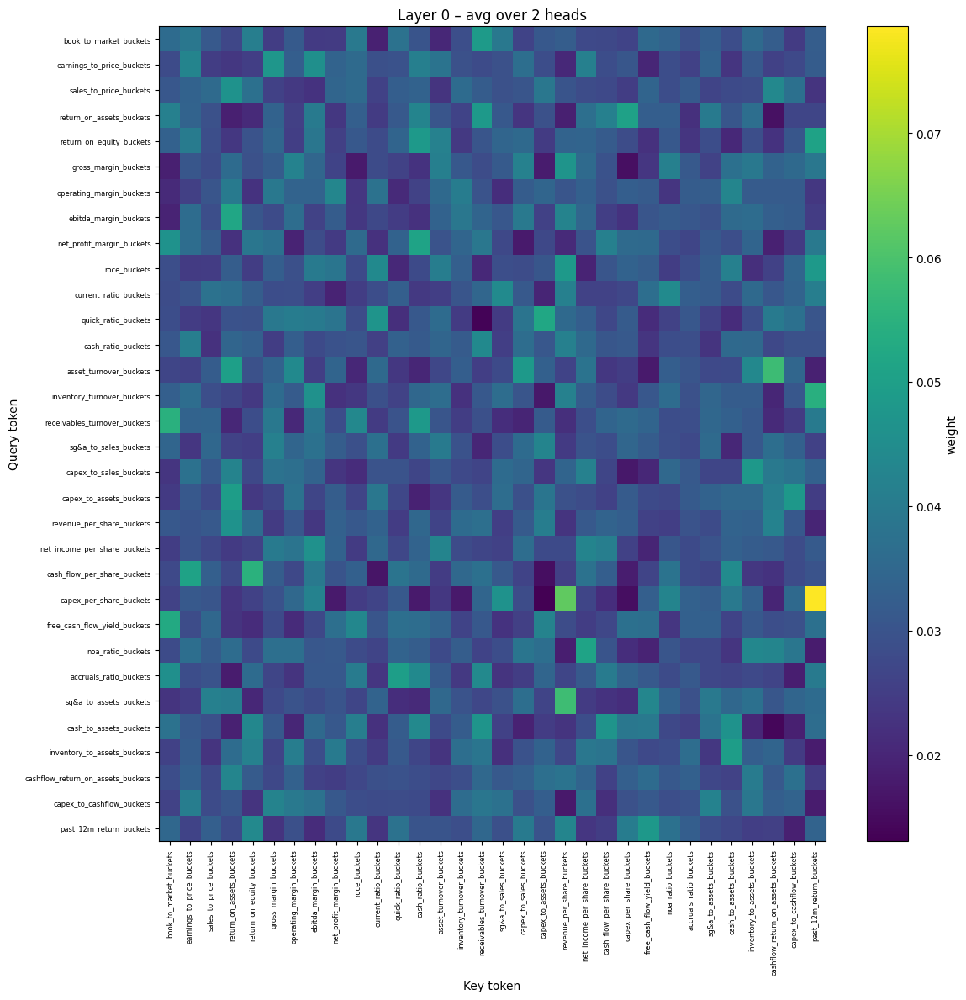

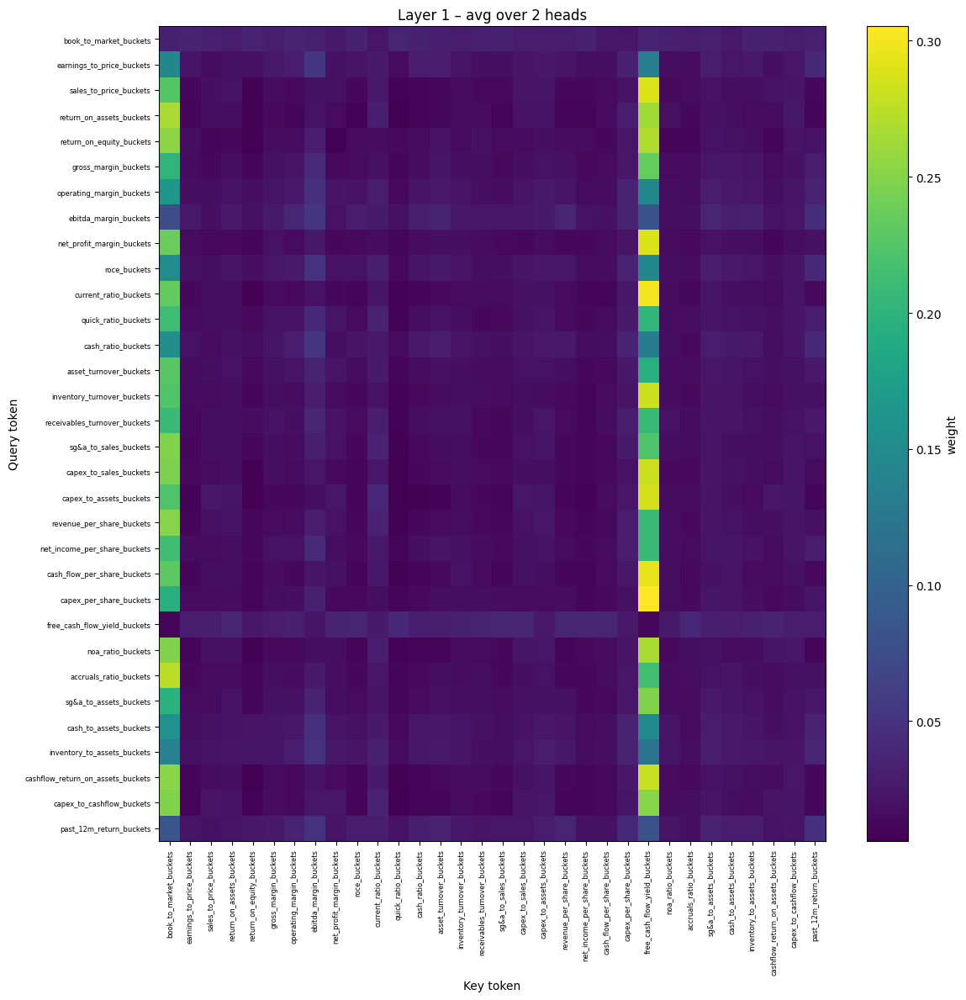

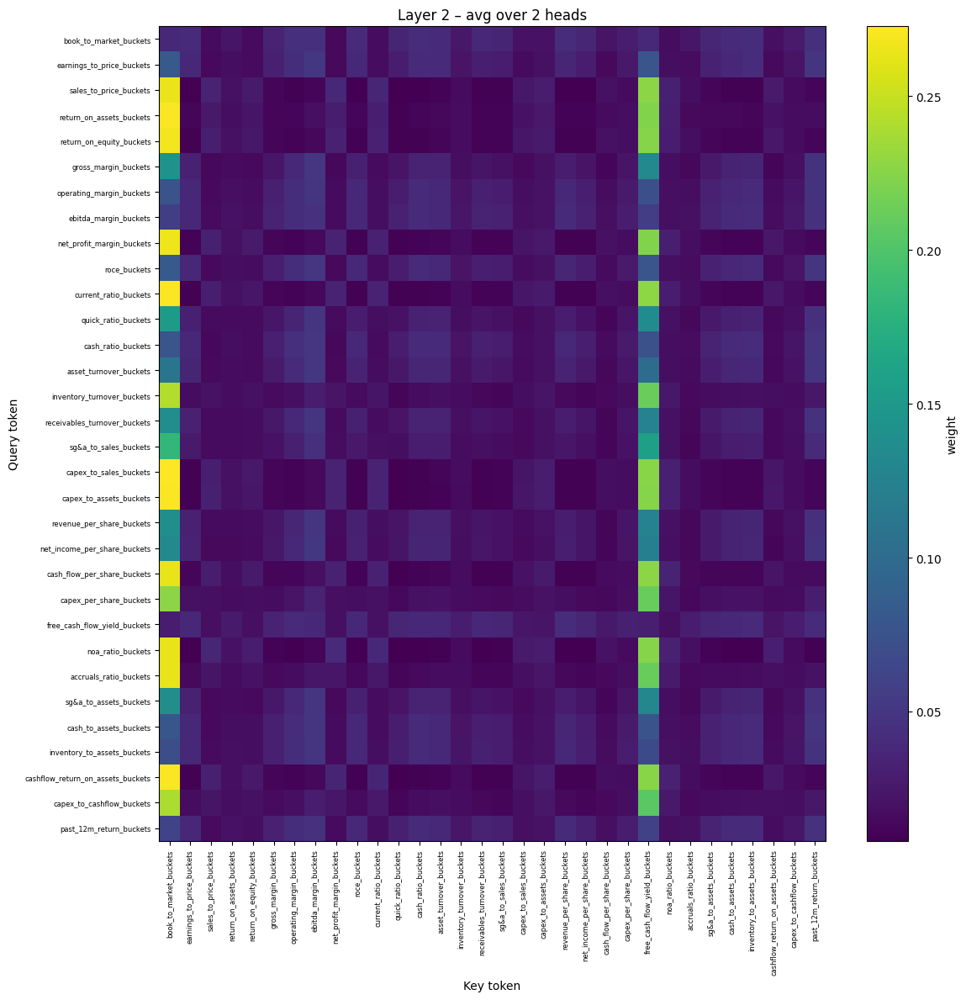

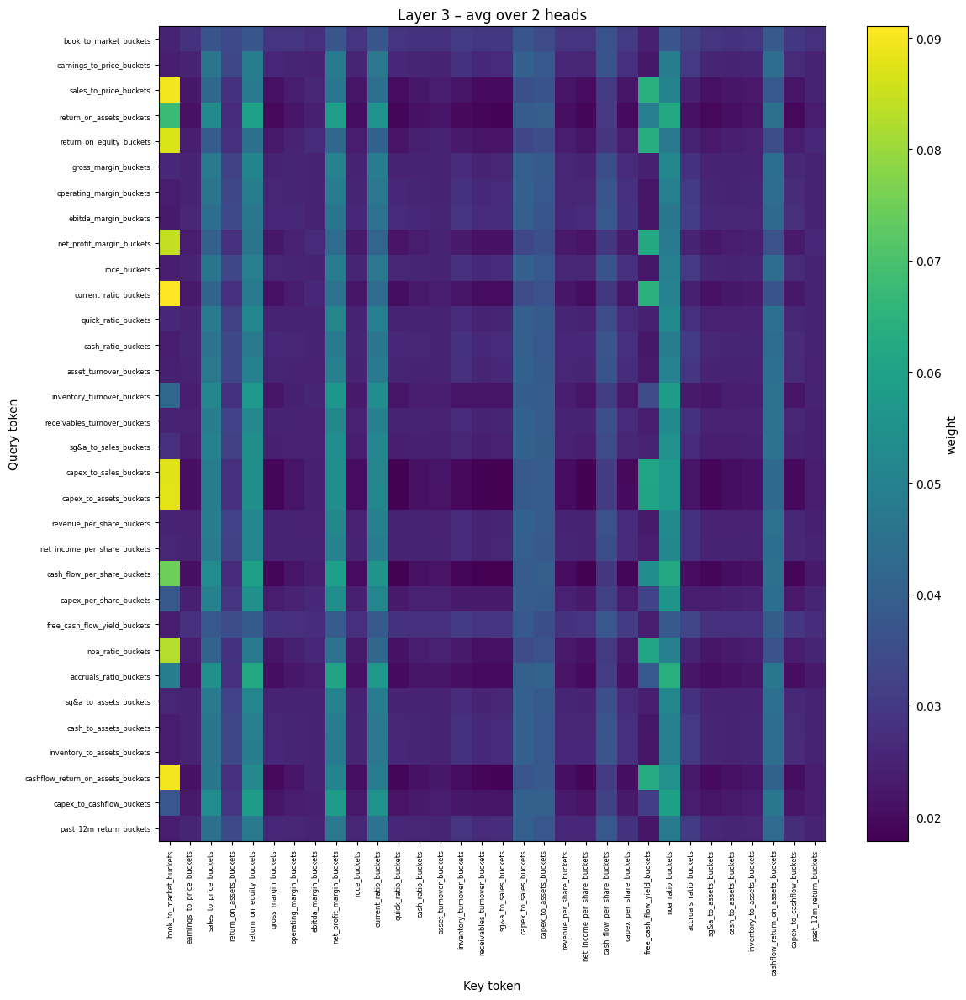

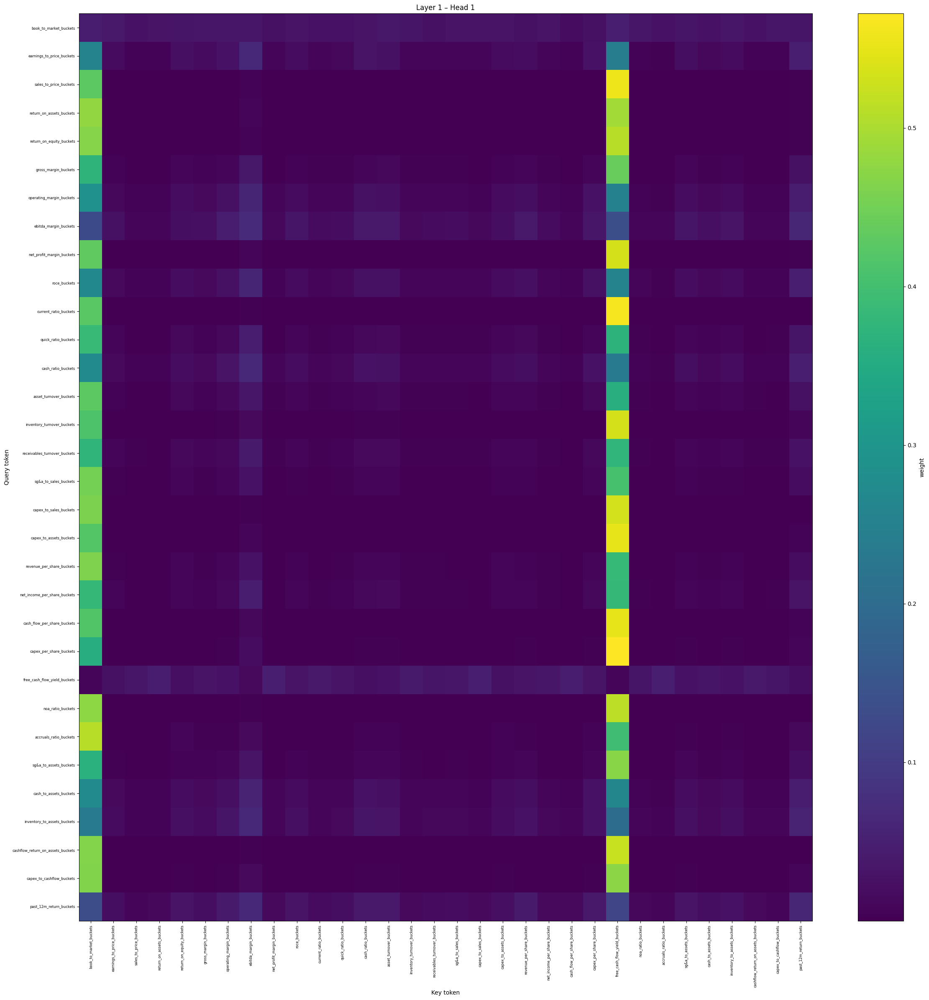

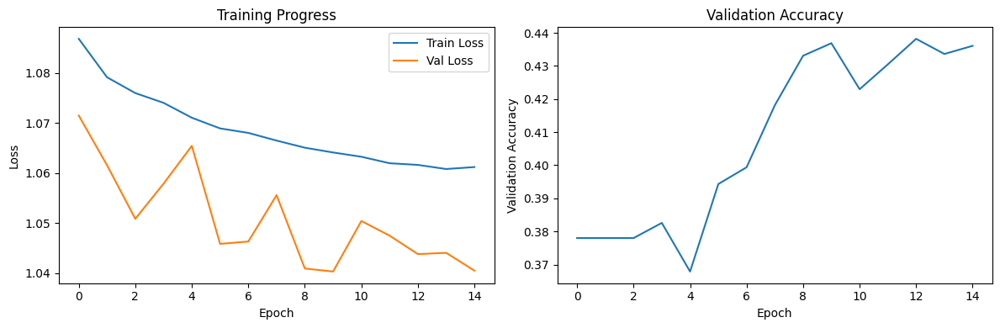

<Figure size 640x480 with 0 Axes>

Dropping: ['earnings_to_price_buckets']
(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
After imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
Training Dataset: 70.32%
Validation Dataset: 14.11%
Test Dataset: 15.57%
HERRRRRRRRRRRRRRRRRRRRRRRRRRRRRRRREREERE
Before dropping any col

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,7,1,0,1,1,7,5,9,9,1
25,14,1,2021,1855,1,0,0,0,0,0,...,8,3,0,1,2,7,3,6,6,0
50,14,1,2020,2162,5,0,1,0,0,0,...,8,7,3,2,2,3,3,9,9,2
51,14,1,2021,2162,2,0,1,0,0,0,...,8,7,6,5,2,8,2,9,9,0
152,12,2,2020,7041,0,0,0,0,0,0,...,7,1,7,6,7,7,2,9,9,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,8,2,0,1,1,7,4,1,1,1
27,14,1,2023,1855,3,0,1,0,0,0,...,9,3,0,1,1,5,6,4,3,2
52,14,1,2022,2162,4,0,2,0,0,0,...,8,7,6,7,2,8,2,2,2,1
53,14,1,2023,2162,5,0,1,0,0,0,...,8,6,5,7,2,4,3,4,4,1
154,12,2,2022,7041,0,0,2,0,0,0,...,2,9,6,3,4,0,1,4,4,1


Final shapes - Train: (113262, 71), Val: (22730, 71), Test: (25080, 71)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020, 2021]
Test years: [2022, 2023, 2024]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:17, 26.93s/it]

Epoch 0 Avg Confidence: 0.3909
Best Model now for class 2 f1 score: 0.5463350785340314 and Precision = 0.3800072833211945
Epoch   0: Train Loss 1.0857, Val Loss 1.0595, Val Acc 0.3794
Epoch   0: Train Loss 1.0857, Val Loss 1.0595, Val Acc 0.3794


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:49, 26.92s/it]

Epoch 1 Avg Confidence: 0.3965
Epoch   1: Train Loss 1.0788, Val Loss 1.0577, Val Acc 0.3835


Epochs:  20%|███████████████▏                                                            | 3/15 [01:20<05:23, 26.93s/it]

Epoch 2 Avg Confidence: 0.3947
Epoch   2: Train Loss 1.0747, Val Loss 1.0515, Val Acc 0.3965


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:47<04:56, 26.92s/it]

Epoch 3 Avg Confidence: 0.3869
Epoch   3: Train Loss 1.0707, Val Loss 1.0517, Val Acc 0.4135


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:14<04:29, 26.93s/it]

Epoch 4 Avg Confidence: 0.4075
Epoch   4: Train Loss 1.0691, Val Loss 1.0500, Val Acc 0.4070


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:41<04:02, 26.93s/it]

Epoch 5 Avg Confidence: 0.4052
Epoch   5: Train Loss 1.0677, Val Loss 1.0793, Val Acc 0.3723


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:08<03:35, 26.94s/it]

Epoch 6 Avg Confidence: 0.3970
Epoch   6: Train Loss 1.0665, Val Loss 1.0439, Val Acc 0.4394


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:35<03:08, 26.93s/it]

Epoch 7 Avg Confidence: 0.4066
Epoch   7: Train Loss 1.0647, Val Loss 1.0617, Val Acc 0.4103


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:02<02:41, 26.93s/it]

Epoch 8 Avg Confidence: 0.4131
Epoch   8: Train Loss 1.0638, Val Loss 1.0486, Val Acc 0.4106


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:29<02:14, 26.94s/it]

Epoch 9 Avg Confidence: 0.4076
Epoch   9: Train Loss 1.0635, Val Loss 1.0412, Val Acc 0.4328


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:56<01:47, 26.94s/it]

Epoch 10 Avg Confidence: 0.4095
Epoch  10: Train Loss 1.0625, Val Loss 1.0509, Val Acc 0.4259
Epoch  10: Train Loss 1.0625, Val Loss 1.0509, Val Acc 0.4259


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:23<01:20, 26.94s/it]

Epoch 11 Avg Confidence: 0.4177
Epoch  11: Train Loss 1.0624, Val Loss 1.0492, Val Acc 0.4195


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:50<00:53, 26.95s/it]

Epoch 12 Avg Confidence: 0.4093
Epoch  12: Train Loss 1.0618, Val Loss 1.0532, Val Acc 0.4194


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:17<00:26, 26.95s/it]

Epoch 13 Avg Confidence: 0.4163
Epoch  13: Train Loss 1.0614, Val Loss 1.0368, Val Acc 0.4421


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:44<00:00, 26.94s/it]

Epoch 14 Avg Confidence: 0.4120
Epoch  14: Train Loss 1.0606, Val Loss 1.0397, Val Acc 0.4413
Epoch  14: Train Loss 1.0606, Val Loss 1.0397, Val Acc 0.4413

FINAL RESULTS
Best validation accuracy: 0.4421
Final validation accuracy: 0.4413

Validation Confusion Matrix:
[[1344 1685 2235]
 [1341 4206 3327]
 [1165 2946 4481]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 25.5% accuracy (1344/5264 correct)
Class 1: 47.4% accuracy (4206/8874 correct)
Class 2: 52.2% accuracy (4481/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.35      0.26      0.29      5264
     Class 1       0.48      0.47      0.47      8874
     Class 2       0.45      0.52      0.48      8592

    accuracy                           0.44     22730
   macro avg       0.42      0.42      0.42     22730
weighted avg       0.44      0.44      0.44     22730



Confusion Matrix (TESTING ):
[[1583 2398 2813]
 [1234 4425 4021]
 [1267 3257 4082]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.39      0.23      0.29      6794
     Class 1       0.44      0.46      0.45      9680
     Class 2       0.37      0.47      0.42      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.39      0.39     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.36      0.05      0.09      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      0.97      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.25      0.34      0.21     22730
weighted avg       0.23      0.38      0.23     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[ 341    0 6453]
 [ 278    0 9402]
 [ 240    0 8366]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.40      0.05      0.09      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.35      0.97      0.51      8606

    accuracy                           0.35     25080
   macro avg       0.25      0.34      0.20     25080
weighted avg       0.23      0.35      0.20     25080

Layer 0: torch.Size([32, 2, 32, 32])
Layer 1: torch.Size([32, 2, 32, 32])
Layer 2: torch.Size([32, 2, 32, 32])
Layer 3: torch.Size([32, 2, 32, 32])


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

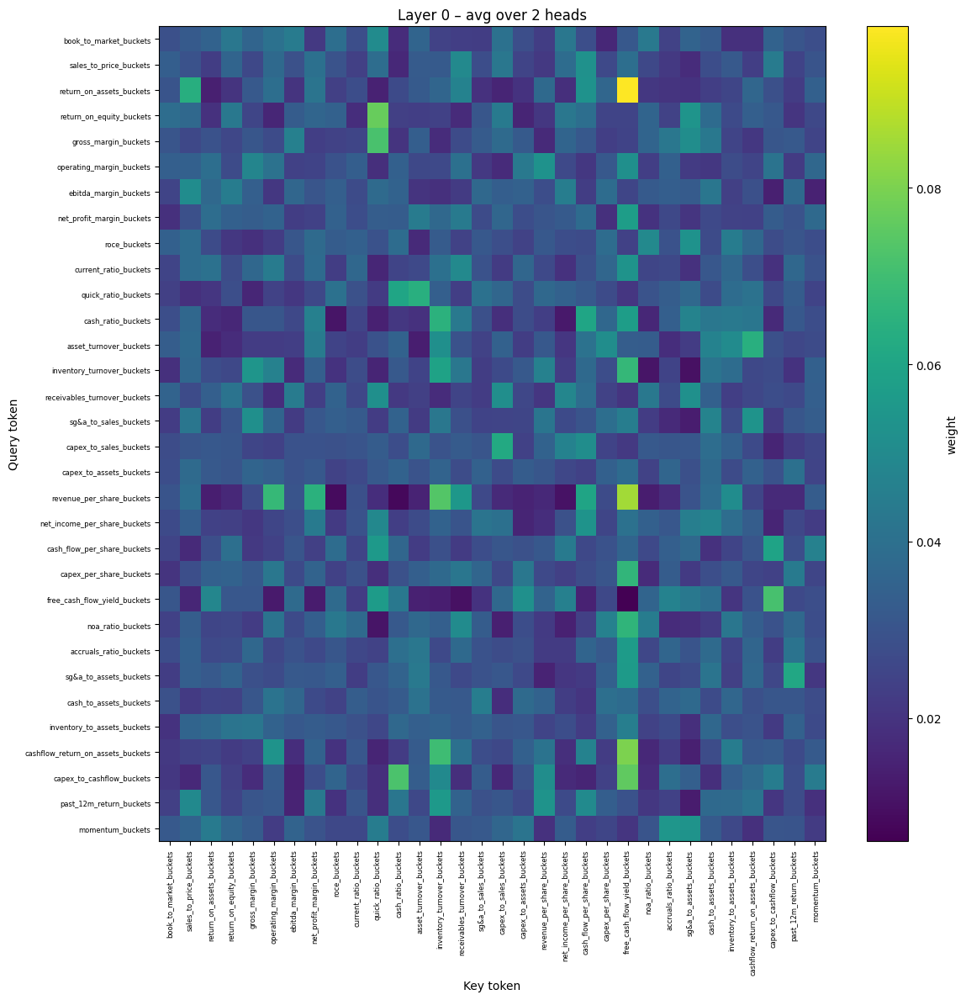

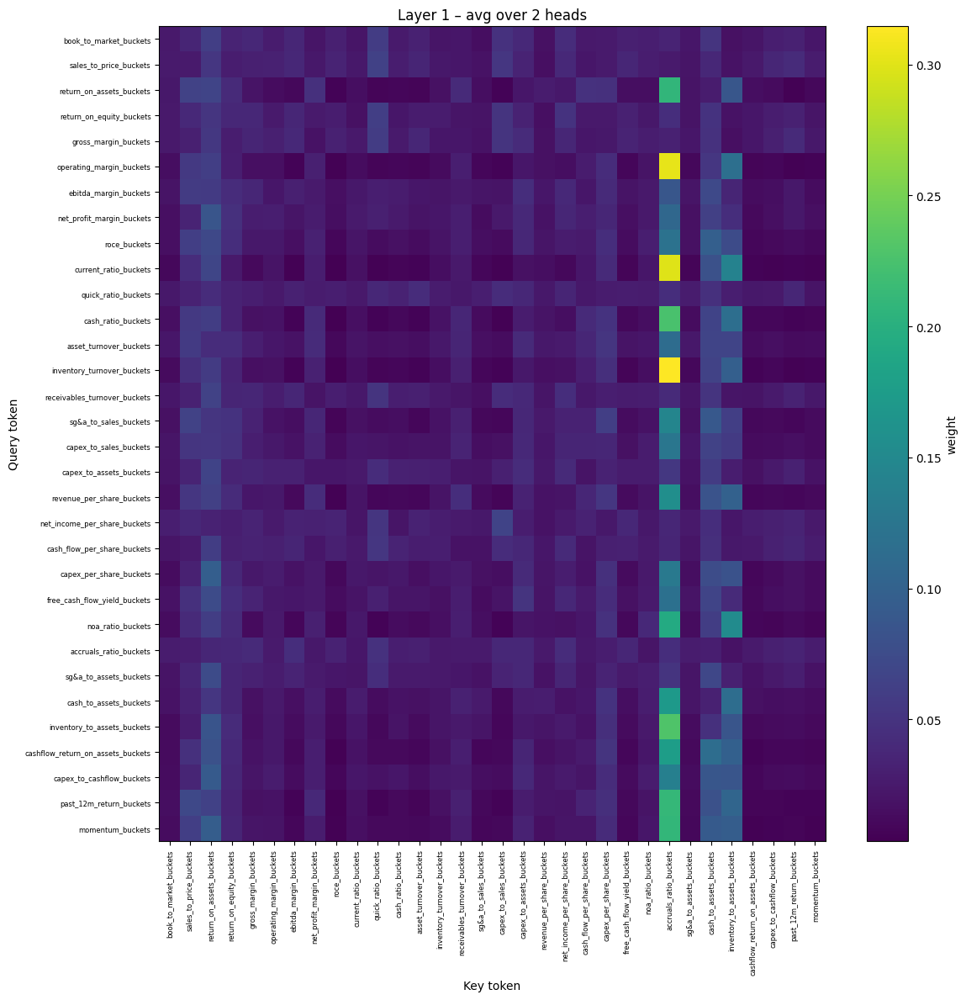

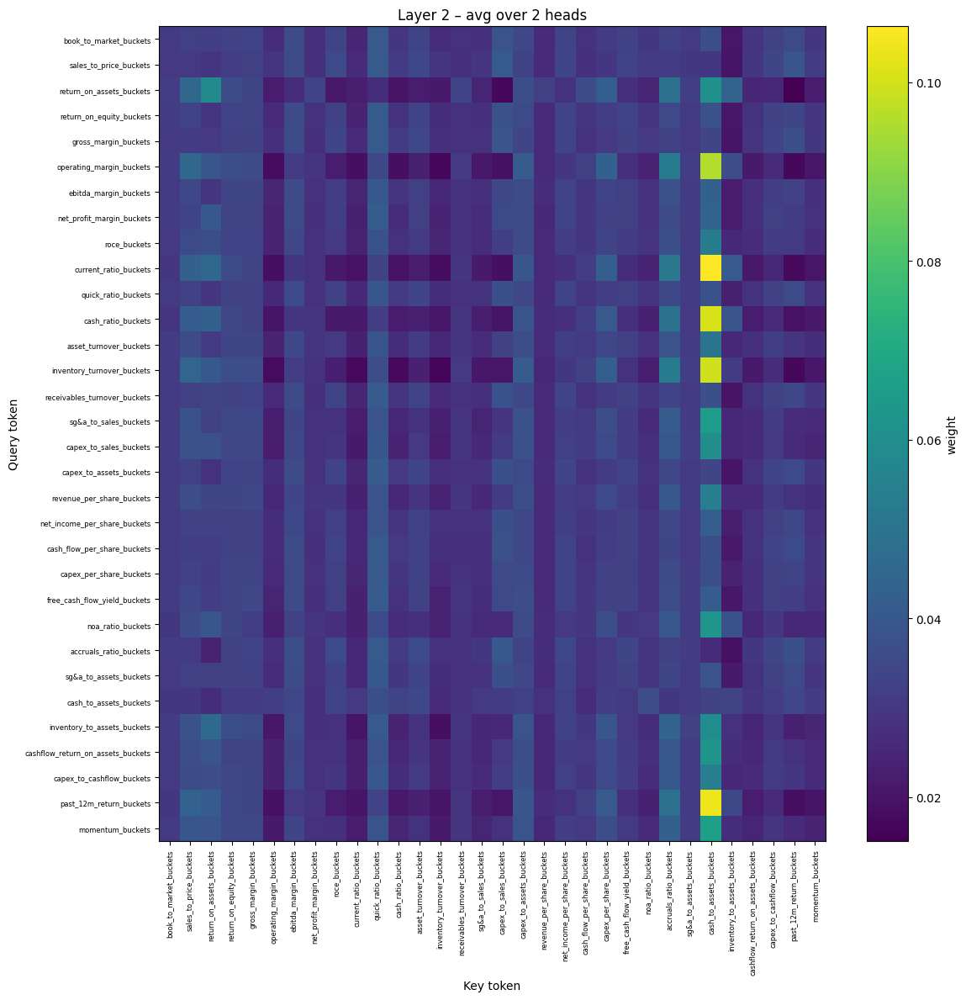

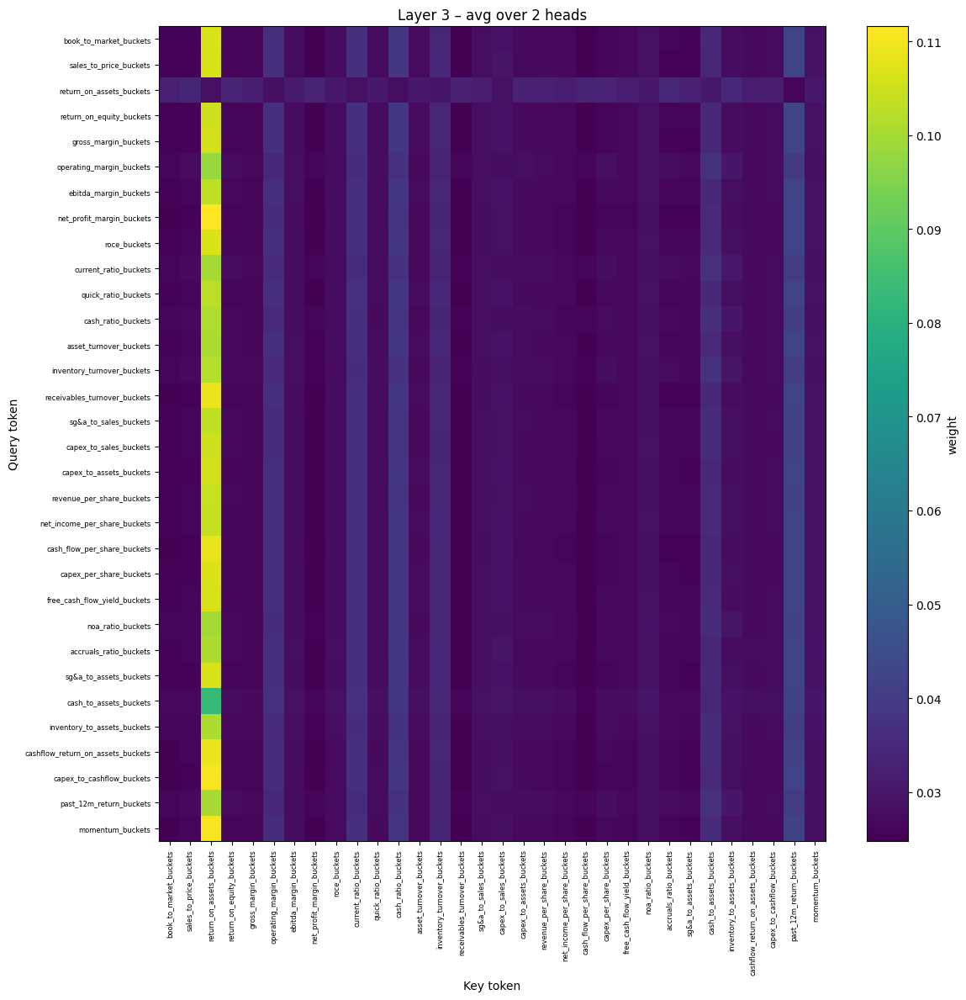

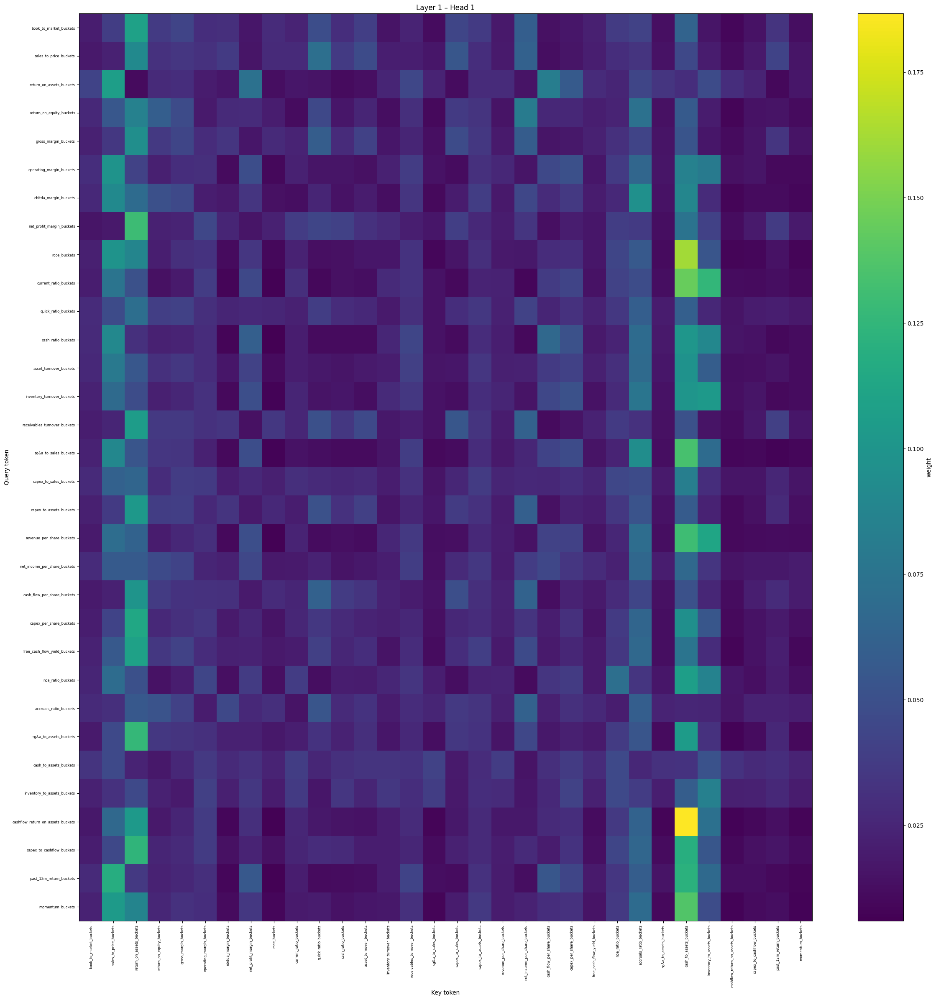

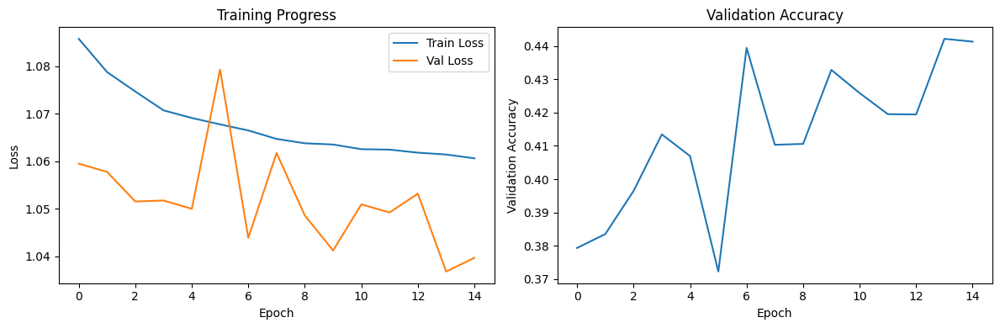

<Figure size 640x480 with 0 Axes>

Dropping: ['free_cash_flow_yield_buckets']
(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
After imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
Training Dataset: 70.32%
Validation Dataset: 14.11%
Test Dataset: 15.57%
HERRRRRRRRRRRRRRRRRRRRRRRRRRRRRRRREREERE
Before dropping any 

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,7,1,0,1,1,7,5,9,9,1
25,14,1,2021,1855,1,0,0,0,0,0,...,8,3,0,1,2,7,3,6,6,0
50,14,1,2020,2162,5,0,1,0,0,0,...,8,7,3,2,2,3,3,9,9,2
51,14,1,2021,2162,2,0,1,0,0,0,...,8,7,6,5,2,8,2,9,9,0
152,12,2,2020,7041,0,0,0,0,0,0,...,7,1,7,6,7,7,2,9,9,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,8,2,0,1,1,7,4,1,1,1
27,14,1,2023,1855,3,0,1,0,0,0,...,9,3,0,1,1,5,6,4,3,2
52,14,1,2022,2162,4,0,2,0,0,0,...,8,7,6,7,2,8,2,2,2,1
53,14,1,2023,2162,5,0,1,0,0,0,...,8,6,5,7,2,4,3,4,4,1
154,12,2,2022,7041,0,0,2,0,0,0,...,2,9,6,3,4,0,1,4,4,1


Final shapes - Train: (113262, 71), Val: (22730, 71), Test: (25080, 71)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020, 2021]
Test years: [2022, 2023, 2024]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:16, 26.93s/it]

Epoch 0 Avg Confidence: 0.3971
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0867, Val Loss 1.0552, Val Acc 0.3780
Epoch   0: Train Loss 1.0867, Val Loss 1.0552, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:50, 26.94s/it]

Epoch 1 Avg Confidence: 0.4005
Epoch   1: Train Loss 1.0807, Val Loss 1.0583, Val Acc 0.3780


Epochs:  20%|███████████████▏                                                            | 3/15 [01:20<05:23, 26.93s/it]

Epoch 2 Avg Confidence: 0.3978
Epoch   2: Train Loss 1.0781, Val Loss 1.0608, Val Acc 0.3772


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:47<04:56, 26.94s/it]

Epoch 3 Avg Confidence: 0.3997
Epoch   3: Train Loss 1.0752, Val Loss 1.0516, Val Acc 0.3748


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:14<04:29, 26.94s/it]

Epoch 4 Avg Confidence: 0.3935
Epoch   4: Train Loss 1.0725, Val Loss 1.0516, Val Acc 0.3965


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:41<04:02, 26.94s/it]

Epoch 5 Avg Confidence: 0.3984
Epoch   5: Train Loss 1.0697, Val Loss 1.0469, Val Acc 0.4174


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:08<03:35, 26.95s/it]

Epoch 6 Avg Confidence: 0.4102
Epoch   6: Train Loss 1.0678, Val Loss 1.0448, Val Acc 0.4166


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:35<03:08, 26.95s/it]

Epoch 7 Avg Confidence: 0.4078
Epoch   7: Train Loss 1.0669, Val Loss 1.0424, Val Acc 0.4236


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:02<02:41, 26.95s/it]

Epoch 8 Avg Confidence: 0.4003
Epoch   8: Train Loss 1.0655, Val Loss 1.0504, Val Acc 0.4166


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:29<02:14, 26.95s/it]

Epoch 9 Avg Confidence: 0.4020
Epoch   9: Train Loss 1.0650, Val Loss 1.0487, Val Acc 0.4204


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:56<01:47, 26.96s/it]

Epoch 10 Avg Confidence: 0.4191
Epoch  10: Train Loss 1.0642, Val Loss 1.0388, Val Acc 0.4360
Epoch  10: Train Loss 1.0642, Val Loss 1.0388, Val Acc 0.4360


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:23<01:20, 26.95s/it]

Epoch 11 Avg Confidence: 0.4185
Epoch  11: Train Loss 1.0631, Val Loss 1.0453, Val Acc 0.4244


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:50<00:53, 26.94s/it]

Epoch 12 Avg Confidence: 0.4161
Epoch  12: Train Loss 1.0627, Val Loss 1.0349, Val Acc 0.4292


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:17<00:26, 26.94s/it]

Epoch 13 Avg Confidence: 0.4092
Epoch  13: Train Loss 1.0622, Val Loss 1.0421, Val Acc 0.4297


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:44<00:00, 26.95s/it]

Epoch 14 Avg Confidence: 0.4119
Epoch  14: Train Loss 1.0619, Val Loss 1.0449, Val Acc 0.4275
Epoch  14: Train Loss 1.0619, Val Loss 1.0449, Val Acc 0.4275

FINAL RESULTS
Best validation accuracy: 0.4360
Final validation accuracy: 0.4275

Validation Confusion Matrix:
[[1982 1294 1988]
 [2365 3774 2735]
 [2055 2577 3960]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 37.7% accuracy (1982/5264 correct)
Class 1: 42.5% accuracy (3774/8874 correct)
Class 2: 46.1% accuracy (3960/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.31      0.38      0.34      5264
     Class 1       0.49      0.43      0.46      8874
     Class 2       0.46      0.46      0.46      8592

    accuracy                           0.43     22730
   macro avg       0.42      0.42      0.42     22730
weighted avg       0.44      0.43      0.43     22730



Confusion Matrix (TESTING ):
[[2471 2041 2282]
 [2228 4358 3094]
 [2294 3102 3210]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.35      0.36      0.36      6794
     Class 1       0.46      0.45      0.45      9680
     Class 2       0.37      0.37      0.37      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.40      0.40     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

Layer 0: torch.Size([32, 2, 32, 32])
Layer 1: torch.Size([32, 2, 32, 32])
Layer 2: torch.Size([32, 2, 32, 32])
Layer 3: torch.Size([32, 2, 32, 32])


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

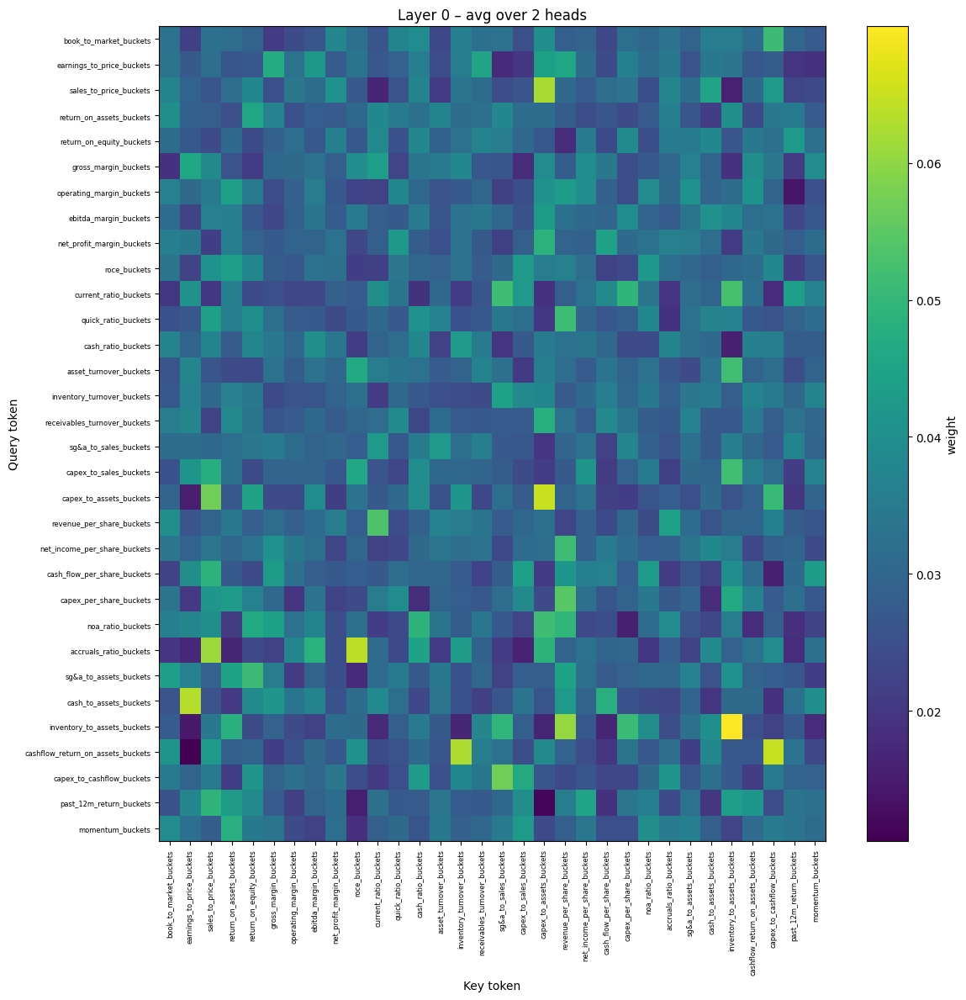

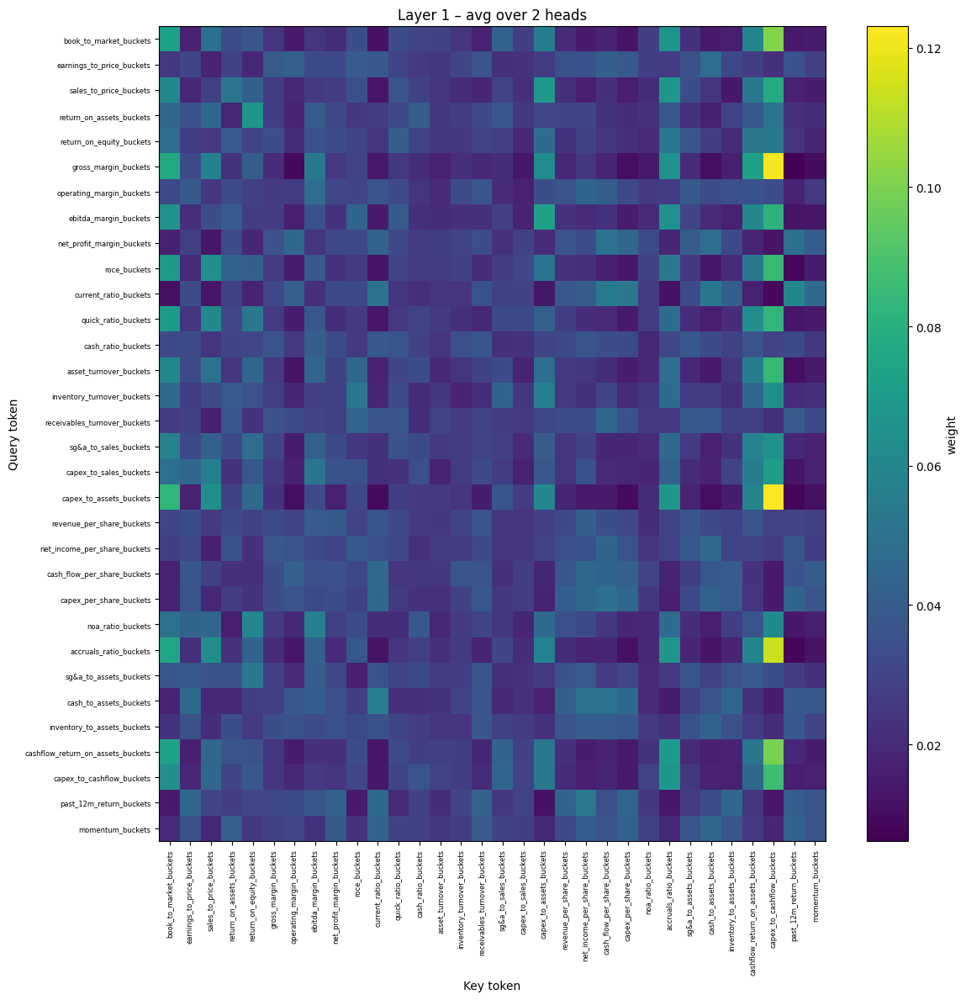

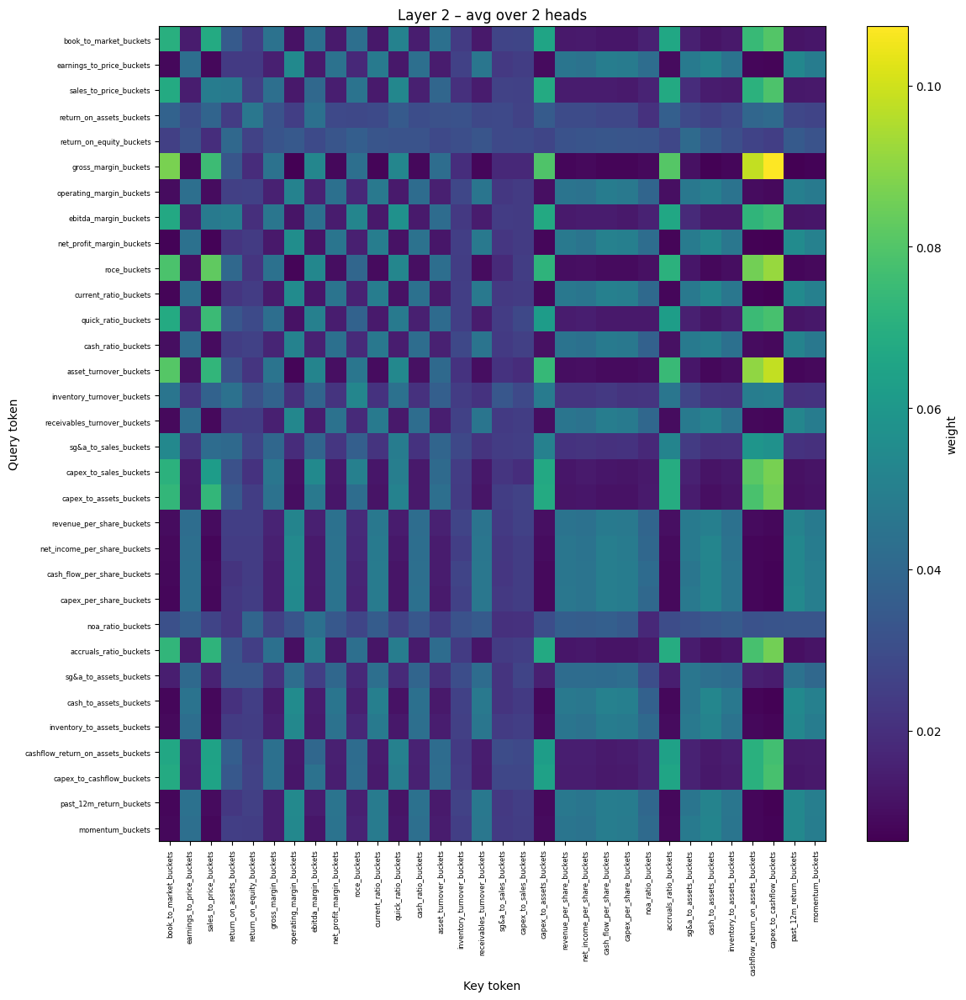

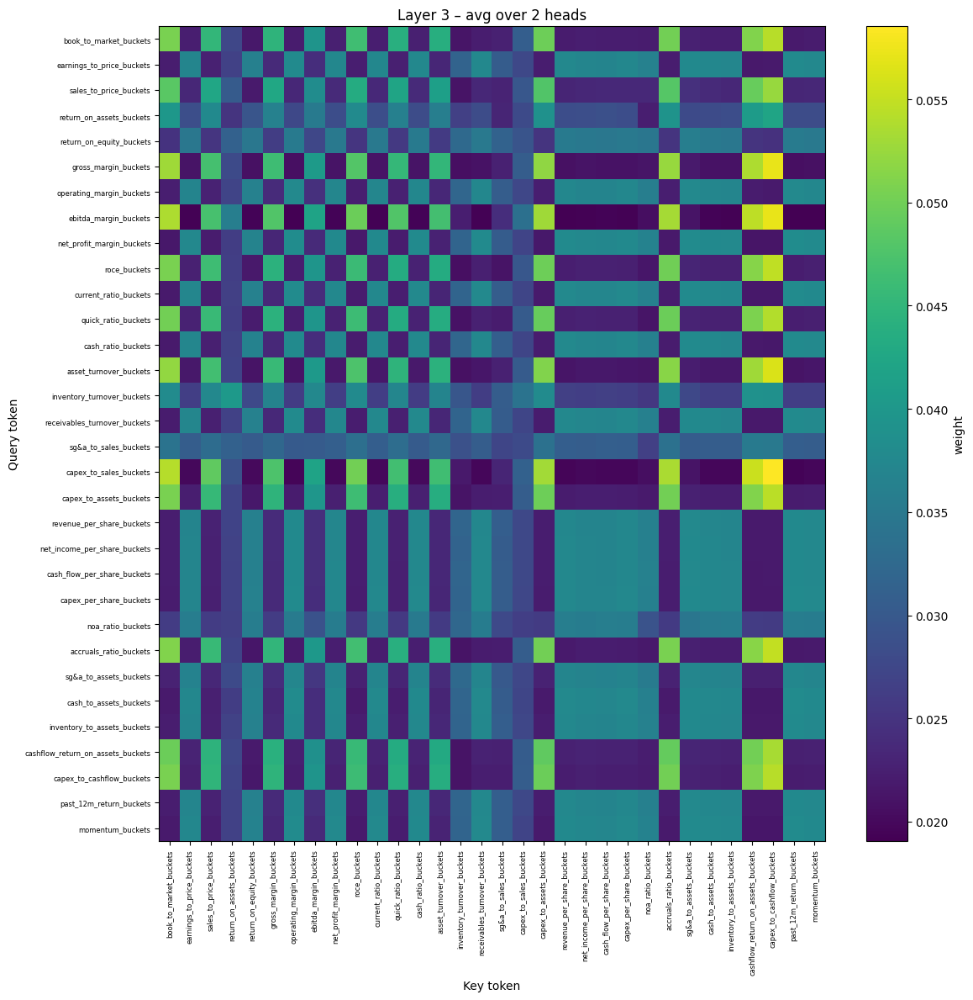

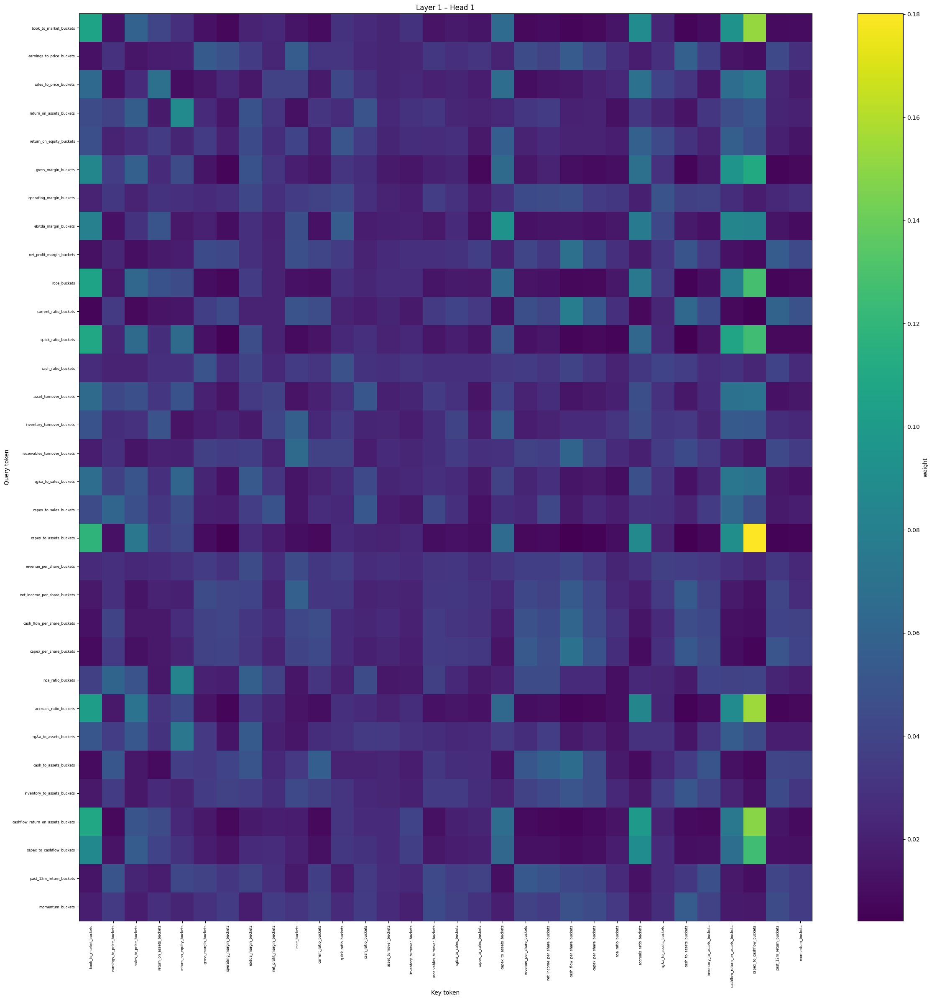

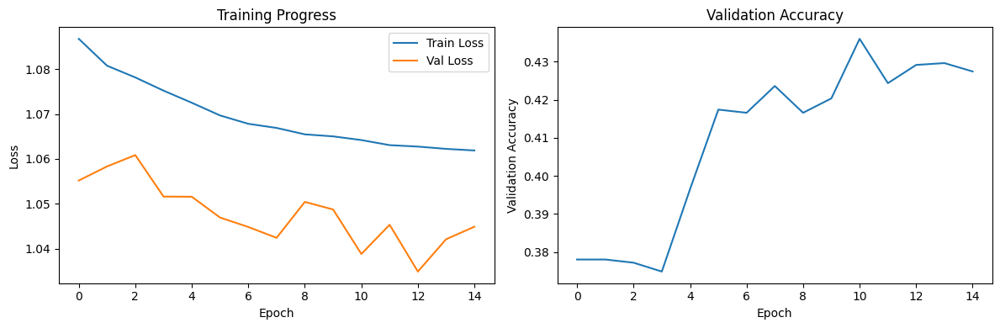

<Figure size 640x480 with 0 Axes>

Dropping: ['past_12m_return_buckets']
(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
After imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
Training Dataset: 70.32%
Validation Dataset: 14.11%
Test Dataset: 15.57%
HERRRRRRRRRRRRRRRRRRRRRRRRRRRRRRRREREERE
Before dropping any colum

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,free_cash_flow_yield_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,1,0,9,0,3,1,0,0,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,1,0,6,6,9,1,2,9,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,0,8,2,3,2,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,0,1,4,1,2,0,0,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,2,0,2,3,5,2,4,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,free_cash_flow_yield_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,momentum_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,8,7,1,0,1,1,7,5,9,1
25,14,1,2021,1855,1,0,0,0,0,0,...,9,8,3,0,1,2,7,3,6,0
50,14,1,2020,2162,5,0,1,0,0,0,...,9,8,7,3,2,2,3,3,9,2
51,14,1,2021,2162,2,0,1,0,0,0,...,9,8,7,6,5,2,8,2,9,0
152,12,2,2020,7041,0,0,0,0,0,0,...,7,7,1,7,6,7,7,2,9,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,free_cash_flow_yield_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,momentum_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,9,8,2,0,1,1,7,4,1,1
27,14,1,2023,1855,3,0,1,0,0,0,...,8,9,3,0,1,1,5,6,3,2
52,14,1,2022,2162,4,0,2,0,0,0,...,9,8,7,6,7,2,8,2,2,1
53,14,1,2023,2162,5,0,1,0,0,0,...,9,8,6,5,7,2,4,3,4,1
154,12,2,2022,7041,0,0,2,0,0,0,...,0,2,9,6,3,4,0,1,4,1


Final shapes - Train: (113262, 71), Val: (22730, 71), Test: (25080, 71)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020, 2021]
Test years: [2022, 2023, 2024]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:17, 26.95s/it]

Epoch 0 Avg Confidence: 0.4335
Best Model now for class 2 f1 score: 0.5404585537918871 and Precision = 0.3877416742585282
Epoch   0: Train Loss 1.0889, Val Loss 1.0504, Val Acc 0.3951
Epoch   0: Train Loss 1.0889, Val Loss 1.0504, Val Acc 0.3951


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:50, 26.95s/it]

Epoch 1 Avg Confidence: 0.4250
Epoch   1: Train Loss 1.0787, Val Loss 1.0477, Val Acc 0.4298


Epochs:  20%|███████████████▏                                                            | 3/15 [01:20<05:23, 26.94s/it]

Epoch 2 Avg Confidence: 0.3944
Epoch   2: Train Loss 1.0763, Val Loss 1.0526, Val Acc 0.4393


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:47<04:56, 26.95s/it]

Epoch 3 Avg Confidence: 0.4145
Epoch   3: Train Loss 1.0742, Val Loss 1.0509, Val Acc 0.4183


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:14<04:29, 26.96s/it]

Epoch 4 Avg Confidence: 0.3924
Epoch   4: Train Loss 1.0724, Val Loss 1.0515, Val Acc 0.4141


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:41<04:02, 26.97s/it]

Epoch 5 Avg Confidence: 0.4007
Epoch   5: Train Loss 1.0707, Val Loss 1.0443, Val Acc 0.4249


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:08<03:35, 26.97s/it]

Epoch 6 Avg Confidence: 0.3893
Epoch   6: Train Loss 1.0685, Val Loss 1.0486, Val Acc 0.4342


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:35<03:08, 26.98s/it]

Epoch 7 Avg Confidence: 0.3937
Epoch   7: Train Loss 1.0676, Val Loss 1.0533, Val Acc 0.4238


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:02<02:41, 26.97s/it]

Epoch 8 Avg Confidence: 0.4147
Epoch   8: Train Loss 1.0657, Val Loss 1.0514, Val Acc 0.4174


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:29<02:14, 26.98s/it]

Epoch 9 Avg Confidence: 0.4018
Epoch   9: Train Loss 1.0649, Val Loss 1.0418, Val Acc 0.4410


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:56<01:47, 26.98s/it]

Epoch 10 Avg Confidence: 0.4018
Epoch  10: Train Loss 1.0637, Val Loss 1.0467, Val Acc 0.4271
Epoch  10: Train Loss 1.0637, Val Loss 1.0467, Val Acc 0.4271


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:23<01:20, 26.98s/it]

Epoch 11 Avg Confidence: 0.4238
Epoch  11: Train Loss 1.0630, Val Loss 1.0531, Val Acc 0.4189


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:50<00:53, 26.98s/it]

Epoch 12 Avg Confidence: 0.4025
Epoch  12: Train Loss 1.0627, Val Loss 1.0449, Val Acc 0.4388


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:17<00:26, 26.98s/it]

Epoch 13 Avg Confidence: 0.4199
Epoch  13: Train Loss 1.0620, Val Loss 1.0534, Val Acc 0.4106


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:44<00:00, 26.97s/it]

Epoch 14 Avg Confidence: 0.4140
Epoch  14: Train Loss 1.0615, Val Loss 1.0385, Val Acc 0.4401
Epoch  14: Train Loss 1.0615, Val Loss 1.0385, Val Acc 0.4401

FINAL RESULTS
Best validation accuracy: 0.4410
Final validation accuracy: 0.4401

Validation Confusion Matrix:
[[1843 1718 1703]
 [1900 4389 2585]
 [1647 3173 3772]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 35.0% accuracy (1843/5264 correct)
Class 1: 49.5% accuracy (4389/8874 correct)
Class 2: 43.9% accuracy (3772/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.34      0.35      0.35      5264
     Class 1       0.47      0.49      0.48      8874
     Class 2       0.47      0.44      0.45      8592

    accuracy                           0.44     22730
   macro avg       0.43      0.43      0.43     22730
weighted avg       0.44      0.44      0.44     22730



Confusion Matrix (TESTING ):
[[2191 2501 2102]
 [1825 4807 3048]
 [1868 3705 3033]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.37      0.32      0.35      6794
     Class 1       0.44      0.50      0.46      9680
     Class 2       0.37      0.35      0.36      8606

    accuracy                           0.40     25080
   macro avg       0.39      0.39      0.39     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.44      0.15      0.22      8874
     Class 2       0.39      0.89      0.54      8592

    accuracy                           0.40     22730
   macro avg       0.28      0.35      0.25     22730
weighted avg       0.32      0.40      0.29     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0 1011 5783]
 [   0 1295 8385]
 [   0  988 7618]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.39      0.13      0.20      9680
     Class 2       0.35      0.89      0.50      8606

    accuracy                           0.36     25080
   macro avg       0.25      0.34      0.23     25080
weighted avg       0.27      0.36      0.25     25080

Layer 0: torch.Size([32, 2, 32, 32])
Layer 1: torch.Size([32, 2, 32, 32])
Layer 2: torch.Size([32, 2, 32, 32])
Layer 3: torch.Size([32, 2, 32, 32])


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

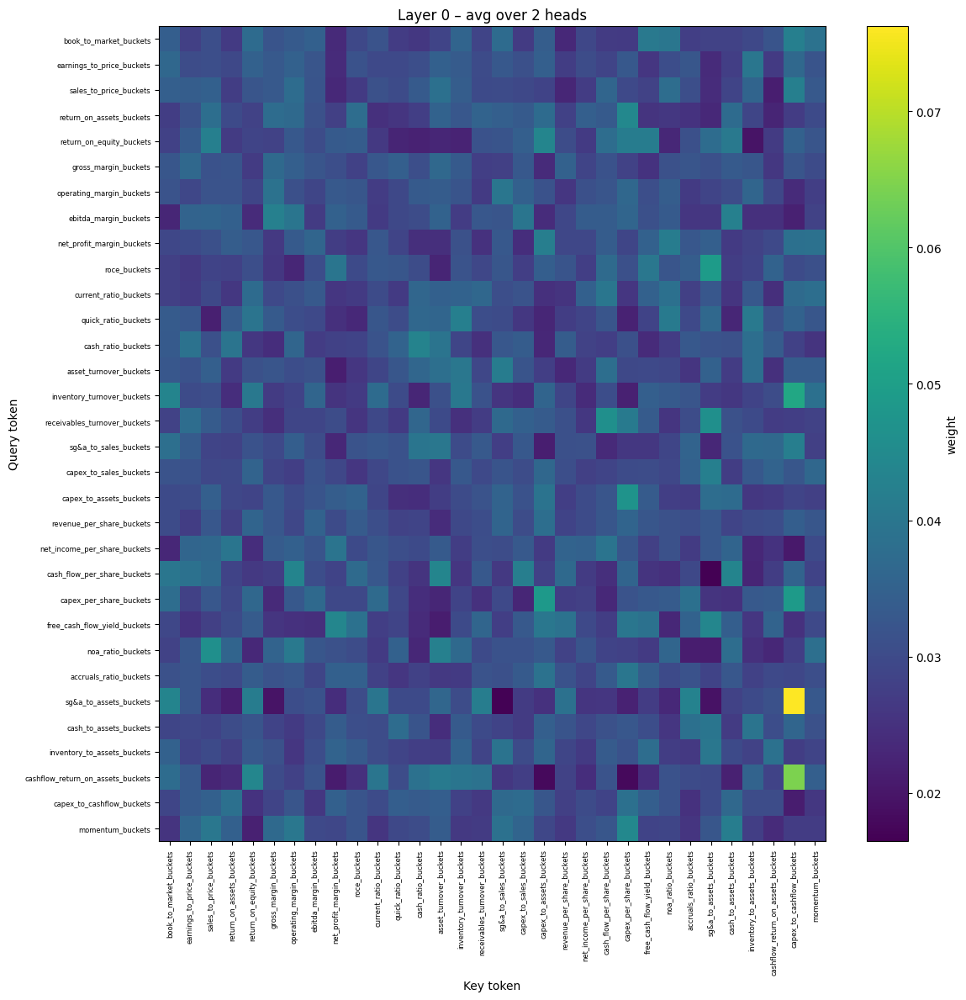

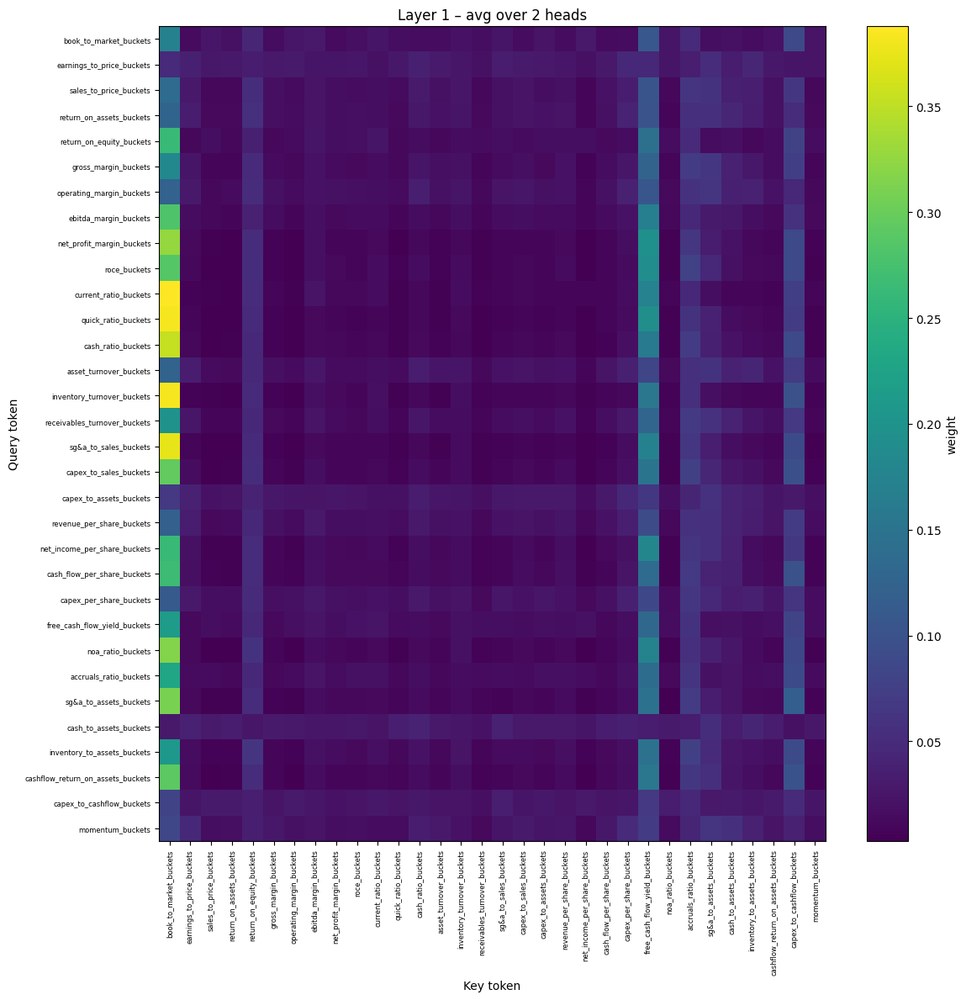

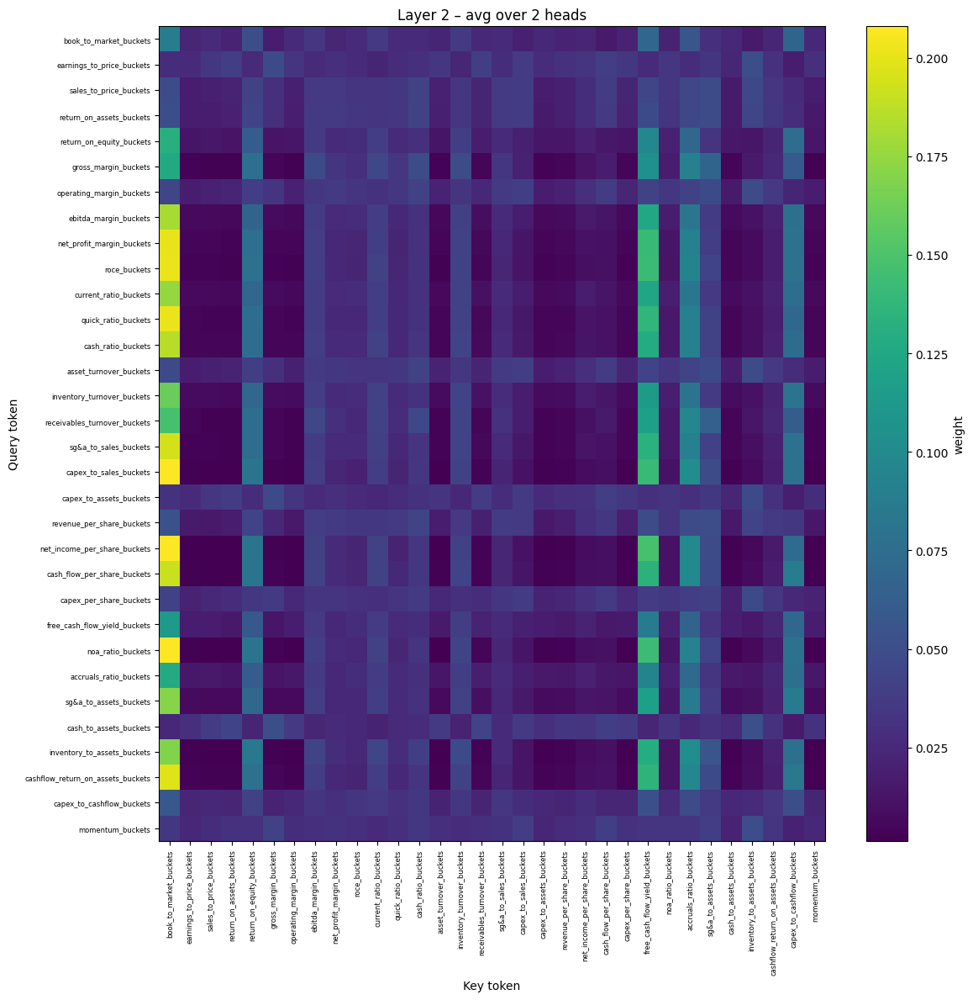

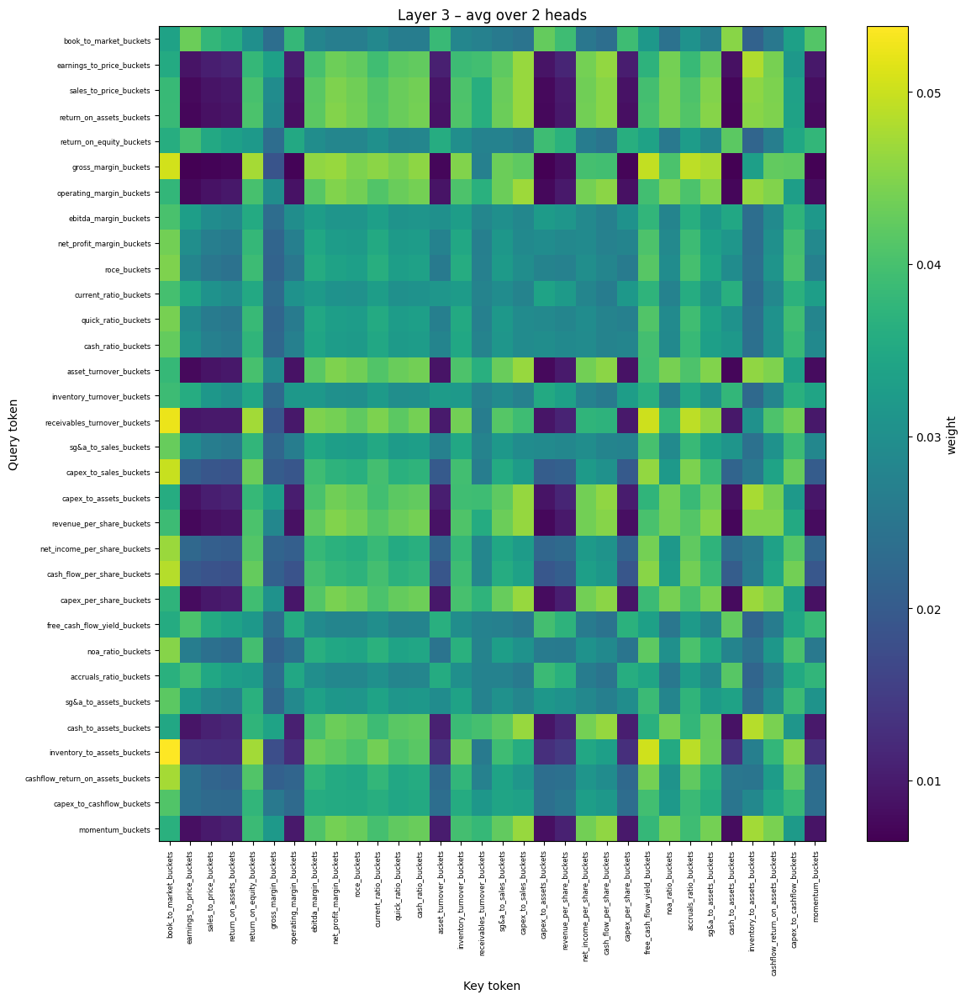

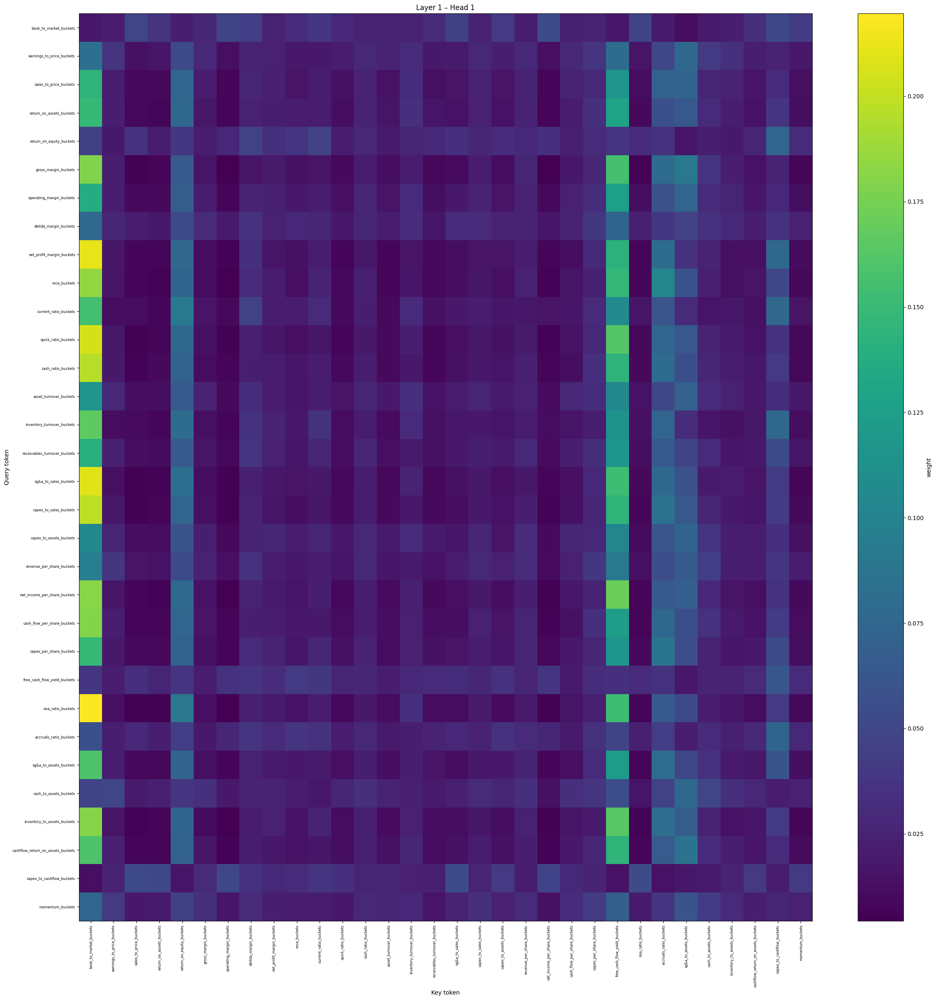

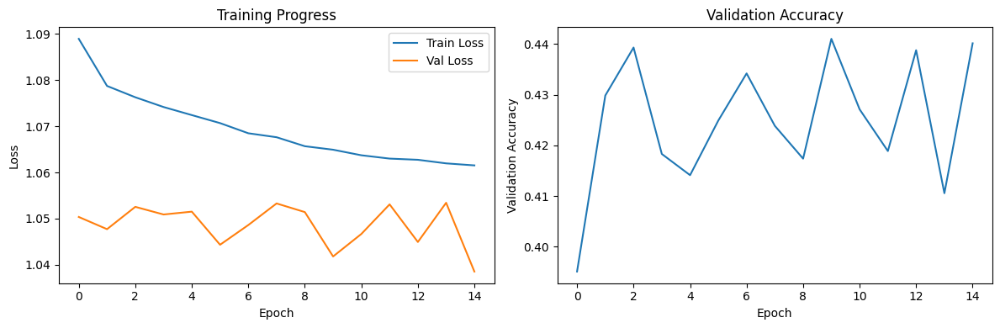

<Figure size 640x480 with 0 Axes>

Dropping: ['book_to_market_buckets']
(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
After imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
Training Dataset: 70.32%
Validation Dataset: 14.11%
Test Dataset: 15.57%
HERRRRRRRRRRRRRRRRRRRRRRRRRRRRRRRREREERE
Before dropping any column

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,0,9,0,3,1,0,0,9,7,0
11,14,1,2007,1855,0,0,0,0,0,0,...,0,6,6,9,1,2,9,2,3,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,2,3,2,0,0,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,1,4,1,2,0,0,9,9,2
14,14,1,2010,1855,0,0,0,0,0,0,...,0,2,3,5,2,4,8,8,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,7,1,0,1,1,7,5,9,9,1
25,14,1,2021,1855,1,0,0,0,0,0,...,8,3,0,1,2,7,3,6,6,0
50,14,1,2020,2162,5,0,1,0,0,0,...,8,7,3,2,2,3,3,9,9,2
51,14,1,2021,2162,2,0,1,0,0,0,...,8,7,6,5,2,8,2,9,9,0
152,12,2,2020,7041,0,0,0,0,0,0,...,7,1,7,6,7,7,2,9,9,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,past_12m_return_buckets,momentum_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,8,2,0,1,1,7,4,1,1,1
27,14,1,2023,1855,3,0,1,0,0,0,...,9,3,0,1,1,5,6,4,3,2
52,14,1,2022,2162,4,0,2,0,0,0,...,8,7,6,7,2,8,2,2,2,1
53,14,1,2023,2162,5,0,1,0,0,0,...,8,6,5,7,2,4,3,4,4,1
154,12,2,2022,7041,0,0,2,0,0,0,...,2,9,6,3,4,0,1,4,4,1


Final shapes - Train: (113262, 71), Val: (22730, 71), Test: (25080, 71)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020, 2021]
Test years: [2022, 2023, 2024]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:17, 26.95s/it]

Epoch 0 Avg Confidence: 0.3921
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0870, Val Loss 1.0630, Val Acc 0.3780
Epoch   0: Train Loss 1.0870, Val Loss 1.0630, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:53<05:50, 26.96s/it]

Epoch 1 Avg Confidence: 0.3781
Epoch   1: Train Loss 1.0783, Val Loss 1.0519, Val Acc 0.4247


Epochs:  20%|███████████████▏                                                            | 3/15 [01:20<05:23, 26.97s/it]

Epoch 2 Avg Confidence: 0.3820
Epoch   2: Train Loss 1.0727, Val Loss 1.0594, Val Acc 0.4338


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:47<04:56, 26.98s/it]

Epoch 3 Avg Confidence: 0.4031
Epoch   3: Train Loss 1.0704, Val Loss 1.0403, Val Acc 0.4375


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:14<04:29, 26.98s/it]

Epoch 4 Avg Confidence: 0.3952
Epoch   4: Train Loss 1.0689, Val Loss 1.0516, Val Acc 0.4215


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:41<04:02, 26.99s/it]

Epoch 5 Avg Confidence: 0.4070
Epoch   5: Train Loss 1.0679, Val Loss 1.0444, Val Acc 0.4277


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:08<03:36, 27.00s/it]

Epoch 6 Avg Confidence: 0.4148
Epoch   6: Train Loss 1.0666, Val Loss 1.0522, Val Acc 0.4164


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:35<03:09, 27.01s/it]

Epoch 7 Avg Confidence: 0.4139
Epoch   7: Train Loss 1.0654, Val Loss 1.0551, Val Acc 0.4114


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [04:02<02:41, 27.00s/it]

Epoch 8 Avg Confidence: 0.4160
Epoch   8: Train Loss 1.0644, Val Loss 1.0539, Val Acc 0.4170


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:29<02:15, 27.00s/it]

Epoch 9 Avg Confidence: 0.4257
Epoch   9: Train Loss 1.0637, Val Loss 1.0418, Val Acc 0.4339


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:56<01:48, 27.00s/it]

Epoch 10 Avg Confidence: 0.4067
Epoch  10: Train Loss 1.0627, Val Loss 1.0471, Val Acc 0.4287
Epoch  10: Train Loss 1.0627, Val Loss 1.0471, Val Acc 0.4287


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:23<01:21, 27.00s/it]

Epoch 11 Avg Confidence: 0.4116
Epoch  11: Train Loss 1.0623, Val Loss 1.0497, Val Acc 0.4240


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:50<00:54, 27.01s/it]

Epoch 12 Avg Confidence: 0.4085
Epoch  12: Train Loss 1.0621, Val Loss 1.0416, Val Acc 0.4337


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:17<00:26, 27.00s/it]

Epoch 13 Avg Confidence: 0.4191
Epoch  13: Train Loss 1.0616, Val Loss 1.0379, Val Acc 0.4396


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:44<00:00, 26.99s/it]

Epoch 14 Avg Confidence: 0.4186
Epoch  14: Train Loss 1.0609, Val Loss 1.0473, Val Acc 0.4314
Epoch  14: Train Loss 1.0609, Val Loss 1.0473, Val Acc 0.4314

FINAL RESULTS
Best validation accuracy: 0.4396
Final validation accuracy: 0.4314

Validation Confusion Matrix:
[[1583 1253 2428]
 [1773 3476 3625]
 [1538 2307 4747]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 30.1% accuracy (1583/5264 correct)
Class 1: 39.2% accuracy (3476/8874 correct)
Class 2: 55.2% accuracy (4747/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.32      0.30      0.31      5264
     Class 1       0.49      0.39      0.44      8874
     Class 2       0.44      0.55      0.49      8592

    accuracy                           0.43     22730
   macro avg       0.42      0.41      0.41     22730
weighted avg       0.43      0.43      0.43     22730



Confusion Matrix (TESTING ):
[[1892 1896 3006]
 [1602 3943 4135]
 [1616 2825 4165]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.37      0.28      0.32      6794
     Class 1       0.46      0.41      0.43      9680
     Class 2       0.37      0.48      0.42      8606

    accuracy                           0.40     25080
   macro avg       0.40      0.39      0.39     25080
weighted avg       0.40      0.40      0.40     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

Layer 0: torch.Size([32, 2, 32, 32])
Layer 1: torch.Size([32, 2, 32, 32])
Layer 2: torch.Size([32, 2, 32, 32])
Layer 3: torch.Size([32, 2, 32, 32])


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

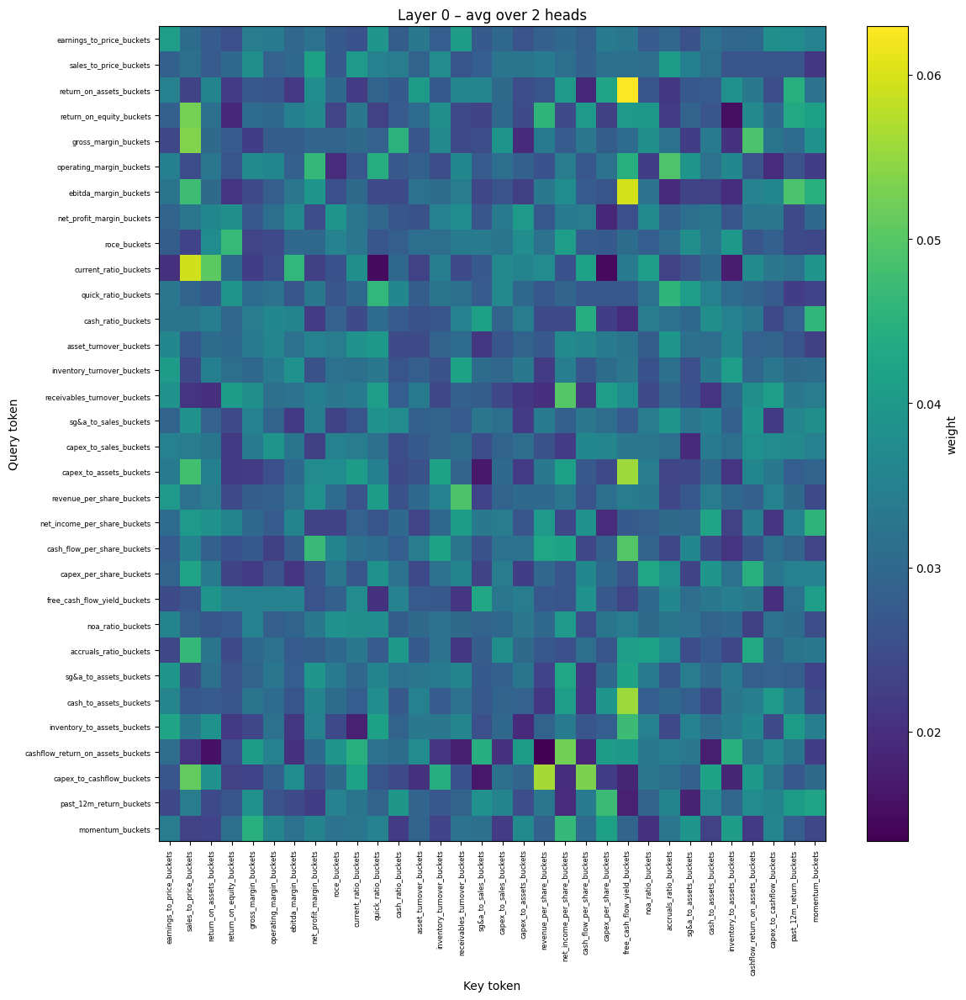

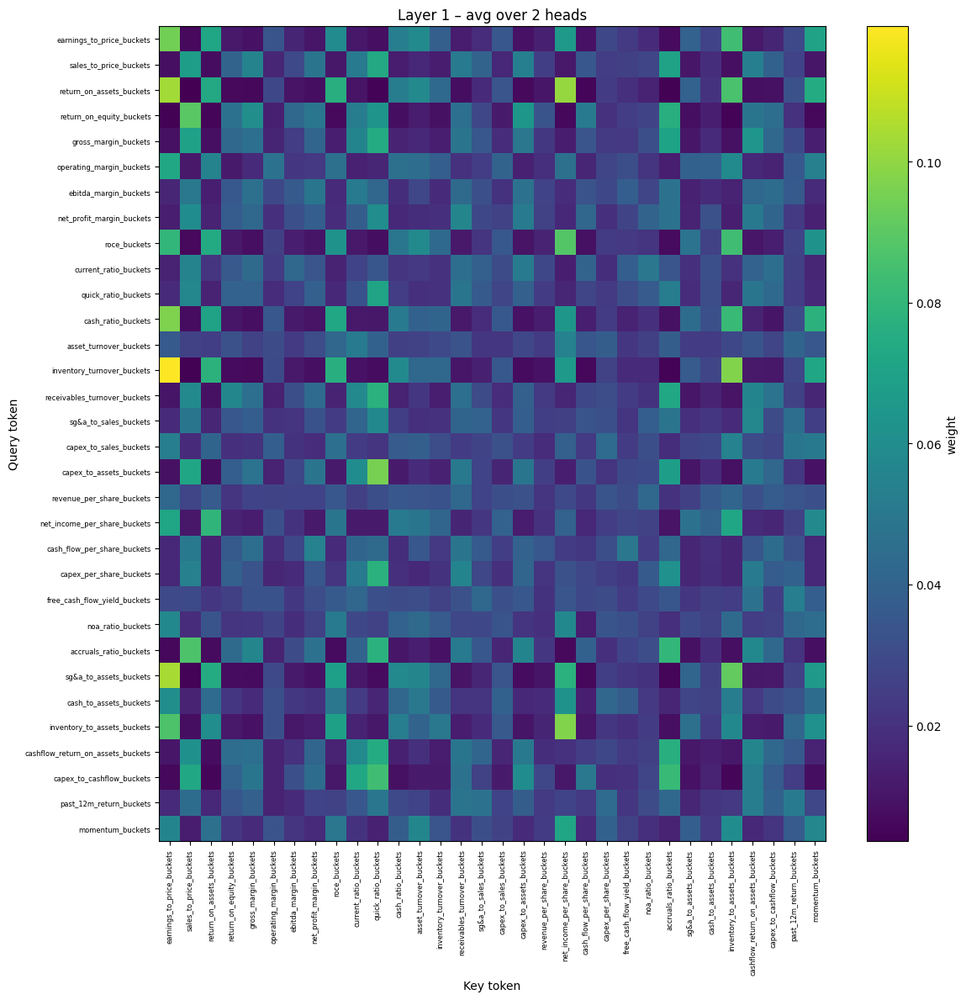

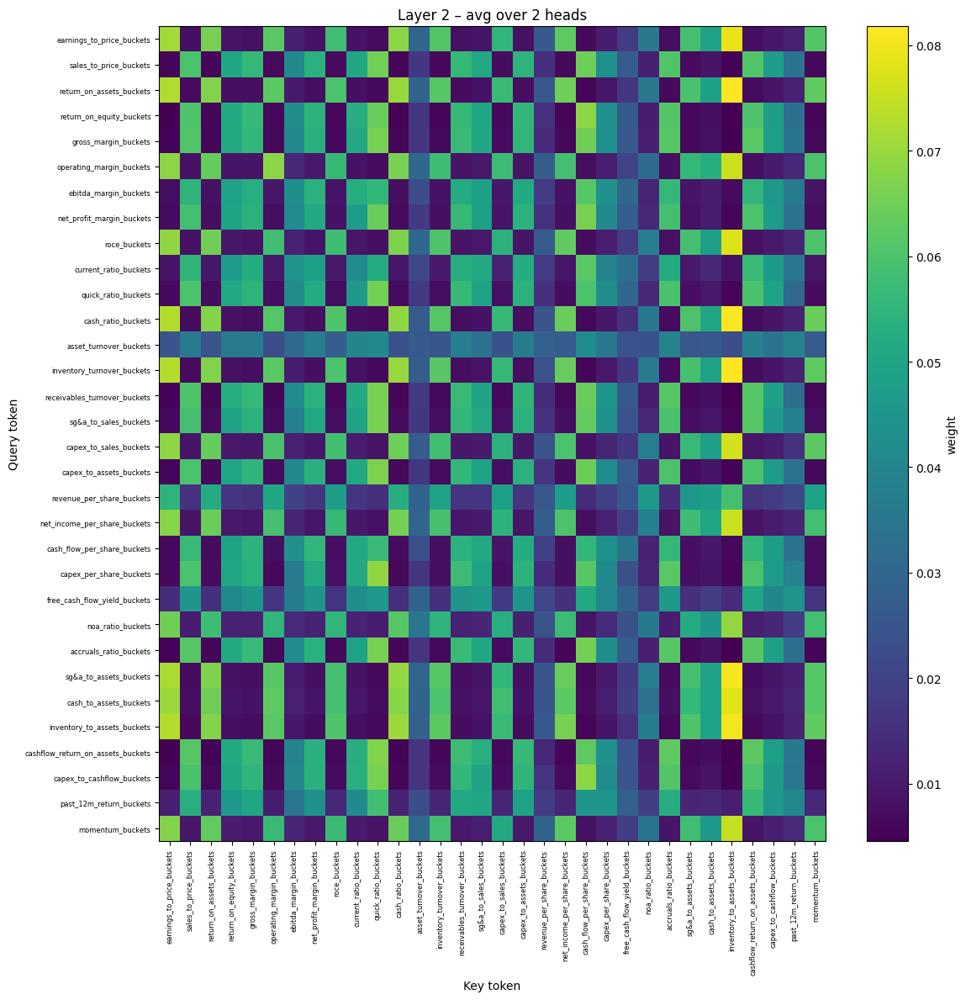

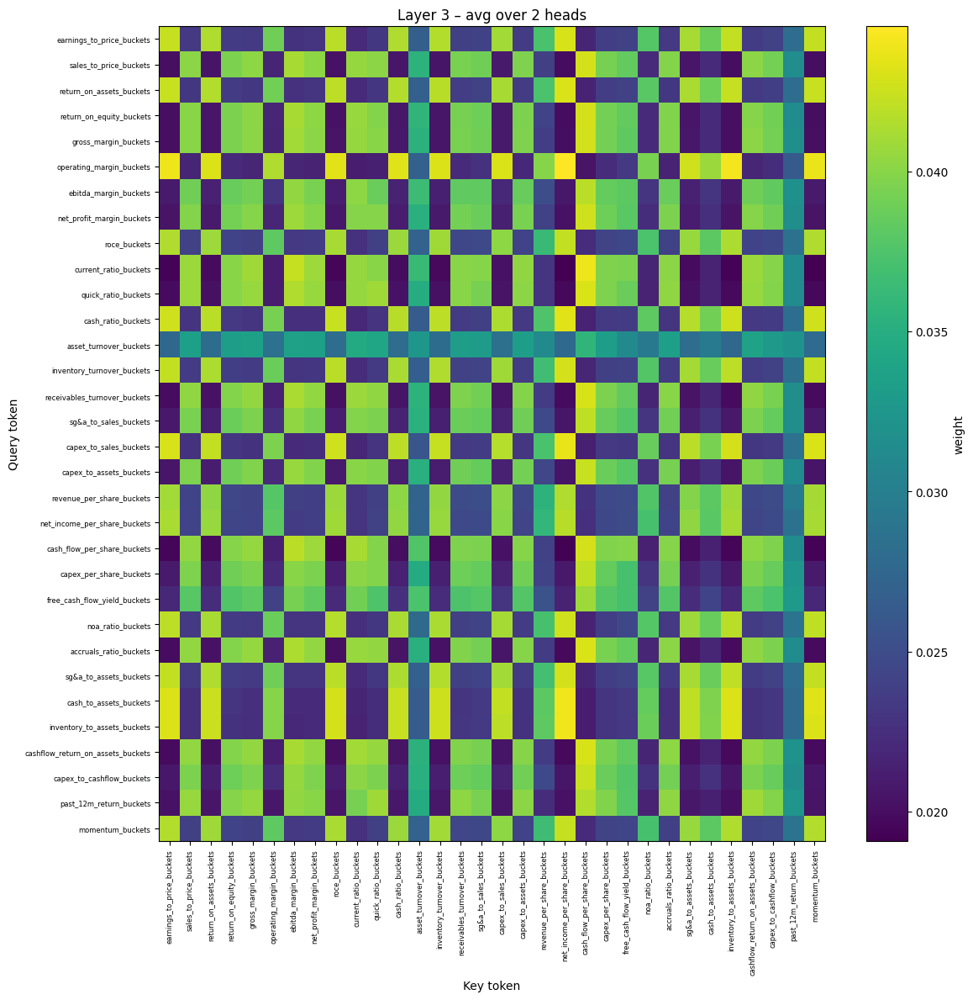

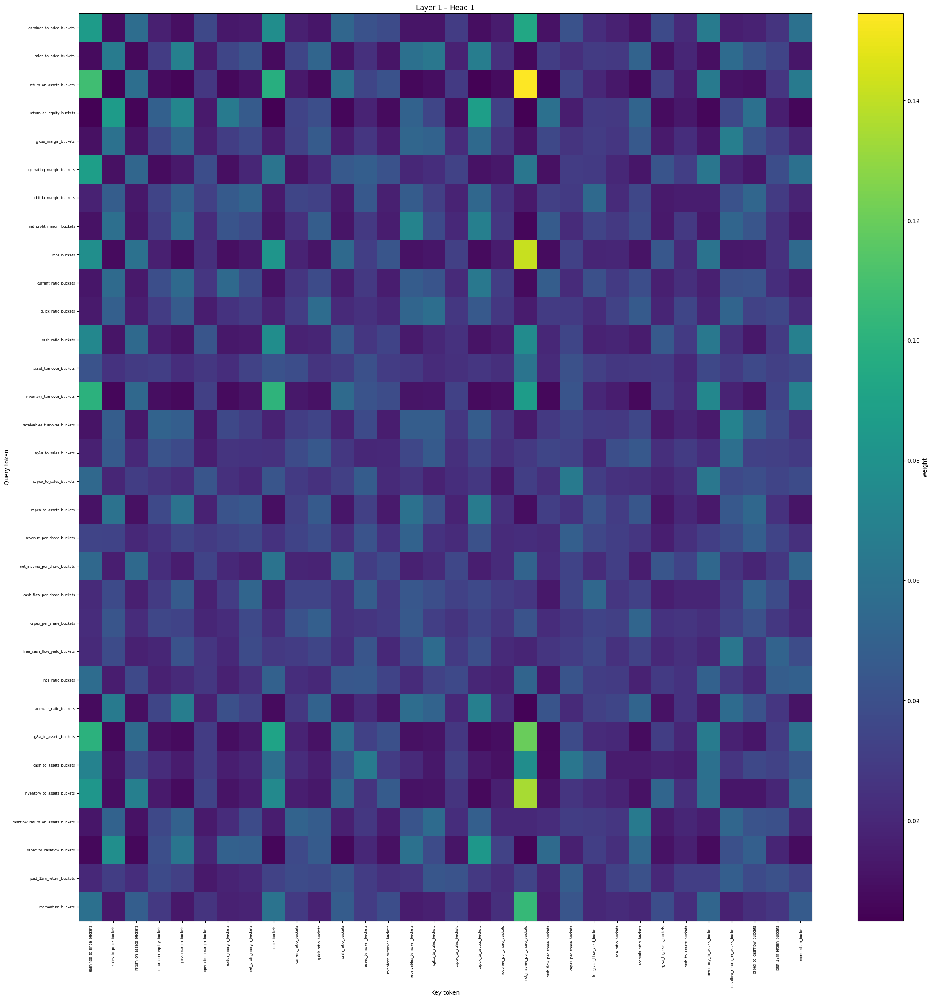

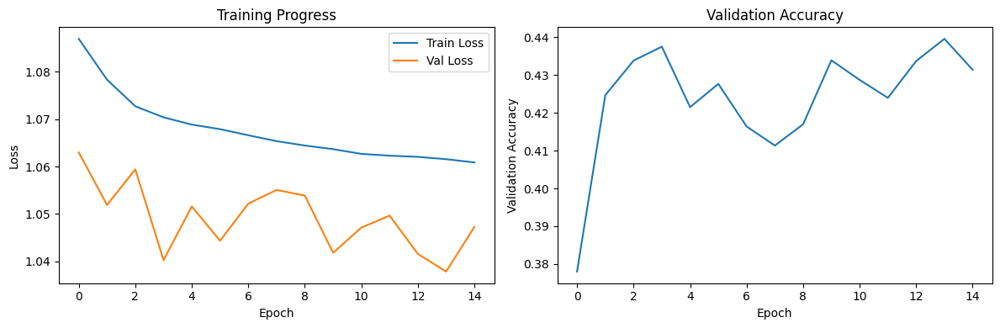

<Figure size 640x480 with 0 Axes>

Dropping: ['momentum_buckets', 'earnings_to_price_buckets', 'free_cash_flow_yield_buckets', 'past_12m_return_buckets', 'book_to_market_buckets']
(375323, 27)
(3955640, 12)
Rows with threshold = 0 : 239812
Rows with threshold = 1 : 260584
Rows with threshold = 2 : 302075
Rows with threshold = 3 : 308810
Rows with threshold = 4 : 314241
Rows with threshold = 5 : 314935
Rows with threshold = 6 : 315205
Rows with threshold = 7 : 315426
Rows with threshold = 8 : 338591
Rows with threshold = 9 : 362296
Rows with threshold = 10 : 366990
Rows with threshold = 11 : 372648
Rows with threshold = 12 : 374020
Rows with threshold = 13 : 374630
Rows with threshold = 14 : 374956
Rows with threshold = 15 : 375212
Rows with threshold = 16 : 375267
Rows with threshold = 17 : 375322
23
Initial ratios_df shape: (161072, 38)
Before imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
After imputation - Train: (113262, 38), Val: (22730, 38), Test: (25080, 38)
Training Dataset: 70.32%
Validat

,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,cash_flow_per_share_buckets,capex_per_share_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,return_12m_forward_label
10,14,1,2006,1855,0,0,0,0,0,0,...,1,6,0,9,0,3,1,0,0,0
11,14,1,2007,1855,0,0,0,0,0,0,...,2,7,0,6,6,9,1,2,9,0
12,14,1,2008,1855,0,0,0,0,0,0,...,0,8,0,8,2,3,2,0,0,2
13,14,1,2009,1855,0,0,0,0,12,0,...,0,7,0,1,4,1,2,0,0,2
14,14,1,2010,1855,0,0,0,0,0,0,...,5,7,0,2,3,5,2,4,8,2


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,cash_flow_per_share_buckets,capex_per_share_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,return_12m_forward_label
24,14,1,2020,1855,1,0,0,0,0,0,...,6,5,7,1,0,1,1,7,5,1
25,14,1,2021,1855,1,0,0,0,0,0,...,6,4,8,3,0,1,2,7,3,0
50,14,1,2020,2162,5,0,1,0,0,0,...,5,2,8,7,3,2,2,3,3,2
51,14,1,2021,2162,2,0,1,0,0,0,...,7,2,8,7,6,5,2,8,2,0
152,12,2,2020,7041,0,0,0,0,0,0,...,2,0,7,1,7,6,7,7,2,0


,country_code,industry,year_,global_company_key,book_to_market,earnings_to_price,sales_to_price,return_on_assets,return_on_equity,gross_margin,...,cash_flow_per_share_buckets,capex_per_share_buckets,noa_ratio_buckets,accruals_ratio_buckets,sg&a_to_assets_buckets,cash_to_assets_buckets,inventory_to_assets_buckets,cashflow_return_on_assets_buckets,capex_to_cashflow_buckets,return_12m_forward_label
26,14,1,2022,1855,3,0,1,0,0,0,...,6,5,8,2,0,1,1,7,4,1
27,14,1,2023,1855,3,0,1,0,0,0,...,6,5,9,3,0,1,1,5,6,2
52,14,1,2022,2162,4,0,2,0,0,0,...,7,2,8,7,6,7,2,8,2,1
53,14,1,2023,2162,5,0,1,0,0,0,...,6,3,8,6,5,7,2,4,3,1
154,12,2,2022,7041,0,0,2,0,0,0,...,1,1,2,9,6,3,4,0,1,1


Final shapes - Train: (113262, 67), Val: (22730, 67), Test: (25080, 67)
Training years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validation years: [2020, 2021]
Test years: [2022, 2023, 2024]
not using :( stock embedding
Using device: cuda
Training on years: [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Validating on year: [2020, 2021]
Testing on year: [2022, 2023, 2024]
Training samples: 113,262
Validation samples: 22,730
Testing samples: 25,080

Weightted vector is valid: [1.0, 1.2121965144904125, 1.454635817388495]


Epochs:   7%|█████                                                                       | 1/15 [00:26<06:05, 26.14s/it]

Epoch 0 Avg Confidence: 0.3763
Best Model now for class 2 f1 score: 0.5486239703722623 and Precision = 0.378002639683238
Epoch   0: Train Loss 1.0900, Val Loss 1.0665, Val Acc 0.3780
Epoch   0: Train Loss 1.0900, Val Loss 1.0665, Val Acc 0.3780


Epochs:  13%|██████████▏                                                                 | 2/15 [00:52<05:40, 26.19s/it]

Epoch 1 Avg Confidence: 0.3704
Epoch   1: Train Loss 1.0845, Val Loss 1.0692, Val Acc 0.3780


Epochs:  20%|███████████████▏                                                            | 3/15 [01:18<05:14, 26.19s/it]

Epoch 2 Avg Confidence: 0.3902
Epoch   2: Train Loss 1.0828, Val Loss 1.0596, Val Acc 0.3784


Epochs:  27%|████████████████████▎                                                       | 4/15 [01:44<04:48, 26.20s/it]

Epoch 3 Avg Confidence: 0.3851
Epoch   3: Train Loss 1.0816, Val Loss 1.0615, Val Acc 0.3778


Epochs:  33%|█████████████████████████▎                                                  | 5/15 [02:11<04:22, 26.21s/it]

Epoch 4 Avg Confidence: 0.4074
Epoch   4: Train Loss 1.0801, Val Loss 1.0525, Val Acc 0.3786


Epochs:  40%|██████████████████████████████▍                                             | 6/15 [02:37<03:55, 26.22s/it]

Epoch 5 Avg Confidence: 0.3870
Epoch   5: Train Loss 1.0794, Val Loss 1.0594, Val Acc 0.3740


Epochs:  47%|███████████████████████████████████▍                                        | 7/15 [03:03<03:29, 26.22s/it]

Epoch 6 Avg Confidence: 0.3772
Epoch   6: Train Loss 1.0777, Val Loss 1.0650, Val Acc 0.3893


Epochs:  53%|████████████████████████████████████████▌                                   | 8/15 [03:29<03:03, 26.23s/it]

Epoch 7 Avg Confidence: 0.3762
Epoch   7: Train Loss 1.0776, Val Loss 1.0641, Val Acc 0.3832


Epochs:  60%|█████████████████████████████████████████████▌                              | 9/15 [03:55<02:37, 26.23s/it]

Epoch 8 Avg Confidence: 0.3972
Epoch   8: Train Loss 1.0778, Val Loss 1.0607, Val Acc 0.3736


Epochs:  67%|██████████████████████████████████████████████████                         | 10/15 [04:22<02:11, 26.24s/it]

Epoch 9 Avg Confidence: 0.4006
Epoch   9: Train Loss 1.0768, Val Loss 1.0565, Val Acc 0.3840


Epochs:  73%|██████████████████████████████████████████████████████▉                    | 11/15 [04:48<01:44, 26.24s/it]

Epoch 10 Avg Confidence: 0.3881
Epoch  10: Train Loss 1.0766, Val Loss 1.0656, Val Acc 0.3791
Epoch  10: Train Loss 1.0766, Val Loss 1.0656, Val Acc 0.3791


Epochs:  80%|████████████████████████████████████████████████████████████               | 12/15 [05:14<01:18, 26.23s/it]

Epoch 11 Avg Confidence: 0.3942
Epoch  11: Train Loss 1.0763, Val Loss 1.0600, Val Acc 0.3754


Epochs:  87%|█████████████████████████████████████████████████████████████████          | 13/15 [05:40<00:52, 26.22s/it]

Epoch 12 Avg Confidence: 0.3947
Epoch  12: Train Loss 1.0754, Val Loss 1.0646, Val Acc 0.3813


Epochs:  93%|██████████████████████████████████████████████████████████████████████     | 14/15 [06:07<00:26, 26.21s/it]

Epoch 13 Avg Confidence: 0.3888
Epoch  13: Train Loss 1.0748, Val Loss 1.0727, Val Acc 0.3666


Epochs: 100%|███████████████████████████████████████████████████████████████████████████| 15/15 [06:33<00:00, 26.22s/it]

Epoch 14 Avg Confidence: 0.3905
Epoch  14: Train Loss 1.0744, Val Loss 1.0655, Val Acc 0.3828
Epoch  14: Train Loss 1.0744, Val Loss 1.0655, Val Acc 0.3828

FINAL RESULTS
Best validation accuracy: 0.3893
Final validation accuracy: 0.3828

Validation Confusion Matrix:
[[1982 1040 2242]
 [2502 1848 4524]
 [2128 1593 4871]]

=== PER-CLASS ACCURACY BREAKDOWN ===
Class 0: 37.7% accuracy (1982/5264 correct)
Class 1: 20.8% accuracy (1848/8874 correct)
Class 2: 56.7% accuracy (4871/8592 correct)

Classification Report (Validation!!):
              precision    recall  f1-score   support

     Class 0       0.30      0.38      0.33      5264
     Class 1       0.41      0.21      0.28      8874
     Class 2       0.42      0.57      0.48      8592

    accuracy                           0.38     22730
   macro avg       0.38      0.38      0.36     22730
weighted avg       0.39      0.38      0.37     22730



Confusion Matrix (TESTING ):
[[2652 1269 2873]
 [2596 1985 5099]
 [2450 1709 4447]]

Classification Report (TESTING):
              precision    recall  f1-score   support

     Class 0       0.34      0.39      0.37      6794
     Class 1       0.40      0.21      0.27      9680
     Class 2       0.36      0.52      0.42      8606

    accuracy                           0.36     25080
   macro avg       0.37      0.37      0.35     25080
weighted avg       0.37      0.36      0.35     25080


BEST MODEL EVALUATION (from epoch 0)

Classification Report for THE CLASS 2 F1 HEAVY MODEL:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      5264
     Class 1       0.00      0.00      0.00      8874
     Class 2       0.38      1.00      0.55      8592

    accuracy                           0.38     22730
   macro avg       0.13      0.33      0.18     22730
weighted avg       0.14      0.38      0.21     22730


Best Model Confusion Matri

/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Confusion Matrix (TESTING THE CLASS 2 F1 HEAVY MODEL ):
[[   0    0 6794]
 [   0    0 9680]
 [   0    0 8606]]

Classification Report (TESTING THE CLASS 2 F1 HEAVY MODEL):
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      6794
     Class 1       0.00      0.00      0.00      9680
     Class 2       0.34      1.00      0.51      8606

    accuracy                           0.34     25080
   macro avg       0.11      0.33      0.17     25080
weighted avg       0.12      0.34      0.18     25080

Layer 0: torch.Size([32, 2, 28, 28])
Layer 1: torch.Size([32, 2, 28, 28])
Layer 2: torch.Size([32, 2, 28, 28])
Layer 3: torch.Size([32, 2, 28, 28])


/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/springbrook/share/wbs/transformer_dissertation/venv/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

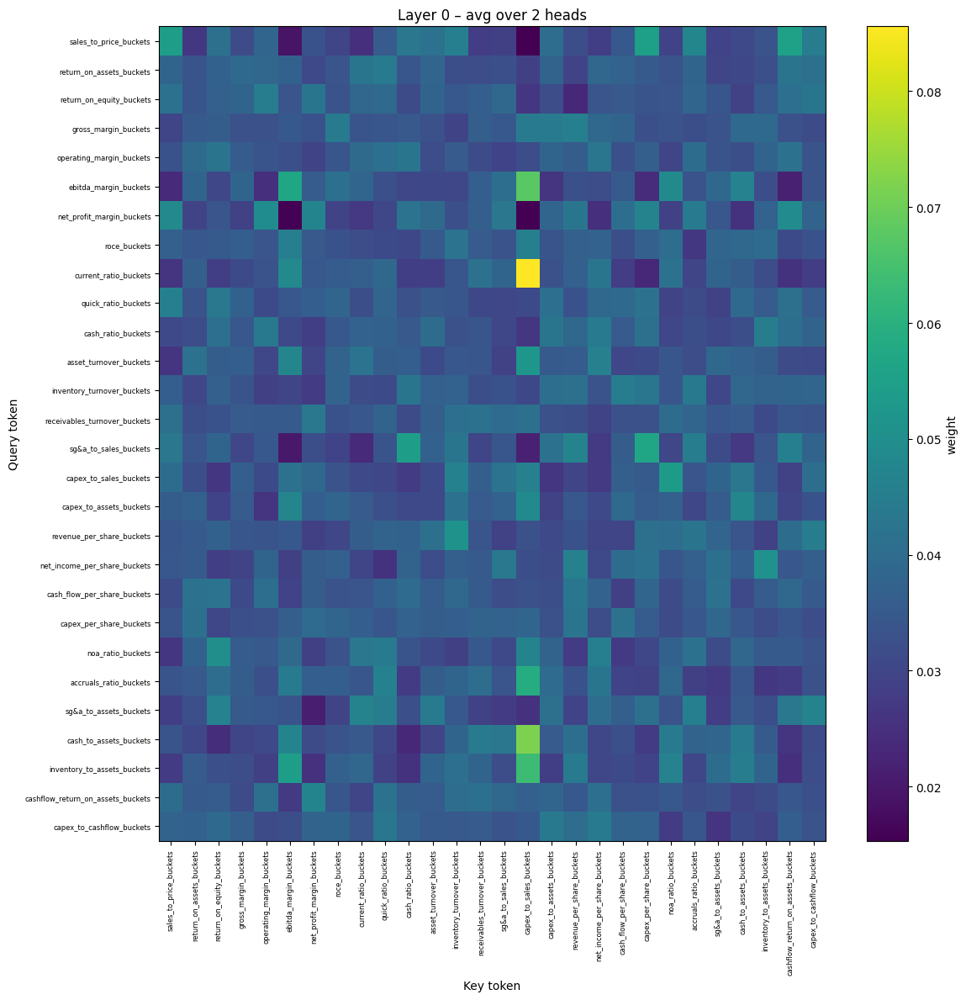

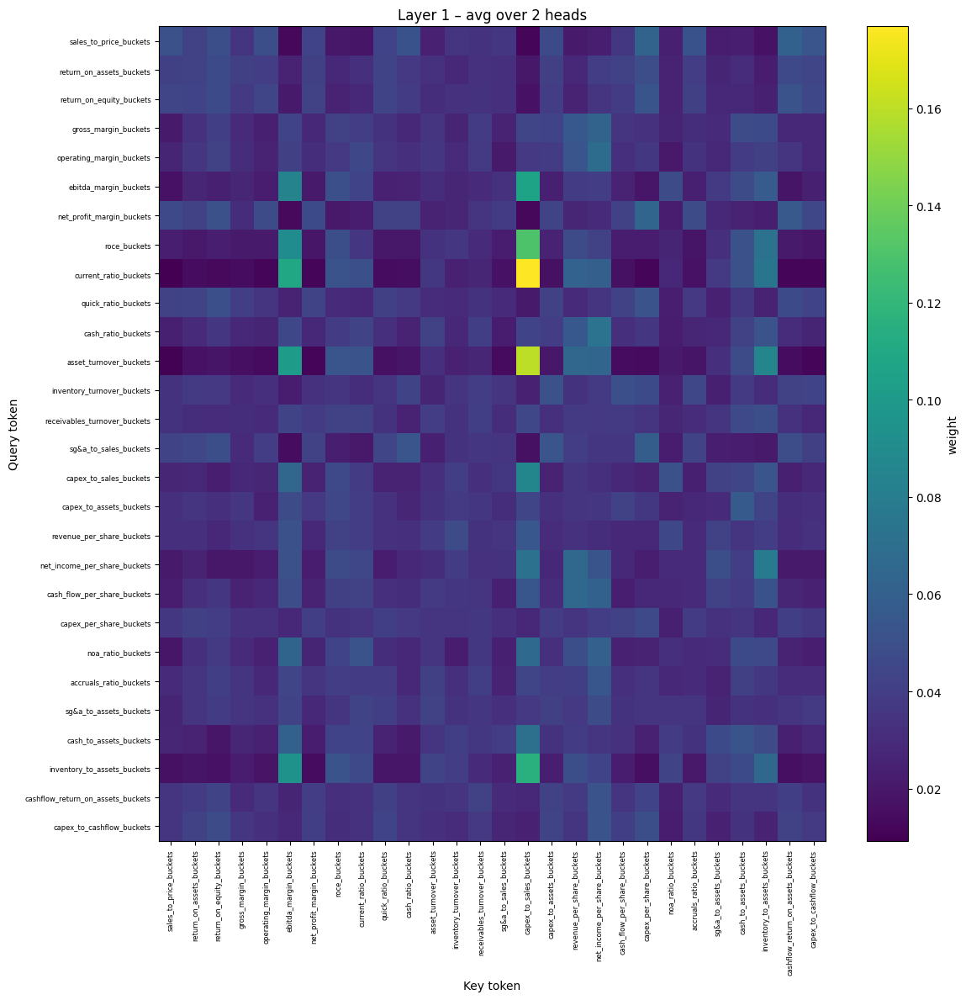

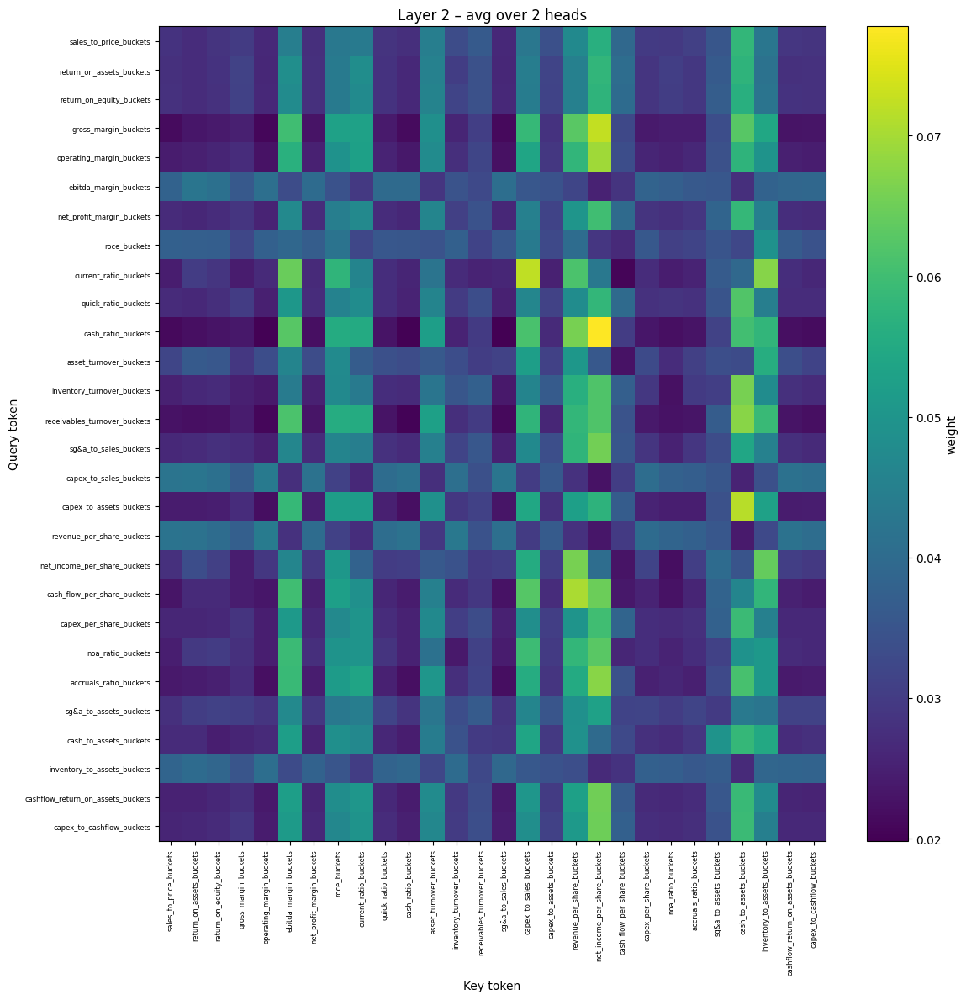

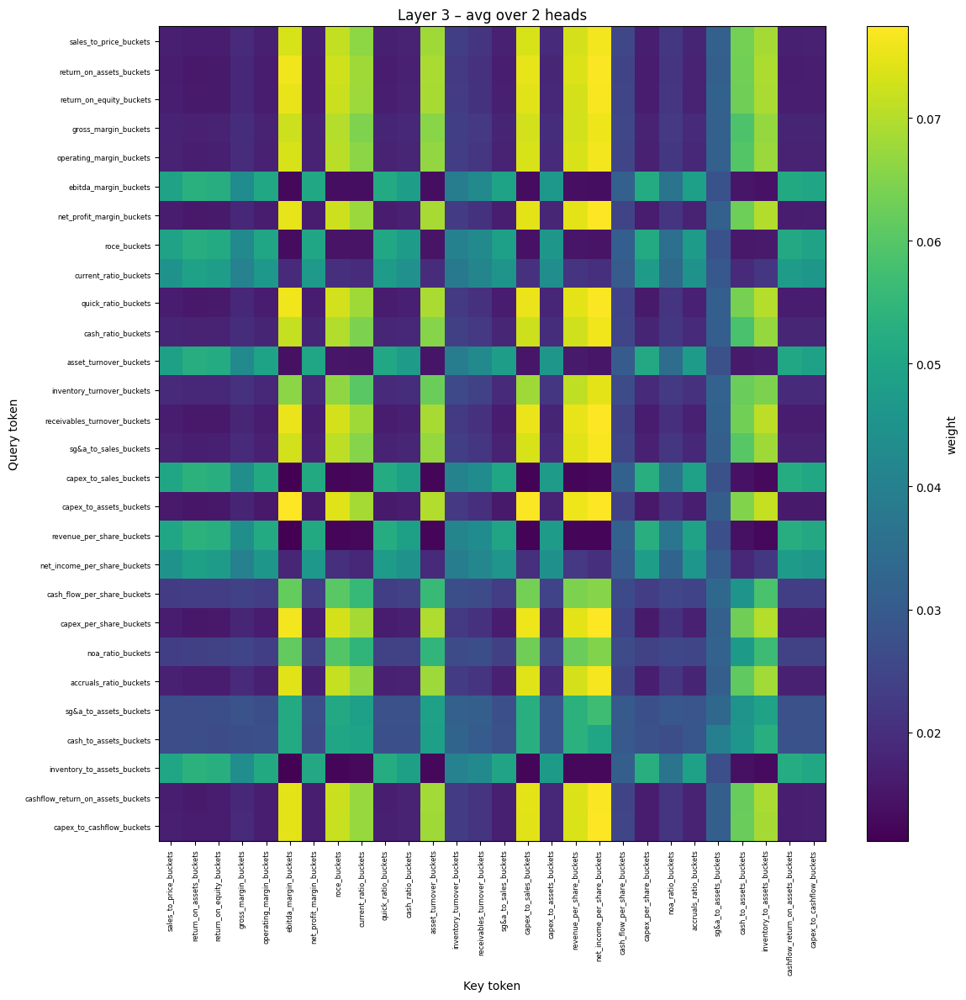

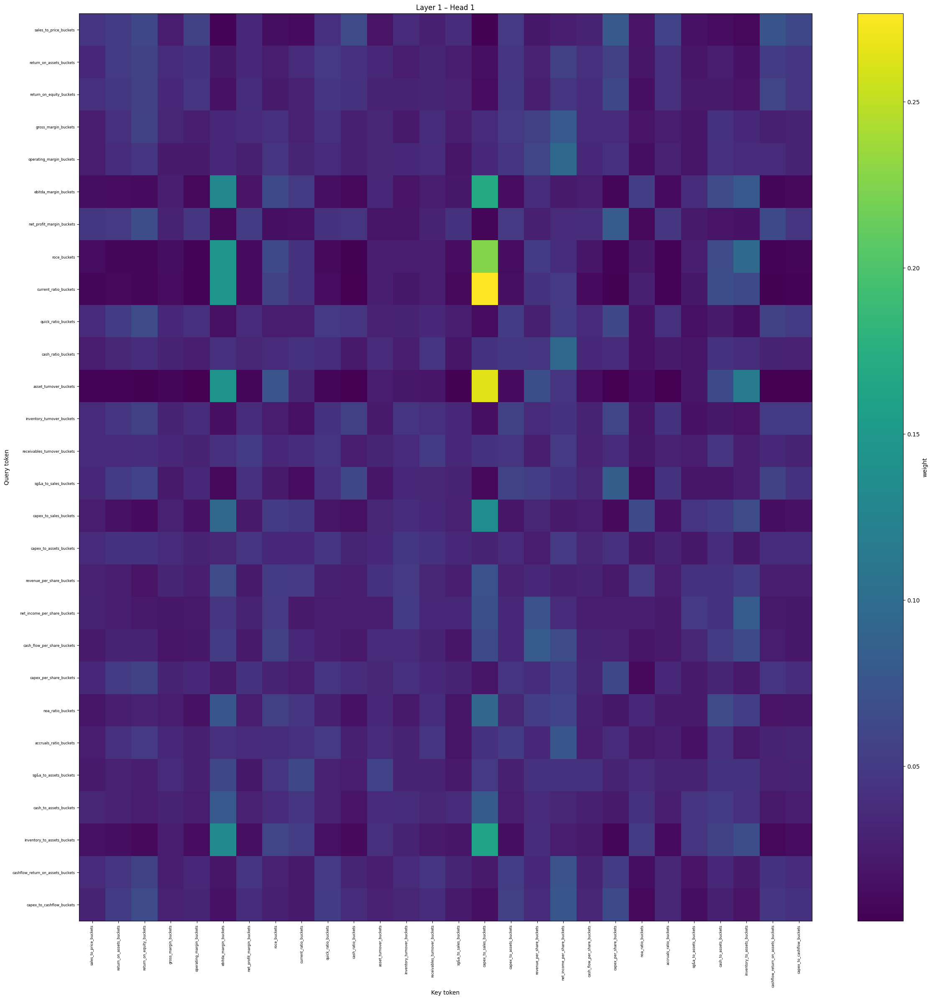

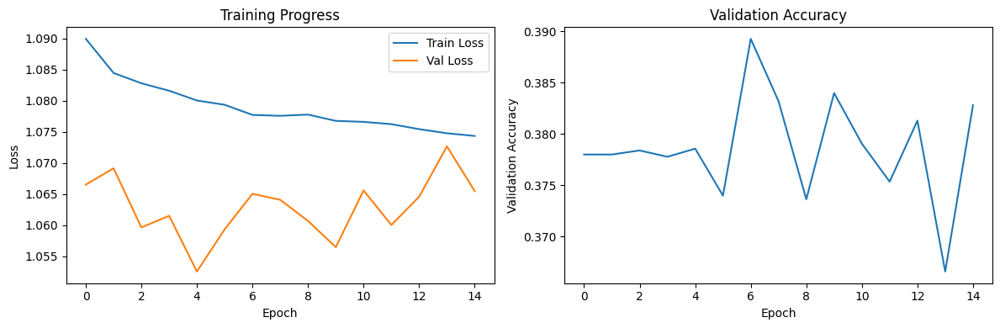

<Figure size 640x480 with 0 Axes>

In [17]:
def apply_ablation(drop_cols):
    train, val, test = giga_func_2(2020, 2021, 2024, drop_cols = drop_cols)
    train_data = train
    val_data = val
    test_data = test
    bucket_cols = [col for col in train_data.columns if col.endswith('_buckets') and col != 'return_12m_forward_label']
    impute_cols = [col for col in train_data.columns if col.endswith('_was_imputed') and col != 'return_12m_forward_label']
    impute_cols = []
    bucket_sizes = [11] * len(bucket_cols) + [2] * len(impute_cols)
    num_of_stock = 0
    num_of_years = 0
    num_of_industry = 0
    num_of_industry_format = 0
    num_of_country = 0 
    
    meta_cols = [
        'fake_stock_id_meta',
        'month_meta',
        'industry_id_meta',
        'industry_format_id_meta',
        'country_id_meta'
    ]
    
    for col in meta_cols:
        train_data[col] = 0
        val_data[col] = 0
        test_data[col] = 0

    model = BucketTransformer_mine(
                                   bucket_sizes=bucket_sizes, 
                                   embedding_dim=32, #32 #16
                                   n_heads=2,# 2 1
                                   n_layers=4,# 21
                                   dropout_transformer=0.23525280263751489, 
                                   number_of_classes = 3, 
                                   dropout_classifier = 0.17796988235965303,
                                   start_year = 2006,
                                   end_year = 2025,
                                   activation = 'relu',
                                   num_years=num_of_years,
                                   num_of_stock = num_of_stock,
                                   num_of_industry = num_of_industry,
                                   num_of_industry_format = num_of_industry_format,
                                   num_of_country = num_of_country,
                                   ratio_cols = bucket_cols,
                                   impute_cols = impute_cols) 
    

    results = train_model_mine(
                            model, 
                            train_data,
                            val_data,
                            test_data,
                            epochs=15, #10 
                            batch_size=32, #16
                            learning_rate= 0.00017126110830893184, #  0.0001
                            weight_decay = 3.900297055579936e-06, 
                            weights_for_criterion = [1.0, 1.2121965144904125, 1.2 * 1.2121965144904125],
                            num_of_classes =3,
                            patience = 10, # Depends on epochs
                            T_0=3, # For cosine
                            T_mult=2, # For cosine
                            optimizer_name='Adam',
                            scheduler_name='plateau', 
                            plateau_patience=5,
                            plateau_factor=0.7944832528930469, 
                            step_size = 5,
                            gamma = 0.1,
                            label_smoothing = 0.003541588306763793,
                            trial=None,
                            model_save = False)
    
    val_loader = results['val_loader'] # Form the saved model so model save needs to be turned on
    save_outputs, handles = attach_attention_capture(model)
    _ = run_one_validation_batch(model, val_loader)
    
    # Simple Sanity check
    print_attn_shapes(save_outputs)  #expect (B, H, N, N) per layer
    
    #Plots
    token_labels = bucket_cols + impute_cols  # (you masked metadata)
    plot_all_layers(save_outputs, token_labels, sample_idx=0, avg_heads=True)
    plot_attention_main(save_outputs, token_labels, layer=1, head=1, sample=0)

    
    # 4) When done
    remove_attention_capture(handles)

    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(results['train_losses'], label='Train Loss')  # Note: 'train_losses' not 'train_loss'
    plt.plot(results['val_losses'], label='Val Loss')      # Note: 'val_losses' not 'val_loss'
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training Progress')
    
    plt.subplot(1, 2, 2)
    plt.plot(results['val_accuracies'])  # Note: 'val_accuracies' not 'val_acc'
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.title('Validation Accuracy')
    
    plt.tight_layout()
    plt.show()
    plt.tight_layout()
    plt.show()






 # 1. momentum_buckets     and the id: 32  score=1.1315
 # 2. earnings_to_price_buckets and the id: 1  score=0.5233
 # 3. free_cash_flow_yield_buckets and the id: 23  score=0.3779
 # 4. past_12m_return_buckets and the id: 31  score=0.3585
 # 5. book_to_market_buckets and the id: 0  score=0.3407


drop_cols1 = ['momentum_buckets']
drop_cols2 = ['earnings_to_price_buckets']
drop_cols3 = ['free_cash_flow_yield_buckets']
drop_cols4 = ['past_12m_return_buckets']
drop_cols5 = ['book_to_market_buckets']
drop_cols_all = ['momentum_buckets', "earnings_to_price_buckets", "free_cash_flow_yield_buckets","past_12m_return_buckets","book_to_market_buckets"]

print(f'Dropping: {drop_cols1}')
apply_ablation(drop_cols1)
print(f'Dropping: {drop_cols2}')
apply_ablation(drop_cols2)
print(f'Dropping: {drop_cols3}')
apply_ablation(drop_cols3)
print(f'Dropping: {drop_cols4}')
apply_ablation(drop_cols4)
print(f'Dropping: {drop_cols5}')
apply_ablation(drop_cols5)
print(f'Dropping: {drop_cols_all}')
apply_ablation(drop_cols_all)

### Visualising Transformer Attention Weights

This section plots the query (`W_Q`), key (`W_K`), and value (`W_V`) projection weights from the first transformer layer.

- The weights are extracted from `in_proj_weight` of each layer's self-attention.
- Each matrix is split into its Q, K, V parts based on the embedding dimension.
- A heatmap is shown for each, with head boundaries marked for clarity.


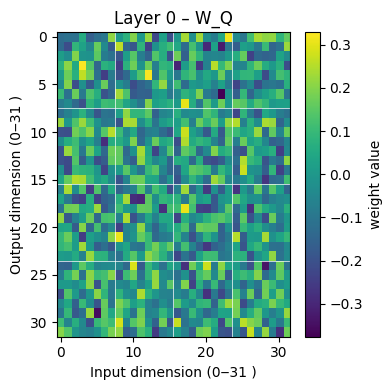

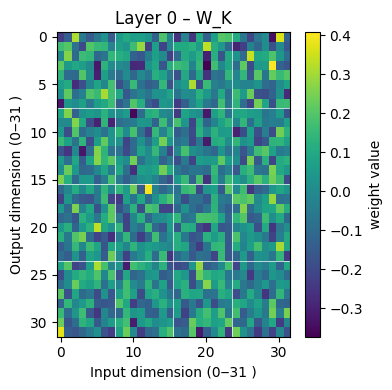

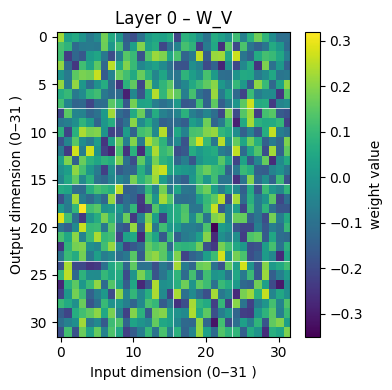

In [16]:
weights = {"W_Q": [], "W_K": [], "W_V": []}

for idx, layer in enumerate(model.transformer.layers):
    mha = layer.self_attn
    d   = mha.embed_dim
    W   = mha.in_proj_weight.detach().cpu()
    weights["W_Q"].append(W[:d, :])
    weights["W_K"].append(W[d:2*d, :])
    weights["W_V"].append(W[2*d:, :])

import matplotlib.pyplot as plt

# assume weights dict is already populated
def plot_heat(mat, title="", n_heads=4):
    d = mat.shape[0]
    plt.figure(figsize=(4,4))
    plt.imshow(mat, aspect='auto')
    plt.title(title)
    plt.xlabel("Input dimension (0‒{} )".format(d-1))
    plt.ylabel("Output dimension (0‒{} )".format(d-1))

    # optional: draw vertical / horizontal lines to separate heads
    head_dim = d // n_heads
    for h in range(1, n_heads):
        plt.axhline(h*head_dim-0.5, color='white', linewidth=0.5)
        plt.axvline(h*head_dim-0.5, color='white', linewidth=0.5)

    plt.colorbar(label="weight value")
    plt.tight_layout()
    plt.show()


# Visualize the weights from Layer 0
plot_heat(weights["W_Q"][0], "Layer 0 – W_Q")
plot_heat(weights["W_K"][0], "Layer 0 – W_K")
plot_heat(weights["W_V"][0], "Layer 0 – W_V")

### Attention Entropy Ranking

This section checks how focused each transformer layer is by measuring attention entropy.

**What it does:**
- For each layer, it calculates how "spread out" the attention is using entropy.
- Lower entropy = more focused attention.
- Higher entropy = more diffused attention.

**Steps:**
1. Loop through saved attention outputs.
2. Compute entropy for each attention head.
3. Average the entropy across all heads and batches.
4. Rank layers from most to least focused.

**Result:**
Prints a list of layers ranked by how focused their attention is.


In [18]:
entropies = []
eps = 1e-12

for idx, hook in enumerate(save_outputs):
    # hook.outputs[0]: (B, H, N, N)
    A = hook.outputs[0] + eps           # avoid log(0)
    # compute per-query entropy: H_{b,h,q} = -∑_k A·log A  → shape (B, H, N)
    H = - (A * A.log()).sum(dim=-1)
    # average over batch & query positions → per-head entropy (shape H,)
    H_per_head = H.mean(dim=(0,2))
    # average over heads → scalar per layer
    entropies.append(H_per_head.mean().item())

# sort layers by increasing entropy
ranking = sorted(range(len(entropies)), key=lambda i: entropies[i])

print("Layer ranking (most focused → least):", ranking)
for i in ranking:
    print(f"  Layer {i}: entropy = {entropies[i]:.4f}")

Layer ranking (most focused → least): [1, 2, 3, 0]
  Layer 1: entropy = 1.6820
  Layer 2: entropy = 2.6501
  Layer 3: entropy = 2.7685
  Layer 0: entropy = 3.3953


### Attention-Based Feature Importance

This section identifies which features receive the most attention across all transformer layers.

**What it does:**
- Averages attention scores across all heads and layers.
- Measures how much attention each token (feature) receives (as a *key*).
- Ranks features by total attention received.

**Steps:**
1. For each layer, average attention across heads and select the first sample.
2. Sum attention values *received* by each token (column-wise).
3. Average the totals across all layers.
4. Print top-5 most attended tokens (based on key attention).
5. Save token indices and names for further use (e.g., ablation).

**Purpose:**
Helps to determine which features the model deems most important during attention, which can guide ablation or interpretation.


In [19]:
# ---------------------------------------------------------------
# aggregate scores
# ---------------------------------------------------------------
all_valid_cols = bucket_cols + impute_cols
L = len(save_outputs)                   # number of transformer layers
N = len(token_labels)                   # sequence length

score_per_token = None

for s in save_outputs:
    mat = s.outputs[0].mean(1)[0]          # (N, N)
    if score_per_token is None:
        score_per_token = torch.zeros(mat.size(-1))
    score_per_token += mat.sum(0)
score_per_token /= len(save_outputs)

# score_per_token = torch.zeros(N)        # accumulator on CPU

# for layer_idx, s in enumerate(save_outputs):
#     attn = s.outputs[0]                 # shape (B, H, N, N)  — we stored only 1 batch
#     mat  = attn.mean(dim=1)[0]          # avg over heads, pick sample 0  → (N, N)

#     # -------------------------------------------
#     # keys-dominant: total attention *received*
#     score_per_token += mat.sum(dim=0)   #   (N,)all_valid_cols
#     # For queries-dominant, swap to:  mat.sum(dim=1)
#     # -------------------------------------------

# average over layers so values stay ~[0,1]
score_per_token /= L

# ---------------------------------------------------------------
# print Top-k tokens
# ---------------------------------------------------------------
k = 5
topk = torch.topk(score_per_token, k=k)
important_ids = []
drop_names =[]
print(f"\nTop-{k} tokens by total received attention (keys):")
for rank, (idx, val) in enumerate(zip(topk.indices, topk.values), 1):
    name = token_labels[idx]
    print(f"{rank:>2}. {name:<20s} and the id: {idx}  score={val.item():.4f}")
    if name.endswith('_buckets') or name.endswith('_imputed'):
        important_ids.append(idx)
        drop_names.append(name)
print(f'important_ids are : {important_ids}')


print(len(all_valid_cols))
#print(all_valid_cols)
print(drop_names)
keep_idx   = [i for i in all_valid_cols if i not in drop_names]
print(len(keep_idx))

all_names  = val_loader.dataset.feature_names          # list[str]
print(f'all the names of each col: {all_names}')
num_of_ratios = 0
for name in all_names:
    if name.endswith('_buckets'):
        num_of_ratios += 1
print(num_of_ratios)


Top-5 tokens by total received attention (keys):
 1. momentum_buckets     and the id: 32  score=1.1315
 2. earnings_to_price_buckets and the id: 1  score=0.5233
 3. free_cash_flow_yield_buckets and the id: 23  score=0.3779
 4. past_12m_return_buckets and the id: 31  score=0.3585
 5. book_to_market_buckets and the id: 0  score=0.3407
important_ids are : [tensor(32), tensor(1), tensor(23), tensor(31), tensor(0)]
33
['momentum_buckets', 'earnings_to_price_buckets', 'free_cash_flow_yield_buckets', 'past_12m_return_buckets', 'book_to_market_buckets']
28
all the names of each col: ['book_to_market_buckets', 'earnings_to_price_buckets', 'sales_to_price_buckets', 'return_on_assets_buckets', 'return_on_equity_buckets', 'gross_margin_buckets', 'operating_margin_buckets', 'ebitda_margin_buckets', 'net_profit_margin_buckets', 'roce_buckets', 'current_ratio_buckets', 'quick_ratio_buckets', 'cash_ratio_buckets', 'asset_turnover_buckets', 'inventory_turnover_buckets', 'receivables_turnover_buckets',

### Head Ablation via Forward Hook

This section tests the importance of individual attention heads by measuring the impact on validation loss when a specific head is "muted" (set to zero).

**Steps:**
- For each layer and head:
  - Register a hook that zeroes out the selected head during the forward pass.
  - Compute validation loss with and without the head.
  - Report the change in loss (Δloss).

**Purpose:**
Quantifies the contribution of each attention head to model performance. Larger Δloss indicates greater importance of that head.


In [20]:
ce_loss = torch.nn.CrossEntropyLoss()

@torch.inference_mode()
def score_head_ablation(model, data_loader, layer_idx, head_idx, device=device):
    # ---------- hook that zeros one head ----------
    def mute_head(mod, inp, out):
        ctx, attn = out                          # (L,B,E)
        H, D = mod.num_heads, ctx.shape[-1] // mod.num_heads
        ctx = ctx.view(ctx.size(0), ctx.size(1), H, D)
        ctx[..., head_idx, :] = 0.0              # mute chosen head
        return ctx.view_as(out[0]), attn

    # ---------- eval pass helper ------------------
    def run(loader):
        tot, cnt = 0.0, 0
        for batch in loader:
            logits = model(
                batch["features"].to(device),
                batch["year"].to(device),
                batch["fake_stock_id"].to(device),
                batch["industry"].to(device),
                batch["industry_format"].to(device),
                batch["country"].to(device),
            )                                    # logits shape [B, C]
            loss = ce_loss(logits,
                           batch["target"].to(device).long())
            tot += loss.item() * logits.size(0);  cnt += logits.size(0)
        return tot / cnt

    base = run(data_loader)

    hook = model.transformer.layers[layer_idx].self_attn.register_forward_hook(mute_head)
    ablated = run(data_loader)
    hook.remove()

    return base, ablated, ablated - base
for layer_idx, lyr in enumerate(model.transformer.layers):
    n_heads = lyr.self_attn.num_heads
    for head_idx in range(n_heads):
        base, abl, delta = score_head_ablation(
            model, val_loader,
            layer_idx=layer_idx,
            head_idx=head_idx
        )
        print(f"Layer {layer_idx}  Head {head_idx}:  Δloss = {delta:.4f}")


Layer 0  Head 0:  Δloss = -0.0021
Layer 0  Head 1:  Δloss = -0.0027
Layer 1  Head 0:  Δloss = 0.0022
Layer 1  Head 1:  Δloss = 0.0087
Layer 2  Head 0:  Δloss = -0.0000
Layer 2  Head 1:  Δloss = 0.0009
Layer 3  Head 0:  Δloss = 0.0014
Layer 3  Head 1:  Δloss = 0.0046


### Weight-Norm Based Head Ranking

This section estimates attention head importance using the L2 norm of their projection weights (`W_Q`, `W_K`, `W_V`).

**Method:**
- For each attention head:
  - Compute the L2 norm of each projection matrix slice (`‖W_Q‖₂`, `‖W_K‖₂`, `‖W_V‖₂`).
  - Sum these to get a simple "importance" score per head.
- Heads with higher norms are assumed to be more influential.

**Use Case:**
This can act as a rough proxy for head importance without running forward passes.


In [21]:
# ───────────────────────────────────────────────────────────────
# 2. Weight‑norm ranking: simple importance proxy
# ───────────────────────────────────────────────────────────────
def rank_head_weight_norms(model):
    """
    Returns a dict  {(layer, head) : norm_score}
    where norm_score = ‖Wq‖₂ + ‖Wk‖₂ + ‖Wv‖₂.
    """
    scores = {}
    for l, lyr in enumerate(model.transformer.layers):
        mha = lyr.self_attn
        H   = mha.num_heads
        D   = mha.head_dim

        # (embed, embed) → reshape to (H, D, embed)
        for tag, w in [('q', mha.in_proj_weight[:mha.embed_dim]),
                       ('k', mha.in_proj_weight[mha.embed_dim:2*mha.embed_dim]),
                       ('v', mha.in_proj_weight[2*mha.embed_dim:])]:
            w = w.view(H, D, -1)
            for h in range(H):
                scores.setdefault((l, h), 0.0)
                scores[(l, h)] += w[h].norm().item()

    # ranked list (high → likely useful)
    return sorted(scores.items(), key=lambda kv: kv[1], reverse=True)

# Example:
for (layer, head), sc in rank_head_weight_norms(model)[:10]:
    print(f"Layer {layer} Head {head}  norm = {sc:.2f}")


Layer 0 Head 0  norm = 9.22
Layer 0 Head 1  norm = 9.22
Layer 1 Head 0  norm = 8.61
Layer 1 Head 1  norm = 8.37
Layer 2 Head 0  norm = 6.37
Layer 3 Head 1  norm = 6.18
Layer 3 Head 0  norm = 5.92
Layer 2 Head 1  norm = 4.60


### Attention Rollout Visualization

This section implements *attention rollout*, a technique to visualize the **global influence** of each input token across all Transformer layers.
ADD REF
**Method:**
- For each layer, compute the attention matrix `A`, averaged over heads.
- Add identity (`A + I`) to preserve self-loops.
- Normalize rows and multiply attention matrices across layers:  
  `A_rollout = A_L @ A_{L−1} @ ... @ A_1`
- This yields a final matrix showing how much each input token influences each other token after all layers.

**Plot:**
The final heatmap shows token-to-token influence, with labels automatically aligned or padded.


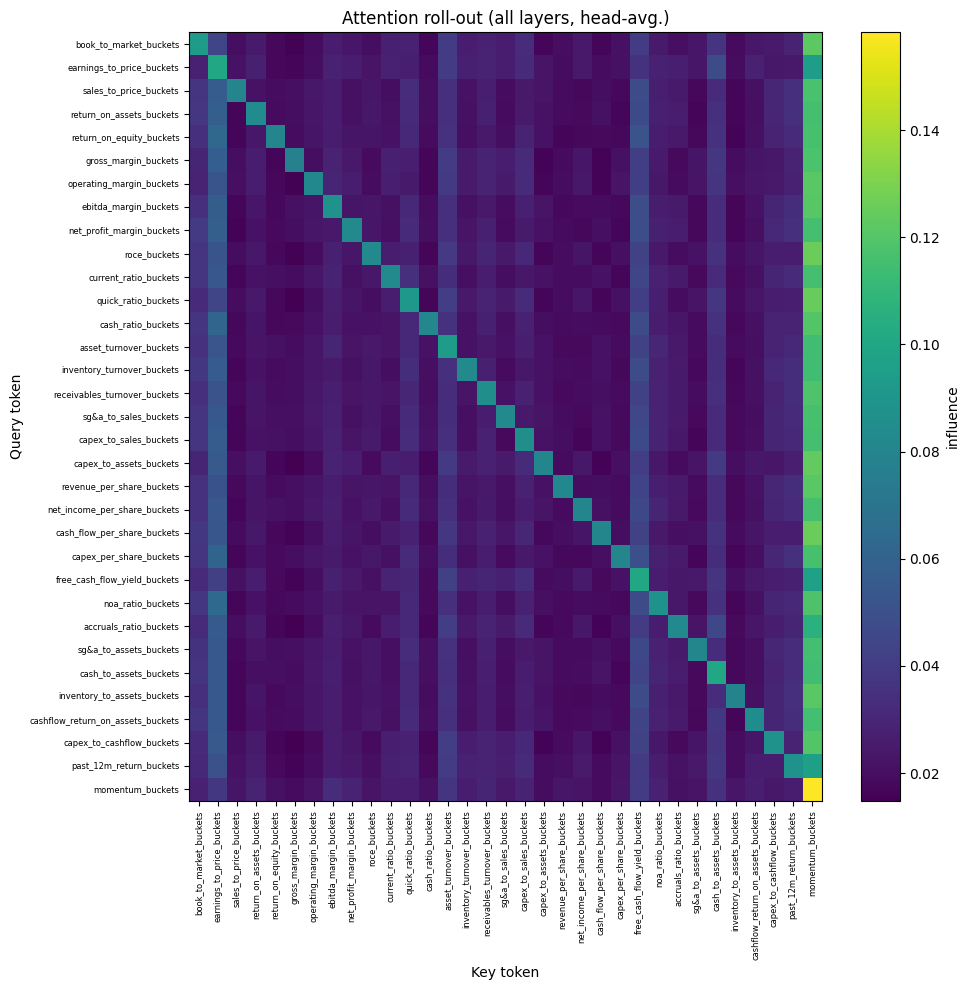

In [22]:
# ───────────────────────────────────────────────────────────────
# Attention roll‑out that auto‑aligns to matrix size
# ───────────────────────────────────────────────────────────────
import torch, matplotlib.pyplot as plt

def plot_attention_rollout(save_outputs, token_labels, sample_idx=0):
    """
    Multiply (A + I) across layers → global influence matrix.
    Works even if len(token_labels) ≠ N.
    """
    # ── find N from the first layer that has outputs ──────────
    first = next(s for s in save_outputs if s.outputs)
    N = first.outputs[0].shape[-1]

    rollout = torch.eye(N)
    for s in save_outputs:
        if not s.outputs: 
            continue
        A = s.outputs[0][sample_idx].mean(0)  # (N,N)
        A = A + torch.eye(N)
        A = A / A.sum(-1, keepdim=True)
        rollout = A @ rollout                 # left‑multiply

    # ── make labels match N ───────────────────────────────────
    if len(token_labels) < N:                       # pad
        token_labels = token_labels + [
            f"<unk_{i}>" for i in range(len(token_labels), N)
        ]
    elif len(token_labels) > N:                     # trim
        token_labels = token_labels[:N]

    # ── plot ─────────────────────────────────────────────────
    plt.figure(figsize=(10, 10))
    plt.imshow(rollout, aspect='auto')
    plt.xticks(range(N), token_labels, rotation=90, fontsize=6)
    plt.yticks(range(N), token_labels, fontsize=6)
    plt.title("Attention roll‑out (all layers, head‑avg.)")
    plt.xlabel("Key token"); plt.ylabel("Query token")
    plt.colorbar(label="influence")
    plt.tight_layout();  plt.show()

# call after a forward pass has filled `save_outputs`
plot_attention_rollout(save_outputs, token_labels, sample_idx=0)

In [65]:
from bertviz import head_view
import torch

# 1 Collect per‑layer attention as (1, H, N, N) tensors
attn_list = [
    s.outputs[0].mean(0, keepdim=True).cpu()      # keepdim → batch = 1
    for s in save_outputs if s.outputs
]                                                 # list[Tensor]; no NumPy!

# 2 Build token labels to the same length N
N = attn_list[0].shape[-1]
tokens = (bucket_cols + impute_cols +
          ["year", "stock", "industry", "ind_format", "country"])
tokens = (tokens + [f"<unk_{i}>" for i in range(len(tokens), N)])[:N]


# 3 Launch the interactive Head View
head_view(attention=attn_list, tokens=tokens)

import matplotlib.pyplot as plt

def plot_head(layer=0, head=0, sample=0, figsize=(10, 10)):
    mat = attn_list[layer][0, head].numpy()        # (N, N)
    plt.figure(figsize=figsize)
    plt.imshow(mat, aspect='auto')
    plt.title(f'Layer {layer}  Head {head}', fontsize=14)
    plt.xticks(range(len(tokens)), tokens, rotation=90, fontsize=7)
    plt.yticks(range(len(tokens)), tokens, fontsize=7)
    plt.xlabel("Key token"); plt.ylabel("Query token")
    plt.colorbar(label="weight"); plt.tight_layout(); plt.show()

#plot_head(0, 0)


<IPython.core.display.Javascript object>

## SHAP of Transformer

/tmp/ipykernel_2878778/1375049113.py:73: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_val, feature_names, plot_type="bar")


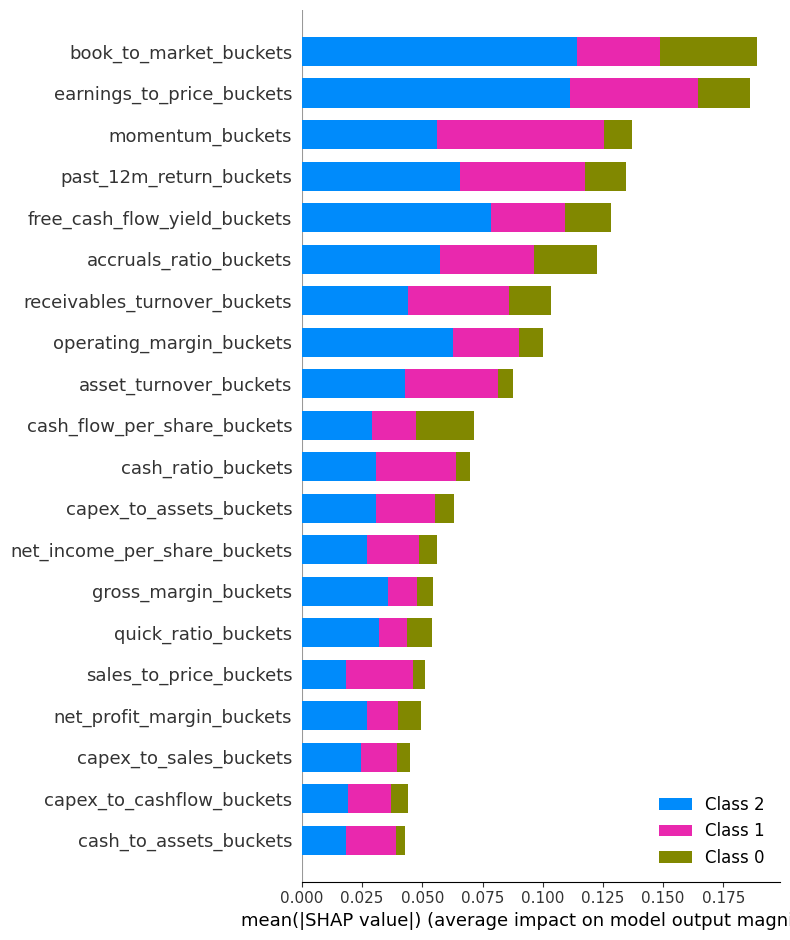

In [23]:
import shap
import numpy as np
import torch

shap.initjs()
dataset = FinancialDataset(train_data)
dataloader = DataLoader(dataset)
#dataloader = DataLoader(data_2_train)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device).eval()
feature_names = (
    dataset.feature_names                              # your bucket+impute cols
  + ['year_','fake_stock_id','industry','industry_format','country']
)

# ========== 1. Create full input matrix ==========
features_list = []
for batch in dataloader:
    feats = batch['features'].numpy()
    years = batch['year'].numpy().reshape(-1, 1)
    stocks = batch['fake_stock_id'].numpy().reshape(-1, 1)
    inds = batch['industry'].numpy().reshape(-1, 1)
    ind_fmts = batch['industry_format'].numpy().reshape(-1, 1)
    ctries = batch['country'].numpy().reshape(-1, 1)

    all_data = np.hstack([feats, years, stocks, inds, ind_fmts, ctries])
    features_list.append(all_data)

X_all = np.vstack(features_list)

# ========== 2. Define a model wrapper ==========
n_feat = dataset.n_features  # number of 'features' only (not metadata)

def model_wrapper(x_np):
    x = torch.tensor(x_np, dtype=torch.long, device=device)
    feats = x[:, :n_feat]
    years = x[:, n_feat]
    stocks = x[:, n_feat + 1]
    inds = x[:, n_feat + 2]
    ind_fmts = x[:, n_feat + 3]
    ctries = x[:, n_feat + 4]

    with torch.no_grad():
        out = model(feats, years, stocks, inds, ind_fmts, ctries)
    return out.cpu().numpy()

# ========== 3. Create SHAP masker & explainer ==========
background = shap.sample(X_all, 10, random_state=0)
masker = shap.maskers.Independent(background)

explainer = shap.Explainer(model_wrapper, masker, feature_names = feature_names)

# ========== 4. Build input from validation loader ==========
val_features_list = []
for batch in val_loader:
    feats = batch['features'].numpy()
    years = batch['year'].numpy().reshape(-1, 1)
    stocks = batch['fake_stock_id'].numpy().reshape(-1, 1)
    inds = batch['industry'].numpy().reshape(-1, 1)
    ind_fmts = batch['industry_format'].numpy().reshape(-1, 1)
    ctries = batch['country'].numpy().reshape(-1, 1)

    all_data = np.hstack([feats, years, stocks, inds, ind_fmts, ctries])
    val_features_list.append(all_data)

X_val = np.vstack(val_features_list)

# ========== 5. Run SHAP ==========
shap_val = explainer(X_val[:5])  # just use a slice to keep it fast # for class zero
#shap_val1 = explainer(X_val[:5])[1]
#shap_val2 = explainer(X_val[:5])[2]
#shap.plots.bar(shap_val, show_data=False)
shap.summary_plot(shap_val, feature_names, plot_type="bar")
